# 提取因子

In [1]:
# 提取因子数据

#参数及工具函数部分
import pandas as pd
import numpy as np
from jqfactor import *
import warnings  
warnings.filterwarnings('ignore')

#获取数据主函数
#输入股票池、指标名称、开始日期、结束日期
#返回行标签为日期，列表签为股票名称的dataframe表格
def get_factor_data(stockPool, factor,date_start, date_end):
    
    #获取股票池函数
    def get_stock(stockPool, begin_date):
        if stockPool == 'HS300':#用于获取沪深300股票池
            stockList = get_index_stocks('000300.XSHG', begin_date)
        elif stockPool == 'ZZ500':#用于获取中证500股票池
            stockList = get_index_stocks('399905.XSHE', begin_date)
        elif stockPool == 'ZZ800':#用于获取中证800股票池
            stockList = get_index_stocks('399906.XSHE', begin_date)   
        elif stockPool == 'A':#用于获取全部A股股票池
            stockList = get_index_stocks('000002.XSHG', begin_date) + get_index_stocks('399107.XSHE', begin_date)
        else:#自定义输入股票池
            stockList = stockPool
        return stockList    
    
    #从财务库获取数据
    def get_factor_account_data(factor,stock, date):
        if factor in val:
            q = query(valuation).filter(valuation.code.in_(stock))
            df = get_fundamentals(q, date)
        elif factor in bal:
            q = query(balance).filter(balance.code.in_(stock))
            df = get_fundamentals(q, date)
        elif factor in cf:
            q = query(cash_flow).filter(cash_flow.code.in_(stock))
            df = get_fundamentals(q, date)
        elif factor in inc:
            q = query(income).filter(income.code.in_(stock))
            df = get_fundamentals(q, date)
        elif factor in ind:
            q = query(indicator).filter(indicator.code.in_(stock))
            df = get_fundamentals(q, date)

        df.index = df['code']
        data = pd.DataFrame(index = df.index)
        data[date] = df[factor]

        return data
    
    def get_trade_days(start_date = date_start, end_date = date_end):
    
        pool = get_index_stocks('000016.XSHG')

        date_list = get_price(pool,start_date=date_start,end_date=date_end,fields=['close'])['close'].index
        return date_list
    
    
    #获取日期列表
    date_list = get_trade_days(start_date = date_start, end_date = date_end)
    #空df预备存储数据，data_ret是返回数据
    data_ret = pd.DataFrame(data = [], columns = ['date','asset','factor'])
    
    #获取五张财务基础所有指标名称
    val = get_fundamentals(query(valuation).limit(1)).columns.tolist()
    bal = get_fundamentals(query(balance).limit(1)).columns.tolist()
    cf = get_fundamentals(query(cash_flow).limit(1)).columns.tolist()
    inc = get_fundamentals(query(income).limit(1)).columns.tolist()
    ind = get_fundamentals(query(indicator).limit(1)).columns.tolist()
    all_columns = val+bal+cf+inc+ind
    
    
    # 判断相应的股票池
    # 如果stockpool是字母，则按照字母提取
    # 如果stockpool是数组，则直接赋值字母
    # 确定相应的股票池
    if isinstance(stockPool,list):
        all_stocks = stockPool
    else:
        all_stocks = get_stock(stockPool, date_end)

    #循环时间列表获取指标数据
    for date in date_list:
        
        data_temp = pd.DataFrame(data = [],columns = ['date','asset','factor'])

        #获取股票池
        #获取因子数据
        if factor in all_columns: #可以从财务库直接取到因子值的因子
            data_temp['factor'] = get_factor_account_data(factor,all_stocks, date).iloc[:,0]
        
        
        # 改造成alphalen需要格式
        # 确定资产名称
        data_temp['asset'] =  get_factor_account_data(factor,all_stocks, date).index
        
        # 确定日期
        data_temp['date'] =  np.array([date for i in range(0,data_temp.shape[0])])
        
        
        # 删除原先的索引
        data_temp = data_temp.reset_index()
        data_temp = data_temp.drop(['code'],axis=1)
        
        data_ret = pd.concat([data_ret, data_temp], axis = 0) 
        

        # 如果不需要则进行正常的数据合并
        #         data = pd.concat([data, data_temp], axis = 0) 

    # 确定 multi_index
    data_ret = data_ret.set_index(['date','asset'])
    return data_ret



In [2]:
# 提取因子值，整合为alphalen需要的样式


# 示例，获取沪深300成分股在2019年前两个月的市盈率数据
# 注意：每次只能提取1个因子
factor_data = get_factor_data('HS300', 'pe_ratio','2016-1-10', '2017-1-10')
factor_data = factor_data.fillna(0)


In [3]:
factor_data

factor
date       asset                 
2016-01-11 000001.XSHE     7.0469
           000002.XSHE    16.7262
           000008.XSHE   250.1691
           000009.XSHE    28.7535
           000027.XSHE    14.5306
           000039.XSHE    18.6927
           000060.XSHE   157.7461
           000061.XSHE   322.1164
           000063.XSHE    18.8548
           000069.XSHE    13.1599
           000100.XSHE    15.1416
           000156.XSHE    60.1402
           000157.XSHE   -40.7918
           000166.XSHE    14.9731
           000333.XSHE     9.6469
           000338.XSHE    20.5444
           000402.XSHE     8.1121
           000413.XSHE    24.8626
           000415.XSHE    37.5987
           000423.XSHE    18.9689
           000425.XSHE   -49.1058
           000503.XSHE  -279.1467
           000538.XSHE    24.4217
           000540.XSHE    15.1035
           000555.XSHE    90.5779
           000559.XSHE    47.3189
           000568.XSHE    33.5383
           000623.XSHE     8.8532
           000625.XSHE     7.6458
           000627.XSHE   -88.9456
...                           ...
2017-01-10 601628.XSHG    49.1441
           601633.XSHG    11.2437
           601668.XSHG     8.3816
           601669.XSHG    17.3592
           601688.XSHG    18.8152
           601718.XSHG    40.5569
           601727.XSHG    56.5797
           601766.XSHG    24.1284
           601788.XSHG    18.1543
           601800.XSHG    14.6416
           601818.XSHG     6.0656
           601857.XSHG   226.7851
           601866.XSHG   -14.6362
           601872.XSHG    20.9722
           601877.XSHG    21.3163
           601888.XSHG    25.7628
           601899.XSHG    52.7606
           601901.XSHG    22.4724
           601919.XSHG    -6.0577
           601928.XSHG    22.8957
           601933.XSHG    59.6061
           601939.XSHG     5.9350
           601958.XSHG -6286.8260
           601985.XSHG    27.1170
           601988.XSHG     5.7994
           601989.XSHG  -108.7019
           601998.XSHG     7.6648
           603000.XSHG    97.4895
           603885.XSHG    22.9293
           603993.XSHG    91.9056

[73219 rows x 1 columns]

In [4]:
factor_data.loc[('2016-01-11'),'factor']

date        asset      
2016-01-11  000001.XSHE       7.0469
            000002.XSHE      16.7262
            000008.XSHE     250.1691
            000009.XSHE      28.7535
            000027.XSHE      14.5306
            000039.XSHE      18.6927
            000060.XSHE     157.7461
            000061.XSHE     322.1164
            000063.XSHE      18.8548
            000069.XSHE      13.1599
            000100.XSHE      15.1416
            000156.XSHE      60.1402
            000157.XSHE     -40.7918
            000166.XSHE      14.9731
            000333.XSHE       9.6469
            000338.XSHE      20.5444
            000402.XSHE       8.1121
            000413.XSHE      24.8626
            000415.XSHE      37.5987
            000423.XSHE      18.9689
            000425.XSHE     -49.1058
            000503.XSHE    -279.1467
            000538.XSHE      24.4217
            000540.XSHE      15.1035
            000555.XSHE      90.5779
            000559.XSHE      47.3189
            00

In [5]:
set([index[0] for index, row in factor_data.iterrows()])

{Timestamp('2016-01-11 00:00:00'),
 Timestamp('2016-01-12 00:00:00'),
 Timestamp('2016-01-13 00:00:00'),
 Timestamp('2016-01-14 00:00:00'),
 Timestamp('2016-01-15 00:00:00'),
 Timestamp('2016-01-18 00:00:00'),
 Timestamp('2016-01-19 00:00:00'),
 Timestamp('2016-01-20 00:00:00'),
 Timestamp('2016-01-21 00:00:00'),
 Timestamp('2016-01-22 00:00:00'),
 Timestamp('2016-01-25 00:00:00'),
 Timestamp('2016-01-26 00:00:00'),
 Timestamp('2016-01-27 00:00:00'),
 Timestamp('2016-01-28 00:00:00'),
 Timestamp('2016-01-29 00:00:00'),
 Timestamp('2016-02-01 00:00:00'),
 Timestamp('2016-02-02 00:00:00'),
 Timestamp('2016-02-03 00:00:00'),
 Timestamp('2016-02-04 00:00:00'),
 Timestamp('2016-02-05 00:00:00'),
 Timestamp('2016-02-15 00:00:00'),
 Timestamp('2016-02-16 00:00:00'),
 Timestamp('2016-02-17 00:00:00'),
 Timestamp('2016-02-18 00:00:00'),
 Timestamp('2016-02-19 00:00:00'),
 Timestamp('2016-02-22 00:00:00'),
 Timestamp('2016-02-23 00:00:00'),
 Timestamp('2016-02-24 00:00:00'),
 Timestamp('2016-02-

# 关键函数：去极值、中性化、标准化

In [6]:
from sklearn.linear_model import LinearRegression

def mad(factor):
    # 3倍中位数去极值
    # 确定输入变量
    factor = np.array(factor)
        
    # 求出因子值的中位数
    med = np.median(factor)

    # 求出因子值与中位数的差值，进行绝对值
    mad = np.median(abs(factor - med))

    # 定义几倍的中位数上下限
    high = med + (3 * 1.4826 * mad)
    low = med - (3 * 1.4826 * mad)

    # 替换上下限以外的值
    factor = np.where(factor > high, high, factor)
    factor = np.where(factor < low, low, factor)
    
    # 因为np处理后会将数据由[x]变为[[x]]的数据，所以进行处理
    ret = factor
    return ret


def stand(factor):
    factor = np.array(factor)
    mean = factor.mean()
    std = factor.std()
    return (factor - mean)/std
    
# factor1：主参数，一般为需要被中性化的参数
# factor2：被动参数，一般作为参考想象，一般是市值作为中性化的参考参数
def neutral(factor1,factor2):
    # 统一类型
    factor1 = np.array(factor1)
    factor2 = np.array(factor2)
    
    # 去除0值
    factor1[np.isnan(factor1)] = 0
    factor2[np.isnan(factor2)] = 0

    
    # 根据LinearRegression的要求需要将参数做reshape的处理
    # python 3 在这里有一错误，所以要增加values的设置
    # x = factor2.values.reshape(-1,1)
    # y = factor1.values.reshape(-1,1)
    
    # 注意：以下代码为np的reshape（pandas的reshape与np的reshape略有不同）
    x = np.reshape(factor2,(-1,1))
    y = np.reshape(factor1,(-1,1))
    try:
        # 建立回归方程并预测
        lr = LinearRegression()
        lr.fit(x, y)
        y_predict = lr.predict(x)
    except:
        print("出错，未进行中性化")
        # 如果出错，则预测值统一列为0，保持原值
        y_predict = 0
        
    # 去除线性的关系，留下误差作为该因子的值
    res = y - y_predict   
    
    # 因为np处理后会将数据由[x]变为[[x]]的数据，所以进行处理
    return [d[0] for d in res]

# 对原始数据中性化

- 逐日期进行
- 每个日期按照去极值、市值中性化、标准化的流程进行

In [7]:
from datetime import datetime

from sklearn.linear_model import LinearRegression

# 遍历每一个日期
for date_i in set([index[0] for index, row in factor_data.iterrows()]):
# for date_i in [datetime.strptime('2016-01-11', '%Y-%m-%d')]:

    print(date_i)
    # 临时赋值使用的factor_temp_pd
    factor_temp_np = pd.DataFrame()
    factor_refer = pd.DataFrame()

    
    # 提取每一个日期的股票编码列表
    sec_list = []
    sec_list = list(factor_data.loc[(date_i)].index)

    factor_temp_np = np.array(factor_data.loc[(date_i),'factor'])

    # 去极值
    factor_temp_np = mad(factor_temp_np)
    
    # 中性化 
    # 提取参考的市值因子
    factor_refer = get_factor_data(sec_list,'market_cap',date_i,date_i)
    factor_refer = factor_refer.loc[(date_i),'factor']

    factor_temp_np = neutral(factor_temp_np,factor_refer)

    # 标准化
    factor_temp_np = stand(factor_temp_np)
    
    # 赋值
    factor_data.loc[(date_i),'factor'] = np.array(factor_temp_np)

2016-04-21 00:00:00
2016-01-14 00:00:00
2016-03-01 00:00:00
2016-03-03 00:00:00
2016-08-18 00:00:00
2016-01-11 00:00:00
2016-04-20 00:00:00
2016-12-13 00:00:00
2016-02-24 00:00:00
2016-11-30 00:00:00
2016-11-16 00:00:00
2016-12-23 00:00:00
2016-03-16 00:00:00
2016-04-06 00:00:00
2016-09-05 00:00:00
2016-10-14 00:00:00
2016-06-01 00:00:00
2016-09-19 00:00:00
2016-11-08 00:00:00
2016-10-28 00:00:00
2016-11-09 00:00:00
2016-02-16 00:00:00
2016-10-10 00:00:00
2016-10-17 00:00:00
2016-11-24 00:00:00
2016-12-01 00:00:00
2016-07-26 00:00:00
2016-08-22 00:00:00
2016-07-05 00:00:00
2016-06-14 00:00:00
2016-04-19 00:00:00
2016-11-02 00:00:00
2016-11-22 00:00:00
2016-12-05 00:00:00
2016-04-25 00:00:00
2016-03-24 00:00:00
2016-09-14 00:00:00
2016-05-09 00:00:00
2016-08-15 00:00:00
2016-03-21 00:00:00
2016-04-01 00:00:00
2016-06-23 00:00:00
2016-12-19 00:00:00
2016-08-10 00:00:00
2016-06-02 00:00:00
2016-11-07 00:00:00
2016-03-04 00:00:00
2016-11-01 00:00:00
2017-01-06 00:00:00
2016-10-24 00:00:00


# 提取价格数据

In [8]:
# 提取价格数据

all_stocks = list(set([index[1] for index, row in factor_data.iterrows()]))
 
price_data = get_price(all_stocks,start_date='2016-1-10',end_date='2018-8-10',fields=['close'])['close']
price_data

,600685.XSHG,000503.XSHE,000793.XSHE,600038.XSHG,601555.XSHG,601899.XSHG,600332.XSHG,601985.XSHG,002450.XSHE,000061.XSHE,600085.XSHG,600150.XSHG,600089.XSHG,600704.XSHG,600637.XSHG,600741.XSHG,300017.XSHE,000559.XSHE,601928.XSHG,600362.XSHG,002085.XSHE,600373.XSHG,000166.XSHE,600606.XSHG,000540.XSHE,600489.XSHG,601718.XSHG,600018.XSHG,002153.XSHE,600783.XSHG,601211.XSHG,601939.XSHG,002008.XSHE,601169.XSHG,300124.XSHE,600690.XSHG,601668.XSHG,600118.XSHG,601166.XSHG,002027.XSHE,...,600352.XSHG,600703.XSHG,603000.XSHG,002385.XSHE,600115.XSHG,600196.XSHG,601958.XSHG,002174.XSHE,000712.XSHE,601118.XSHG,601919.XSHG,601601.XSHG,000069.XSHE,300033.XSHE,000876.XSHE,000800.XSHE,600547.XSHG,002236.XSHE,600804.XSHG,601866.XSHG,000895.XSHE,000792.XSHE,601088.XSHG,002673.XSHE,002475.XSHE,600208.XSHG,300251.XSHE,600871.XSHG,601258.XSHG,601628.XSHG,600008.XSHG,000728.XSHE,600958.XSHG,600271.XSHG,600839.XSHG,002465.XSHE,002252.XSHE,600663.XSHG,600372.XSHG,000858.XSHE
2016-01-11,32.50,23.13,10.05,40.08,11.22,3.11,23.26,7.54,16.47,13.18,30.02,28.63,8.65,5.79,20.65,11.99,15.94,12.16,11.34,12.91,9.64,18.09,6.04,11.03,4.73,9.67,7.87,5.02,32.42,25.79,17.84,4.39,18.86,6.06,17.55,9.18,3.60,32.29,13.52,8.17,...,8.84,11.08,16.46,6.56,7.35,18.94,6.92,29.59,21.55,6.17,6.84,22.81,6.39,61.85,8.45,12.33,15.56,13.26,17.58,5.13,14.46,12.18,11.12,21.61,7.05,3.76,10.91,6.89,3.37,22.44,3.83,10.18,17.15,26.33,4.17,15.99,20.33,20.14,19.02,22.25
2016-01-12,31.75,23.50,9.96,38.77,11.32,3.02,23.87,7.70,16.35,13.69,31.82,28.99,8.77,5.90,20.47,11.89,17.54,12.18,11.68,12.96,9.68,18.42,6.16,11.45,4.75,8.77,8.04,5.04,31.37,26.63,18.06,4.37,19.87,5.97,17.78,9.18,3.64,32.16,13.51,8.98,...,8.87,11.20,16.61,6.44,7.33,19.01,7.61,29.59,21.47,6.21,6.82,23.27,6.48,63.07,8.45,12.57,14.00,13.39,17.90,5.09,14.16,12.52,10.95,22.34,7.15,3.75,11.10,6.73,3.39,22.62,3.87,10.42,17.58,26.33,4.14,15.99,21.59,20.78,18.65,22.26
2016-01-13,28.57,24.50,9.72,37.74,11.40,2.98,23.05,7.46,14.81,13.49,30.46,27.70,8.42,5.76,19.88,11.65,17.40,11.93,11.37,12.77,9.03,17.85,6.08,10.98,4.52,8.37,7.60,4.89,28.54,24.70,17.91,4.31,20.05,5.96,17.15,9.18,3.55,29.92,13.43,8.18,...,8.60,10.95,15.54,6.26,7.09,18.69,7.27,29.59,20.68,6.05,6.43,23.09,6.30,57.13,8.45,12.14,13.11,13.27,17.58,4.89,13.91,12.07,10.87,23.07,7.10,3.64,10.40,6.23,3.31,22.15,3.72,10.45,17.41,26.33,4.02,15.99,21.19,18.73,17.72,22.29
2016-01-14,29.75,26.95,10.26,40.73,11.89,3.01,23.32,7.59,14.81,14.32,31.95,28.59,8.56,6.00,20.29,12.22,18.62,12.46,11.70,13.05,9.30,18.89,6.25,11.69,4.60,8.46,7.84,4.92,29.72,25.87,18.35,4.32,21.44,5.99,17.99,9.18,3.59,32.85,13.41,8.68,...,8.76,11.40,16.24,6.41,7.04,19.11,7.60,29.59,21.06,6.17,6.53,23.38,6.45,62.61,8.45,12.57,13.23,13.48,18.37,4.94,14.11,13.13,11.00,24.05,7.24,3.67,10.91,6.39,3.35,22.50,3.80,10.92,17.94,26.33,4.13,15.99,21.73,17.72,18.94,22.46
2016-01-15,28.50,25.57,9.64,40.78,11.50,2.87,22.31,7.35,14.81,13.65,30.87,27.10,8.22,5.69,19.34,11.84,17.92,11.83,11.09,12.39,9.80,18.01,6.09,11.24,4.39,8.06,7.55,4.63,27.69,24.77,17.58,4.22,20.78,5.97,16.98,9.18,3.41,32.54,13.20,8.67,...,8.76,11.45,15.61,6.13,6.56,18.76,7.06,29.59,19.23,5.84,5.95,22.97,6.12,58.82,8.45,11.73,12.59,12.74,17.86,4.49,13.71,12.57,10.58,23.17,7.03,3.41,10.47,6.08,3.12,22.07,3.59,10.82,17.18,26.33,3.84,15.99,21.48,17.53,18.81,21.82
2016-01-18,28.65,26.80,9.82,42.51,11.50,2.86,22.28,7.33,14.81,13.82,30.95,27.13,8.28,5.76,19.67,11.84,18.25,12.06,11.24,12.48,10.75,18.34,6.16,11.28,4.39,8.10,7.95,4.64,28.62,25.99,17.59,4.18,21.25,5.94,17.84,9.18,3.38,33.09,13.09,9.38,...,8.44,11.68,15.97,6.14,6.69,18.17,7.07,29.59,19.23,5.84,6.55,22.54,6.11,61.07,8.45,11.93,12.66,12.81,18.44,4.94,13.65,12.81,10.37,23.10,7.04,3.41,10.81,6.11,3.08,22.05,3.61,10.94,17.12,26.33,3.93,15.99,21.58,17.39,19.10,22.13
2016-01-19,29.63,27.25,10.22,43.87,11.87,2.93,23.12,7.63,14.81,14.21,31.96,27.99,8.60,6.00,20.39,12.49,18.52,12.69,11.62,12.91,10.87,18.70,6.36,11.70,4.56,8.27,8.34,4.82,30.07,26.97,18.08,4.27,21.63,6.05,18.39,9.18,3.64,34.48,13.26,9.52,...,8.63,12

# 开始使用alphalen

In [9]:
from alphalens.utils import get_clean_factor_and_forward_returns

merged_data = get_clean_factor_and_forward_returns(
  factor=factor_data, 
  prices=price_data
)

# Show the first 5 rows of merged_data


merged_data

Dropped 0.0% entries from factor data (0.0% after in forward returns computation and 0.0% in binning phase). Set max_loss=0 to see potentially suppressed Exceptions.


1       ...         factor_quantile
date       asset                       ...                        
2016-01-11 600685.XSHG -0.023077       ...                       1
           000503.XSHE  0.015997       ...                       1
           000793.XSHE -0.008955       ...                       3
           600038.XSHG -0.032685       ...                       4
           601555.XSHG  0.008913       ...                       1
           601899.XSHG -0.028939       ...                       4
           600332.XSHG  0.026225       ...                       3
           601985.XSHG  0.021220       ...                       3
           002450.XSHE -0.007286       ...                       4
           000061.XSHE  0.038695       ...                       5
           600085.XSHG  0.059960       ...                       4
           600150.XSHG  0.012574       ...                       5
           600089.XSHG  0.013873       ...                       2
           600704.XSHG  0.018998       ...                       3
           600637.XSHG -0.008717       ...                       4
           600741.XSHG -0.008340       ...                       1
           300017.XSHE  0.100376       ...                       4
           000559.XSHE  0.001645       ...                       4
           601928.XSHG  0.029982       ...                       3
           600362.XSHG  0.003873       ...                       3
           002085.XSHE  0.004149       ...                       4
           600373.XSHG  0.018242       ...                       3
           000166.XSHE  0.019868       ...                       2
           600606.XSHG  0.038078       ...                       5
           000540.XSHE  0.004228       ...                       2
           600489.XSHG -0.093071       ...                       1
           601718.XSHG  0.021601       ...                       2
           600018.XSHG  0.003984       ...                       3
           002153.XSHE -0.032387       ...                       5
           600783.XSHG  0.032571       ...                       5
...                          ...       ...                     ...
2017-01-10 601919.XSHG -0.001821       ...                       1
           601601.XSHG  0.001148       ...                       3
           000069.XSHE  0.000000       ...                       1
           300033.XSHE -0.016129       ...                       4
           000876.XSHE -0.008000       ...                       1
           000800.XSHE -0.014047       ...                       1
           600547.XSHG -0.008311       ...                       5
           002236.XSHE -0.006912       ...                       3
           600804.XSHG -0.029197       ...                       4
           601866.XSHG -0.004843       ...                       1
           000895.XSHE -0.005062       ...                       2
           000792.XSHE -0.000762       ...                       5
           601088.XSHG -0.006844       ...                       3
           002673.XSHE -0.010857       ...                       4
           002475.XSHE  0.001280       ...                       4
           600208.XSHG -0.007335       ...                       3
           300251.XSHE -0.008081       ...                       4
           600871.XSHG  0.007126       ...                       1
           601258.XSHG  0.000000       ...                       5
           601628.XSHG  0.019397       ...                       5
           600008.XSHG -0.012594       ...                       4
           000728.XSHE -0.007137       ...                       3
           600958.XSHG -0.006831       ...                       4
           600271.XSHG -0.011540       ...                       3
           600839.XSHG -0.011962       ...                       1
           002465.XSHE  0.001669       ...                       4
           002252.XSHE -0.004854       ...                       5
           

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-2.587839,-0.618897,-1.148312,0.651154,14700,20.076756
2,-0.728492,-0.359237,-0.561494,0.082412,14602,19.942911
3,-0.488839,0.054526,-0.233095,0.118920,14615,19.960666
4,-0.086450,1.022210,0.352371,0.248225,14602,19.942911
5,0.724877,2.919595,1.587787,0.380389,14700,20.076756


Returns Analysis


,1,5,10
Ann. alpha,-0.075,-0.087,-0.098
beta,0.075,0.101,0.129
Mean Period Wise Return Top Quantile (bps),-3.773,-4.732,-5.351
Mean Period Wise Return Bottom Quantile (bps),4.479,4.309,4.385
Mean Period Wise Spread (bps),-8.251,-9.066,-9.754


Information Analysis


,1,5,10
IC Mean,-0.027,-0.056,-0.086
IC Std.,0.148,0.156,0.162
Risk-Adjusted IC,-0.185,-0.357,-0.533
t-stat(IC),-2.897,-5.582,-8.347
p-value(IC),0.004,0.000,0.000
IC Skew,0.031,-0.042,-0.075
IC Kurtosis,-0.366,-0.240,-0.447


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.018,0.046,0.069
Quantile 2 Mean Turnover,0.032,0.077,0.112
Quantile 3 Mean Turnover,0.033,0.078,0.112
Quantile 4 Mean Turnover,0.033,0.080,0.113
Quantile 5 Mean Turnover,0.016,0.044,0.066


,1,5,10
Mean Factor Rank Autocorrelation,0.997,0.987,0.973


<Figure size 432x288 with 0 Axes>

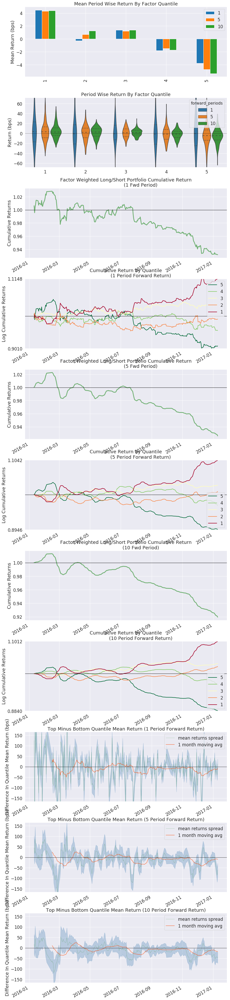

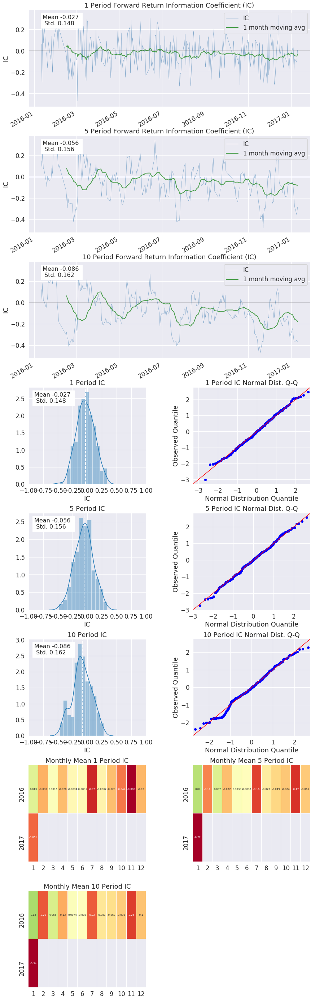

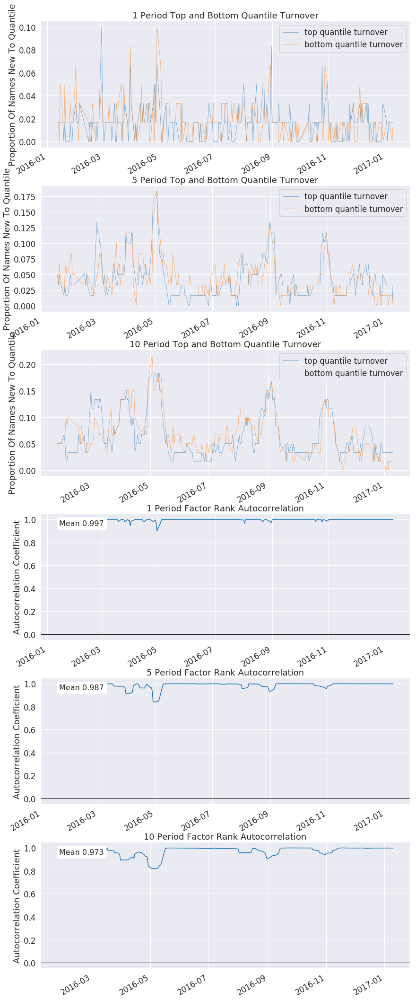

In [10]:
# 创建tear_sheet

from alphalens.tears import create_full_tear_sheet

create_full_tear_sheet(merged_data)

Information Analysis


,1,5,10
IC Mean,-0.027,-0.056,-0.086
IC Std.,0.148,0.156,0.162
Risk-Adjusted IC,-0.185,-0.357,-0.533
t-stat(IC),-2.897,-5.582,-8.347
p-value(IC),0.004,0.000,0.000
IC Skew,0.031,-0.042,-0.075
IC Kurtosis,-0.366,-0.240,-0.447


<Figure size 432x288 with 0 Axes>

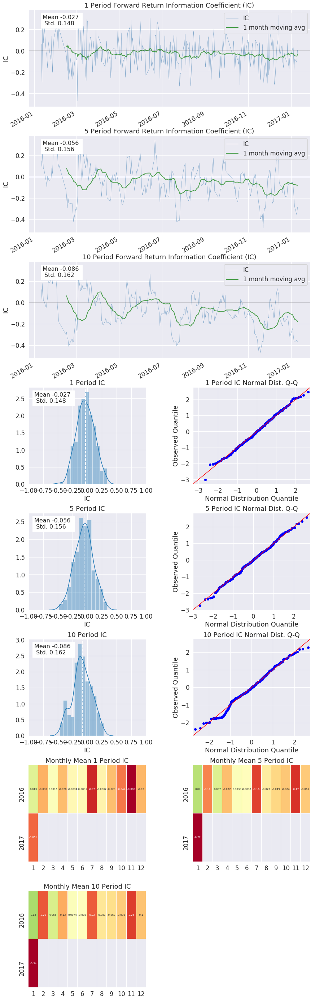

In [12]:
# IC分析
from alphalens.tears import create_information_tear_sheet
from alphalens.utils import get_clean_factor_and_forward_returns

create_information_tear_sheet(merged_data)

In [ ]:
factor_data.index[np.where(np.isnan(factor_data))[0]] 

In [37]:
np.where(np.isnan(factor_data))

(array([], dtype=int64), array([], dtype=int64))

In [38]:
factor_data

factor
date       asset                
2016-01-11 000001.XSHE -0.731075
           000002.XSHE -0.328475
           000008.XSHE  1.785006
           000009.XSHE -0.208837
           000027.XSHE -0.626295
           000039.XSHE -0.484043
           000060.XSHE  1.785016
           000061.XSHE  1.785003
           000063.XSHE -0.463717
           000069.XSHE -0.639990
           000100.XSHE -0.592867
           000156.XSHE  0.744293
           000157.XSHE -2.248625
           000166.XSHE -0.518237
           000333.XSHE -0.684806
           000338.XSHE -0.442948
           000402.XSHE -0.821714
           000413.XSHE -0.320008
           000415.XSHE  0.079460
           000423.XSHE -0.493578
           000425.XSHE -2.248687
           000503.XSHE -2.248710
           000538.XSHE -0.294992
           000540.XSHE -0.605925
           000555.XSHE  1.654589
           000559.XSHE  0.363035
           000568.XSHE -0.054402
           000623.XSHE -0.804319
           000625.XSHE -0.796613
           000627.XSHE -2.248761
...                          ...
2017-01-10 601628.XSHG  0.993283
           601633.XSHG -0.709405
           601668.XSHG -0.708997
           601669.XSHG -0.497080
           601688.XSHG -0.426658
           601718.XSHG  0.279368
           601727.XSHG  0.890000
           601766.XSHG -0.150876
           601788.XSHG -0.484228
           601800.XSHG -0.500615
           601818.XSHG -0.841814
           601857.XSHG  2.837927
           601866.XSHG -1.651089
           601872.XSHG -0.413485
           601877.XSHG -0.395147
           601888.XSHG -0.235837
           601899.XSHG  0.731398
           601901.XSHG -0.338830
           601919.XSHG -1.345231
           601928.XSHG -0.345922
           601933.XSHG  0.957048
           601939.XSHG -0.119382
           601958.XSHG -2.387943
           601985.XSHG -0.146133
           601988.XSHG -0.343660
           601989.XSHG -2.318174
           601998.XSHG -0.696469
           603000.XSHG  1.906821
           603885.XSHG -0.342572
           603993.XSHG  1.934433

[73219 rows x 1 columns]

# 多重索引的几个基本操作

In [4]:
# 多重索引的选取方法
factor_data.loc[('2017-01-10','000001.XSHE'),'factor']

date        asset      
2017-01-10  000001.XSHE    6.8775
Name: factor, dtype: float64

In [5]:
# 多重索引一样可以用iterrows遍历

for index, row in factor_data.iterrows():
    print(row["factor"])
    print(index[0])
    print(index[1])

7.0469
2016-01-11 00:00:00
000001.XSHE
16.7262
2016-01-11 00:00:00
000002.XSHE
250.1691
2016-01-11 00:00:00
000008.XSHE
28.7535
2016-01-11 00:00:00
000009.XSHE
14.5306
2016-01-11 00:00:00
000027.XSHE
18.6927
2016-01-11 00:00:00
000039.XSHE
157.7461
2016-01-11 00:00:00
000060.XSHE
322.1164
2016-01-11 00:00:00
000061.XSHE
18.8548
2016-01-11 00:00:00
000063.XSHE
13.1599
2016-01-11 00:00:00
000069.XSHE
15.1416
2016-01-11 00:00:00
000100.XSHE
60.1402
2016-01-11 00:00:00
000156.XSHE
-40.7918
2016-01-11 00:00:00
000157.XSHE
14.9731
2016-01-11 00:00:00
000166.XSHE
9.6469
2016-01-11 00:00:00
000333.XSHE
20.5444
2016-01-11 00:00:00
000338.XSHE
8.1121
2016-01-11 00:00:00
000402.XSHE
24.8626
2016-01-11 00:00:00
000413.XSHE
37.5987
2016-01-11 00:00:00
000415.XSHE
18.9689
2016-01-11 00:00:00
000423.XSHE
-49.1058
2016-01-11 00:00:00
000425.XSHE
-279.1467
2016-01-11 00:00:00
000503.XSHE
24.4217
2016-01-11 00:00:00
000538.XSHE
15.1035
2016-01-11 00:00:00
000540.XSHE
90.5779
2016-01-11 00:00:00
000555.X

600839.XSHG
59.3509
2016-01-11 00:00:00
600867.XSHG
-199.5767
2016-01-11 00:00:00
600871.XSHG
46.3796
2016-01-11 00:00:00
600873.XSHG
60.8201
2016-01-11 00:00:00
600875.XSHG
8.7371
2016-01-11 00:00:00
600886.XSHG
20.7065
2016-01-11 00:00:00
600887.XSHG
68.4185
2016-01-11 00:00:00
600893.XSHG
50.1722
2016-01-11 00:00:00
600895.XSHG
17.4538
2016-01-11 00:00:00
600900.XSHG
14.1079
2016-01-11 00:00:00
600958.XSHG
59.525
2016-01-11 00:00:00
600959.XSHG
9.6071
2016-01-11 00:00:00
600999.XSHG
7.9936
2016-01-11 00:00:00
601006.XSHG
7.8271
2016-01-11 00:00:00
601009.XSHG
39.0972
2016-01-11 00:00:00
601018.XSHG
31.6795
2016-01-11 00:00:00
601021.XSHG
12.0612
2016-01-11 00:00:00
601088.XSHG
27.287
2016-01-11 00:00:00
601099.XSHG
14.561
2016-01-11 00:00:00
601111.XSHG
-51.7719
2016-01-11 00:00:00
601118.XSHG
25.4587
2016-01-11 00:00:00
601155.XSHG
6.0139
2016-01-11 00:00:00
601166.XSHG
7.4703
2016-01-11 00:00:00
601169.XSHG
13.3673
2016-01-11 00:00:00
601186.XSHG
30.6374
2016-01-11 00:00:00
601198

2016-01-13 00:00:00
000156.XSHE
-40.2114
2016-01-13 00:00:00
000157.XSHE
10.2918
2016-01-13 00:00:00
000166.XSHE
9.8473
2016-01-13 00:00:00
000333.XSHE
20.4211
2016-01-13 00:00:00
000338.XSHE
8.4056
2016-01-13 00:00:00
000402.XSHE
24.7187
2016-01-13 00:00:00
000413.XSHE
35.9276
2016-01-13 00:00:00
000415.XSHE
18.9648
2016-01-13 00:00:00
000423.XSHE
-48.0115
2016-01-13 00:00:00
000425.XSHE
-295.6807
2016-01-13 00:00:00
000503.XSHE
23.6359
2016-01-13 00:00:00
000538.XSHE
14.4528
2016-01-13 00:00:00
000540.XSHE
80.6735
2016-01-13 00:00:00
000555.XSHE
46.4211
2016-01-13 00:00:00
000559.XSHE
32.8781
2016-01-13 00:00:00
000568.XSHE
8.8603
2016-01-13 00:00:00
000623.XSHE
7.551
2016-01-13 00:00:00
000625.XSHE
-82.6738
2016-01-13 00:00:00
000627.XSHE
132.5647
2016-01-13 00:00:00
000630.XSHE
8.1303
2016-01-13 00:00:00
000651.XSHE
19.0898
2016-01-13 00:00:00
000671.XSHE
9.9398
2016-01-13 00:00:00
000686.XSHE
53.8267
2016-01-13 00:00:00
000709.XSHE
22.8711
2016-01-13 00:00:00
000712.XSHE
26.9164
2

300144.XSHE
38.2153
2016-01-14 00:00:00
300146.XSHE
120.461
2016-01-14 00:00:00
300168.XSHE
60.1975
2016-01-14 00:00:00
300182.XSHE
104.8832
2016-01-14 00:00:00
300251.XSHE
71.7741
2016-01-14 00:00:00
300315.XSHE
6.6064
2016-01-14 00:00:00
600000.XSHG
-48.091
2016-01-14 00:00:00
600005.XSHG
30.9783
2016-01-14 00:00:00
600008.XSHG
21.2068
2016-01-14 00:00:00
600009.XSHG
-55.6706
2016-01-14 00:00:00
600010.XSHG
5.795
2016-01-14 00:00:00
600015.XSHG
6.7128
2016-01-14 00:00:00
600016.XSHG
19.3946
2016-01-14 00:00:00
600018.XSHG
32.7571
2016-01-14 00:00:00
600019.XSHG
15.1465
2016-01-14 00:00:00
600021.XSHG
11.7033
2016-01-14 00:00:00
600023.XSHG
25.4091
2016-01-14 00:00:00
600028.XSHG
14.6704
2016-01-14 00:00:00
600029.XSHG
9.4179
2016-01-14 00:00:00
600030.XSHG
-52.3897
2016-01-14 00:00:00
600031.XSHG
6.8378
2016-01-14 00:00:00
600036.XSHG
30.7061
2016-01-14 00:00:00
600037.XSHG
64.8707
2016-01-14 00:00:00
600038.XSHG
7.8088
2016-01-14 00:00:00
600048.XSHG
33.4754
2016-01-14 00:00:00
6000

000671.XSHE
10.0664
2016-01-15 00:00:00
000686.XSHE
51.4143
2016-01-15 00:00:00
000709.XSHE
21.2606
2016-01-15 00:00:00
000712.XSHE
26.9164
2016-01-15 00:00:00
000718.XSHE
33.8537
2016-01-15 00:00:00
000725.XSHE
12.3448
2016-01-15 00:00:00
000728.XSHE
163.3393
2016-01-15 00:00:00
000738.XSHE
16.5362
2016-01-15 00:00:00
000750.XSHE
283.2873
2016-01-15 00:00:00
000768.XSHE
9.7359
2016-01-15 00:00:00
000776.XSHE
37.1768
2016-01-15 00:00:00
000778.XSHE
13.9964
2016-01-15 00:00:00
000783.XSHE
29.4557
2016-01-15 00:00:00
000792.XSHE
29.0405
2016-01-15 00:00:00
000793.XSHE
-306.3164
2016-01-15 00:00:00
000800.XSHE
28.0848
2016-01-15 00:00:00
000826.XSHE
65.7694
2016-01-15 00:00:00
000839.XSHE
15.6326
2016-01-15 00:00:00
000858.XSHE
17.8121
2016-01-15 00:00:00
000876.XSHE
14.6516
2016-01-15 00:00:00
000895.XSHE
69.5761
2016-01-15 00:00:00
000917.XSHE
83.787
2016-01-15 00:00:00
000938.XSHE
27.2431
2016-01-15 00:00:00
000963.XSHE
50.0912
2016-01-15 00:00:00
000977.XSHE
88.1253
2016-01-15 00:00:0

2016-01-15 00:00:00
601155.XSHG
5.8495
2016-01-15 00:00:00
601166.XSHG
7.3522
2016-01-15 00:00:00
601169.XSHG
12.2349
2016-01-15 00:00:00
601186.XSHG
32.277
2016-01-15 00:00:00
601198.XSHG
9.9583
2016-01-15 00:00:00
601211.XSHG
41.0729
2016-01-15 00:00:00
601216.XSHG
-23.9114
2016-01-15 00:00:00
601225.XSHG
192.1162
2016-01-15 00:00:00
601258.XSHG
5.5324
2016-01-15 00:00:00
601288.XSHG
10.2088
2016-01-15 00:00:00
601318.XSHG
6.2214
2016-01-15 00:00:00
601328.XSHG
31.4979
2016-01-15 00:00:00
601333.XSHG
14.0478
2016-01-15 00:00:00
601336.XSHG
12.9588
2016-01-15 00:00:00
601377.XSHG
17.1208
2016-01-15 00:00:00
601390.XSHG
5.4405
2016-01-15 00:00:00
601398.XSHG
13.1121
2016-01-15 00:00:00
601555.XSHG
-5.5875
2016-01-15 00:00:00
601600.XSHG
13.5414
2016-01-15 00:00:00
601601.XSHG
15.2826
2016-01-15 00:00:00
601607.XSHG
102.4332
2016-01-15 00:00:00
601608.XSHG
17.1089
2016-01-15 00:00:00
601618.XSHG
17.0712
2016-01-15 00:00:00
601628.XSHG
10.0608
2016-01-15 00:00:00
601633.XSHG
6.5313
2016-

002470.XSHE
40.7598
2016-01-19 00:00:00
002475.XSHE
25.3672
2016-01-19 00:00:00
002500.XSHE
59.3959
2016-01-19 00:00:00
002568.XSHE
72.6639
2016-01-19 00:00:00
002594.XSHE
41.4301
2016-01-19 00:00:00
002673.XSHE
65.5197
2016-01-19 00:00:00
002714.XSHE
10.4094
2016-01-19 00:00:00
002736.XSHE
111.7606
2016-01-19 00:00:00
002739.XSHE
45.9701
2016-01-19 00:00:00
300002.XSHE
72.8908
2016-01-19 00:00:00
300015.XSHE
54.185
2016-01-19 00:00:00
300017.XSHE
109.0284
2016-01-19 00:00:00
300024.XSHE
38.108000000000004
2016-01-19 00:00:00
300027.XSHE
71.2526
2016-01-19 00:00:00
300033.XSHE
53.3518
2016-01-19 00:00:00
300058.XSHE
52.2523
2016-01-19 00:00:00
300059.XSHE
51.8353
2016-01-19 00:00:00
300070.XSHE
32.7088
2016-01-19 00:00:00
300072.XSHE
377.7186
2016-01-19 00:00:00
300085.XSHE
208.6981
2016-01-19 00:00:00
300104.XSHE
38.8162
2016-01-19 00:00:00
300124.XSHE
88.4827
2016-01-19 00:00:00
300133.XSHE
65.2933
2016-01-19 00:00:00
300144.XSHE
39.3516
2016-01-19 00:00:00
300146.XSHE
135.2893
2016-

2016-01-20 00:00:00
600415.XSHG
184.4258
2016-01-20 00:00:00
600446.XSHG
118.8392
2016-01-20 00:00:00
600482.XSHG
22.8457
2016-01-20 00:00:00
600485.XSHG
-116.7875
2016-01-20 00:00:00
600489.XSHG
39.9384
2016-01-20 00:00:00
600498.XSHG
20.2315
2016-01-20 00:00:00
600518.XSHG
15.8045
2016-01-20 00:00:00
600519.XSHG
26.7966
2016-01-20 00:00:00
600535.XSHG
52.0167
2016-01-20 00:00:00
600547.XSHG
69.5547
2016-01-20 00:00:00
600570.XSHG
17.8972
2016-01-20 00:00:00
600582.XSHG
8.685
2016-01-20 00:00:00
600583.XSHG
8.6294
2016-01-20 00:00:00
600585.XSHG
145.4282
2016-01-20 00:00:00
600588.XSHG
955.665
2016-01-20 00:00:00
600606.XSHG
51.4437
2016-01-20 00:00:00
600637.XSHG
39.0621
2016-01-20 00:00:00
600648.XSHG
12.1884
2016-01-20 00:00:00
600649.XSHG
157.1189
2016-01-20 00:00:00
600654.XSHG
14.2037
2016-01-20 00:00:00
600660.XSHG
44.1487
2016-01-20 00:00:00
600663.XSHG
155.7991
2016-01-20 00:00:00
600666.XSHG
9.4658
2016-01-20 00:00:00
600674.XSHG
-97.7147
2016-01-20 00:00:00
600685.XSHG
35.7

300144.XSHE
37.7369
2016-01-21 00:00:00
300146.XSHE
121.5821
2016-01-21 00:00:00
300168.XSHE
55.5694
2016-01-21 00:00:00
300182.XSHE
103.9551
2016-01-21 00:00:00
300251.XSHE
75.1697
2016-01-21 00:00:00
300315.XSHE
6.1124
2016-01-21 00:00:00
600000.XSHG
-42.657
2016-01-21 00:00:00
600005.XSHG
28.9994
2016-01-21 00:00:00
600008.XSHG
21.1594
2016-01-21 00:00:00
600009.XSHG
-51.7788
2016-01-21 00:00:00
600010.XSHG
5.6066
2016-01-21 00:00:00
600015.XSHG
6.689
2016-01-21 00:00:00
600016.XSHG
18.6815
2016-01-21 00:00:00
600018.XSHG
92.5334
2016-01-21 00:00:00
600019.XSHG
14.7018
2016-01-21 00:00:00
600021.XSHG
11.1293
2016-01-21 00:00:00
600023.XSHG
24.1496
2016-01-21 00:00:00
600028.XSHG
13.9682
2016-01-21 00:00:00
600029.XSHG
8.73
2016-01-21 00:00:00
600030.XSHG
-48.6025
2016-01-21 00:00:00
600031.XSHG
6.5839
2016-01-21 00:00:00
600036.XSHG
30.9039
2016-01-21 00:00:00
600037.XSHG
63.7965
2016-01-21 00:00:00
600038.XSHG
7.5268
2016-01-21 00:00:00
600048.XSHG
30.8027
2016-01-21 00:00:00
60005

2016-01-22 00:00:00
600795.XSHG
37.6495
2016-01-22 00:00:00
600804.XSHG
18.3346
2016-01-22 00:00:00
600816.XSHG
18.3361
2016-01-22 00:00:00
600820.XSHG
18.3049
2016-01-22 00:00:00
600827.XSHG
10.4814
2016-01-22 00:00:00
600837.XSHG
-153.7049
2016-01-22 00:00:00
600839.XSHG
60.3615
2016-01-22 00:00:00
600867.XSHG
-179.5901
2016-01-22 00:00:00
600871.XSHG
46.3796
2016-01-22 00:00:00
600873.XSHG
62.1096
2016-01-22 00:00:00
600875.XSHG
8.5517
2016-01-22 00:00:00
600886.XSHG
20.1034
2016-01-22 00:00:00
600887.XSHG
78.9429
2016-01-22 00:00:00
600893.XSHG
48.806999999999995
2016-01-22 00:00:00
600895.XSHG
18.0307
2016-01-22 00:00:00
600900.XSHG
14.0614
2016-01-22 00:00:00
600958.XSHG
59.0974
2016-01-22 00:00:00
600959.XSHG
9.2695
2016-01-22 00:00:00
600999.XSHG
7.732
2016-01-22 00:00:00
601006.XSHG
7.3827
2016-01-22 00:00:00
601009.XSHG
39.0972
2016-01-22 00:00:00
601018.XSHG
30.3807
2016-01-22 00:00:00
601021.XSHG
11.5164
2016-01-22 00:00:00
601088.XSHG
27.432
2016-01-22 00:00:00
601099.XSHG

2016-01-26 00:00:00
000800.XSHE
26.6126
2016-01-26 00:00:00
000826.XSHE
59.7781
2016-01-26 00:00:00
000839.XSHE
15.5995
2016-01-26 00:00:00
000858.XSHE
17.8121
2016-01-26 00:00:00
000876.XSHE
13.6357
2016-01-26 00:00:00
000895.XSHE
64.9674
2016-01-26 00:00:00
000917.XSHE
86.1702
2016-01-26 00:00:00
000938.XSHE
25.8594
2016-01-26 00:00:00
000963.XSHE
44.3333
2016-01-26 00:00:00
000977.XSHE
91.1034
2016-01-26 00:00:00
000983.XSHE
33.4696
2016-01-26 00:00:00
001979.XSHE
40.4413
2016-01-26 00:00:00
002007.XSHE
26.6487
2016-01-26 00:00:00
002008.XSHE
39.9041
2016-01-26 00:00:00
002024.XSHE
40194.6564
2016-01-26 00:00:00
002027.XSHE
106.2868
2016-01-26 00:00:00
002049.XSHE
36.1485
2016-01-26 00:00:00
002065.XSHE
79.993
2016-01-26 00:00:00
002074.XSHE
11.6437
2016-01-26 00:00:00
002081.XSHE
38.650999999999996
2016-01-26 00:00:00
002085.XSHE
121.1034
2016-01-26 00:00:00
002129.XSHE
111.21600000000001
2016-01-26 00:00:00
002131.XSHE
7.452000000000001
2016-01-26 00:00:00
002142.XSHE
10.6095
2016

300002.XSHE
69.6188
2016-01-27 00:00:00
300015.XSHE
50.7407
2016-01-27 00:00:00
300017.XSHE
95.8915
2016-01-27 00:00:00
300024.XSHE
33.7474
2016-01-27 00:00:00
300027.XSHE
63.6613
2016-01-27 00:00:00
300033.XSHE
42.0566
2016-01-27 00:00:00
300058.XSHE
44.9588
2016-01-27 00:00:00
300059.XSHE
45.4546
2016-01-27 00:00:00
300070.XSHE
33.0177
2016-01-27 00:00:00
300072.XSHE
328.8222
2016-01-27 00:00:00
300085.XSHE
208.6981
2016-01-27 00:00:00
300104.XSHE
33.7787
2016-01-27 00:00:00
300124.XSHE
71.6109
2016-01-27 00:00:00
300133.XSHE
55.5677
2016-01-27 00:00:00
300144.XSHE
36.6245
2016-01-27 00:00:00
300146.XSHE
131.2128
2016-01-27 00:00:00
300168.XSHE
47.9314
2016-01-27 00:00:00
300182.XSHE
96.4833
2016-01-27 00:00:00
300251.XSHE
81.0054
2016-01-27 00:00:00
300315.XSHE
6.1493
2016-01-27 00:00:00
600000.XSHG
-40.8909
2016-01-27 00:00:00
600005.XSHG
26.2973
2016-01-27 00:00:00
600008.XSHG
20.4175
2016-01-27 00:00:00
600009.XSHG
-49.9174
2016-01-27 00:00:00
600010.XSHG
5.3589
2016-01-27 00:00:

600739.XSHG
9.0734
2016-01-28 00:00:00
600741.XSHG
41.6372
2016-01-28 00:00:00
600754.XSHG
78.5807
2016-01-28 00:00:00
600783.XSHG
9.1746
2016-01-28 00:00:00
600795.XSHG
31.6674
2016-01-28 00:00:00
600804.XSHG
15.2411
2016-01-28 00:00:00
600816.XSHG
17.2973
2016-01-28 00:00:00
600820.XSHG
16.0232
2016-01-28 00:00:00
600827.XSHG
9.4998
2016-01-28 00:00:00
600837.XSHG
-129.097
2016-01-28 00:00:00
600839.XSHG
56.7231
2016-01-28 00:00:00
600867.XSHG
-175.2452
2016-01-28 00:00:00
600871.XSHG
46.3796
2016-01-28 00:00:00
600873.XSHG
54.9637
2016-01-28 00:00:00
600875.XSHG
7.3901
2016-01-28 00:00:00
600886.XSHG
18.4377
2016-01-28 00:00:00
600887.XSHG
70.4918
2016-01-28 00:00:00
600893.XSHG
41.9808
2016-01-28 00:00:00
600895.XSHG
17.2956
2016-01-28 00:00:00
600900.XSHG
11.8775
2016-01-28 00:00:00
600958.XSHG
53.7319
2016-01-28 00:00:00
600959.XSHG
8.107999999999999
2016-01-28 00:00:00
600999.XSHG
7.0206
2016-01-28 00:00:00
601006.XSHG
6.8107
2016-01-28 00:00:00
601009.XSHG
39.0972
2016-01-28 00

2016-01-29 00:00:00
600196.XSHG
28.1835
2016-01-29 00:00:00
600208.XSHG
11.5598
2016-01-29 00:00:00
600221.XSHG
11.8025
2016-01-29 00:00:00
600252.XSHG
52.0991
2016-01-29 00:00:00
600256.XSHG
34.9794
2016-01-29 00:00:00
600271.XSHG
43.69
2016-01-29 00:00:00
600276.XSHG
-761.4387
2016-01-29 00:00:00
600297.XSHG
16.8211
2016-01-29 00:00:00
600309.XSHG
21.0386
2016-01-29 00:00:00
600332.XSHG
14.868
2016-01-29 00:00:00
600340.XSHG
8.9354
2016-01-29 00:00:00
600352.XSHG
24.4823
2016-01-29 00:00:00
600362.XSHG
13.0088
2016-01-29 00:00:00
600369.XSHG
73.5263
2016-01-29 00:00:00
600372.XSHG
28.3902
2016-01-29 00:00:00
600373.XSHG
9.7086
2016-01-29 00:00:00
600376.XSHG
16.6184
2016-01-29 00:00:00
600383.XSHG
34.1186
2016-01-29 00:00:00
600406.XSHG
68.7678
2016-01-29 00:00:00
600415.XSHG
121.5508
2016-01-29 00:00:00
600446.XSHG
98.1147
2016-01-29 00:00:00
600482.XSHG
17.9993
2016-01-29 00:00:00
600485.XSHG
-104.5761
2016-01-29 00:00:00
600489.XSHG
34.7981
2016-01-29 00:00:00
600498.XSHG
19.8518


2016-02-01 00:00:00
002304.XSHE
36.5464
2016-02-01 00:00:00
002310.XSHE
34.1378
2016-02-01 00:00:00
002385.XSHE
18.6823
2016-02-01 00:00:00
002415.XSHE
60.7526
2016-02-01 00:00:00
002424.XSHE
95.087
2016-02-01 00:00:00
002426.XSHE
36.2841
2016-02-01 00:00:00
002450.XSHE
45.2433
2016-02-01 00:00:00
002456.XSHE
72.8759
2016-02-01 00:00:00
002465.XSHE
192.2253
2016-02-01 00:00:00
002466.XSHE
20.608
2016-02-01 00:00:00
002470.XSHE
40.9664
2016-02-01 00:00:00
002475.XSHE
19.7732
2016-02-01 00:00:00
002500.XSHE
42.3921
2016-02-01 00:00:00
002568.XSHE
59.9876
2016-02-01 00:00:00
002594.XSHE
32.2137
2016-02-01 00:00:00
002673.XSHE
61.1411
2016-02-01 00:00:00
002714.XSHE
8.3876
2016-02-01 00:00:00
002736.XSHE
80.1809
2016-02-01 00:00:00
002739.XSHE
39.436
2016-02-01 00:00:00
300002.XSHE
69.0217
2016-02-01 00:00:00
300015.XSHE
51.5681
2016-02-01 00:00:00
300017.XSHE
94.1476
2016-02-01 00:00:00
300024.XSHE
34.2656
2016-02-01 00:00:00
300027.XSHE
61.8194
2016-02-01 00:00:00
300033.XSHE
44.3637
201

52.3469
2016-02-01 00:00:00
603993.XSHG
6.5164
2016-02-02 00:00:00
000001.XSHE
16.7073
2016-02-02 00:00:00
000002.XSHE
242.6784
2016-02-02 00:00:00
000008.XSHE
26.8807
2016-02-02 00:00:00
000009.XSHE
14.6004
2016-02-02 00:00:00
000027.XSHE
15.5334
2016-02-02 00:00:00
000039.XSHE
127.6796
2016-02-02 00:00:00
000060.XSHE
357.0821
2016-02-02 00:00:00
000061.XSHE
15.9917
2016-02-02 00:00:00
000063.XSHE
12.2199
2016-02-02 00:00:00
000069.XSHE
15.0024
2016-02-02 00:00:00
000100.XSHE
51.7925
2016-02-02 00:00:00
000156.XSHE
-35.3197
2016-02-02 00:00:00
000157.XSHE
9.582
2016-02-02 00:00:00
000166.XSHE
9.3786
2016-02-02 00:00:00
000333.XSHE
17.7822
2016-02-02 00:00:00
000338.XSHE
8.0498
2016-02-02 00:00:00
000402.XSHE
22.0195
2016-02-02 00:00:00
000413.XSHE
35.6143
2016-02-02 00:00:00
000415.XSHE
18.8108
2016-02-02 00:00:00
000423.XSHE
-41.0355
2016-02-02 00:00:00
000425.XSHE
-269.9746
2016-02-02 00:00:00
000503.XSHE
23.4549
2016-02-02 00:00:00
000538.XSHE
14.950999999999999
2016-02-02 00:00:00

600674.XSHG
-83.8237
2016-02-02 00:00:00
600685.XSHG
33.2726
2016-02-02 00:00:00
600688.XSHG
12.387
2016-02-02 00:00:00
600690.XSHG
25.9936
2016-02-02 00:00:00
600703.XSHG
32.0477
2016-02-02 00:00:00
600704.XSHG
21.0289
2016-02-02 00:00:00
600705.XSHG
120.4461
2016-02-02 00:00:00
600718.XSHG
319.3924
2016-02-02 00:00:00
600737.XSHG
14.9619
2016-02-02 00:00:00
600739.XSHG
9.5234
2016-02-02 00:00:00
600741.XSHG
46.0152
2016-02-02 00:00:00
600754.XSHG
84.8251
2016-02-02 00:00:00
600783.XSHG
13.5125
2016-02-02 00:00:00
600795.XSHG
35.7345
2016-02-02 00:00:00
600804.XSHG
15.7858
2016-02-02 00:00:00
600816.XSHG
17.7715
2016-02-02 00:00:00
600820.XSHG
16.7538
2016-02-02 00:00:00
600827.XSHG
9.1604
2016-02-02 00:00:00
600837.XSHG
-134.3972
2016-02-02 00:00:00
600839.XSHG
60.6394
2016-02-02 00:00:00
600867.XSHG
-177.8521
2016-02-02 00:00:00
600871.XSHG
46.3796
2016-02-02 00:00:00
600873.XSHG
56.7905
2016-02-02 00:00:00
600875.XSHG
7.7114
2016-02-02 00:00:00
600886.XSHG
19.3136
2016-02-02 00:00:

601788.XSHG
12.2173
2016-02-03 00:00:00
601800.XSHG
5.5344
2016-02-03 00:00:00
601818.XSHG
31.668000000000003
2016-02-03 00:00:00
601857.XSHG
-78.6026
2016-02-03 00:00:00
601866.XSHG
16.6281
2016-02-03 00:00:00
601872.XSHG
13.7552
2016-02-03 00:00:00
601877.XSHG
28.8884
2016-02-03 00:00:00
601888.XSHG
29.6884
2016-02-03 00:00:00
601899.XSHG
12.96
2016-02-03 00:00:00
601901.XSHG
46.0348
2016-02-03 00:00:00
601919.XSHG
22.5411
2016-02-03 00:00:00
601928.XSHG
51.9004
2016-02-03 00:00:00
601933.XSHG
5.1074
2016-02-03 00:00:00
601939.XSHG
602.7594
2016-02-03 00:00:00
601958.XSHG
26.4077
2016-02-03 00:00:00
601985.XSHG
5.4892
2016-02-03 00:00:00
601988.XSHG
-369.2774
2016-02-03 00:00:00
601989.XSHG
6.5273
2016-02-03 00:00:00
601998.XSHG
56.2805
2016-02-03 00:00:00
603000.XSHG
29.303
2016-02-03 00:00:00
603885.XSHG
54.0356
2016-02-03 00:00:00
603993.XSHG
6.5164
2016-02-04 00:00:00
000001.XSHE
16.7073
2016-02-04 00:00:00
000002.XSHE
244.6699
2016-02-04 00:00:00
000008.XSHE
27.2332
2016-02-04 0

2016-02-04 00:00:00
601169.XSHG
11.6162
2016-02-04 00:00:00
601186.XSHG
26.9642
2016-02-04 00:00:00
601198.XSHG
8.5912
2016-02-04 00:00:00
601211.XSHG
38.4651
2016-02-04 00:00:00
601216.XSHG
-22.5049
2016-02-04 00:00:00
601225.XSHG
174.875
2016-02-04 00:00:00
601258.XSHG
5.2801
2016-02-04 00:00:00
601288.XSHG
9.7212
2016-02-04 00:00:00
601318.XSHG
5.8297
2016-02-04 00:00:00
601328.XSHG
28.8071
2016-02-04 00:00:00
601333.XSHG
13.2362
2016-02-04 00:00:00
601336.XSHG
12.8917
2016-02-04 00:00:00
601377.XSHG
15.9576
2016-02-04 00:00:00
601390.XSHG
5.1704
2016-02-04 00:00:00
601398.XSHG
12.2643
2016-02-04 00:00:00
601555.XSHG
-5.1685
2016-02-04 00:00:00
601600.XSHG
12.2132
2016-02-04 00:00:00
601601.XSHG
14.6427
2016-02-04 00:00:00
601607.XSHG
90.4264
2016-02-04 00:00:00
601608.XSHG
16.7369
2016-02-04 00:00:00
601618.XSHG
14.6849
2016-02-04 00:00:00
601628.XSHG
9.2294
2016-02-04 00:00:00
601633.XSHG
6.2764
2016-02-04 00:00:00
601668.XSHG
17.8397
2016-02-04 00:00:00
601669.XSHG
10.0462
2016-0

000793.XSHE
-304.5069
2016-02-15 00:00:00
000800.XSHE
26.2026
2016-02-15 00:00:00
000826.XSHE
68.292
2016-02-15 00:00:00
000839.XSHE
15.414000000000001
2016-02-15 00:00:00
000858.XSHE
17.8121
2016-02-15 00:00:00
000876.XSHE
14.8498
2016-02-15 00:00:00
000895.XSHE
64.8865
2016-02-15 00:00:00
000917.XSHE
82.0988
2016-02-15 00:00:00
000938.XSHE
31.0332
2016-02-15 00:00:00
000963.XSHE
46.8194
2016-02-15 00:00:00
000977.XSHE
90.2912
2016-02-15 00:00:00
000983.XSHE
34.0747
2016-02-15 00:00:00
001979.XSHE
44.4632
2016-02-15 00:00:00
002007.XSHE
29.3405
2016-02-15 00:00:00
002008.XSHE
41.2593
2016-02-15 00:00:00
002024.XSHE
45879.1853
2016-02-15 00:00:00
002027.XSHE
106.2868
2016-02-15 00:00:00
002049.XSHE
36.1485
2016-02-15 00:00:00
002065.XSHE
89.2011
2016-02-15 00:00:00
002074.XSHE
11.4299
2016-02-15 00:00:00
002081.XSHE
43.5723
2016-02-15 00:00:00
002085.XSHE
120.2311
2016-02-15 00:00:00
002129.XSHE
120.1594
2016-02-15 00:00:00
002131.XSHE
7.2927
2016-02-15 00:00:00
002142.XSHE
10.5027
201

2016-02-16 00:00:00
002424.XSHE
95.087
2016-02-16 00:00:00
002426.XSHE
36.2841
2016-02-16 00:00:00
002450.XSHE
50.8628
2016-02-16 00:00:00
002456.XSHE
62.2218
2016-02-16 00:00:00
002465.XSHE
237.15599999999998
2016-02-16 00:00:00
002466.XSHE
22.3117
2016-02-16 00:00:00
002470.XSHE
43.0915
2016-02-16 00:00:00
002475.XSHE
20.3948
2016-02-16 00:00:00
002500.XSHE
45.0919
2016-02-16 00:00:00
002568.XSHE
64.283
2016-02-16 00:00:00
002594.XSHE
33.0025
2016-02-16 00:00:00
002673.XSHE
65.0123
2016-02-16 00:00:00
002714.XSHE
8.5493
2016-02-16 00:00:00
002736.XSHE
95.6449
2016-02-16 00:00:00
002739.XSHE
43.375
2016-02-16 00:00:00
300002.XSHE
74.061
2016-02-16 00:00:00
300015.XSHE
56.9077
2016-02-16 00:00:00
300017.XSHE
104.3394
2016-02-16 00:00:00
300024.XSHE
37.1853
2016-02-16 00:00:00
300027.XSHE
40.7178
2016-02-16 00:00:00
300033.XSHE
48.4492
2016-02-16 00:00:00
300058.XSHE
48.9873
2016-02-16 00:00:00
300059.XSHE
50.5872
2016-02-16 00:00:00
300070.XSHE
34.4187
2016-02-16 00:00:00
300072.XSHE
3

600030.XSHG
-44.2742
2016-02-17 00:00:00
600031.XSHG
6.4677
2016-02-17 00:00:00
600036.XSHG
33.0803
2016-02-17 00:00:00
600037.XSHG
71.5804
2016-02-17 00:00:00
600038.XSHG
7.912000000000001
2016-02-17 00:00:00
600048.XSHG
28.3304
2016-02-17 00:00:00
600050.XSHG
13.6619
2016-02-17 00:00:00
600060.XSHG
15.1308
2016-02-17 00:00:00
600061.XSHG
14.1657
2016-02-17 00:00:00
600066.XSHG
10.8329
2016-02-17 00:00:00
600068.XSHG
385.2052
2016-02-17 00:00:00
600074.XSHG
50.6787
2016-02-17 00:00:00
600085.XSHG
15.4862
2016-02-17 00:00:00
600089.XSHG
30.5965
2016-02-17 00:00:00
600100.XSHG
7.2557
2016-02-17 00:00:00
600104.XSHG
18.2863
2016-02-17 00:00:00
600109.XSHG
79.5356
2016-02-17 00:00:00
600111.XSHG
12.9399
2016-02-17 00:00:00
600115.XSHG
107.6774
2016-02-17 00:00:00
600118.XSHG
441.0978
2016-02-17 00:00:00
600150.XSHG
19.3002
2016-02-17 00:00:00
600153.XSHG
81.1853
2016-02-17 00:00:00
600157.XSHG
16.2611
2016-02-17 00:00:00
600170.XSHG
6.0499
2016-02-17 00:00:00
600177.XSHG
24.3069
2016-02-1

2016-02-18 00:00:00
000839.XSHE
15.5332
2016-02-18 00:00:00
000858.XSHE
17.8121
2016-02-18 00:00:00
000876.XSHE
15.238
2016-02-18 00:00:00
000895.XSHE
70.5868
2016-02-18 00:00:00
000917.XSHE
87.8087
2016-02-18 00:00:00
000938.XSHE
31.5426
2016-02-18 00:00:00
000963.XSHE
49.5645
2016-02-18 00:00:00
000977.XSHE
102.4744
2016-02-18 00:00:00
000983.XSHE
35.7272
2016-02-18 00:00:00
001979.XSHE
47.5554
2016-02-18 00:00:00
002007.XSHE
30.0134
2016-02-18 00:00:00
002008.XSHE
42.8028
2016-02-18 00:00:00
002024.XSHE
49059.6433
2016-02-18 00:00:00
002027.XSHE
106.2868
2016-02-18 00:00:00
002049.XSHE
36.1485
2016-02-18 00:00:00
002065.XSHE
90.9098
2016-02-18 00:00:00
002074.XSHE
12.9632
2016-02-18 00:00:00
002081.XSHE
44.9952
2016-02-18 00:00:00
002085.XSHE
129.0994
2016-02-18 00:00:00
002129.XSHE
124.7754
2016-02-18 00:00:00
002131.XSHE
7.6481
2016-02-18 00:00:00
002142.XSHE
11.097999999999999
2016-02-18 00:00:00
002146.XSHE
24.2221
2016-02-18 00:00:00
002152.XSHE
87.76299999999999
2016-02-18 00:

2016-02-18 00:00:00
601727.XSHG
51.4509
2016-02-18 00:00:00
601766.XSHG
8.392000000000001
2016-02-18 00:00:00
601788.XSHG
13.2668
2016-02-18 00:00:00
601800.XSHG
5.6612
2016-02-18 00:00:00
601818.XSHG
32.5891
2016-02-18 00:00:00
601857.XSHG
-89.9889
2016-02-18 00:00:00
601866.XSHG
17.6083
2016-02-18 00:00:00
601872.XSHG
15.322000000000001
2016-02-18 00:00:00
601877.XSHG
27.1705
2016-02-18 00:00:00
601888.XSHG
41.6001
2016-02-18 00:00:00
601899.XSHG
13.415999999999999
2016-02-18 00:00:00
601901.XSHG
52.4779
2016-02-18 00:00:00
601919.XSHG
24.0573
2016-02-18 00:00:00
601928.XSHG
55.9288
2016-02-18 00:00:00
601933.XSHG
5.1511
2016-02-18 00:00:00
601939.XSHG
664.4592
2016-02-18 00:00:00
601958.XSHG
27.1579
2016-02-18 00:00:00
601985.XSHG
5.5931
2016-02-18 00:00:00
601988.XSHG
-397.3084
2016-02-18 00:00:00
601989.XSHG
6.6938
2016-02-18 00:00:00
601998.XSHG
65.4752
2016-02-18 00:00:00
603000.XSHG
30.9546
2016-02-18 00:00:00
603885.XSHG
60.6211
2016-02-18 00:00:00
603993.XSHG
6.5754
2016-02-1

000963.XSHE
51.3213
2016-02-22 00:00:00
000977.XSHE
108.4307
2016-02-22 00:00:00
000983.XSHE
35.8436
2016-02-22 00:00:00
001979.XSHE
47.1916
2016-02-22 00:00:00
002007.XSHE
30.4037
2016-02-22 00:00:00
002008.XSHE
43.5933
2016-02-22 00:00:00
002024.XSHE
49592.1181
2016-02-22 00:00:00
002027.XSHE
106.2868
2016-02-22 00:00:00
002049.XSHE
36.1485
2016-02-22 00:00:00
002065.XSHE
104.0732
2016-02-22 00:00:00
002074.XSHE
13.0097
2016-02-22 00:00:00
002081.XSHE
45.9326
2016-02-22 00:00:00
002085.XSHE
132.2979
2016-02-22 00:00:00
002129.XSHE
105.9866
2016-02-22 00:00:00
002131.XSHE
8.0097
2016-02-22 00:00:00
002142.XSHE
11.4491
2016-02-22 00:00:00
002146.XSHE
24.6573
2016-02-22 00:00:00
002152.XSHE
85.5896
2016-02-22 00:00:00
002153.XSHE
55.7987
2016-02-22 00:00:00
002174.XSHE
73.7483
2016-02-22 00:00:00
002183.XSHE
69.681
2016-02-22 00:00:00
002195.XSHE
17.1055
2016-02-22 00:00:00
002202.XSHE
97.0862
2016-02-22 00:00:00
002230.XSHE
33.9334
2016-02-22 00:00:00
002236.XSHE
32.3587
2016-02-22 00:

2016-02-23 00:00:00
000063.XSHE
12.6254
2016-02-23 00:00:00
000069.XSHE
16.0913
2016-02-23 00:00:00
000100.XSHE
55.0214
2016-02-23 00:00:00
000156.XSHE
-37.3096
2016-02-23 00:00:00
000157.XSHE
9.866
2016-02-23 00:00:00
000166.XSHE
9.4669
2016-02-23 00:00:00
000333.XSHE
19.7305
2016-02-23 00:00:00
000338.XSHE
8.1566
2016-02-23 00:00:00
000402.XSHE
21.6295
2016-02-23 00:00:00
000413.XSHE
35.6143
2016-02-23 00:00:00
000415.XSHE
19.7593
2016-02-23 00:00:00
000423.XSHE
-44.7286
2016-02-23 00:00:00
000425.XSHE
-309.3183
2016-02-23 00:00:00
000503.XSHE
23.1583
2016-02-23 00:00:00
000538.XSHE
13.0704
2016-02-23 00:00:00
000540.XSHE
83.2464
2016-02-23 00:00:00
000555.XSHE
47.2591
2016-02-23 00:00:00
000559.XSHE
32.6287
2016-02-23 00:00:00
000568.XSHE
8.839
2016-02-23 00:00:00
000623.XSHE
7.962000000000001
2016-02-23 00:00:00
000625.XSHE
144.3464
2016-02-23 00:00:00
000627.XSHE
121.2641
2016-02-23 00:00:00
000630.XSHE
8.0966
2016-02-23 00:00:00
000651.XSHE
19.7846
2016-02-23 00:00:00
000671.XSHE

000917.XSHE
82.5705
2016-02-24 00:00:00
000938.XSHE
30.2756
2016-02-24 00:00:00
000963.XSHE
50.2891
2016-02-24 00:00:00
000977.XSHE
108.566
2016-02-24 00:00:00
000983.XSHE
35.4014
2016-02-24 00:00:00
001979.XSHE
46.1811
2016-02-24 00:00:00
002007.XSHE
29.7577
2016-02-24 00:00:00
002008.XSHE
44.798
2016-02-24 00:00:00
002024.XSHE
47433.4363
2016-02-24 00:00:00
002027.XSHE
106.2868
2016-02-24 00:00:00
002049.XSHE
36.1485
2016-02-24 00:00:00
002065.XSHE
104.2947
2016-02-24 00:00:00
002074.XSHE
12.8424
2016-02-24 00:00:00
002081.XSHE
47.6232
2016-02-24 00:00:00
002085.XSHE
130.1171
2016-02-24 00:00:00
002129.XSHE
100.5891
2016-02-24 00:00:00
002131.XSHE
7.8504
2016-02-24 00:00:00
002142.XSHE
11.2965
2016-02-24 00:00:00
002146.XSHE
23.5109
2016-02-24 00:00:00
002152.XSHE
80.3348
2016-02-24 00:00:00
002153.XSHE
53.9554
2016-02-24 00:00:00
002174.XSHE
71.5785
2016-02-24 00:00:00
002183.XSHE
68.1668
2016-02-24 00:00:00
002195.XSHE
17.0257
2016-02-24 00:00:00
002202.XSHE
95.4977
2016-02-24 00:0

2016-02-25 00:00:00
600021.XSHG
9.6293
2016-02-25 00:00:00
600023.XSHG
23.4377
2016-02-25 00:00:00
600028.XSHG
11.6338
2016-02-25 00:00:00
600029.XSHG
8.6545
2016-02-25 00:00:00
600030.XSHG
-44.3644
2016-02-25 00:00:00
600031.XSHG
6.2338
2016-02-25 00:00:00
600036.XSHG
29.241999999999997
2016-02-25 00:00:00
600037.XSHG
62.3643
2016-02-25 00:00:00
600038.XSHG
7.5809
2016-02-25 00:00:00
600048.XSHG
27.1946
2016-02-25 00:00:00
600050.XSHG
12.6495
2016-02-25 00:00:00
600060.XSHG
14.4504
2016-02-25 00:00:00
600061.XSHG
13.4728
2016-02-25 00:00:00
600066.XSHG
9.9677
2016-02-25 00:00:00
600068.XSHG
358.1732
2016-02-25 00:00:00
600074.XSHG
46.2422
2016-02-25 00:00:00
600085.XSHG
14.4009
2016-02-25 00:00:00
600089.XSHG
27.9521
2016-02-25 00:00:00
600100.XSHG
6.8886
2016-02-25 00:00:00
600104.XSHG
17.78
2016-02-25 00:00:00
600109.XSHG
74.9585
2016-02-25 00:00:00
600111.XSHG
11.5458
2016-02-25 00:00:00
600115.XSHG
95.7304
2016-02-25 00:00:00
600118.XSHG
405.8461
2016-02-25 00:00:00
600150.XSHG
19

2016-02-26 00:00:00
000778.XSHE
11.8494
2016-02-26 00:00:00
000783.XSHE
27.0556
2016-02-26 00:00:00
000792.XSHE
26.3273
2016-02-26 00:00:00
000793.XSHE
-334.4923
2016-02-26 00:00:00
000800.XSHE
27.153000000000002
2016-02-26 00:00:00
000826.XSHE
59.6429
2016-02-26 00:00:00
000839.XSHE
15.5266
2016-02-26 00:00:00
000858.XSHE
17.8121
2016-02-26 00:00:00
000876.XSHE
14.8003
2016-02-26 00:00:00
000895.XSHE
62.5821
2016-02-26 00:00:00
000917.XSHE
76.0289
2016-02-26 00:00:00
000938.XSHE
29.5393
2016-02-26 00:00:00
000963.XSHE
46.0069
2016-02-26 00:00:00
000977.XSHE
110.7319
2016-02-26 00:00:00
000983.XSHE
32.5851
2016-02-26 00:00:00
001979.XSHE
42.6745
2016-02-26 00:00:00
002007.XSHE
28.4256
2016-02-26 00:00:00
002008.XSHE
41.5228
2016-02-26 00:00:00
002024.XSHE
45174.0159
2016-02-26 00:00:00
002027.XSHE
106.2868
2016-02-26 00:00:00
002049.XSHE
36.1485
2016-02-26 00:00:00
002065.XSHE
99.485
2016-02-26 00:00:00
002074.XSHE
11.7366
2016-02-26 00:00:00
002081.XSHE
48.5439
2016-02-26 00:00:00
002

2016-02-29 00:00:00
600208.XSHG
11.4835
2016-02-29 00:00:00
600221.XSHG
10.8726
2016-02-29 00:00:00
600252.XSHG
49.6531
2016-02-29 00:00:00
600256.XSHG
34.9794
2016-02-29 00:00:00
600271.XSHG
44.6531
2016-02-29 00:00:00
600276.XSHG
-749.1857
2016-02-29 00:00:00
600297.XSHG
15.8613
2016-02-29 00:00:00
600309.XSHG
20.1334
2016-02-29 00:00:00
600332.XSHG
14.7624
2016-02-29 00:00:00
600340.XSHG
9.4637
2016-02-29 00:00:00
600352.XSHG
24.7387
2016-02-29 00:00:00
600362.XSHG
11.581
2016-02-29 00:00:00
600369.XSHG
69.0263
2016-02-29 00:00:00
600372.XSHG
23.9676
2016-02-29 00:00:00
600373.XSHG
10.7612
2016-02-29 00:00:00
600376.XSHG
14.6578
2016-02-29 00:00:00
600383.XSHG
33.0672
2016-02-29 00:00:00
600406.XSHG
75.0299
2016-02-29 00:00:00
600415.XSHG
93.561
2016-02-29 00:00:00
600446.XSHG
93.3074
2016-02-29 00:00:00
600482.XSHG
17.9993
2016-02-29 00:00:00
600485.XSHG
-132.5064
2016-02-29 00:00:00
600489.XSHG
35.9402
2016-02-29 00:00:00
600498.XSHG
19.8214
2016-02-29 00:00:00
600518.XSHG
16.788


2016-03-01 00:00:00
601318.XSHG
5.7962
2016-03-01 00:00:00
601328.XSHG
29.0445
2016-03-01 00:00:00
601333.XSHG
12.4639
2016-03-01 00:00:00
601336.XSHG
11.9527
2016-03-01 00:00:00
601377.XSHG
15.1414
2016-03-01 00:00:00
601390.XSHG
5.1832
2016-03-01 00:00:00
601398.XSHG
11.2903
2016-03-01 00:00:00
601555.XSHG
-5.6129
2016-03-01 00:00:00
601600.XSHG
12.5942
2016-03-01 00:00:00
601601.XSHG
14.3886
2016-03-01 00:00:00
601607.XSHG
85.5486
2016-03-01 00:00:00
601608.XSHG
16.489
2016-03-01 00:00:00
601618.XSHG
15.1768
2016-03-01 00:00:00
601628.XSHG
9.2862
2016-03-01 00:00:00
601633.XSHG
6.3614
2016-03-01 00:00:00
601668.XSHG
16.9661
2016-03-01 00:00:00
601669.XSHG
9.6635
2016-03-01 00:00:00
601688.XSHG
21.7919
2016-03-01 00:00:00
601718.XSHG
41.881
2016-03-01 00:00:00
601727.XSHG
48.2768
2016-03-01 00:00:00
601766.XSHG
7.9191
2016-03-01 00:00:00
601788.XSHG
12.2858
2016-03-01 00:00:00
601800.XSHG
5.4234
2016-03-01 00:00:00
601818.XSHG
32.1066
2016-03-01 00:00:00
601857.XSHG
-78.9699
2016-03-

600406.XSHG
87.9021
2016-03-02 00:00:00
600415.XSHG
102.4572
2016-03-02 00:00:00
600446.XSHG
99.2559
2016-03-02 00:00:00
600482.XSHG
17.9993
2016-03-02 00:00:00
600485.XSHG
-144.0682
2016-03-02 00:00:00
600489.XSHG
37.9012
2016-03-02 00:00:00
600498.XSHG
20.7935
2016-03-02 00:00:00
600518.XSHG
17.5152
2016-03-02 00:00:00
600519.XSHG
25.9004
2016-03-02 00:00:00
600535.XSHG
74.7619
2016-03-02 00:00:00
600547.XSHG
60.3754
2016-03-02 00:00:00
600570.XSHG
21.2983
2016-03-02 00:00:00
600582.XSHG
8.4555
2016-03-02 00:00:00
600583.XSHG
9.4786
2016-03-02 00:00:00
600585.XSHG
122.4807
2016-03-02 00:00:00
600588.XSHG
1119.2209
2016-03-02 00:00:00
600606.XSHG
47.4569
2016-03-02 00:00:00
600637.XSHG
39.3457
2016-03-02 00:00:00
600648.XSHG
10.7341
2016-03-02 00:00:00
600649.XSHG
157.1189
2016-03-02 00:00:00
600654.XSHG
14.0125
2016-03-02 00:00:00
600660.XSHG
41.4034
2016-03-02 00:00:00
600663.XSHG
130.7345
2016-03-02 00:00:00
600666.XSHG
9.1824
2016-03-02 00:00:00
600674.XSHG
-89.8989
2016-03-02 00:

002500.XSHE
42.0237
2016-03-03 00:00:00
002568.XSHE
46.8893
2016-03-03 00:00:00
002594.XSHE
29.3121
2016-03-03 00:00:00
002673.XSHE
47.2329
2016-03-03 00:00:00
002714.XSHE
8.4511
2016-03-03 00:00:00
002736.XSHE
79.528
2016-03-03 00:00:00
002739.XSHE
46.7876
2016-03-03 00:00:00
300002.XSHE
65.9064
2016-03-03 00:00:00
300015.XSHE
44.9991
2016-03-03 00:00:00
300017.XSHE
87.794
2016-03-03 00:00:00
300024.XSHE
34.5917
2016-03-03 00:00:00
300027.XSHE
32.0688
2016-03-03 00:00:00
300033.XSHE
260.6896
2016-03-03 00:00:00
300058.XSHE
36.184
2016-03-03 00:00:00
300059.XSHE
33.3929
2016-03-03 00:00:00
300070.XSHE
28.0204
2016-03-03 00:00:00
300072.XSHE
268.9217
2016-03-03 00:00:00
300085.XSHE
188.5054
2016-03-03 00:00:00
300104.XSHE
33.0293
2016-03-03 00:00:00
300124.XSHE
46.463
2016-03-03 00:00:00
300133.XSHE
58.7927
2016-03-03 00:00:00
300144.XSHE
31.1025
2016-03-03 00:00:00
300146.XSHE
120.8488
2016-03-03 00:00:00
300168.XSHE
42.0525
2016-03-03 00:00:00
300182.XSHE
72.4136
2016-03-03 00:00:00
3

000415.XSHE
19.7343
2016-03-04 00:00:00
000423.XSHE
-43.6344
2016-03-04 00:00:00
000425.XSHE
-235.3377
2016-03-04 00:00:00
000503.XSHE
22.1876
2016-03-04 00:00:00
000538.XSHE
13.1063
2016-03-04 00:00:00
000540.XSHE
72.8164
2016-03-04 00:00:00
000555.XSHE
45.3824
2016-03-04 00:00:00
000559.XSHE
31.9832
2016-03-04 00:00:00
000568.XSHE
8.6042
2016-03-04 00:00:00
000623.XSHE
7.5563
2016-03-04 00:00:00
000625.XSHE
144.3464
2016-03-04 00:00:00
000627.XSHE
127.34899999999999
2016-03-04 00:00:00
000630.XSHE
8.0966
2016-03-04 00:00:00
000651.XSHE
20.2679
2016-03-04 00:00:00
000671.XSHE
9.0836
2016-03-04 00:00:00
000686.XSHE
47.4942
2016-03-04 00:00:00
000709.XSHE
19.488
2016-03-04 00:00:00
000712.XSHE
26.9164
2016-03-04 00:00:00
000718.XSHE
33.0724
2016-03-04 00:00:00
000725.XSHE
11.9427
2016-03-04 00:00:00
000728.XSHE
191.8309
2016-03-04 00:00:00
000738.XSHE
14.2901
2016-03-04 00:00:00
000750.XSHE
265.9217
2016-03-04 00:00:00
000768.XSHE
8.8979
2016-03-04 00:00:00
000776.XSHE
42.2028
2016-03-0

2016-03-04 00:00:00
600900.XSHG
14.3708
2016-03-04 00:00:00
600958.XSHG
52.2934
2016-03-04 00:00:00
600959.XSHG
8.5135
2016-03-04 00:00:00
600999.XSHG
7.2821
2016-03-04 00:00:00
601006.XSHG
7.6519
2016-03-04 00:00:00
601009.XSHG
29.8021
2016-03-04 00:00:00
601018.XSHG
24.3124
2016-03-04 00:00:00
601021.XSHG
17.8138
2016-03-04 00:00:00
601088.XSHG
29.8982
2016-03-04 00:00:00
601099.XSHG
12.5677
2016-03-04 00:00:00
601111.XSHG
-50.5991
2016-03-04 00:00:00
601118.XSHG
12.2691
2016-03-04 00:00:00
601155.XSHG
5.8343
2016-03-04 00:00:00
601166.XSHG
7.6992
2016-03-04 00:00:00
601169.XSHG
12.6902
2016-03-04 00:00:00
601186.XSHG
24.6488
2016-03-04 00:00:00
601198.XSHG
8.6495
2016-03-04 00:00:00
601211.XSHG
36.3087
2016-03-04 00:00:00
601216.XSHG
-16.7211
2016-03-04 00:00:00
601225.XSHG
176.7222
2016-03-04 00:00:00
601258.XSHG
5.7667
2016-03-04 00:00:00
601288.XSHG
10.3233
2016-03-04 00:00:00
601318.XSHG
6.1878
2016-03-04 00:00:00
601328.XSHG
31.1022
2016-03-04 00:00:00
601333.XSHG
13.5151
2016-

2016-03-07 00:00:00
601877.XSHG
26.1203
2016-03-07 00:00:00
601888.XSHG
45.6836
2016-03-07 00:00:00
601899.XSHG
13.6251
2016-03-07 00:00:00
601901.XSHG
53.9192
2016-03-07 00:00:00
601919.XSHG
22.44
2016-03-07 00:00:00
601928.XSHG
54.0489
2016-03-07 00:00:00
601933.XSHG
5.2493
2016-03-07 00:00:00
601939.XSHG
766.9758
2016-03-07 00:00:00
601958.XSHG
27.3455
2016-03-07 00:00:00
601985.XSHG
5.8702
2016-03-07 00:00:00
601988.XSHG
-402.1833
2016-03-07 00:00:00
601989.XSHG
7.0029
2016-03-07 00:00:00
601998.XSHG
59.6914
2016-03-07 00:00:00
603000.XSHG
26.7196
2016-03-07 00:00:00
603885.XSHG
62.4786
2016-03-07 00:00:00
603993.XSHG
6.7326
2016-03-08 00:00:00
000001.XSHE
16.7073
2016-03-08 00:00:00
000002.XSHE
241.2559
2016-03-08 00:00:00
000008.XSHE
27.6739
2016-03-08 00:00:00
000009.XSHE
15.7132
2016-03-08 00:00:00
000027.XSHE
18.107
2016-03-08 00:00:00
000039.XSHE
171.7497
2016-03-08 00:00:00
000060.XSHE
298.6462
2016-03-08 00:00:00
000061.XSHE
16.5542
2016-03-08 00:00:00
000063.XSHE
13.2521
2

600737.XSHG
15.8814
2016-03-08 00:00:00
600739.XSHG
9.4757
2016-03-08 00:00:00
600741.XSHG
48.6447
2016-03-08 00:00:00
600754.XSHG
80.1243
2016-03-08 00:00:00
600783.XSHG
14.4909
2016-03-08 00:00:00
600795.XSHG
37.5113
2016-03-08 00:00:00
600804.XSHG
16.0016
2016-03-08 00:00:00
600816.XSHG
18.5167
2016-03-08 00:00:00
600820.XSHG
16.8179
2016-03-08 00:00:00
600827.XSHG
9.8359
2016-03-08 00:00:00
600837.XSHG
-146.1333
2016-03-08 00:00:00
600839.XSHG
59.3761
2016-03-08 00:00:00
600867.XSHG
-160.7621
2016-03-08 00:00:00
600871.XSHG
66.7734
2016-03-08 00:00:00
600873.XSHG
57.8113
2016-03-08 00:00:00
600875.XSHG
8.1192
2016-03-08 00:00:00
600886.XSHG
20.0603
2016-03-08 00:00:00
600887.XSHG
75.98100000000001
2016-03-08 00:00:00
600893.XSHG
65.6317
2016-03-08 00:00:00
600895.XSHG
16.9209
2016-03-08 00:00:00
600900.XSHG
14.2343
2016-03-08 00:00:00
600958.XSHG
51.6966
2016-03-08 00:00:00
600959.XSHG
8.833
2016-03-08 00:00:00
600999.XSHG
7.2403
2016-03-08 00:00:00
601006.XSHG
7.6519
2016-03-08 00

002008.XSHE
87.2847
2016-03-10 00:00:00
002024.XSHE
33.8113
2016-03-10 00:00:00
002027.XSHE
107.6247
2016-03-10 00:00:00
002049.XSHE
35.5605
2016-03-10 00:00:00
002065.XSHE
46.2532
2016-03-10 00:00:00
002074.XSHE
14.9855
2016-03-10 00:00:00
002081.XSHE
36.0069
2016-03-10 00:00:00
002085.XSHE
103.1897
2016-03-10 00:00:00
002129.XSHE
88.8128
2016-03-10 00:00:00
002131.XSHE
7.8115
2016-03-10 00:00:00
002142.XSHE
12.9895
2016-03-10 00:00:00
002146.XSHE
23.5734
2016-03-10 00:00:00
002152.XSHE
63.0368
2016-03-10 00:00:00
002153.XSHE
45.1902
2016-03-10 00:00:00
002174.XSHE
49.5794
2016-03-10 00:00:00
002183.XSHE
52.3347
2016-03-10 00:00:00
002195.XSHE
14.2081
2016-03-10 00:00:00
002202.XSHE
84.1704
2016-03-10 00:00:00
002230.XSHE
25.9737
2016-03-10 00:00:00
002236.XSHE
27.1115
2016-03-10 00:00:00
002241.XSHE
72.8316
2016-03-10 00:00:00
002252.XSHE
86.9603
2016-03-10 00:00:00
002292.XSHE
-67.3561
2016-03-10 00:00:00
002299.XSHE
18.5929
2016-03-10 00:00:00
002304.XSHE
29.9205
2016-03-10 00:00:0

2016-03-11 00:00:00
002500.XSHE
39.8742
2016-03-11 00:00:00
002568.XSHE
44.8591
2016-03-11 00:00:00
002594.XSHE
28.3543
2016-03-11 00:00:00
002673.XSHE
45.55
2016-03-11 00:00:00
002714.XSHE
8.1971
2016-03-11 00:00:00
002736.XSHE
79.528
2016-03-11 00:00:00
002739.XSHE
44.7386
2016-03-11 00:00:00
300002.XSHE
64.2443
2016-03-11 00:00:00
300015.XSHE
48.0776
2016-03-11 00:00:00
300017.XSHE
86.094
2016-03-11 00:00:00
300024.XSHE
33.1161
2016-03-11 00:00:00
300027.XSHE
29.1427
2016-03-11 00:00:00
300033.XSHE
257.5384
2016-03-11 00:00:00
300058.XSHE
34.7327
2016-03-11 00:00:00
300059.XSHE
32.3241
2016-03-11 00:00:00
300070.XSHE
27.8165
2016-03-11 00:00:00
300072.XSHE
256.9568
2016-03-11 00:00:00
300085.XSHE
188.5054
2016-03-11 00:00:00
300104.XSHE
32.1543
2016-03-11 00:00:00
300124.XSHE
52.1336
2016-03-11 00:00:00
300133.XSHE
55.93600000000001
2016-03-11 00:00:00
300144.XSHE
30.3349
2016-03-11 00:00:00
300146.XSHE
107.0812
2016-03-11 00:00:00
300168.XSHE
40.1664
2016-03-11 00:00:00
300182.XSHE

600376.XSHG
12.3586
2016-03-14 00:00:00
600383.XSHG
34.2763
2016-03-14 00:00:00
600406.XSHG
82.2198
2016-03-14 00:00:00
600415.XSHG
99.4793
2016-03-14 00:00:00
600446.XSHG
93.9303
2016-03-14 00:00:00
600482.XSHG
17.9993
2016-03-14 00:00:00
600485.XSHG
-144.5879
2016-03-14 00:00:00
600489.XSHG
40.3355
2016-03-14 00:00:00
600498.XSHG
23.2996
2016-03-14 00:00:00
600518.XSHG
17.5426
2016-03-14 00:00:00
600519.XSHG
25.9975
2016-03-14 00:00:00
600535.XSHG
77.5431
2016-03-14 00:00:00
600547.XSHG
65.1327
2016-03-14 00:00:00
600570.XSHG
20.3077
2016-03-14 00:00:00
600582.XSHG
8.5401
2016-03-14 00:00:00
600583.XSHG
9.3658
2016-03-14 00:00:00
600585.XSHG
128.6057
2016-03-14 00:00:00
600588.XSHG
950.5310000000001
2016-03-14 00:00:00
600606.XSHG
50.1944
2016-03-14 00:00:00
600637.XSHG
38.2858
2016-03-14 00:00:00
600648.XSHG
10.4683
2016-03-14 00:00:00
600649.XSHG
157.1189
2016-03-14 00:00:00
600654.XSHG
14.1836
2016-03-14 00:00:00
600660.XSHG
37.9528
2016-03-14 00:00:00
600663.XSHG
80.3027
2016-03-

601009.XSHG
30.0895
2016-03-15 00:00:00
601018.XSHG
25.0234
2016-03-15 00:00:00
601021.XSHG
17.2471
2016-03-15 00:00:00
601088.XSHG
25.4672
2016-03-15 00:00:00
601099.XSHG
12.5866
2016-03-15 00:00:00
601111.XSHG
-48.2535
2016-03-15 00:00:00
601118.XSHG
12.2784
2016-03-15 00:00:00
601155.XSHG
5.8267
2016-03-15 00:00:00
601166.XSHG
7.6253
2016-03-15 00:00:00
601169.XSHG
12.7719
2016-03-15 00:00:00
601186.XSHG
25.7024
2016-03-15 00:00:00
601198.XSHG
8.5864
2016-03-15 00:00:00
601211.XSHG
35.6066
2016-03-15 00:00:00
601216.XSHG
-14.1845
2016-03-15 00:00:00
601225.XSHG
172.4119
2016-03-15 00:00:00
601258.XSHG
5.7487
2016-03-15 00:00:00
601288.XSHG
10.2611
2016-03-15 00:00:00
601318.XSHG
6.2997
2016-03-15 00:00:00
601328.XSHG
30.4691
2016-03-15 00:00:00
601333.XSHG
13.179
2016-03-15 00:00:00
601336.XSHG
12.5097
2016-03-15 00:00:00
601377.XSHG
16.2841
2016-03-15 00:00:00
601390.XSHG
5.4791
2016-03-15 00:00:00
601398.XSHG
12.9174
2016-03-15 00:00:00
601555.XSHG
-5.524
2016-03-15 00:00:00
60160

2016-03-16 00:00:00
600074.XSHG
46.0965
2016-03-16 00:00:00
600085.XSHG
15.2622
2016-03-16 00:00:00
600089.XSHG
28.1992
2016-03-16 00:00:00
600100.XSHG
7.6918
2016-03-16 00:00:00
600104.XSHG
19.1914
2016-03-16 00:00:00
600109.XSHG
81.99
2016-03-16 00:00:00
600111.XSHG
11.6047
2016-03-16 00:00:00
600115.XSHG
94.5689
2016-03-16 00:00:00
600118.XSHG
419.5853
2016-03-16 00:00:00
600150.XSHG
19.3002
2016-03-16 00:00:00
600153.XSHG
79.1036
2016-03-16 00:00:00
600157.XSHG
15.6883
2016-03-16 00:00:00
600170.XSHG
7.1064
2016-03-16 00:00:00
600177.XSHG
29.8987
2016-03-16 00:00:00
600188.XSHG
18.1372
2016-03-16 00:00:00
600196.XSHG
27.7396
2016-03-16 00:00:00
600208.XSHG
12.1703
2016-03-16 00:00:00
600221.XSHG
11.6117
2016-03-16 00:00:00
600252.XSHG
52.9552
2016-03-16 00:00:00
600256.XSHG
34.9794
2016-03-16 00:00:00
600271.XSHG
47.771
2016-03-16 00:00:00
600276.XSHG
-666.9153
2016-03-16 00:00:00
600297.XSHG
19.894000000000002
2016-03-16 00:00:00
600309.XSHG
22.1328
2016-03-16 00:00:00
600332.XSHG

600783.XSHG
14.6307
2016-03-17 00:00:00
600795.XSHG
40.2753
2016-03-17 00:00:00
600804.XSHG
16.1763
2016-03-17 00:00:00
600816.XSHG
18.607
2016-03-17 00:00:00
600820.XSHG
17.0102
2016-03-17 00:00:00
600827.XSHG
10.112
2016-03-17 00:00:00
600837.XSHG
-141.5903
2016-03-17 00:00:00
600839.XSHG
59.8309
2016-03-17 00:00:00
600867.XSHG
-142.8031
2016-03-17 00:00:00
600871.XSHG
66.7734
2016-03-17 00:00:00
600873.XSHG
57.4352
2016-03-17 00:00:00
600875.XSHG
8.1934
2016-03-17 00:00:00
600886.XSHG
20.247
2016-03-17 00:00:00
600887.XSHG
74.2632
2016-03-17 00:00:00
600893.XSHG
62.5125
2016-03-17 00:00:00
600895.XSHG
17.7136
2016-03-17 00:00:00
600900.XSHG
14.3198
2016-03-17 00:00:00
600958.XSHG
54.3738
2016-03-17 00:00:00
600959.XSHG
9.014
2016-03-17 00:00:00
600999.XSHG
7.2821
2016-03-17 00:00:00
601006.XSHG
7.5173
2016-03-17 00:00:00
601009.XSHG
29.8979
2016-03-17 00:00:00
601018.XSHG
25.3536
2016-03-17 00:00:00
601021.XSHG
17.6044
2016-03-17 00:00:00
601088.XSHG
26.149
2016-03-17 00:00:00
60109

601377.XSHG
16.7127
2016-03-18 00:00:00
601390.XSHG
5.5305
2016-03-18 00:00:00
601398.XSHG
14.0907
2016-03-18 00:00:00
601555.XSHG
327.2321
2016-03-18 00:00:00
601600.XSHG
13.3033
2016-03-18 00:00:00
601601.XSHG
15.7531
2016-03-18 00:00:00
601607.XSHG
93.0529
2016-03-18 00:00:00
601608.XSHG
17.7288
2016-03-18 00:00:00
601618.XSHG
16.9977
2016-03-18 00:00:00
601628.XSHG
10.4101
2016-03-18 00:00:00
601633.XSHG
7.0169
2016-03-18 00:00:00
601668.XSHG
18.5725
2016-03-18 00:00:00
601669.XSHG
11.1738
2016-03-18 00:00:00
601688.XSHG
25.1734
2016-03-18 00:00:00
601718.XSHG
43.2802
2016-03-18 00:00:00
601727.XSHG
53.3963
2016-03-18 00:00:00
601766.XSHG
9.0789
2016-03-18 00:00:00
601788.XSHG
13.5976
2016-03-18 00:00:00
601800.XSHG
5.9308
2016-03-18 00:00:00
601818.XSHG
34.5629
2016-03-18 00:00:00
601857.XSHG
-85.5813
2016-03-18 00:00:00
601866.XSHG
18.0284
2016-03-18 00:00:00
601872.XSHG
14.3657
2016-03-18 00:00:00
601877.XSHG
27.0369
2016-03-18 00:00:00
601888.XSHG
43.5142
2016-03-18 00:00:00
60

000792.XSHE
28.6231
2016-03-22 00:00:00
000793.XSHE
-343.5396
2016-03-22 00:00:00
000800.XSHE
29.5844
2016-03-22 00:00:00
000826.XSHE
70.6795
2016-03-22 00:00:00
000839.XSHE
17.5337
2016-03-22 00:00:00
000858.XSHE
15.0263
2016-03-22 00:00:00
000876.XSHE
16.6255
2016-03-22 00:00:00
000895.XSHE
66.3823
2016-03-22 00:00:00
000917.XSHE
81.925
2016-03-22 00:00:00
000938.XSHE
30.7965
2016-03-22 00:00:00
000963.XSHE
50.1135
2016-03-22 00:00:00
000977.XSHE
106.1294
2016-03-22 00:00:00
000983.XSHE
36.3789
2016-03-22 00:00:00
001979.XSHE
43.0432
2016-03-22 00:00:00
002007.XSHE
30.1514
2016-03-22 00:00:00
002008.XSHE
99.5605
2016-03-22 00:00:00
002024.XSHE
38.3656
2016-03-22 00:00:00
002027.XSHE
80.4278
2016-03-22 00:00:00
002049.XSHE
35.5605
2016-03-22 00:00:00
002065.XSHE
55.576
2016-03-22 00:00:00
002074.XSHE
17.2716
2016-03-22 00:00:00
002081.XSHE
36.2342
2016-03-22 00:00:00
002085.XSHE
113.6525
2016-03-22 00:00:00
002129.XSHE
104.6986
2016-03-22 00:00:00
002131.XSHE
8.2524
2016-03-22 00:00:0

2016-03-23 00:00:00
002252.XSHE
114.6545
2016-03-23 00:00:00
002292.XSHE
-68.8894
2016-03-23 00:00:00
002299.XSHE
18.4303
2016-03-23 00:00:00
002304.XSHE
35.0717
2016-03-23 00:00:00
002310.XSHE
45.5094
2016-03-23 00:00:00
002385.XSHE
22.2079
2016-03-23 00:00:00
002415.XSHE
61.2678
2016-03-23 00:00:00
002424.XSHE
83.5674
2016-03-23 00:00:00
002426.XSHE
38.0063
2016-03-23 00:00:00
002450.XSHE
54.0689
2016-03-23 00:00:00
002456.XSHE
48.506
2016-03-23 00:00:00
002465.XSHE
153.5391
2016-03-23 00:00:00
002466.XSHE
21.9677
2016-03-23 00:00:00
002470.XSHE
35.9463
2016-03-23 00:00:00
002475.XSHE
24.4788
2016-03-23 00:00:00
002500.XSHE
46.4124
2016-03-23 00:00:00
002568.XSHE
50.1448
2016-03-23 00:00:00
002594.XSHE
41.2144
2016-03-23 00:00:00
002673.XSHE
51.7436
2016-03-23 00:00:00
002714.XSHE
9.6807
2016-03-23 00:00:00
002736.XSHE
79.528
2016-03-23 00:00:00
002739.XSHE
52.1663
2016-03-23 00:00:00
300002.XSHE
67.3607
2016-03-23 00:00:00
300015.XSHE
54.0279
2016-03-23 00:00:00
300017.XSHE
100.1586

600369.XSHG
77.7852
2016-03-24 00:00:00
600372.XSHG
26.3644
2016-03-24 00:00:00
600373.XSHG
11.6234
2016-03-24 00:00:00
600376.XSHG
12.2662
2016-03-24 00:00:00
600383.XSHG
37.5095
2016-03-24 00:00:00
600406.XSHG
85.8148
2016-03-24 00:00:00
600415.XSHG
121.9986
2016-03-24 00:00:00
600446.XSHG
101.5294
2016-03-24 00:00:00
600482.XSHG
17.9993
2016-03-24 00:00:00
600485.XSHG
-137.1831
2016-03-24 00:00:00
600489.XSHG
41.316
2016-03-24 00:00:00
600498.XSHG
23.2237
2016-03-24 00:00:00
600518.XSHG
19.6625
2016-03-24 00:00:00
600519.XSHG
28.6712
2016-03-24 00:00:00
600535.XSHG
71.7329
2016-03-24 00:00:00
600547.XSHG
94.0433
2016-03-24 00:00:00
600570.XSHG
18.9538
2016-03-24 00:00:00
600582.XSHG
9.2837
2016-03-24 00:00:00
600583.XSHG
11.2453
2016-03-24 00:00:00
600585.XSHG
93.7042
2016-03-24 00:00:00
600588.XSHG
1001.8714
2016-03-24 00:00:00
600606.XSHG
52.5094
2016-03-24 00:00:00
600637.XSHG
40.2222
2016-03-24 00:00:00
600648.XSHG
11.0737
2016-03-24 00:00:00
600649.XSHG
157.1189
2016-03-24 00:0

63.428999999999995
2016-03-25 00:00:00
002424.XSHE
81.7587
2016-03-25 00:00:00
002426.XSHE
36.4715
2016-03-25 00:00:00
002450.XSHE
52.7596
2016-03-25 00:00:00
002456.XSHE
47.9108
2016-03-25 00:00:00
002465.XSHE
150.8597
2016-03-25 00:00:00
002466.XSHE
22.0235
2016-03-25 00:00:00
002470.XSHE
35.2461
2016-03-25 00:00:00
002475.XSHE
23.4127
2016-03-25 00:00:00
002500.XSHE
45.5346
2016-03-25 00:00:00
002568.XSHE
49.8473
2016-03-25 00:00:00
002594.XSHE
38.4255
2016-03-25 00:00:00
002673.XSHE
52.6111
2016-03-25 00:00:00
002714.XSHE
9.3632
2016-03-25 00:00:00
002736.XSHE
79.528
2016-03-25 00:00:00
002739.XSHE
50.6303
2016-03-25 00:00:00
300002.XSHE
67.4761
2016-03-25 00:00:00
300015.XSHE
54.721000000000004
2016-03-25 00:00:00
300017.XSHE
98.5779
2016-03-25 00:00:00
300024.XSHE
39.5259
2016-03-25 00:00:00
300027.XSHE
41.7849
2016-03-25 00:00:00
300033.XSHE
305.0927
2016-03-25 00:00:00
300058.XSHE
43.886
2016-03-25 00:00:00
300059.XSHE
36.1904
2016-03-25 00:00:00
300070.XSHE
31.3895
2016-03-25 

69.2106
2016-03-28 00:00:00
300315.XSHE
6.7778
2016-03-28 00:00:00
600000.XSHG
-39.6683
2016-03-28 00:00:00
600005.XSHG
30.4836
2016-03-28 00:00:00
600008.XSHG
22.3111
2016-03-28 00:00:00
600009.XSHG
-49.9174
2016-03-28 00:00:00
600010.XSHG
5.7041
2016-03-28 00:00:00
600015.XSHG
7.0659
2016-03-28 00:00:00
600016.XSHG
18.2537
2016-03-28 00:00:00
600018.XSHG
89.1062
2016-03-28 00:00:00
600019.XSHG
15.3689
2016-03-28 00:00:00
600021.XSHG
10.2034
2016-03-28 00:00:00
600023.XSHG
24.8615
2016-03-28 00:00:00
600028.XSHG
11.9185
2016-03-28 00:00:00
600029.XSHG
10.4464
2016-03-28 00:00:00
600030.XSHG
-50.9469
2016-03-28 00:00:00
600031.XSHG
6.9337
2016-03-28 00:00:00
600036.XSHG
31.6669
2016-03-28 00:00:00
600037.XSHG
66.7233
2016-03-28 00:00:00
600038.XSHG
8.1647
2016-03-28 00:00:00
600048.XSHG
26.3157
2016-03-28 00:00:00
600050.XSHG
14.8321
2016-03-28 00:00:00
600060.XSHG
15.1472
2016-03-28 00:00:00
600061.XSHG
14.0014
2016-03-28 00:00:00
600066.XSHG
11.0585
2016-03-28 00:00:00
600068.XSHG
91

2016-03-29 00:00:00
600585.XSHG
90.5501
2016-03-29 00:00:00
600588.XSHG
938.796
2016-03-29 00:00:00
600606.XSHG
51.7193
2016-03-29 00:00:00
600637.XSHG
39.254
2016-03-29 00:00:00
600648.XSHG
10.9556
2016-03-29 00:00:00
600649.XSHG
157.1189
2016-03-29 00:00:00
600654.XSHG
13.9326
2016-03-29 00:00:00
600660.XSHG
37.9528
2016-03-29 00:00:00
600663.XSHG
73.8468
2016-03-29 00:00:00
600666.XSHG
9.4318
2016-03-29 00:00:00
600674.XSHG
407.8609
2016-03-29 00:00:00
600685.XSHG
21.428
2016-03-29 00:00:00
600688.XSHG
12.1473
2016-03-29 00:00:00
600690.XSHG
26.4598
2016-03-29 00:00:00
600703.XSHG
32.4227
2016-03-29 00:00:00
600704.XSHG
23.0981
2016-03-29 00:00:00
600705.XSHG
57.3115
2016-03-29 00:00:00
600718.XSHG
370.0354
2016-03-29 00:00:00
600737.XSHG
51.6741
2016-03-29 00:00:00
600739.XSHG
9.8206
2016-03-29 00:00:00
600741.XSHG
53.5618
2016-03-29 00:00:00
600754.XSHG
82.8956
2016-03-29 00:00:00
600783.XSHG
14.1182
2016-03-29 00:00:00
600795.XSHG
39.2487
2016-03-29 00:00:00
600804.XSHG
16.5874
2

2016-03-30 00:00:00
601216.XSHG
-14.5183
2016-03-30 00:00:00
601225.XSHG
192.7319
2016-03-30 00:00:00
601258.XSHG
5.7667
2016-03-30 00:00:00
601288.XSHG
10.7888
2016-03-30 00:00:00
601318.XSHG
6.2287
2016-03-30 00:00:00
601328.XSHG
25.6002
2016-03-30 00:00:00
601333.XSHG
14.8415
2016-03-30 00:00:00
601336.XSHG
14.1172
2016-03-30 00:00:00
601377.XSHG
16.3862
2016-03-30 00:00:00
601390.XSHG
5.5562
2016-03-30 00:00:00
601398.XSHG
14.8323
2016-03-30 00:00:00
601555.XSHG
320.7308
2016-03-30 00:00:00
601600.XSHG
13.454
2016-03-30 00:00:00
601601.XSHG
16.1503
2016-03-30 00:00:00
601607.XSHG
347.3346
2016-03-30 00:00:00
601608.XSHG
16.7158
2016-03-30 00:00:00
601618.XSHG
19.623
2016-03-30 00:00:00
601628.XSHG
10.3398
2016-03-30 00:00:00
601633.XSHG
6.9441
2016-03-30 00:00:00
601668.XSHG
18.2061
2016-03-30 00:00:00
601669.XSHG
11.4772
2016-03-30 00:00:00
601688.XSHG
23.7707
2016-03-30 00:00:00
601718.XSHG
44.2452
2016-03-30 00:00:00
601727.XSHG
23.7135
2016-03-30 00:00:00
601766.XSHG
9.549
2016

19.4151
2016-04-01 00:00:00
000423.XSHE
490.0376
2016-04-01 00:00:00
000425.XSHE
-281.1984
2016-04-01 00:00:00
000503.XSHE
22.8888
2016-04-01 00:00:00
000538.XSHE
12.7827
2016-04-01 00:00:00
000540.XSHE
76.3839
2016-04-01 00:00:00
000555.XSHE
48.2077
2016-04-01 00:00:00
000559.XSHE
35.915
2016-04-01 00:00:00
000568.XSHE
8.963
2016-04-01 00:00:00
000623.XSHE
8.1148
2016-04-01 00:00:00
000625.XSHE
136.9396
2016-04-01 00:00:00
000627.XSHE
121.6987
2016-04-01 00:00:00
000630.XSHE
8.0966
2016-04-01 00:00:00
000651.XSHE
17.6402
2016-04-01 00:00:00
000671.XSHE
10.2526
2016-04-01 00:00:00
000686.XSHE
46.1372
2016-04-01 00:00:00
000709.XSHE
21.075
2016-04-01 00:00:00
000712.XSHE
44.4663
2016-04-01 00:00:00
000718.XSHE
33.3328
2016-04-01 00:00:00
000725.XSHE
12.8249
2016-04-01 00:00:00
000728.XSHE
180.8242
2016-04-01 00:00:00
000738.XSHE
18.2767
2016-04-01 00:00:00
000750.XSHE
132.6007
2016-04-01 00:00:00
000768.XSHE
9.5834
2016-04-01 00:00:00
000776.XSHE
43.3197
2016-04-01 00:00:00
000778.XSHE


134.8153
2016-04-05 00:00:00
000768.XSHE
9.7796
2016-04-05 00:00:00
000776.XSHE
44.5962
2016-04-05 00:00:00
000778.XSHE
14.0508
2016-04-05 00:00:00
000783.XSHE
30.0168
2016-04-05 00:00:00
000792.XSHE
24.4575
2016-04-05 00:00:00
000793.XSHE
427.8678
2016-04-05 00:00:00
000800.XSHE
29.7099
2016-04-05 00:00:00
000826.XSHE
93.281
2016-04-05 00:00:00
000839.XSHE
17.2585
2016-04-05 00:00:00
000858.XSHE
15.636
2016-04-05 00:00:00
000876.XSHE
16.607
2016-04-05 00:00:00
000895.XSHE
72.7295
2016-04-05 00:00:00
000917.XSHE
79.8769
2016-04-05 00:00:00
000938.XSHE
31.0579
2016-04-05 00:00:00
000963.XSHE
56.66
2016-04-05 00:00:00
000977.XSHE
108.2953
2016-04-05 00:00:00
000983.XSHE
25.4217
2016-04-05 00:00:00
001979.XSHE
44.2847
2016-04-05 00:00:00
002007.XSHE
32.6616
2016-04-05 00:00:00
002008.XSHE
98.4965
2016-04-05 00:00:00
002024.XSHE
42.677
2016-04-05 00:00:00
002027.XSHE
77.4576
2016-04-05 00:00:00
002049.XSHE
35.5605
2016-04-05 00:00:00
002065.XSHE
56.4084
2016-04-05 00:00:00
002074.XSHE
19.1

2016-04-06 00:00:00
600000.XSHG
-41.706
2016-04-06 00:00:00
600005.XSHG
39.104
2016-04-06 00:00:00
600008.XSHG
22.6004
2016-04-06 00:00:00
600009.XSHG
-51.1019
2016-04-06 00:00:00
600010.XSHG
5.7946
2016-04-06 00:00:00
600015.XSHG
7.1608
2016-04-06 00:00:00
600016.XSHG
18.7863
2016-04-06 00:00:00
600018.XSHG
86.6565
2016-04-06 00:00:00
600019.XSHG
18.9975
2016-04-06 00:00:00
600021.XSHG
10.4812
2016-04-06 00:00:00
600023.XSHG
18.7206
2016-04-06 00:00:00
600028.XSHG
16.4433
2016-04-06 00:00:00
600029.XSHG
10.8931
2016-04-06 00:00:00
600030.XSHG
-51.0371
2016-04-06 00:00:00
600031.XSHG
7.1075
2016-04-06 00:00:00
600036.XSHG
33.5759
2016-04-06 00:00:00
600037.XSHG
59.3185
2016-04-06 00:00:00
600038.XSHG
8.2344
2016-04-06 00:00:00
600048.XSHG
27.4147
2016-04-06 00:00:00
600050.XSHG
15.7794
2016-04-06 00:00:00
600060.XSHG
15.5523
2016-04-06 00:00:00
600061.XSHG
12.9822
2016-04-06 00:00:00
600066.XSHG
10.777999999999999
2016-04-06 00:00:00
600068.XSHG
102.1781
2016-04-06 00:00:00
600074.XSHG

2016-04-07 00:00:00
600383.XSHG
27.3516
2016-04-07 00:00:00
600406.XSHG
59.8562
2016-04-07 00:00:00
600415.XSHG
127.7674
2016-04-07 00:00:00
600446.XSHG
112.1495
2016-04-07 00:00:00
600482.XSHG
17.9993
2016-04-07 00:00:00
600485.XSHG
-138.0925
2016-04-07 00:00:00
600489.XSHG
44.2575
2016-04-07 00:00:00
600498.XSHG
23.4819
2016-04-07 00:00:00
600518.XSHG
20.5902
2016-04-07 00:00:00
600519.XSHG
28.1492
2016-04-07 00:00:00
600535.XSHG
66.0596
2016-04-07 00:00:00
600547.XSHG
79.9397
2016-04-07 00:00:00
600570.XSHG
18.7812
2016-04-07 00:00:00
600582.XSHG
9.2707
2016-04-07 00:00:00
600583.XSHG
11.6472
2016-04-07 00:00:00
600585.XSHG
95.7515
2016-04-07 00:00:00
600588.XSHG
966.6665
2016-04-07 00:00:00
600606.XSHG
52.6012
2016-04-07 00:00:00
600637.XSHG
40.7273
2016-04-07 00:00:00
600648.XSHG
13.0024
2016-04-07 00:00:00
600649.XSHG
125.4093
2016-04-07 00:00:00
600654.XSHG
14.5103
2016-04-07 00:00:00
600660.XSHG
37.9528
2016-04-07 00:00:00
600663.XSHG
76.0413
2016-04-07 00:00:00
600666.XSHG
9.6

2016-04-08 00:00:00
601328.XSHG
26.9894
2016-04-08 00:00:00
601333.XSHG
14.04
2016-04-08 00:00:00
601336.XSHG
13.5793
2016-04-08 00:00:00
601377.XSHG
14.8535
2016-04-08 00:00:00
601390.XSHG
5.4786
2016-04-08 00:00:00
601398.XSHG
14.0575
2016-04-08 00:00:00
601555.XSHG
326.5098
2016-04-08 00:00:00
601600.XSHG
13.2853
2016-04-08 00:00:00
601601.XSHG
16.0008
2016-04-08 00:00:00
601607.XSHG
474.0837
2016-04-08 00:00:00
601608.XSHG
16.6362
2016-04-08 00:00:00
601618.XSHG
18.6943
2016-04-08 00:00:00
601628.XSHG
10.0227
2016-04-08 00:00:00
601633.XSHG
6.7863
2016-04-08 00:00:00
601668.XSHG
18.3188
2016-04-08 00:00:00
601669.XSHG
11.0419
2016-04-08 00:00:00
601688.XSHG
23.0193
2016-04-08 00:00:00
601718.XSHG
53.5608
2016-04-08 00:00:00
601727.XSHG
23.1824
2016-04-08 00:00:00
601766.XSHG
9.4979
2016-04-08 00:00:00
601788.XSHG
12.51
2016-04-08 00:00:00
601800.XSHG
5.8807
2016-04-08 00:00:00
601818.XSHG
38.6031
2016-04-08 00:00:00
601857.XSHG
-19.1344
2016-04-08 00:00:00
601866.XSHG
24.9888
2016-

59.1516
2016-04-11 00:00:00
601933.XSHG
5.26
2016-04-11 00:00:00
601939.XSHG
726.159
2016-04-11 00:00:00
601958.XSHG
28.6959
2016-04-11 00:00:00
601985.XSHG
5.8414
2016-04-11 00:00:00
601988.XSHG
-424.73
2016-04-11 00:00:00
601989.XSHG
7.1694
2016-04-11 00:00:00
601998.XSHG
64.4741
2016-04-11 00:00:00
603000.XSHG
30.9192
2016-04-11 00:00:00
603885.XSHG
77.8733
2016-04-11 00:00:00
603993.XSHG
6.9826
2016-04-12 00:00:00
000001.XSHE
14.8838
2016-04-12 00:00:00
000002.XSHE
304.8506
2016-04-12 00:00:00
000008.XSHE
31.4416
2016-04-12 00:00:00
000009.XSHE
16.1138
2016-04-12 00:00:00
000027.XSHE
23.461
2016-04-12 00:00:00
000039.XSHE
119.4696
2016-04-12 00:00:00
000060.XSHE
311.8182
2016-04-12 00:00:00
000061.XSHE
18.5152
2016-04-12 00:00:00
000063.XSHE
12.183
2016-04-12 00:00:00
000069.XSHE
17.8899
2016-04-12 00:00:00
000100.XSHE
57.8536
2016-04-12 00:00:00
000156.XSHE
426.9715
2016-04-12 00:00:00
000157.XSHE
11.6545
2016-04-12 00:00:00
000166.XSHE
10.2296
2016-04-12 00:00:00
000333.XSHE
23.9

000555.XSHE
49.6204
2016-04-13 00:00:00
000559.XSHE
34.9908
2016-04-13 00:00:00
000568.XSHE
9.07
2016-04-13 00:00:00
000623.XSHE
8.568
2016-04-13 00:00:00
000625.XSHE
138.3176
2016-04-13 00:00:00
000627.XSHE
132.9993
2016-04-13 00:00:00
000630.XSHE
8.0966
2016-04-13 00:00:00
000651.XSHE
18.7249
2016-04-13 00:00:00
000671.XSHE
10.2526
2016-04-13 00:00:00
000686.XSHE
50.6605
2016-04-13 00:00:00
000709.XSHE
20.9278
2016-04-13 00:00:00
000712.XSHE
44.4663
2016-04-13 00:00:00
000718.XSHE
33.4631
2016-04-13 00:00:00
000725.XSHE
15.937999999999999
2016-04-13 00:00:00
000728.XSHE
185.4785
2016-04-13 00:00:00
000738.XSHE
18.794
2016-04-13 00:00:00
000750.XSHE
133.362
2016-04-13 00:00:00
000768.XSHE
9.9413
2016-04-13 00:00:00
000776.XSHE
44.9951
2016-04-13 00:00:00
000778.XSHE
15.1693
2016-04-13 00:00:00
000783.XSHE
29.8765
2016-04-13 00:00:00
000792.XSHE
24.9961
2016-04-13 00:00:00
000793.XSHE
420.4907
2016-04-13 00:00:00
000800.XSHE
29.7099
2016-04-13 00:00:00
000826.XSHE
95.6007
2016-04-13 00

002065.XSHE
55.7638
2016-04-14 00:00:00
002074.XSHE
18.8358
2016-04-14 00:00:00
002081.XSHE
39.6891
2016-04-14 00:00:00
002085.XSHE
122.9383
2016-04-14 00:00:00
002129.XSHE
115.4935
2016-04-14 00:00:00
002131.XSHE
8.1452
2016-04-14 00:00:00
002142.XSHE
13.2941
2016-04-14 00:00:00
002146.XSHE
32.8009
2016-04-14 00:00:00
002152.XSHE
95.0566
2016-04-14 00:00:00
002153.XSHE
68.7292
2016-04-14 00:00:00
002174.XSHE
63.0119
2016-04-14 00:00:00
002183.XSHE
60.849
2016-04-14 00:00:00
002195.XSHE
16.0801
2016-04-14 00:00:00
002202.XSHE
84.8422
2016-04-14 00:00:00
002230.XSHE
30.3012
2016-04-14 00:00:00
002236.XSHE
33.4199
2016-04-14 00:00:00
002241.XSHE
71.4928
2016-04-14 00:00:00
002252.XSHE
107.2941
2016-04-14 00:00:00
002292.XSHE
-66.3803
2016-04-14 00:00:00
002299.XSHE
18.4247
2016-04-14 00:00:00
002304.XSHE
39.3365
2016-04-14 00:00:00
002310.XSHE
43.3191
2016-04-14 00:00:00
002385.XSHE
21.2642
2016-04-14 00:00:00
002415.XSHE
63.3261
2016-04-14 00:00:00
002424.XSHE
108.6289
2016-04-14 00:00:

2016-04-15 00:00:00
300104.XSHE
38.417
2016-04-15 00:00:00
300124.XSHE
63.2511
2016-04-15 00:00:00
300133.XSHE
64.6213
2016-04-15 00:00:00
300144.XSHE
34.1612
2016-04-15 00:00:00
300146.XSHE
130.4444
2016-04-15 00:00:00
300168.XSHE
60.6643
2016-04-15 00:00:00
300182.XSHE
92.9142
2016-04-15 00:00:00
300251.XSHE
73.0331
2016-04-15 00:00:00
300315.XSHE
6.9479
2016-04-15 00:00:00
600000.XSHG
-48.2268
2016-04-15 00:00:00
600005.XSHG
39.2838
2016-04-15 00:00:00
600008.XSHG
22.3492
2016-04-15 00:00:00
600009.XSHG
-53.1324
2016-04-15 00:00:00
600010.XSHG
5.8625
2016-04-15 00:00:00
600015.XSHG
7.2874
2016-04-15 00:00:00
600016.XSHG
18.5744
2016-04-15 00:00:00
600018.XSHG
94.62299999999999
2016-04-15 00:00:00
600019.XSHG
18.9012
2016-04-15 00:00:00
600021.XSHG
11.1512
2016-04-15 00:00:00
600023.XSHG
18.8334
2016-04-15 00:00:00
600028.XSHG
16.2904
2016-04-15 00:00:00
600029.XSHG
10.9543
2016-04-15 00:00:00
600030.XSHG
-54.8243
2016-04-15 00:00:00
600031.XSHG
7.4004
2016-04-15 00:00:00
600036.XSHG

601006.XSHG
7.7288
2016-04-18 00:00:00
601009.XSHG
31.9248
2016-04-18 00:00:00
601018.XSHG
27.6097
2016-04-18 00:00:00
601021.XSHG
18.7636
2016-04-18 00:00:00
601088.XSHG
27.6329
2016-04-18 00:00:00
601099.XSHG
13.8303
2016-04-18 00:00:00
601111.XSHG
-52.3584
2016-04-18 00:00:00
601118.XSHG
13.7201
2016-04-18 00:00:00
601155.XSHG
6.0163
2016-04-18 00:00:00
601166.XSHG
7.4703
2016-04-18 00:00:00
601169.XSHG
11.9736
2016-04-18 00:00:00
601186.XSHG
31.8401
2016-04-18 00:00:00
601198.XSHG
9.378
2016-04-18 00:00:00
601211.XSHG
42.2472
2016-04-18 00:00:00
601216.XSHG
-16.3206
2016-04-18 00:00:00
601225.XSHG
185.3428
2016-04-18 00:00:00
601258.XSHG
5.6836
2016-04-18 00:00:00
601288.XSHG
10.7213
2016-04-18 00:00:00
601318.XSHG
6.1618
2016-04-18 00:00:00
601328.XSHG
27.0555
2016-04-18 00:00:00
601333.XSHG
14.3301
2016-04-18 00:00:00
601336.XSHG
13.8364
2016-04-18 00:00:00
601377.XSHG
14.9839
2016-04-18 00:00:00
601390.XSHG
5.5172
2016-04-18 00:00:00
601398.XSHG
14.5667
2016-04-18 00:00:00
60155

001979.XSHE
42.7947
2016-04-20 00:00:00
002007.XSHE
32.6454
2016-04-20 00:00:00
002008.XSHE
94.2656
2016-04-20 00:00:00
002024.XSHE
38.4508
2016-04-20 00:00:00
002027.XSHE
72.6235
2016-04-20 00:00:00
002049.XSHE
35.5605
2016-04-20 00:00:00
002065.XSHE
50.5772
2016-04-20 00:00:00
002074.XSHE
17.1404
2016-04-20 00:00:00
002081.XSHE
37.3882
2016-04-20 00:00:00
002085.XSHE
111.1676
2016-04-20 00:00:00
002129.XSHE
95.5424
2016-04-20 00:00:00
002131.XSHE
8.0141
2016-04-20 00:00:00
002142.XSHE
12.7566
2016-04-20 00:00:00
002146.XSHE
29.4367
2016-04-20 00:00:00
002152.XSHE
85.5017
2016-04-20 00:00:00
002153.XSHE
60.1757
2016-04-20 00:00:00
002174.XSHE
55.5085
2016-04-20 00:00:00
002183.XSHE
54.9004
2016-04-20 00:00:00
002195.XSHE
15.1393
2016-04-20 00:00:00
002202.XSHE
84.5385
2016-04-20 00:00:00
002230.XSHE
28.3995
2016-04-20 00:00:00
002236.XSHE
32.578
2016-04-20 00:00:00
002241.XSHE
73.0611
2016-04-20 00:00:00
002252.XSHE
94.2637
2016-04-20 00:00:00
002292.XSHE
-66.91
2016-04-20 00:00:00
00

601766.XSHG
9.4059
2016-04-20 00:00:00
601788.XSHG
12.1494
2016-04-20 00:00:00
601800.XSHG
5.8333
2016-04-20 00:00:00
601818.XSHG
38.9625
2016-04-20 00:00:00
601857.XSHG
-18.1836
2016-04-20 00:00:00
601866.XSHG
23.9782
2016-04-20 00:00:00
601872.XSHG
14.1424
2016-04-20 00:00:00
601877.XSHG
27.905
2016-04-20 00:00:00
601888.XSHG
42.2883
2016-04-20 00:00:00
601899.XSHG
14.6702
2016-04-20 00:00:00
601901.XSHG
220.987
2016-04-20 00:00:00
601919.XSHG
22.9252
2016-04-20 00:00:00
601928.XSHG
56.2645
2016-04-20 00:00:00
601933.XSHG
5.1505
2016-04-20 00:00:00
601939.XSHG
709.0725
2016-04-20 00:00:00
601958.XSHG
27.0829
2016-04-20 00:00:00
601985.XSHG
5.7897
2016-04-20 00:00:00
601988.XSHG
-396.0896
2016-04-20 00:00:00
601989.XSHG
7.0029
2016-04-20 00:00:00
601998.XSHG
70.1839
2016-04-20 00:00:00
603000.XSHG
29.2654
2016-04-20 00:00:00
603885.XSHG
74.3235
2016-04-20 00:00:00
603993.XSHG
6.737
2016-04-21 00:00:00
000001.XSHE
14.8838
2016-04-21 00:00:00
000002.XSHE
154.7815
2016-04-21 00:00:00
000

22.9253
2016-04-21 00:00:00
600688.XSHG
11.5958
2016-04-21 00:00:00
600690.XSHG
27.0871
2016-04-21 00:00:00
600703.XSHG
20.099
2016-04-21 00:00:00
600704.XSHG
22.4382
2016-04-21 00:00:00
600705.XSHG
58.3407
2016-04-21 00:00:00
600718.XSHG
308.5175
2016-04-21 00:00:00
600737.XSHG
47.4819
2016-04-21 00:00:00
600739.XSHG
9.7019
2016-04-21 00:00:00
600741.XSHG
47.5688
2016-04-21 00:00:00
600754.XSHG
81.3521
2016-04-21 00:00:00
600783.XSHG
13.465
2016-04-21 00:00:00
600795.XSHG
38.1036
2016-04-21 00:00:00
600804.XSHG
13.4378
2016-04-21 00:00:00
600816.XSHG
19.3449
2016-04-21 00:00:00
600820.XSHG
16.9333
2016-04-21 00:00:00
600827.XSHG
11.154000000000002
2016-04-21 00:00:00
600837.XSHG
-8.621
2016-04-21 00:00:00
600839.XSHG
56.4046
2016-04-21 00:00:00
600867.XSHG
2663.5209999999997
2016-04-21 00:00:00
600871.XSHG
60.977
2016-04-21 00:00:00
600873.XSHG
55.246
2016-04-21 00:00:00
600875.XSHG
7.9519
2016-04-21 00:00:00
600886.XSHG
18.4231
2016-04-21 00:00:00
600887.XSHG
71.8345
2016-04-21 00:00

600019.XSHG
17.6486
2016-04-22 00:00:00
600021.XSHG
10.5663
2016-04-22 00:00:00
600023.XSHG
18.4199
2016-04-22 00:00:00
600028.XSHG
15.6275
2016-04-22 00:00:00
600029.XSHG
10.427999999999999
2016-04-22 00:00:00
600030.XSHG
-49.8649
2016-04-22 00:00:00
600031.XSHG
7.8113
2016-04-22 00:00:00
600036.XSHG
30.8452
2016-04-22 00:00:00
600037.XSHG
56.0272
2016-04-22 00:00:00
600038.XSHG
7.9711
2016-04-22 00:00:00
600048.XSHG
34.09
2016-04-22 00:00:00
600050.XSHG
16.6339
2016-04-22 00:00:00
600060.XSHG
14.0383
2016-04-22 00:00:00
600061.XSHG
12.4499
2016-04-22 00:00:00
600066.XSHG
10.2117
2016-04-22 00:00:00
600068.XSHG
90.4476
2016-04-22 00:00:00
600074.XSHG
44.3795
2016-04-22 00:00:00
600085.XSHG
15.1304
2016-04-22 00:00:00
600089.XSHG
28.7558
2016-04-22 00:00:00
600100.XSHG
7.5049
2016-04-22 00:00:00
600104.XSHG
17.1867
2016-04-22 00:00:00
600109.XSHG
155.0421
2016-04-22 00:00:00
600111.XSHG
18.1433
2016-04-22 00:00:00
600115.XSHG
102.5549
2016-04-22 00:00:00
600118.XSHG
521.1711
2016-04-22

600309.XSHG
21.5056
2016-04-25 00:00:00
600332.XSHG
14.3661
2016-04-25 00:00:00
600340.XSHG
12.4048
2016-04-25 00:00:00
600352.XSHG
78.1972
2016-04-25 00:00:00
600362.XSHG
12.8159
2016-04-25 00:00:00
600369.XSHG
75.3435
2016-04-25 00:00:00
600372.XSHG
26.8827
2016-04-25 00:00:00
600373.XSHG
11.9482
2016-04-25 00:00:00
600376.XSHG
16.6654
2016-04-25 00:00:00
600383.XSHG
25.8746
2016-04-25 00:00:00
600406.XSHG
51.6095
2016-04-25 00:00:00
600415.XSHG
99.5527
2016-04-25 00:00:00
600446.XSHG
98.694
2016-04-25 00:00:00
600482.XSHG
17.9993
2016-04-25 00:00:00
600485.XSHG
-140.5607
2016-04-25 00:00:00
600489.XSHG
38.3726
2016-04-25 00:00:00
600498.XSHG
23.1777
2016-04-25 00:00:00
600518.XSHG
19.165
2016-04-25 00:00:00
600519.XSHG
26.6044
2016-04-25 00:00:00
600535.XSHG
68.7019
2016-04-25 00:00:00
600547.XSHG
69.4962
2016-04-25 00:00:00
600570.XSHG
17.0279
2016-04-25 00:00:00
600582.XSHG
9.154
2016-04-25 00:00:00
600583.XSHG
11.2594
2016-04-25 00:00:00
600585.XSHG
86.4794
2016-04-25 00:00:00
60

55.9379
2016-04-26 00:00:00
600875.XSHG
7.9894
2016-04-26 00:00:00
600886.XSHG
18.5933
2016-04-26 00:00:00
600887.XSHG
70.5119
2016-04-26 00:00:00
600893.XSHG
67.143
2016-04-26 00:00:00
600895.XSHG
23.8487
2016-04-26 00:00:00
600900.XSHG
13.2166
2016-04-26 00:00:00
600958.XSHG
53.9555
2016-04-26 00:00:00
600959.XSHG
9.1205
2016-04-26 00:00:00
600999.XSHG
6.8636
2016-04-26 00:00:00
601006.XSHG
7.7336
2016-04-26 00:00:00
601009.XSHG
30.6719
2016-04-26 00:00:00
601018.XSHG
25.8519
2016-04-26 00:00:00
601021.XSHG
18.0983
2016-04-26 00:00:00
601088.XSHG
34.7193
2016-04-26 00:00:00
601099.XSHG
13.2122
2016-04-26 00:00:00
601111.XSHG
-24.3088
2016-04-26 00:00:00
601118.XSHG
12.6969
2016-04-26 00:00:00
601155.XSHG
6.1262
2016-04-26 00:00:00
601166.XSHG
7.7213
2016-04-26 00:00:00
601169.XSHG
11.5118
2016-04-26 00:00:00
601186.XSHG
30.0882
2016-04-26 00:00:00
601198.XSHG
9.4413
2016-04-26 00:00:00
601211.XSHG
34.5885
2016-04-26 00:00:00
601216.XSHG
-17.432000000000002
2016-04-26 00:00:00
601225.

000568.XSHE
8.5975
2016-04-28 00:00:00
000623.XSHE
7.2993
2016-04-28 00:00:00
000625.XSHE
34.3092
2016-04-28 00:00:00
000627.XSHE
-39.4515
2016-04-28 00:00:00
000630.XSHE
8.0966
2016-04-28 00:00:00
000651.XSHE
17.0693
2016-04-28 00:00:00
000671.XSHE
11.6846
2016-04-28 00:00:00
000686.XSHE
47.9465
2016-04-28 00:00:00
000709.XSHE
18.680999999999997
2016-04-28 00:00:00
000712.XSHE
44.4663
2016-04-28 00:00:00
000718.XSHE
110.0748
2016-04-28 00:00:00
000725.XSHE
14.5173
2016-04-28 00:00:00
000728.XSHE
149.4712
2016-04-28 00:00:00
000738.XSHE
17.6184
2016-04-28 00:00:00
000750.XSHE
90.6514
2016-04-28 00:00:00
000768.XSHE
9.1446
2016-04-28 00:00:00
000776.XSHE
31.1091
2016-04-28 00:00:00
000778.XSHE
14.2718
2016-04-28 00:00:00
000783.XSHE
58.4832
2016-04-28 00:00:00
000792.XSHE
20.1857
2016-04-28 00:00:00
000793.XSHE
383.2982
2016-04-28 00:00:00
000800.XSHE
27.6573
2016-04-28 00:00:00
000826.XSHE
94.6639
2016-04-28 00:00:00
000839.XSHE
16.9205
2016-04-28 00:00:00
000858.XSHE
15.9298
2016-04-2

27.6484
2016-04-29 00:00:00
000826.XSHE
91.82700000000001
2016-04-29 00:00:00
000839.XSHE
15.673
2016-04-29 00:00:00
000858.XSHE
15.7036
2016-04-29 00:00:00
000876.XSHE
15.4154
2016-04-29 00:00:00
000895.XSHE
66.2638
2016-04-29 00:00:00
000917.XSHE
75.2717
2016-04-29 00:00:00
000938.XSHE
28.1134
2016-04-29 00:00:00
000963.XSHE
46.1159
2016-04-29 00:00:00
000977.XSHE
257.29200000000003
2016-04-29 00:00:00
000983.XSHE
21.9245
2016-04-29 00:00:00
001979.XSHE
43.0406
2016-04-29 00:00:00
002007.XSHE
29.4162
2016-04-29 00:00:00
002008.XSHE
93.9271
2016-04-29 00:00:00
002024.XSHE
42.2903
2016-04-29 00:00:00
002027.XSHE
68.0156
2016-04-29 00:00:00
002049.XSHE
34.1807
2016-04-29 00:00:00
002065.XSHE
37.4168
2016-04-29 00:00:00
002074.XSHE
16.5446
2016-04-29 00:00:00
002081.XSHE
36.2035
2016-04-29 00:00:00
002085.XSHE
80.7645
2016-04-29 00:00:00
002129.XSHE
102.3478
2016-04-29 00:00:00
002131.XSHE
8.0135
2016-04-29 00:00:00
002142.XSHE
12.2347
2016-04-29 00:00:00
002146.XSHE
28.9832
2016-04-29 0

300070.XSHE
35.2106
2016-05-03 00:00:00
300072.XSHE
298.9086
2016-05-03 00:00:00
300085.XSHE
184.1341
2016-05-03 00:00:00
300104.XSHE
36.4548
2016-05-03 00:00:00
300124.XSHE
58.3393
2016-05-03 00:00:00
300133.XSHE
55.4079
2016-05-03 00:00:00
300144.XSHE
31.8284
2016-05-03 00:00:00
300146.XSHE
110.08
2016-05-03 00:00:00
300168.XSHE
50.456
2016-05-03 00:00:00
300182.XSHE
61.2453
2016-05-03 00:00:00
300251.XSHE
52.5334
2016-05-03 00:00:00
300315.XSHE
6.6773
2016-05-03 00:00:00
600000.XSHG
-4.2568
2016-05-03 00:00:00
600005.XSHG
38.5003
2016-05-03 00:00:00
600008.XSHG
21.0115
2016-05-03 00:00:00
600009.XSHG
-25.0005
2016-05-03 00:00:00
600010.XSHG
5.7222
2016-05-03 00:00:00
600015.XSHG
7.3693
2016-05-03 00:00:00
600016.XSHG
18.567999999999998
2016-05-03 00:00:00
600018.XSHG
93.4142
2016-05-03 00:00:00
600019.XSHG
17.4186
2016-05-03 00:00:00
600021.XSHG
10.4741
2016-05-03 00:00:00
600023.XSHG
15.9968
2016-05-03 00:00:00
600028.XSHG
13.165
2016-05-03 00:00:00
600029.XSHG
11.5641
2016-05-03 0

2016-05-04 00:00:00
600373.XSHG
11.6214
2016-05-04 00:00:00
600376.XSHG
15.755999999999998
2016-05-04 00:00:00
600383.XSHG
26.4318
2016-05-04 00:00:00
600406.XSHG
50.278999999999996
2016-05-04 00:00:00
600415.XSHG
104.2306
2016-05-04 00:00:00
600446.XSHG
105.4591
2016-05-04 00:00:00
600482.XSHG
25.9895
2016-05-04 00:00:00
600485.XSHG
266.6265
2016-05-04 00:00:00
600489.XSHG
38.0713
2016-05-04 00:00:00
600498.XSHG
23.0686
2016-05-04 00:00:00
600518.XSHG
20.0812
2016-05-04 00:00:00
600519.XSHG
27.5852
2016-05-04 00:00:00
600535.XSHG
51.9761
2016-05-04 00:00:00
600547.XSHG
78.268
2016-05-04 00:00:00
600570.XSHG
17.8791
2016-05-04 00:00:00
600582.XSHG
8.9346
2016-05-04 00:00:00
600583.XSHG
12.0031
2016-05-04 00:00:00
600585.XSHG
122.1922
2016-05-04 00:00:00
600588.XSHG
20.9565
2016-05-04 00:00:00
600606.XSHG
25.7139
2016-05-04 00:00:00
600637.XSHG
63.8585
2016-05-04 00:00:00
600648.XSHG
13.9011
2016-05-04 00:00:00
600649.XSHG
102.9836
2016-05-04 00:00:00
600654.XSHG
13.7878
2016-05-04 00:0

2016-05-05 00:00:00
601607.XSHG
-894.3616
2016-05-05 00:00:00
601608.XSHG
15.856
2016-05-05 00:00:00
601618.XSHG
22.4349
2016-05-05 00:00:00
601628.XSHG
10.3034
2016-05-05 00:00:00
601633.XSHG
6.2535
2016-05-05 00:00:00
601668.XSHG
16.3689
2016-05-05 00:00:00
601669.XSHG
12.8061
2016-05-05 00:00:00
601688.XSHG
28.3478
2016-05-05 00:00:00
601718.XSHG
54.6757
2016-05-05 00:00:00
601727.XSHG
22.0988
2016-05-05 00:00:00
601766.XSHG
10.2739
2016-05-05 00:00:00
601788.XSHG
11.7165
2016-05-05 00:00:00
601800.XSHG
5.816
2016-05-05 00:00:00
601818.XSHG
86.8645
2016-05-05 00:00:00
601857.XSHG
-11.7245
2016-05-05 00:00:00
601866.XSHG
20.6323
2016-05-05 00:00:00
601872.XSHG
14.2717
2016-05-05 00:00:00
601877.XSHG
27.9075
2016-05-05 00:00:00
601888.XSHG
53.6742
2016-05-05 00:00:00
601899.XSHG
15.852
2016-05-05 00:00:00
601901.XSHG
-18.6576
2016-05-05 00:00:00
601919.XSHG
24.5202
2016-05-05 00:00:00
601928.XSHG
49.7633
2016-05-05 00:00:00
601933.XSHG
5.1728
2016-05-05 00:00:00
601939.XSHG
-503.0671


000540.XSHE
78.9134
2016-05-09 00:00:00
000555.XSHE
41.387
2016-05-09 00:00:00
000559.XSHE
21.5795
2016-05-09 00:00:00
000568.XSHE
9.3476
2016-05-09 00:00:00
000623.XSHE
6.5862
2016-05-09 00:00:00
000625.XSHE
32.062
2016-05-09 00:00:00
000627.XSHE
-30.8479
2016-05-09 00:00:00
000630.XSHE
8.9512
2016-05-09 00:00:00
000651.XSHE
17.6167
2016-05-09 00:00:00
000671.XSHE
10.8547
2016-05-09 00:00:00
000686.XSHE
60.4569
2016-05-09 00:00:00
000709.XSHE
19.9195
2016-05-09 00:00:00
000712.XSHE
43.9863
2016-05-09 00:00:00
000718.XSHE
106.8643
2016-05-09 00:00:00
000725.XSHE
13.484000000000002
2016-05-09 00:00:00
000728.XSHE
141.1239
2016-05-09 00:00:00
000738.XSHE
17.335
2016-05-09 00:00:00
000750.XSHE
87.561
2016-05-09 00:00:00
000768.XSHE
9.2508
2016-05-09 00:00:00
000776.XSHE
28.7716
2016-05-09 00:00:00
000778.XSHE
13.0065
2016-05-09 00:00:00
000783.XSHE
46.8311
2016-05-09 00:00:00
000792.XSHE
21.6825
2016-05-09 00:00:00
000793.XSHE
-39.2907
2016-05-09 00:00:00
000800.XSHE
25.9607
2016-05-09 00

2016-05-10 00:00:00
002085.XSHE
80.7645
2016-05-10 00:00:00
002129.XSHE
100.3275
2016-05-10 00:00:00
002131.XSHE
8.0535
2016-05-10 00:00:00
002142.XSHE
11.9169
2016-05-10 00:00:00
002146.XSHE
27.3763
2016-05-10 00:00:00
002152.XSHE
82.7388
2016-05-10 00:00:00
002153.XSHE
49.8327
2016-05-10 00:00:00
002174.XSHE
49.7992
2016-05-10 00:00:00
002183.XSHE
48.9634
2016-05-10 00:00:00
002195.XSHE
13.9943
2016-05-10 00:00:00
002202.XSHE
83.7346
2016-05-10 00:00:00
002230.XSHE
26.7284
2016-05-10 00:00:00
002236.XSHE
36.6391
2016-05-10 00:00:00
002241.XSHE
75.3604
2016-05-10 00:00:00
002252.XSHE
83.3901
2016-05-10 00:00:00
002292.XSHE
-226.774
2016-05-10 00:00:00
002299.XSHE
18.0492
2016-05-10 00:00:00
002304.XSHE
33.6446
2016-05-10 00:00:00
002310.XSHE
42.8856
2016-05-10 00:00:00
002385.XSHE
20.9983
2016-05-10 00:00:00
002415.XSHE
53.0306
2016-05-10 00:00:00
002424.XSHE
62.7445
2016-05-10 00:00:00
002426.XSHE
34.8035
2016-05-10 00:00:00
002450.XSHE
51.4413
2016-05-10 00:00:00
002456.XSHE
41.5366

2016-05-11 00:00:00
600362.XSHG
14.7034
2016-05-11 00:00:00
600369.XSHG
67.3016
2016-05-11 00:00:00
600372.XSHG
24.9281
2016-05-11 00:00:00
600373.XSHG
11.1584
2016-05-11 00:00:00
600376.XSHG
15.3914
2016-05-11 00:00:00
600383.XSHG
24.7554
2016-05-11 00:00:00
600406.XSHG
46.5676
2016-05-11 00:00:00
600415.XSHG
89.2088
2016-05-11 00:00:00
600446.XSHG
89.5275
2016-05-11 00:00:00
600482.XSHG
25.9895
2016-05-11 00:00:00
600485.XSHG
246.5603
2016-05-11 00:00:00
600489.XSHG
35.7168
2016-05-11 00:00:00
600498.XSHG
22.2086
2016-05-11 00:00:00
600518.XSHG
20.1329
2016-05-11 00:00:00
600519.XSHG
27.1714
2016-05-11 00:00:00
600535.XSHG
49.8172
2016-05-11 00:00:00
600547.XSHG
71.5147
2016-05-11 00:00:00
600570.XSHG
17.8791
2016-05-11 00:00:00
600582.XSHG
8.3928
2016-05-11 00:00:00
600583.XSHG
11.1425
2016-05-11 00:00:00
600585.XSHG
108.3754
2016-05-11 00:00:00
600588.XSHG
19.4644
2016-05-11 00:00:00
600606.XSHG
24.3237
2016-05-11 00:00:00
600637.XSHG
62.443999999999996
2016-05-11 00:00:00
600648.X

47.7112
2016-05-12 00:00:00
601933.XSHG
5.1183
2016-05-12 00:00:00
601939.XSHG
-459.7439
2016-05-12 00:00:00
601958.XSHG
28.9445
2016-05-12 00:00:00
601985.XSHG
5.5747
2016-05-12 00:00:00
601988.XSHG
-39.9972
2016-05-12 00:00:00
601989.XSHG
6.579
2016-05-12 00:00:00
601998.XSHG
62.6419
2016-05-12 00:00:00
603000.XSHG
32.7397
2016-05-12 00:00:00
603885.XSHG
95.2113
2016-05-12 00:00:00
603993.XSHG
6.6345
2016-05-13 00:00:00
000001.XSHE
14.735
2016-05-13 00:00:00
000002.XSHE
228.3388
2016-05-13 00:00:00
000008.XSHE
25.6048
2016-05-13 00:00:00
000009.XSHE
15.7086
2016-05-13 00:00:00
000027.XSHE
21.7331
2016-05-13 00:00:00
000039.XSHE
231.7879
2016-05-13 00:00:00
000060.XSHE
755.1413
2016-05-13 00:00:00
000061.XSHE
16.9066
2016-05-13 00:00:00
000063.XSHE
11.2004
2016-05-13 00:00:00
000069.XSHE
19.7919
2016-05-13 00:00:00
000100.XSHE
46.6286
2016-05-13 00:00:00
000156.XSHE
-163.1838
2016-05-13 00:00:00
000157.XSHE
10.6866
2016-05-13 00:00:00
000166.XSHE
10.3744
2016-05-13 00:00:00
000333.XSH

2016-05-16 00:00:00
600050.XSHG
14.8789
2016-05-16 00:00:00
600060.XSHG
12.7606
2016-05-16 00:00:00
600061.XSHG
13.5204
2016-05-16 00:00:00
600066.XSHG
9.9943
2016-05-16 00:00:00
600068.XSHG
69.9757
2016-05-16 00:00:00
600074.XSHG
42.5468
2016-05-16 00:00:00
600085.XSHG
14.5267
2016-05-16 00:00:00
600089.XSHG
7.1595
2016-05-16 00:00:00
600100.XSHG
7.2431
2016-05-16 00:00:00
600104.XSHG
16.204
2016-05-16 00:00:00
600109.XSHG
182.2245
2016-05-16 00:00:00
600111.XSHG
16.8168
2016-05-16 00:00:00
600115.XSHG
95.8108
2016-05-16 00:00:00
600118.XSHG
579.9719
2016-05-16 00:00:00
600150.XSHG
18.8903
2016-05-16 00:00:00
600153.XSHG
74.4254
2016-05-16 00:00:00
600157.XSHG
14.4089
2016-05-16 00:00:00
600170.XSHG
6.8633
2016-05-16 00:00:00
600177.XSHG
47.2678
2016-05-16 00:00:00
600188.XSHG
17.0165
2016-05-16 00:00:00
600196.XSHG
31.6215
2016-05-16 00:00:00
600208.XSHG
11.7578
2016-05-16 00:00:00
600221.XSHG
35.5019
2016-05-16 00:00:00
600252.XSHG
186.5757
2016-05-16 00:00:00
600256.XSHG
28.0974
20

600030.XSHG
183.2896
2016-05-17 00:00:00
600031.XSHG
7.494
2016-05-17 00:00:00
600036.XSHG
27.3233
2016-05-17 00:00:00
600037.XSHG
52.8394
2016-05-17 00:00:00
600038.XSHG
7.4062
2016-05-17 00:00:00
600048.XSHG
32.3566
2016-05-17 00:00:00
600050.XSHG
14.2324
2016-05-17 00:00:00
600060.XSHG
12.8179
2016-05-17 00:00:00
600061.XSHG
13.5079
2016-05-17 00:00:00
600066.XSHG
9.8637
2016-05-17 00:00:00
600068.XSHG
69.258
2016-05-17 00:00:00
600074.XSHG
42.3484
2016-05-17 00:00:00
600085.XSHG
14.4238
2016-05-17 00:00:00
600089.XSHG
6.9481
2016-05-17 00:00:00
600100.XSHG
7.2467
2016-05-17 00:00:00
600104.XSHG
16.2172
2016-05-17 00:00:00
600109.XSHG
186.8969
2016-05-17 00:00:00
600111.XSHG
16.2751
2016-05-17 00:00:00
600115.XSHG
95.499
2016-05-17 00:00:00
600118.XSHG
576.8566
2016-05-17 00:00:00
600150.XSHG
18.8903
2016-05-17 00:00:00
600153.XSHG
74.4254
2016-05-17 00:00:00
600157.XSHG
14.2666
2016-05-17 00:00:00
600170.XSHG
6.8351
2016-05-17 00:00:00
600177.XSHG
48.8028
2016-05-17 00:00:00
600188

2016-05-18 00:00:00
601328.XSHG
25.0858
2016-05-18 00:00:00
601333.XSHG
18.0344
2016-05-18 00:00:00
601336.XSHG
14.3885
2016-05-18 00:00:00
601377.XSHG
12.999
2016-05-18 00:00:00
601390.XSHG
5.4442
2016-05-18 00:00:00
601398.XSHG
14.1686
2016-05-18 00:00:00
601555.XSHG
324.0631
2016-05-18 00:00:00
601600.XSHG
16.2494
2016-05-18 00:00:00
601601.XSHG
16.6754
2016-05-18 00:00:00
601607.XSHG
-767.8712
2016-05-18 00:00:00
601608.XSHG
14.4891
2016-05-18 00:00:00
601618.XSHG
21.1993
2016-05-18 00:00:00
601628.XSHG
9.6119
2016-05-18 00:00:00
601633.XSHG
5.9291
2016-05-18 00:00:00
601668.XSHG
15.3279
2016-05-18 00:00:00
601669.XSHG
11.5075
2016-05-18 00:00:00
601688.XSHG
25.0794
2016-05-18 00:00:00
601718.XSHG
50.5256
2016-05-18 00:00:00
601727.XSHG
20.9478
2016-05-18 00:00:00
601766.XSHG
9.0724
2016-05-18 00:00:00
601788.XSHG
10.8998
2016-05-18 00:00:00
601800.XSHG
5.547999999999999
2016-05-18 00:00:00
601818.XSHG
83.8371
2016-05-18 00:00:00
601857.XSHG
-10.6326
2016-05-18 00:00:00
601866.XSHG

6.6024
2016-05-20 00:00:00
000001.XSHE
14.735
2016-05-20 00:00:00
000002.XSHE
214.4348
2016-05-20 00:00:00
000008.XSHE
25.5631
2016-05-20 00:00:00
000009.XSHE
15.5141
2016-05-20 00:00:00
000027.XSHE
21.7016
2016-05-20 00:00:00
000039.XSHE
232.5269
2016-05-20 00:00:00
000060.XSHE
703.9358
2016-05-20 00:00:00
000061.XSHE
16.5085
2016-05-20 00:00:00
000063.XSHE
11.2004
2016-05-20 00:00:00
000069.XSHE
19.4974
2016-05-20 00:00:00
000100.XSHE
46.8895
2016-05-20 00:00:00
000156.XSHE
-160.8073
2016-05-20 00:00:00
000157.XSHE
10.7264
2016-05-20 00:00:00
000166.XSHE
10.2987
2016-05-20 00:00:00
000333.XSHE
24.7126
2016-05-20 00:00:00
000338.XSHE
13.3967
2016-05-20 00:00:00
000402.XSHE
18.3437
2016-05-20 00:00:00
000413.XSHE
33.1351
2016-05-20 00:00:00
000415.XSHE
18.1921
2016-05-20 00:00:00
000423.XSHE
48.7051
2016-05-20 00:00:00
000425.XSHE
2089.2407
2016-05-20 00:00:00
000503.XSHE
22.834
2016-05-20 00:00:00
000538.XSHE
10.0468
2016-05-20 00:00:00
000540.XSHE
78.8053
2016-05-20 00:00:00
000555.X

329.1004
2016-05-20 00:00:00
601600.XSHG
16.2614
2016-05-20 00:00:00
601601.XSHG
16.4005
2016-05-20 00:00:00
601607.XSHG
-793.1693
2016-05-20 00:00:00
601608.XSHG
14.411
2016-05-20 00:00:00
601618.XSHG
21.087
2016-05-20 00:00:00
601628.XSHG
9.5542
2016-05-20 00:00:00
601633.XSHG
5.9291
2016-05-20 00:00:00
601668.XSHG
15.3019
2016-05-20 00:00:00
601669.XSHG
11.7167
2016-05-20 00:00:00
601688.XSHG
25.3796
2016-05-20 00:00:00
601718.XSHG
50.1962
2016-05-20 00:00:00
601727.XSHG
20.9478
2016-05-20 00:00:00
601766.XSHG
9.1246
2016-05-20 00:00:00
601788.XSHG
10.8796
2016-05-20 00:00:00
601800.XSHG
5.5638
2016-05-20 00:00:00
601818.XSHG
83.9535
2016-05-20 00:00:00
601857.XSHG
-10.7886
2016-05-20 00:00:00
601866.XSHG
19.0603
2016-05-20 00:00:00
601872.XSHG
13.6236
2016-05-20 00:00:00
601877.XSHG
26.7285
2016-05-20 00:00:00
601888.XSHG
50.5363
2016-05-20 00:00:00
601899.XSHG
14.5989
2016-05-20 00:00:00
601901.XSHG
-16.6734
2016-05-20 00:00:00
601919.XSHG
23.4017
2016-05-20 00:00:00
601928.XSHG
4

601377.XSHG
12.999
2016-05-23 00:00:00
601390.XSHG
5.4699
2016-05-23 00:00:00
601398.XSHG
14.3409
2016-05-23 00:00:00
601555.XSHG
329.9399
2016-05-23 00:00:00
601600.XSHG
16.2011
2016-05-23 00:00:00
601601.XSHG
16.5247
2016-05-23 00:00:00
601607.XSHG
-799.1218
2016-05-23 00:00:00
601608.XSHG
14.4501
2016-05-23 00:00:00
601618.XSHG
21.1176
2016-05-23 00:00:00
601628.XSHG
9.6234
2016-05-23 00:00:00
601633.XSHG
5.9402
2016-05-23 00:00:00
601668.XSHG
15.3019
2016-05-23 00:00:00
601669.XSHG
11.8971
2016-05-23 00:00:00
601688.XSHG
26.0132
2016-05-23 00:00:00
601718.XSHG
50.3938
2016-05-23 00:00:00
601727.XSHG
20.9478
2016-05-23 00:00:00
601766.XSHG
9.1014
2016-05-23 00:00:00
601788.XSHG
10.9502
2016-05-23 00:00:00
601800.XSHG
5.5796
2016-05-23 00:00:00
601818.XSHG
83.8371
2016-05-23 00:00:00
601857.XSHG
-11.0225
2016-05-23 00:00:00
601866.XSHG
19.2175
2016-05-23 00:00:00
601872.XSHG
13.9439
2016-05-23 00:00:00
601877.XSHG
26.9605
2016-05-23 00:00:00
601888.XSHG
50.5363
2016-05-23 00:00:00
60

10.7699
2016-05-25 00:00:00
000686.XSHE
57.9113
2016-05-25 00:00:00
000709.XSHE
20.0215
2016-05-25 00:00:00
000712.XSHE
43.9863
2016-05-25 00:00:00
000718.XSHE
105.0297
2016-05-25 00:00:00
000725.XSHE
13.4668
2016-05-25 00:00:00
000728.XSHE
136.1156
2016-05-25 00:00:00
000738.XSHE
17.5161
2016-05-25 00:00:00
000750.XSHE
87.25200000000001
2016-05-25 00:00:00
000768.XSHE
9.3179
2016-05-25 00:00:00
000776.XSHE
30.1856
2016-05-25 00:00:00
000778.XSHE
13.2419
2016-05-25 00:00:00
000783.XSHE
48.4478
2016-05-25 00:00:00
000792.XSHE
20.2737
2016-05-25 00:00:00
000793.XSHE
-40.5447
2016-05-25 00:00:00
000800.XSHE
25.8748
2016-05-25 00:00:00
000826.XSHE
76.1808
2016-05-25 00:00:00
000839.XSHE
15.9599
2016-05-25 00:00:00
000858.XSHE
14.9982
2016-05-25 00:00:00
000876.XSHE
15.4529
2016-05-25 00:00:00
000895.XSHE
66.2638
2016-05-25 00:00:00
000917.XSHE
370.5473
2016-05-25 00:00:00
000938.XSHE
25.1465
2016-05-25 00:00:00
000963.XSHE
43.5562
2016-05-25 00:00:00
000977.XSHE
210.7029
2016-05-25 00:00:0

2016-05-26 00:00:00
300251.XSHE
46.7466
2016-05-26 00:00:00
300315.XSHE
6.5225
2016-05-26 00:00:00
600000.XSHG
-3.6341
2016-05-26 00:00:00
600005.XSHG
35.8164
2016-05-26 00:00:00
600008.XSHG
20.4512
2016-05-26 00:00:00
600009.XSHG
-23.2205
2016-05-26 00:00:00
600010.XSHG
5.5328
2016-05-26 00:00:00
600015.XSHG
6.9922
2016-05-26 00:00:00
600016.XSHG
18.7157
2016-05-26 00:00:00
600018.XSHG
85.6266
2016-05-26 00:00:00
600019.XSHG
16.1677
2016-05-26 00:00:00
600021.XSHG
9.8301
2016-05-26 00:00:00
600023.XSHG
15.667
2016-05-26 00:00:00
600028.XSHG
14.1826
2016-05-26 00:00:00
600029.XSHG
10.7047
2016-05-26 00:00:00
600030.XSHG
180.7286
2016-05-26 00:00:00
600031.XSHG
7.584
2016-05-26 00:00:00
600036.XSHG
26.9706
2016-05-26 00:00:00
600037.XSHG
51.7859
2016-05-26 00:00:00
600038.XSHG
7.1204
2016-05-26 00:00:00
600048.XSHG
32.0264
2016-05-26 00:00:00
600050.XSHG
13.0839
2016-05-26 00:00:00
600060.XSHG
13.1128
2016-05-26 00:00:00
600061.XSHG
11.9507
2016-05-26 00:00:00
600066.XSHG
9.3574
2016-05

8.0297
2016-05-27 00:00:00
600886.XSHG
18.743
2016-05-27 00:00:00
600887.XSHG
65.8095
2016-05-27 00:00:00
600893.XSHG
57.3415
2016-05-27 00:00:00
600895.XSHG
23.4475
2016-05-27 00:00:00
600900.XSHG
15.0676
2016-05-27 00:00:00
600958.XSHG
51.9838
2016-05-27 00:00:00
600959.XSHG
9.7338
2016-05-27 00:00:00
600999.XSHG
8.5793
2016-05-27 00:00:00
601006.XSHG
7.8351
2016-05-27 00:00:00
601009.XSHG
28.2965
2016-05-27 00:00:00
601018.XSHG
26.4738
2016-05-27 00:00:00
601021.XSHG
18.1774
2016-05-27 00:00:00
601088.XSHG
31.4102
2016-05-27 00:00:00
601099.XSHG
12.0804
2016-05-27 00:00:00
601111.XSHG
-21.1084
2016-05-27 00:00:00
601118.XSHG
12.427
2016-05-27 00:00:00
601155.XSHG
5.8778
2016-05-27 00:00:00
601166.XSHG
7.6205
2016-05-27 00:00:00
601169.XSHG
10.1298
2016-05-27 00:00:00
601186.XSHG
33.5431
2016-05-27 00:00:00
601198.XSHG
8.6208
2016-05-27 00:00:00
601211.XSHG
30.9135
2016-05-27 00:00:00
601216.XSHG
-15.7144
2016-05-27 00:00:00
601225.XSHG
73.6036
2016-05-27 00:00:00
601258.XSHG
5.558
2

601727.XSHG
21.8686
2016-05-30 00:00:00
601766.XSHG
8.9621
2016-05-30 00:00:00
601788.XSHG
10.7183
2016-05-30 00:00:00
601800.XSHG
5.6741
2016-05-30 00:00:00
601818.XSHG
84.1864
2016-05-30 00:00:00
601857.XSHG
-10.8666
2016-05-30 00:00:00
601866.XSHG
18.5494
2016-05-30 00:00:00
601872.XSHG
13.3033
2016-05-30 00:00:00
601877.XSHG
26.6909
2016-05-30 00:00:00
601888.XSHG
49.3802
2016-05-30 00:00:00
601899.XSHG
14.1394
2016-05-30 00:00:00
601901.XSHG
-16.3534
2016-05-30 00:00:00
601919.XSHG
22.8972
2016-05-30 00:00:00
601928.XSHG
47.8252
2016-05-30 00:00:00
601933.XSHG
5.2383
2016-05-30 00:00:00
601939.XSHG
-517.2927
2016-05-30 00:00:00
601958.XSHG
28.9017
2016-05-30 00:00:00
601985.XSHG
5.609
2016-05-30 00:00:00
601988.XSHG
-39.2052
2016-05-30 00:00:00
601989.XSHG
6.6026
2016-05-30 00:00:00
601998.XSHG
60.6949
2016-05-30 00:00:00
603000.XSHG
26.2437
2016-05-30 00:00:00
603885.XSHG
104.2521
2016-05-30 00:00:00
603993.XSHG
6.7627
2016-05-31 00:00:00
000001.XSHE
14.735
2016-05-31 00:00:00
00

000938.XSHE
26.7466
2016-06-01 00:00:00
000963.XSHE
47.5558
2016-06-01 00:00:00
000977.XSHE
226.6334
2016-06-01 00:00:00
000983.XSHE
21.7548
2016-06-01 00:00:00
001979.XSHE
46.5913
2016-06-01 00:00:00
002007.XSHE
31.3237
2016-06-01 00:00:00
002008.XSHE
114.2859
2016-06-01 00:00:00
002024.XSHE
36.0597
2016-06-01 00:00:00
002027.XSHE
75.1352
2016-06-01 00:00:00
002049.XSHE
34.1807
2016-06-01 00:00:00
002065.XSHE
35.8555
2016-06-01 00:00:00
002074.XSHE
16.4797
2016-06-01 00:00:00
002081.XSHE
35.0935
2016-06-01 00:00:00
002085.XSHE
80.7645
2016-06-01 00:00:00
002129.XSHE
90.3851
2016-06-01 00:00:00
002131.XSHE
8.4021
2016-06-01 00:00:00
002142.XSHE
11.9522
2016-06-01 00:00:00
002146.XSHE
29.4057
2016-06-01 00:00:00
002152.XSHE
78.1742
2016-06-01 00:00:00
002153.XSHE
51.3517
2016-06-01 00:00:00
002174.XSHE
51.8304
2016-06-01 00:00:00
002183.XSHE
54.9585
2016-06-01 00:00:00
002195.XSHE
14.0035
2016-06-01 00:00:00
002202.XSHE
88.3381
2016-06-01 00:00:00
002230.XSHE
25.7905
2016-06-01 00:00:00

002236.XSHE
35.7714
2016-06-02 00:00:00
002241.XSHE
74.8993
2016-06-02 00:00:00
002252.XSHE
84.0046
2016-06-02 00:00:00
002292.XSHE
-221.9377
2016-06-02 00:00:00
002299.XSHE
18.8304
2016-06-02 00:00:00
002304.XSHE
38.9949
2016-06-02 00:00:00
002310.XSHE
45.7434
2016-06-02 00:00:00
002385.XSHE
21.4346
2016-06-02 00:00:00
002415.XSHE
54.211999999999996
2016-06-02 00:00:00
002424.XSHE
68.5734
2016-06-02 00:00:00
002426.XSHE
35.7796
2016-06-02 00:00:00
002450.XSHE
60.1233
2016-06-02 00:00:00
002456.XSHE
43.5601
2016-06-02 00:00:00
002465.XSHE
88.7971
2016-06-02 00:00:00
002466.XSHE
19.9115
2016-06-02 00:00:00
002470.XSHE
32.074
2016-06-02 00:00:00
002475.XSHE
44.9575
2016-06-02 00:00:00
002500.XSHE
170.5815
2016-06-02 00:00:00
002568.XSHE
41.7544
2016-06-02 00:00:00
002594.XSHE
40.0654
2016-06-02 00:00:00
002673.XSHE
27.4089
2016-06-02 00:00:00
002714.XSHE
10.9604
2016-06-02 00:00:00
002736.XSHE
71.9187
2016-06-02 00:00:00
002739.XSHE
79.9007
2016-06-02 00:00:00
002797.XSHE
53.3652
2016-06

600031.XSHG
7.6226
2016-06-03 00:00:00
600036.XSHG
28.9753
2016-06-03 00:00:00
600037.XSHG
54.4812
2016-06-03 00:00:00
600038.XSHG
7.3716
2016-06-03 00:00:00
600048.XSHG
32.7693
2016-06-03 00:00:00
600050.XSHG
14.0112
2016-06-03 00:00:00
600060.XSHG
14.0383
2016-06-03 00:00:00
600061.XSHG
12.2509
2016-06-03 00:00:00
600066.XSHG
9.6514
2016-06-03 00:00:00
600068.XSHG
72.3338
2016-06-03 00:00:00
600074.XSHG
42.7758
2016-06-03 00:00:00
600085.XSHG
14.664000000000001
2016-06-03 00:00:00
600089.XSHG
7.2112
2016-06-03 00:00:00
600100.XSHG
7.4872
2016-06-03 00:00:00
600104.XSHG
17.3897
2016-06-03 00:00:00
600109.XSHG
211.2501
2016-06-03 00:00:00
600111.XSHG
15.9924
2016-06-03 00:00:00
600115.XSHG
98.9598
2016-06-03 00:00:00
600118.XSHG
588.7987
2016-06-03 00:00:00
600150.XSHG
18.8903
2016-06-03 00:00:00
600153.XSHG
83.0135
2016-06-03 00:00:00
600157.XSHG
13.8397
2016-06-03 00:00:00
600170.XSHG
7.226
2016-06-03 00:00:00
600177.XSHG
50.2849
2016-06-03 00:00:00
600188.XSHG
17.6136
2016-06-03 00:

2016-06-06 00:00:00
601211.XSHG
32.47
2016-06-06 00:00:00
601216.XSHG
-16.3722
2016-06-06 00:00:00
601225.XSHG
75.2392
2016-06-06 00:00:00
601258.XSHG
5.7015
2016-06-06 00:00:00
601288.XSHG
10.6842
2016-06-06 00:00:00
601318.XSHG
6.1752
2016-06-06 00:00:00
601328.XSHG
25.273000000000003
2016-06-06 00:00:00
601333.XSHG
18.558
2016-06-06 00:00:00
601336.XSHG
14.7608
2016-06-06 00:00:00
601377.XSHG
13.1273
2016-06-06 00:00:00
601390.XSHG
5.624
2016-06-06 00:00:00
601398.XSHG
15.3503
2016-06-06 00:00:00
601555.XSHG
340.85400000000004
2016-06-06 00:00:00
601600.XSHG
16.3278
2016-06-06 00:00:00
601601.XSHG
16.5601
2016-06-06 00:00:00
601607.XSHG
-821.4436
2016-06-06 00:00:00
601608.XSHG
17.0295
2016-06-06 00:00:00
601611.XSHG
14.8797
2016-06-06 00:00:00
601618.XSHG
21.8324
2016-06-06 00:00:00
601628.XSHG
9.9807
2016-06-06 00:00:00
601633.XSHG
6.0745
2016-06-06 00:00:00
601668.XSHG
15.4841
2016-06-06 00:00:00
601669.XSHG
13.4555
2016-06-06 00:00:00
601688.XSHG
26.18
2016-06-06 00:00:00
601718

2016-06-07 00:00:00
600685.XSHG
15.3827
2016-06-07 00:00:00
600688.XSHG
11.7174
2016-06-07 00:00:00
600690.XSHG
28.3067
2016-06-07 00:00:00
600703.XSHG
20.1037
2016-06-07 00:00:00
600704.XSHG
21.484
2016-06-07 00:00:00
600705.XSHG
57.5858
2016-06-07 00:00:00
600718.XSHG
130.65200000000002
2016-06-07 00:00:00
600737.XSHG
70.9632
2016-06-07 00:00:00
600739.XSHG
9.7996
2016-06-07 00:00:00
600741.XSHG
46.633
2016-06-07 00:00:00
600754.XSHG
86.4799
2016-06-07 00:00:00
600783.XSHG
12.8281
2016-06-07 00:00:00
600795.XSHG
35.5466
2016-06-07 00:00:00
600804.XSHG
13.8293
2016-06-07 00:00:00
600816.XSHG
18.1449
2016-06-07 00:00:00
600820.XSHG
23.759
2016-06-07 00:00:00
600827.XSHG
13.163
2016-06-07 00:00:00
600837.XSHG
-12.5996
2016-06-07 00:00:00
600839.XSHG
52.4418
2016-06-07 00:00:00
600867.XSHG
-43.5661
2016-06-07 00:00:00
600871.XSHG
45.2324
2016-06-07 00:00:00
600873.XSHG
69.3234
2016-06-07 00:00:00
600875.XSHG
8.3164
2016-06-07 00:00:00
600886.XSHG
20.3826
2016-06-07 00:00:00
600887.XSHG
6

88.1791
2016-06-13 00:00:00
000768.XSHE
9.4338
2016-06-13 00:00:00
000776.XSHE
28.956
2016-06-13 00:00:00
000778.XSHE
14.1983
2016-06-13 00:00:00
000783.XSHE
48.0975
2016-06-13 00:00:00
000792.XSHE
20.4938
2016-06-13 00:00:00
000793.XSHE
-36.0754
2016-06-13 00:00:00
000800.XSHE
25.7418
2016-06-13 00:00:00
000826.XSHE
75.5121
2016-06-13 00:00:00
000839.XSHE
16.5504
2016-06-13 00:00:00
000858.XSHE
14.8832
2016-06-13 00:00:00
000876.XSHE
16.1267
2016-06-13 00:00:00
000895.XSHE
54.7348
2016-06-13 00:00:00
000917.XSHE
373.2734
2016-06-13 00:00:00
000938.XSHE
26.4356
2016-06-13 00:00:00
000963.XSHE
43.0362
2016-06-13 00:00:00
000977.XSHE
207.3966
2016-06-13 00:00:00
000983.XSHE
21.2611
2016-06-13 00:00:00
001979.XSHE
43.0498
2016-06-13 00:00:00
002007.XSHE
29.4389
2016-06-13 00:00:00
002008.XSHE
111.416
2016-06-13 00:00:00
002024.XSHE
36.6099
2016-06-13 00:00:00
002027.XSHE
68.2276
2016-06-13 00:00:00
002049.XSHE
34.1807
2016-06-13 00:00:00
002065.XSHE
40.0474
2016-06-13 00:00:00
002074.XSHE

2016-06-14 00:00:00
600150.XSHG
17.0024
2016-06-14 00:00:00
600153.XSHG
78.5807
2016-06-14 00:00:00
600157.XSHG
13.2704
2016-06-14 00:00:00
600170.XSHG
6.4535
2016-06-14 00:00:00
600177.XSHG
46.7385
2016-06-14 00:00:00
600188.XSHG
16.7813
2016-06-14 00:00:00
600196.XSHG
31.9459
2016-06-14 00:00:00
600208.XSHG
10.8586
2016-06-14 00:00:00
600221.XSHG
33.4461
2016-06-14 00:00:00
600252.XSHG
176.9854
2016-06-14 00:00:00
600256.XSHG
25.8184
2016-06-14 00:00:00
600271.XSHG
38.9084
2016-06-14 00:00:00
600276.XSHG
21.4796
2016-06-14 00:00:00
600297.XSHG
22.3679
2016-06-14 00:00:00
600309.XSHG
22.7245
2016-06-14 00:00:00
600332.XSHG
13.275
2016-06-14 00:00:00
600340.XSHG
16.3511
2016-06-14 00:00:00
600352.XSHG
63.3805
2016-06-14 00:00:00
600362.XSHG
14.5302
2016-06-14 00:00:00
600369.XSHG
67.07600000000001
2016-06-14 00:00:00
600372.XSHG
24.1772
2016-06-14 00:00:00
600373.XSHG
11.5332
2016-06-14 00:00:00
600376.XSHG
14.1543
2016-06-14 00:00:00
600383.XSHG
24.029
2016-06-14 00:00:00
600406.XSHG


601800.XSHG
5.7687
2016-06-15 00:00:00
601818.XSHG
84.0699
2016-06-15 00:00:00
601857.XSHG
-10.7106
2016-06-15 00:00:00
601866.XSHG
18.7066
2016-06-15 00:00:00
601872.XSHG
13.929
2016-06-15 00:00:00
601877.XSHG
28.0768
2016-06-15 00:00:00
601888.XSHG
52.1878
2016-06-15 00:00:00
601899.XSHG
14.9748
2016-06-15 00:00:00
601901.XSHG
-16.6414
2016-06-15 00:00:00
601919.XSHG
22.8314
2016-06-15 00:00:00
601928.XSHG
46.7421
2016-06-15 00:00:00
601933.XSHG
5.3474
2016-06-15 00:00:00
601939.XSHG
-522.4656
2016-06-15 00:00:00
601958.XSHG
28.9017
2016-06-15 00:00:00
601985.XSHG
5.6948
2016-06-15 00:00:00
601988.XSHG
-40.7233
2016-06-15 00:00:00
601989.XSHG
6.6262
2016-06-15 00:00:00
601998.XSHG
60.62
2016-06-15 00:00:00
603000.XSHG
27.6364
2016-06-15 00:00:00
603885.XSHG
125.4416
2016-06-15 00:00:00
603993.XSHG
6.5922
2016-06-16 00:00:00
000001.XSHE
14.735
2016-06-16 00:00:00
000002.XSHE
234.2137
2016-06-16 00:00:00
000008.XSHE
28.4614
2016-06-16 00:00:00
000009.XSHE
15.4168
2016-06-16 00:00:00
00

600637.XSHG
63.755
2016-06-16 00:00:00
600648.XSHG
13.8091
2016-06-16 00:00:00
600649.XSHG
80.9032
2016-06-16 00:00:00
600654.XSHG
13.259
2016-06-16 00:00:00
600660.XSHG
42.1165
2016-06-16 00:00:00
600663.XSHG
93.4528
2016-06-16 00:00:00
600666.XSHG
9.1288
2016-06-16 00:00:00
600674.XSHG
112.3219
2016-06-16 00:00:00
600685.XSHG
14.2875
2016-06-16 00:00:00
600688.XSHG
11.2487
2016-06-16 00:00:00
600690.XSHG
27.2005
2016-06-16 00:00:00
600703.XSHG
19.7802
2016-06-16 00:00:00
600704.XSHG
20.7833
2016-06-16 00:00:00
600705.XSHG
53.7616
2016-06-16 00:00:00
600718.XSHG
139.8121
2016-06-16 00:00:00
600737.XSHG
67.6688
2016-06-16 00:00:00
600739.XSHG
9.7016
2016-06-16 00:00:00
600741.XSHG
45.3924
2016-06-16 00:00:00
600754.XSHG
79.2084
2016-06-16 00:00:00
600783.XSHG
12.6967
2016-06-16 00:00:00
600795.XSHG
33.9818
2016-06-16 00:00:00
600804.XSHG
13.6627
2016-06-16 00:00:00
600816.XSHG
17.5394
2016-06-16 00:00:00
600820.XSHG
24.4122
2016-06-16 00:00:00
600827.XSHG
12.7537
2016-06-16 00:00:00
60

82.9767
2016-06-17 00:00:00
600019.XSHG
16.0583
2016-06-17 00:00:00
600021.XSHG
10.3984
2016-06-17 00:00:00
600023.XSHG
15.5021
2016-06-17 00:00:00
600028.XSHG
15.0942
2016-06-17 00:00:00
600029.XSHG
10.7734
2016-06-17 00:00:00
600030.XSHG
183.6554
2016-06-17 00:00:00
600031.XSHG
7.5026
2016-06-17 00:00:00
600036.XSHG
27.6203
2016-06-17 00:00:00
600037.XSHG
53.1404
2016-06-17 00:00:00
600038.XSHG
7.181
2016-06-17 00:00:00
600048.XSHG
31.6963
2016-06-17 00:00:00
600050.XSHG
15.3978
2016-06-17 00:00:00
600060.XSHG
14.3004
2016-06-17 00:00:00
600061.XSHG
12.6199
2016-06-17 00:00:00
600066.XSHG
9.4554
2016-06-17 00:00:00
600068.XSHG
78.0754
2016-06-17 00:00:00
600074.XSHG
41.0813
2016-06-17 00:00:00
600085.XSHG
14.3552
2016-06-17 00:00:00
600089.XSHG
6.9904
2016-06-17 00:00:00
600100.XSHG
7.3524
2016-06-17 00:00:00
600104.XSHG
16.3621
2016-06-17 00:00:00
600109.XSHG
198.3656
2016-06-17 00:00:00
600111.XSHG
16.5577
2016-06-17 00:00:00
600115.XSHG
99.8951
2016-06-17 00:00:00
600118.XSHG
564.

2016-06-20 00:00:00
601198.XSHG
8.6708
2016-06-20 00:00:00
601211.XSHG
31.1729
2016-06-20 00:00:00
601216.XSHG
-16.9204
2016-06-20 00:00:00
601225.XSHG
77.2219
2016-06-20 00:00:00
601258.XSHG
5.7015
2016-06-20 00:00:00
601288.XSHG
10.6875
2016-06-20 00:00:00
601318.XSHG
6.1863
2016-06-20 00:00:00
601328.XSHG
24.1498
2016-06-20 00:00:00
601333.XSHG
17.9225
2016-06-20 00:00:00
601336.XSHG
13.3275
2016-06-20 00:00:00
601377.XSHG
12.3573
2016-06-20 00:00:00
601390.XSHG
5.6368
2016-06-20 00:00:00
601398.XSHG
15.5103
2016-06-20 00:00:00
601555.XSHG
327.4213
2016-06-20 00:00:00
601600.XSHG
16.3519
2016-06-20 00:00:00
601601.XSHG
15.6736
2016-06-20 00:00:00
601607.XSHG
-809.5386
2016-06-20 00:00:00
601608.XSHG
36.5794
2016-06-20 00:00:00
601611.XSHG
14.411
2016-06-20 00:00:00
601618.XSHG
20.8521
2016-06-20 00:00:00
601628.XSHG
9.9346
2016-06-20 00:00:00
601633.XSHG
5.806
2016-06-20 00:00:00
601668.XSHG
14.7294
2016-06-20 00:00:00
601669.XSHG
12.7268
2016-06-20 00:00:00
601688.XSHG
25.0794
2016

000540.XSHE
83.8354
2016-06-22 00:00:00
000555.XSHE
45.2038
2016-06-22 00:00:00
000559.XSHE
26.3454
2016-06-22 00:00:00
000568.XSHE
9.257
2016-06-22 00:00:00
000623.XSHE
6.5217
2016-06-22 00:00:00
000625.XSHE
30.9384
2016-06-22 00:00:00
000627.XSHE
-30.2547
2016-06-22 00:00:00
000630.XSHE
8.9512
2016-06-22 00:00:00
000651.XSHE
17.9141
2016-06-22 00:00:00
000671.XSHE
12.1373
2016-06-22 00:00:00
000686.XSHE
57.4871
2016-06-22 00:00:00
000709.XSHE
21.4727
2016-06-22 00:00:00
000712.XSHE
43.9863
2016-06-22 00:00:00
000718.XSHE
106.4056
2016-06-22 00:00:00
000725.XSHE
14.3968
2016-06-22 00:00:00
000728.XSHE
140.6231
2016-06-22 00:00:00
000738.XSHE
17.5819
2016-06-22 00:00:00
000750.XSHE
91.63
2016-06-22 00:00:00
000768.XSHE
9.9464
2016-06-22 00:00:00
000776.XSHE
29.0175
2016-06-22 00:00:00
000778.XSHE
16.5082
2016-06-22 00:00:00
000783.XSHE
58.0404
2016-06-22 00:00:00
000792.XSHE
20.6534
2016-06-22 00:00:00
000793.XSHE
-34.7893
2016-06-22 00:00:00
000800.XSHE
26.5659
2016-06-22 00:00:00
000

41.8311
2016-06-23 00:00:00
002594.XSHE
38.6275
2016-06-23 00:00:00
002673.XSHE
25.8593
2016-06-23 00:00:00
002714.XSHE
12.6095
2016-06-23 00:00:00
002736.XSHE
66.2136
2016-06-23 00:00:00
002739.XSHE
89.4063
2016-06-23 00:00:00
002797.XSHE
57.0595
2016-06-23 00:00:00
300002.XSHE
73.0445
2016-06-23 00:00:00
300015.XSHE
54.7094
2016-06-23 00:00:00
300017.XSHE
97.7846
2016-06-23 00:00:00
300024.XSHE
37.1973
2016-06-23 00:00:00
300027.XSHE
40.2101
2016-06-23 00:00:00
300033.XSHE
68.9308
2016-06-23 00:00:00
300058.XSHE
43.4806
2016-06-23 00:00:00
300059.XSHE
33.2589
2016-06-23 00:00:00
300070.XSHE
34.1936
2016-06-23 00:00:00
300072.XSHE
261.5184
2016-06-23 00:00:00
300085.XSHE
147.1458
2016-06-23 00:00:00
300104.XSHE
36.7426
2016-06-23 00:00:00
300124.XSHE
50.4593
2016-06-23 00:00:00
300133.XSHE
47.9564
2016-06-23 00:00:00
300144.XSHE
29.6058
2016-06-23 00:00:00
300146.XSHE
114.0965
2016-06-23 00:00:00
300168.XSHE
48.8284
2016-06-23 00:00:00
300182.XSHE
53.3341
2016-06-23 00:00:00
300251.XS

600085.XSHG
14.1411
2016-06-24 00:00:00
600089.XSHG
6.8213
2016-06-24 00:00:00
600100.XSHG
7.305
2016-06-24 00:00:00
600104.XSHG
16.9944
2016-06-24 00:00:00
600109.XSHG
185.481
2016-06-24 00:00:00
600111.XSHG
15.6627
2016-06-24 00:00:00
600115.XSHG
99.8016
2016-06-24 00:00:00
600118.XSHG
551.1551
2016-06-24 00:00:00
600150.XSHG
11.9388
2016-06-24 00:00:00
600153.XSHG
78.9837
2016-06-24 00:00:00
600157.XSHG
13.1637
2016-06-24 00:00:00
600170.XSHG
6.3781
2016-06-24 00:00:00
600177.XSHG
55.7368
2016-06-24 00:00:00
600188.XSHG
16.7089
2016-06-24 00:00:00
600196.XSHG
32.3513
2016-06-24 00:00:00
600208.XSHG
10.7549
2016-06-24 00:00:00
600221.XSHG
33.0507
2016-06-24 00:00:00
600252.XSHG
175.2417
2016-06-24 00:00:00
600256.XSHG
26.9464
2016-06-24 00:00:00
600271.XSHG
40.0491
2016-06-24 00:00:00
600276.XSHG
21.9876
2016-06-24 00:00:00
600297.XSHG
23.9939
2016-06-24 00:00:00
600309.XSHG
22.8781
2016-06-24 00:00:00
600332.XSHG
13.1711
2016-06-24 00:00:00
600340.XSHG
16.1961
2016-06-24 00:00:00
60

600737.XSHG
68.5147
2016-06-27 00:00:00
600739.XSHG
9.1006
2016-06-27 00:00:00
600741.XSHG
41.373000000000005
2016-06-27 00:00:00
600754.XSHG
81.6582
2016-06-27 00:00:00
600783.XSHG
12.7405
2016-06-27 00:00:00
600795.XSHG
35.1725
2016-06-27 00:00:00
600804.XSHG
13.4794
2016-06-27 00:00:00
600816.XSHG
17.1844
2016-06-27 00:00:00
600820.XSHG
23.7999
2016-06-27 00:00:00
600827.XSHG
13.0436
2016-06-27 00:00:00
600837.XSHG
-11.5085
2016-06-27 00:00:00
600839.XSHG
51.8787
2016-06-27 00:00:00
600867.XSHG
-40.8296
2016-06-27 00:00:00
600871.XSHG
40.2288
2016-06-27 00:00:00
600873.XSHG
68.0009
2016-06-27 00:00:00
600875.XSHG
8.1543
2016-06-27 00:00:00
600886.XSHG
20.2211
2016-06-27 00:00:00
600887.XSHG
70.0753
2016-06-27 00:00:00
600893.XSHG
55.6623
2016-06-27 00:00:00
600895.XSHG
23.7148
2016-06-27 00:00:00
600900.XSHG
15.1858
2016-06-27 00:00:00
600958.XSHG
52.1377
2016-06-27 00:00:00
600959.XSHG
10.1292
2016-06-27 00:00:00
600999.XSHG
8.5929
2016-06-27 00:00:00
601006.XSHG
7.6949
2016-06-27 

601766.XSHG
9.8038
2016-06-28 00:00:00
601788.XSHG
10.5973
2016-06-28 00:00:00
601800.XSHG
5.8475
2016-06-28 00:00:00
601818.XSHG
83.7206
2016-06-28 00:00:00
601857.XSHG
-10.2426
2016-06-28 00:00:00
601866.XSHG
18.3922
2016-06-28 00:00:00
601872.XSHG
13.9921
2016-06-28 00:00:00
601877.XSHG
27.6629
2016-06-28 00:00:00
601888.XSHG
56.1515
2016-06-28 00:00:00
601899.XSHG
16.1235
2016-06-28 00:00:00
601901.XSHG
-16.2574
2016-06-28 00:00:00
601919.XSHG
23.0946
2016-06-28 00:00:00
601928.XSHG
47.5402
2016-06-28 00:00:00
601933.XSHG
5.4566
2016-06-28 00:00:00
601939.XSHG
-518.5859
2016-06-28 00:00:00
601958.XSHG
29.073
2016-06-28 00:00:00
601985.XSHG
5.4375
2016-06-28 00:00:00
601988.XSHG
-40.7233
2016-06-28 00:00:00
601989.XSHG
6.6144
2016-06-28 00:00:00
601998.XSHG
62.1926
2016-06-28 00:00:00
603000.XSHG
27.6157
2016-06-28 00:00:00
603885.XSHG
118.6609
2016-06-28 00:00:00
603993.XSHG
6.6845
2016-06-29 00:00:00
000001.XSHE
14.735
2016-06-29 00:00:00
000002.XSHE
207.3849
2016-06-29 00:00:00
0

000876.XSHE
15.6325
2016-06-30 00:00:00
000895.XSHE
60.8861
2016-06-30 00:00:00
000917.XSHE
395.1466
2016-06-30 00:00:00
000938.XSHE
27.5814
2016-06-30 00:00:00
000963.XSHE
46.8959
2016-06-30 00:00:00
000977.XSHE
244.9685
2016-06-30 00:00:00
000983.XSHE
21.9862
2016-06-30 00:00:00
001979.XSHE
46.2141
2016-06-30 00:00:00
002007.XSHE
30.9753
2016-06-30 00:00:00
002008.XSHE
111.3135
2016-06-30 00:00:00
002024.XSHE
40.376
2016-06-30 00:00:00
002027.XSHE
77.6438
2016-06-30 00:00:00
002049.XSHE
34.1807
2016-06-30 00:00:00
002065.XSHE
42.2075
2016-06-30 00:00:00
002074.XSHE
16.2526
2016-06-30 00:00:00
002081.XSHE
36.6945
2016-06-30 00:00:00
002085.XSHE
80.7645
2016-06-30 00:00:00
002129.XSHE
90.8636
2016-06-30 00:00:00
002131.XSHE
8.4479
2016-06-30 00:00:00
002142.XSHE
11.8639
2016-06-30 00:00:00
002146.XSHE
29.3521
2016-06-30 00:00:00
002152.XSHE
77.3532
2016-06-30 00:00:00
002153.XSHE
52.8378
2016-06-30 00:00:00
002174.XSHE
55.0297
2016-06-30 00:00:00
002183.XSHE
52.441
2016-06-30 00:00:00


14.5697
2016-07-01 00:00:00
600089.XSHG
7.2394
2016-07-01 00:00:00
600100.XSHG
7.4253
2016-07-01 00:00:00
600104.XSHG
17.6268
2016-07-01 00:00:00
600109.XSHG
188.3128
2016-07-01 00:00:00
600111.XSHG
17.0634
2016-07-01 00:00:00
600115.XSHG
105.5072
2016-07-01 00:00:00
600118.XSHG
586.2026
2016-07-01 00:00:00
600150.XSHG
12.9428
2016-07-01 00:00:00
600153.XSHG
79.1852
2016-07-01 00:00:00
600157.XSHG
13.5906
2016-07-01 00:00:00
600170.XSHG
6.4724
2016-07-01 00:00:00
600177.XSHG
59.6008
2016-07-01 00:00:00
600188.XSHG
17.1432
2016-07-01 00:00:00
600196.XSHG
32.5647
2016-07-01 00:00:00
600208.XSHG
10.997
2016-07-01 00:00:00
600221.XSHG
34.3158
2016-07-01 00:00:00
600252.XSHG
177.4213
2016-07-01 00:00:00
600256.XSHG
27.6486
2016-07-01 00:00:00
600271.XSHG
40.9847
2016-07-01 00:00:00
600276.XSHG
21.2619
2016-07-01 00:00:00
600297.XSHG
23.9529
2016-07-01 00:00:00
600309.XSHG
23.3867
2016-07-01 00:00:00
600332.XSHG
13.4336
2016-07-01 00:00:00
600340.XSHG
16.6805
2016-07-01 00:00:00
600352.XSHG


2016-07-04 00:00:00
600839.XSHG
53.3887
2016-07-04 00:00:00
600867.XSHG
-42.4715
2016-07-04 00:00:00
600871.XSHG
41.7633
2016-07-04 00:00:00
600873.XSHG
69.4626
2016-07-04 00:00:00
600875.XSHG
8.4037
2016-07-04 00:00:00
600886.XSHG
21.0782
2016-07-04 00:00:00
600887.XSHG
75.4026
2016-07-04 00:00:00
600893.XSHG
56.7195
2016-07-04 00:00:00
600895.XSHG
24.0776
2016-07-04 00:00:00
600900.XSHG
15.495
2016-07-04 00:00:00
600958.XSHG
54.6773
2016-07-04 00:00:00
600959.XSHG
10.8258
2016-07-04 00:00:00
600999.XSHG
8.8635
2016-07-04 00:00:00
601006.XSHG
7.9423
2016-07-04 00:00:00
601009.XSHG
26.2566
2016-07-04 00:00:00
601018.XSHG
26.9459
2016-07-04 00:00:00
601021.XSHG
19.0856
2016-07-04 00:00:00
601088.XSHG
32.8284
2016-07-04 00:00:00
601099.XSHG
12.0456
2016-07-04 00:00:00
601111.XSHG
-24.9315
2016-07-04 00:00:00
601118.XSHG
63.9666
2016-07-04 00:00:00
601127.XSHG
14.7165
2016-07-04 00:00:00
601155.XSHG
5.766
2016-07-04 00:00:00
601166.XSHG
7.8499
2016-07-04 00:00:00
601169.XSHG
10.4976
2016-

600704.XSHG
22.4983
2016-07-05 00:00:00
600705.XSHG
58.9242
2016-07-05 00:00:00
600718.XSHG
144.1511
2016-07-05 00:00:00
600737.XSHG
71.0968
2016-07-05 00:00:00
600739.XSHG
9.3684
2016-07-05 00:00:00
600741.XSHG
41.8816
2016-07-05 00:00:00
600754.XSHG
87.1409
2016-07-05 00:00:00
600783.XSHG
13.2221
2016-07-05 00:00:00
600795.XSHG
35.5395
2016-07-05 00:00:00
600804.XSHG
14.6957
2016-07-05 00:00:00
600816.XSHG
18.1032
2016-07-05 00:00:00
600820.XSHG
24.3332
2016-07-05 00:00:00
600827.XSHG
13.5125
2016-07-05 00:00:00
600837.XSHG
-12.054
2016-07-05 00:00:00
600839.XSHG
52.6465
2016-07-05 00:00:00
600867.XSHG
-42.7999
2016-07-05 00:00:00
600871.XSHG
42.0301
2016-07-05 00:00:00
600873.XSHG
71.0634
2016-07-05 00:00:00
600875.XSHG
8.0421
2016-07-05 00:00:00
600886.XSHG
21.1154
2016-07-05 00:00:00
600887.XSHG
74.5614
2016-07-05 00:00:00
600893.XSHG
58.2743
2016-07-05 00:00:00
600895.XSHG
24.154
2016-07-05 00:00:00
600900.XSHG
15.5041
2016-07-05 00:00:00
600958.XSHG
55.2159
2016-07-05 00:00:00
6

601216.XSHG
-21.1231
2016-07-06 00:00:00
601225.XSHG
79.1876
2016-07-06 00:00:00
601258.XSHG
5.8808
2016-07-06 00:00:00
601288.XSHG
10.6443
2016-07-06 00:00:00
601318.XSHG
6.4093
2016-07-06 00:00:00
601328.XSHG
24.8986
2016-07-06 00:00:00
601333.XSHG
18.3655
2016-07-06 00:00:00
601336.XSHG
14.3141
2016-07-06 00:00:00
601377.XSHG
12.9257
2016-07-06 00:00:00
601390.XSHG
5.8551
2016-07-06 00:00:00
601398.XSHG
17.0737
2016-07-06 00:00:00
601555.XSHG
330.7795
2016-07-06 00:00:00
601600.XSHG
16.2071
2016-07-06 00:00:00
601601.XSHG
16.2144
2016-07-06 00:00:00
601607.XSHG
-883.9447
2016-07-06 00:00:00
601608.XSHG
78.6083
2016-07-06 00:00:00
601611.XSHG
14.8406
2016-07-06 00:00:00
601618.XSHG
21.6486
2016-07-06 00:00:00
601628.XSHG
10.6491
2016-07-06 00:00:00
601633.XSHG
6.0633
2016-07-06 00:00:00
601668.XSHG
15.354000000000001
2016-07-06 00:00:00
601669.XSHG
14.5737
2016-07-06 00:00:00
601688.XSHG
28.0143
2016-07-06 00:00:00
601718.XSHG
53.8193
2016-07-06 00:00:00
601727.XSHG
21.3621
2016-07-0

601818.XSHG
84.885
2016-07-07 00:00:00
601857.XSHG
-10.7886
2016-07-07 00:00:00
601866.XSHG
19.7677
2016-07-07 00:00:00
601872.XSHG
14.5227
2016-07-07 00:00:00
601877.XSHG
28.3465
2016-07-07 00:00:00
601888.XSHG
60.7757
2016-07-07 00:00:00
601899.XSHG
16.3741
2016-07-07 00:00:00
601901.XSHG
-16.9294
2016-07-07 00:00:00
601919.XSHG
23.599
2016-07-07 00:00:00
601928.XSHG
50.2763
2016-07-07 00:00:00
601933.XSHG
5.2492
2016-07-07 00:00:00
601939.XSHG
-575.4881
2016-07-07 00:00:00
601958.XSHG
29.8865
2016-07-07 00:00:00
601985.XSHG
5.5918
2016-07-07 00:00:00
601988.XSHG
-45.1454
2016-07-07 00:00:00
601989.XSHG
6.8034
2016-07-07 00:00:00
601998.XSHG
70.1305
2016-07-07 00:00:00
603000.XSHG
28.1769
2016-07-07 00:00:00
603885.XSHG
134.1999
2016-07-07 00:00:00
603993.XSHG
6.7229
2016-07-08 00:00:00
000001.XSHE
11.3091
2016-07-08 00:00:00
000002.XSHE
207.1891
2016-07-08 00:00:00
000008.XSHE
29.1078
2016-07-08 00:00:00
000009.XSHE
15.6843
2016-07-08 00:00:00
000027.XSHE
23.3752
2016-07-08 00:00:00

002007.XSHE
30.7854
2016-07-11 00:00:00
002008.XSHE
111.211
2016-07-11 00:00:00
002024.XSHE
40.3516
2016-07-11 00:00:00
002027.XSHE
74.6758
2016-07-11 00:00:00
002049.XSHE
29.0228
2016-07-11 00:00:00
002065.XSHE
43.5228
2016-07-11 00:00:00
002074.XSHE
16.285
2016-07-11 00:00:00
002081.XSHE
34.9227
2016-07-11 00:00:00
002085.XSHE
80.5696
2016-07-11 00:00:00
002129.XSHE
99.0514
2016-07-11 00:00:00
002131.XSHE
8.7737
2016-07-11 00:00:00
002142.XSHE
12.217
2016-07-11 00:00:00
002146.XSHE
29.7806
2016-07-11 00:00:00
002152.XSHE
76.4735
2016-07-11 00:00:00
002153.XSHE
51.038000000000004
2016-07-11 00:00:00
002174.XSHE
53.0314
2016-07-11 00:00:00
002183.XSHE
51.7156
2016-07-11 00:00:00
002195.XSHE
14.0311
2016-07-11 00:00:00
002202.XSHE
93.8592
2016-07-11 00:00:00
002230.XSHE
27.549
2016-07-11 00:00:00
002236.XSHE
35.474000000000004
2016-07-11 00:00:00
002241.XSHE
75.581
2016-07-11 00:00:00
002252.XSHE
78.6585
2016-07-11 00:00:00
002292.XSHE
-258.4291
2016-07-11 00:00:00
002299.XSHE
20.8724
2

002424.XSHE
68.7846
2016-07-12 00:00:00
002426.XSHE
39.1217
2016-07-12 00:00:00
002450.XSHE
59.371
2016-07-12 00:00:00
002456.XSHE
45.7675
2016-07-12 00:00:00
002465.XSHE
85.6526
2016-07-12 00:00:00
002466.XSHE
21.8488
2016-07-12 00:00:00
002470.XSHE
29.4661
2016-07-12 00:00:00
002475.XSHE
46.9998
2016-07-12 00:00:00
002500.XSHE
198.9503
2016-07-12 00:00:00
002568.XSHE
42.5558
2016-07-12 00:00:00
002594.XSHE
44.185
2016-07-12 00:00:00
002673.XSHE
27.3984
2016-07-12 00:00:00
002714.XSHE
12.1688
2016-07-12 00:00:00
002736.XSHE
67.369
2016-07-12 00:00:00
002739.XSHE
97.9905
2016-07-12 00:00:00
002797.XSHE
61.007
2016-07-12 00:00:00
300002.XSHE
83.3951
2016-07-12 00:00:00
300015.XSHE
59.7879
2016-07-12 00:00:00
300017.XSHE
100.3361
2016-07-12 00:00:00
300024.XSHE
38.1595
2016-07-12 00:00:00
300027.XSHE
41.9792
2016-07-12 00:00:00
300033.XSHE
71.236
2016-07-12 00:00:00
300058.XSHE
45.5751
2016-07-12 00:00:00
300059.XSHE
37.4838
2016-07-12 00:00:00
300070.XSHE
38.9598
2016-07-12 00:00:00
300

600446.XSHG
321.5538
2016-07-13 00:00:00
600482.XSHG
26.5147
2016-07-13 00:00:00
600485.XSHG
428.3895
2016-07-13 00:00:00
600489.XSHG
39.7179
2016-07-13 00:00:00
600498.XSHG
28.6759
2016-07-13 00:00:00
600518.XSHG
24.8607
2016-07-13 00:00:00
600519.XSHG
29.4395
2016-07-13 00:00:00
600535.XSHG
77.7044
2016-07-13 00:00:00
600547.XSHG
86.584
2016-07-13 00:00:00
600570.XSHG
17.0632
2016-07-13 00:00:00
600582.XSHG
8.9105
2016-07-13 00:00:00
600583.XSHG
12.1402
2016-07-13 00:00:00
600585.XSHG
125.8315
2016-07-13 00:00:00
600588.XSHG
17.1764
2016-07-13 00:00:00
600606.XSHG
24.0515
2016-07-13 00:00:00
600637.XSHG
71.3793
2016-07-13 00:00:00
600648.XSHG
13.2199
2016-07-13 00:00:00
600649.XSHG
80.9032
2016-07-13 00:00:00
600654.XSHG
14.7685
2016-07-13 00:00:00
600660.XSHG
39.7479
2016-07-13 00:00:00
600663.XSHG
99.8771
2016-07-13 00:00:00
600666.XSHG
10.4723
2016-07-13 00:00:00
600674.XSHG
152.3903
2016-07-13 00:00:00
600685.XSHG
15.9303
2016-07-13 00:00:00
600688.XSHG
12.9303
2016-07-13 00:00:0

2016-07-14 00:00:00
600893.XSHG
59.2072
2016-07-14 00:00:00
600895.XSHG
25.1469
2016-07-14 00:00:00
600900.XSHG
18.5557
2016-07-14 00:00:00
600958.XSHG
56.7243
2016-07-14 00:00:00
600959.XSHG
11.1082
2016-07-14 00:00:00
600999.XSHG
8.2681
2016-07-14 00:00:00
601006.XSHG
8.2887
2016-07-14 00:00:00
601009.XSHG
27.7211
2016-07-14 00:00:00
601018.XSHG
27.0237
2016-07-14 00:00:00
601021.XSHG
19.7267
2016-07-14 00:00:00
601088.XSHG
34.4567
2016-07-14 00:00:00
601099.XSHG
13.7317
2016-07-14 00:00:00
601111.XSHG
-25.5822
2016-07-14 00:00:00
601118.XSHG
88.2337
2016-07-14 00:00:00
601127.XSHG
15.4889
2016-07-14 00:00:00
601155.XSHG
5.7436
2016-07-14 00:00:00
601166.XSHG
7.6531
2016-07-14 00:00:00
601169.XSHG
10.8234
2016-07-14 00:00:00
601186.XSHG
38.0735
2016-07-14 00:00:00
601198.XSHG
9.2362
2016-07-14 00:00:00
601211.XSHG
34.5885
2016-07-14 00:00:00
601216.XSHG
-23.5716
2016-07-14 00:00:00
601225.XSHG
80.8724
2016-07-14 00:00:00
601258.XSHG
5.5939
2016-07-14 00:00:00
601288.XSHG
10.8106
2016

600297.XSHG
24.4995
2016-07-15 00:00:00
600309.XSHG
26.1121
2016-07-15 00:00:00
600332.XSHG
14.7737
2016-07-15 00:00:00
600340.XSHG
18.6178
2016-07-15 00:00:00
600352.XSHG
79.2749
2016-07-15 00:00:00
600362.XSHG
14.6071
2016-07-15 00:00:00
600369.XSHG
79.7844
2016-07-15 00:00:00
600372.XSHG
26.195999999999998
2016-07-15 00:00:00
600373.XSHG
14.4748
2016-07-15 00:00:00
600376.XSHG
14.0632
2016-07-15 00:00:00
600383.XSHG
26.4691
2016-07-15 00:00:00
600406.XSHG
45.8674
2016-07-15 00:00:00
600415.XSHG
115.9911
2016-07-15 00:00:00
600446.XSHG
331.7121
2016-07-15 00:00:00
600482.XSHG
26.7986
2016-07-15 00:00:00
600485.XSHG
416.4898
2016-07-15 00:00:00
600489.XSHG
40.9336
2016-07-15 00:00:00
600498.XSHG
28.5069
2016-07-15 00:00:00
600518.XSHG
24.8865
2016-07-15 00:00:00
600519.XSHG
30.1138
2016-07-15 00:00:00
600535.XSHG
76.4707
2016-07-15 00:00:00
600547.XSHG
84.3963
2016-07-15 00:00:00
600570.XSHG
16.9568
2016-07-15 00:00:00
600582.XSHG
9.055
2016-07-15 00:00:00
600583.XSHG
11.9422
2016-07-

600446.XSHG
322.1234
2016-07-18 00:00:00
600482.XSHG
26.4721
2016-07-18 00:00:00
600485.XSHG
417.3011
2016-07-18 00:00:00
600489.XSHG
42.1493
2016-07-18 00:00:00
600498.XSHG
27.9324
2016-07-18 00:00:00
600518.XSHG
24.7839
2016-07-18 00:00:00
600519.XSHG
29.8609
2016-07-18 00:00:00
600535.XSHG
76.8441
2016-07-18 00:00:00
600547.XSHG
84.2196
2016-07-18 00:00:00
600570.XSHG
16.8149
2016-07-18 00:00:00
600582.XSHG
8.9828
2016-07-18 00:00:00
600583.XSHG
11.9498
2016-07-18 00:00:00
600585.XSHG
124.1044
2016-07-18 00:00:00
600588.XSHG
16.6458
2016-07-18 00:00:00
600606.XSHG
23.8571
2016-07-18 00:00:00
600637.XSHG
72.8973
2016-07-18 00:00:00
600648.XSHG
13.2199
2016-07-18 00:00:00
600649.XSHG
80.9032
2016-07-18 00:00:00
600654.XSHG
15.0955
2016-07-18 00:00:00
600660.XSHG
39.8862
2016-07-18 00:00:00
600663.XSHG
98.3824
2016-07-18 00:00:00
600666.XSHG
10.5431
2016-07-18 00:00:00
600674.XSHG
144.6938
2016-07-18 00:00:00
600685.XSHG
15.4822
2016-07-18 00:00:00
600688.XSHG
13.1201
2016-07-18 00:00:

2016-07-19 00:00:00
601186.XSHG
36.9295
2016-07-19 00:00:00
601198.XSHG
9.1361
2016-07-19 00:00:00
601211.XSHG
33.94
2016-07-19 00:00:00
601216.XSHG
-22.1098
2016-07-19 00:00:00
601225.XSHG
79.7492
2016-07-19 00:00:00
601258.XSHG
5.558
2016-07-19 00:00:00
601288.XSHG
10.774000000000001
2016-07-19 00:00:00
601318.XSHG
6.2978
2016-07-19 00:00:00
601328.XSHG
25.5226
2016-07-19 00:00:00
601333.XSHG
18.4774
2016-07-19 00:00:00
601336.XSHG
14.705
2016-07-19 00:00:00
601377.XSHG
12.834000000000001
2016-07-19 00:00:00
601390.XSHG
5.5213
2016-07-19 00:00:00
601398.XSHG
17.7384
2016-07-19 00:00:00
601555.XSHG
336.6563
2016-07-19 00:00:00
601600.XSHG
16.364
2016-07-19 00:00:00
601601.XSHG
16.9147
2016-07-19 00:00:00
601607.XSHG
-867.5754
2016-07-19 00:00:00
601608.XSHG
70.2639
2016-07-19 00:00:00
601611.XSHG
15.1921
2016-07-19 00:00:00
601618.XSHG
21.7814
2016-07-19 00:00:00
601628.XSHG
11.3982
2016-07-19 00:00:00
601633.XSHG
6.1528
2016-07-19 00:00:00
601668.XSHG
15.3279
2016-07-19 00:00:00
6016

000069.XSHE
20.97
2016-07-21 00:00:00
000100.XSHE
52.7083
2016-07-21 00:00:00
000156.XSHE
-167.5406
2016-07-21 00:00:00
000157.XSHE
17.187
2016-07-21 00:00:00
000166.XSHE
13.6218
2016-07-21 00:00:00
000333.XSHE
27.372
2016-07-21 00:00:00
000338.XSHE
13.2095
2016-07-21 00:00:00
000402.XSHE
32.5885
2016-07-21 00:00:00
000413.XSHE
33.1351
2016-07-21 00:00:00
000415.XSHE
23.2267
2016-07-21 00:00:00
000423.XSHE
49.2597
2016-07-21 00:00:00
000425.XSHE
2686.5032
2016-07-21 00:00:00
000503.XSHE
25.4639
2016-07-21 00:00:00
000538.XSHE
10.5908
2016-07-21 00:00:00
000540.XSHE
104.1181
2016-07-21 00:00:00
000555.XSHE
45.2038
2016-07-21 00:00:00
000559.XSHE
28.5584
2016-07-21 00:00:00
000568.XSHE
9.6646
2016-07-21 00:00:00
000623.XSHE
7.0924
2016-07-21 00:00:00
000625.XSHE
35.2321
2016-07-21 00:00:00
000627.XSHE
-32.0344
2016-07-21 00:00:00
000630.XSHE
8.2527
2016-07-21 00:00:00
000651.XSHE
18.1816
2016-07-21 00:00:00
000671.XSHE
21.8375
2016-07-21 00:00:00
000686.XSHE
62.1539
2016-07-21 00:00:00
0

2016-07-22 00:00:00
000061.XSHE
18.3159
2016-07-22 00:00:00
000063.XSHE
11.8602
2016-07-22 00:00:00
000069.XSHE
20.7343
2016-07-22 00:00:00
000100.XSHE
51.8211
2016-07-22 00:00:00
000156.XSHE
-166.7485
2016-07-22 00:00:00
000157.XSHE
16.9729
2016-07-22 00:00:00
000166.XSHE
13.2401
2016-07-22 00:00:00
000333.XSHE
26.8531
2016-07-22 00:00:00
000338.XSHE
13.0223
2016-07-22 00:00:00
000402.XSHE
35.8524
2016-07-22 00:00:00
000413.XSHE
33.1351
2016-07-22 00:00:00
000415.XSHE
22.2357
2016-07-22 00:00:00
000423.XSHE
48.7965
2016-07-22 00:00:00
000425.XSHE
2720.0771
2016-07-22 00:00:00
000503.XSHE
25.4639
2016-07-22 00:00:00
000538.XSHE
10.4308
2016-07-22 00:00:00
000540.XSHE
99.8452
2016-07-22 00:00:00
000555.XSHE
44.5772
2016-07-22 00:00:00
000559.XSHE
27.6585
2016-07-22 00:00:00
000568.XSHE
9.5325
2016-07-22 00:00:00
000623.XSHE
6.9636
2016-07-22 00:00:00
000625.XSHE
36.3557
2016-07-22 00:00:00
000627.XSHE
-31.4412
2016-07-22 00:00:00
000630.XSHE
8.2527
2016-07-22 00:00:00
000651.XSHE
17.884

53.135
2016-07-25 00:00:00
002174.XSHE
52.9161
2016-07-25 00:00:00
002183.XSHE
55.2572
2016-07-25 00:00:00
002195.XSHE
14.6571
2016-07-25 00:00:00
002202.XSHE
95.3356
2016-07-25 00:00:00
002230.XSHE
28.1938
2016-07-25 00:00:00
002236.XSHE
35.746
2016-07-25 00:00:00
002241.XSHE
75.8015
2016-07-25 00:00:00
002252.XSHE
86.1982
2016-07-25 00:00:00
002292.XSHE
-255.3515
2016-07-25 00:00:00
002299.XSHE
19.2049
2016-07-25 00:00:00
002304.XSHE
50.59
2016-07-25 00:00:00
002310.XSHE
45.4669
2016-07-25 00:00:00
002385.XSHE
23.9673
2016-07-25 00:00:00
002415.XSHE
63.0723
2016-07-25 00:00:00
002424.XSHE
76.0362
2016-07-25 00:00:00
002426.XSHE
40.2492
2016-07-25 00:00:00
002450.XSHE
67.50399999999999
2016-07-25 00:00:00
002456.XSHE
45.7675
2016-07-25 00:00:00
002465.XSHE
80.8666
2016-07-25 00:00:00
002466.XSHE
22.405
2016-07-25 00:00:00
002470.XSHE
30.5556
2016-07-25 00:00:00
002475.XSHE
42.9712
2016-07-25 00:00:00
002500.XSHE
180.3816
2016-07-25 00:00:00
002568.XSHE
46.4671
2016-07-25 00:00:00
0025

300133.XSHE
47.817
2016-07-26 00:00:00
300144.XSHE
31.3394
2016-07-26 00:00:00
300146.XSHE
115.8621
2016-07-26 00:00:00
300168.XSHE
53.4306
2016-07-26 00:00:00
300182.XSHE
57.0853
2016-07-26 00:00:00
300251.XSHE
50.5442
2016-07-26 00:00:00
300315.XSHE
6.3803
2016-07-26 00:00:00
600000.XSHG
-3.5071
2016-07-26 00:00:00
600005.XSHG
37.5748
2016-07-26 00:00:00
600008.XSHG
20.6329
2016-07-26 00:00:00
600009.XSHG
-23.8678
2016-07-26 00:00:00
600010.XSHG
5.5718
2016-07-26 00:00:00
600015.XSHG
7.2515
2016-07-26 00:00:00
600016.XSHG
19.6386
2016-07-26 00:00:00
600018.XSHG
81.1548
2016-07-26 00:00:00
600019.XSHG
17.4186
2016-07-26 00:00:00
600021.XSHG
9.9059
2016-07-26 00:00:00
600023.XSHG
15.9968
2016-07-26 00:00:00
600028.XSHG
17.3625
2016-07-26 00:00:00
600029.XSHG
16.1131
2016-07-26 00:00:00
600030.XSHG
195.7284
2016-07-26 00:00:00
600031.XSHG
7.3611
2016-07-26 00:00:00
600036.XSHG
32.6506
2016-07-26 00:00:00
600037.XSHG
60.7749
2016-07-26 00:00:00
600038.XSHG
8.7525
2016-07-26 00:00:00
6000

600485.XSHG
386.47
2016-07-27 00:00:00
600489.XSHG
37.8002
2016-07-27 00:00:00
600498.XSHG
27.8648
2016-07-27 00:00:00
600518.XSHG
24.6114
2016-07-27 00:00:00
600519.XSHG
30.6119
2016-07-27 00:00:00
600535.XSHG
76.1461
2016-07-27 00:00:00
600547.XSHG
87.6135
2016-07-27 00:00:00
600570.XSHG
15.999
2016-07-27 00:00:00
600582.XSHG
8.7179
2016-07-27 00:00:00
600583.XSHG
12.4144
2016-07-27 00:00:00
600585.XSHG
144.6445
2016-07-27 00:00:00
600588.XSHG
15.3456
2016-07-27 00:00:00
600606.XSHG
23.2738
2016-07-27 00:00:00
600637.XSHG
73.4493
2016-07-27 00:00:00
600648.XSHG
13.2199
2016-07-27 00:00:00
600649.XSHG
80.9032
2016-07-27 00:00:00
600654.XSHG
15.1628
2016-07-27 00:00:00
600660.XSHG
40.0072
2016-07-27 00:00:00
600663.XSHG
87.5006
2016-07-27 00:00:00
600666.XSHG
10.661
2016-07-27 00:00:00
600674.XSHG
134.3385
2016-07-27 00:00:00
600685.XSHG
14.8102
2016-07-27 00:00:00
600688.XSHG
13.0315
2016-07-27 00:00:00
600690.XSHG
28.6357
2016-07-27 00:00:00
600703.XSHG
19.6168
2016-07-27 00:00:00
60

45.8759
2016-07-28 00:00:00
002594.XSHE
65.3189
2016-07-28 00:00:00
002673.XSHE
16.6973
2016-07-28 00:00:00
002714.XSHE
11.3087
2016-07-28 00:00:00
002736.XSHE
64.8433
2016-07-28 00:00:00
002739.XSHE
86.2782
2016-07-28 00:00:00
002797.XSHE
57.836999999999996
2016-07-28 00:00:00
300002.XSHE
78.7644
2016-07-28 00:00:00
300015.XSHE
63.3668
2016-07-28 00:00:00
300017.XSHE
95.704
2016-07-28 00:00:00
300024.XSHE
35.8901
2016-07-28 00:00:00
300027.XSHE
36.4899
2016-07-28 00:00:00
300033.XSHE
75.4137
2016-07-28 00:00:00
300058.XSHE
39.7548
2016-07-28 00:00:00
300059.XSHE
37.9221
2016-07-28 00:00:00
300070.XSHE
42.8183
2016-07-28 00:00:00
300072.XSHE
254.9573
2016-07-28 00:00:00
300085.XSHE
150.7288
2016-07-28 00:00:00
300104.XSHE
35.5904
2016-07-28 00:00:00
300124.XSHE
49.6366
2016-07-28 00:00:00
300133.XSHE
45.5855
2016-07-28 00:00:00
300144.XSHE
29.6724
2016-07-28 00:00:00
300146.XSHE
102.6648
2016-07-28 00:00:00
300168.XSHE
50.2466
2016-07-28 00:00:00
300182.XSHE
53.766999999999996
2016-07-

2016-07-29 00:00:00
000503.XSHE
25.4639
2016-07-29 00:00:00
000538.XSHE
10.3348
2016-07-29 00:00:00
000540.XSHE
86.2423
2016-07-29 00:00:00
000555.XSHE
41.9566
2016-07-29 00:00:00
000559.XSHE
29.8348
2016-07-29 00:00:00
000568.XSHE
9.7061
2016-07-29 00:00:00
000623.XSHE
7.5205
2016-07-29 00:00:00
000625.XSHE
35.6334
2016-07-29 00:00:00
000627.XSHE
-30.491999999999997
2016-07-29 00:00:00
000630.XSHE
8.2527
2016-07-29 00:00:00
000651.XSHE
17.6766
2016-07-29 00:00:00
000671.XSHE
20.3884
2016-07-29 00:00:00
000686.XSHE
60.669
2016-07-29 00:00:00
000709.XSHE
21.7221
2016-07-29 00:00:00
000712.XSHE
31.0491
2016-07-29 00:00:00
000718.XSHE
106.8643
2016-07-29 00:00:00
000725.XSHE
25.2268
2016-07-29 00:00:00
000728.XSHE
146.9114
2016-07-29 00:00:00
000738.XSHE
23.4546
2016-07-29 00:00:00
000750.XSHE
109.2967
2016-07-29 00:00:00
000768.XSHE
9.9159
2016-07-29 00:00:00
000776.XSHE
28.956
2016-07-29 00:00:00
000778.XSHE
26.4897
2016-07-29 00:00:00
000783.XSHE
53.8369
2016-07-29 00:00:00
000792.XSHE

2016-08-01 00:00:00
000768.XSHE
9.8671
2016-08-01 00:00:00
000776.XSHE
29.2634
2016-08-01 00:00:00
000778.XSHE
26.6946
2016-08-01 00:00:00
000783.XSHE
51.9777
2016-08-01 00:00:00
000792.XSHE
25.4428
2016-08-01 00:00:00
000793.XSHE
-32.4743
2016-08-01 00:00:00
000800.XSHE
26.3621
2016-08-01 00:00:00
000826.XSHE
95.5046
2016-08-01 00:00:00
000839.XSHE
19.2215
2016-08-01 00:00:00
000858.XSHE
14.547
2016-08-01 00:00:00
000876.XSHE
18.238
2016-08-01 00:00:00
000895.XSHE
60.8861
2016-08-01 00:00:00
000917.XSHE
410.724
2016-08-01 00:00:00
000938.XSHE
28.0929
2016-08-01 00:00:00
000963.XSHE
46.7559
2016-08-01 00:00:00
000977.XSHE
610.9811
2016-08-01 00:00:00
000983.XSHE
22.8811
2016-08-01 00:00:00
001979.XSHE
54.0441
2016-08-01 00:00:00
002007.XSHE
28.8456
2016-08-01 00:00:00
002008.XSHE
243.327
2016-08-01 00:00:00
002024.XSHE
35.5839
2016-08-01 00:00:00
002027.XSHE
65.3656
2016-08-01 00:00:00
002049.XSHE
26.9595
2016-08-01 00:00:00
002065.XSHE
35.1394
2016-08-01 00:00:00
002074.XSHE
15.6362
2

2016-08-02 00:00:00
002594.XSHE
65.0242
2016-08-02 00:00:00
002673.XSHE
16.8503
2016-08-02 00:00:00
002714.XSHE
18.4406
2016-08-02 00:00:00
002736.XSHE
62.6669
2016-08-02 00:00:00
002739.XSHE
131.9676
2016-08-02 00:00:00
002797.XSHE
58.794
2016-08-02 00:00:00
300002.XSHE
80.3226
2016-08-02 00:00:00
300015.XSHE
53.1879
2016-08-02 00:00:00
300017.XSHE
93.4272
2016-08-02 00:00:00
300024.XSHE
35.3018
2016-08-02 00:00:00
300027.XSHE
35.2099
2016-08-02 00:00:00
300033.XSHE
73.1808
2016-08-02 00:00:00
300058.XSHE
58.9381
2016-08-02 00:00:00
300059.XSHE
38.6615
2016-08-02 00:00:00
300070.XSHE
42.9736
2016-08-02 00:00:00
300072.XSHE
248.3962
2016-08-02 00:00:00
300085.XSHE
146.9305
2016-08-02 00:00:00
300104.XSHE
34.6349
2016-08-02 00:00:00
300124.XSHE
49.7737
2016-08-02 00:00:00
300133.XSHE
46.4821
2016-08-02 00:00:00
300144.XSHE
33.4652
2016-08-02 00:00:00
300146.XSHE
102.1352
2016-08-02 00:00:00
300168.XSHE
36.2644
2016-08-02 00:00:00
300182.XSHE
52.3723
2016-08-02 00:00:00
300251.XSHE
46.69

2016-08-03 00:00:00
600518.XSHG
24.0479
2016-08-03 00:00:00
600519.XSHG
30.5736
2016-08-03 00:00:00
600535.XSHG
76.1623
2016-08-03 00:00:00
600547.XSHG
82.8392
2016-08-03 00:00:00
600570.XSHG
15.999
2016-08-03 00:00:00
600582.XSHG
8.6577
2016-08-03 00:00:00
600583.XSHG
12.3611
2016-08-03 00:00:00
600585.XSHG
139.4015
2016-08-03 00:00:00
600588.XSHG
14.571
2016-08-03 00:00:00
600606.XSHG
22.8071
2016-08-03 00:00:00
600637.XSHG
69.5164
2016-08-03 00:00:00
600648.XSHG
13.2199
2016-08-03 00:00:00
600649.XSHG
80.9032
2016-08-03 00:00:00
600654.XSHG
15.9031
2016-08-03 00:00:00
600660.XSHG
35.4728
2016-08-03 00:00:00
600663.XSHG
86.5828
2016-08-03 00:00:00
600666.XSHG
10.7554
2016-08-03 00:00:00
600674.XSHG
134.5251
2016-08-03 00:00:00
600685.XSHG
15.4324
2016-08-03 00:00:00
600688.XSHG
13.4237
2016-08-03 00:00:00
600690.XSHG
27.4785
2016-08-03 00:00:00
600703.XSHG
19.6799
2016-08-03 00:00:00
600704.XSHG
22.0557
2016-08-03 00:00:00
600705.XSHG
55.0045
2016-08-03 00:00:00
600718.XSHG
143.1869


9.7748
2016-08-04 00:00:00
601788.XSHG
10.687999999999999
2016-08-04 00:00:00
601800.XSHG
6.0209
2016-08-04 00:00:00
601818.XSHG
84.3028
2016-08-04 00:00:00
601857.XSHG
-10.4246
2016-08-04 00:00:00
601866.XSHG
20.2
2016-08-04 00:00:00
601872.XSHG
15.7336
2016-08-04 00:00:00
601877.XSHG
28.1395
2016-08-04 00:00:00
601888.XSHG
90.8035
2016-08-04 00:00:00
601899.XSHG
14.933
2016-08-04 00:00:00
601901.XSHG
-16.4814
2016-08-04 00:00:00
601919.XSHG
23.291999999999998
2016-08-04 00:00:00
601928.XSHG
52.2144
2016-08-04 00:00:00
601933.XSHG
5.4893
2016-08-04 00:00:00
601939.XSHG
-508.2401
2016-08-04 00:00:00
601958.XSHG
28.7304
2016-08-04 00:00:00
601985.XSHG
5.6948
2016-08-04 00:00:00
601988.XSHG
-43.1653
2016-08-04 00:00:00
601989.XSHG
6.9569
2016-08-04 00:00:00
601998.XSHG
75.4099
2016-08-04 00:00:00
603000.XSHG
29.684
2016-08-04 00:00:00
603885.XSHG
114.7056
2016-08-04 00:00:00
603993.XSHG
6.9537
2016-08-05 00:00:00
000001.XSHE
12.6361
2016-08-05 00:00:00
000002.XSHE
195.8309
2016-08-05 00:

000100.XSHE
50.2034
2016-08-08 00:00:00
000156.XSHE
-166.3524
2016-08-08 00:00:00
000157.XSHE
16.7052
2016-08-08 00:00:00
000166.XSHE
13.4502
2016-08-08 00:00:00
000333.XSHE
29.9341
2016-08-08 00:00:00
000338.XSHE
14.7872
2016-08-08 00:00:00
000402.XSHE
34.2331
2016-08-08 00:00:00
000413.XSHE
33.1351
2016-08-08 00:00:00
000415.XSHE
22.2835
2016-08-08 00:00:00
000423.XSHE
48.4876
2016-08-08 00:00:00
000425.XSHE
2704.7627
2016-08-08 00:00:00
000503.XSHE
25.4639
2016-08-08 00:00:00
000538.XSHE
10.8851
2016-08-08 00:00:00
000540.XSHE
89.1089
2016-08-08 00:00:00
000555.XSHE
43.5802
2016-08-08 00:00:00
000559.XSHE
28.8339
2016-08-08 00:00:00
000568.XSHE
9.8269
2016-08-08 00:00:00
000623.XSHE
7.3962
2016-08-08 00:00:00
000625.XSHE
34.1888
2016-08-08 00:00:00
000627.XSHE
-31.0852
2016-08-08 00:00:00
000630.XSHE
8.2527
2016-08-08 00:00:00
000651.XSHE
18.1816
2016-08-08 00:00:00
000671.XSHE
20.7254
2016-08-08 00:00:00
000686.XSHE
64.0631
2016-08-08 00:00:00
000709.XSHE
22.1302
2016-08-08 00:00:0

2016-08-08 00:00:00
600783.XSHG
13.0908
2016-08-08 00:00:00
600795.XSHG
38.4174
2016-08-08 00:00:00
600804.XSHG
16.1453
2016-08-08 00:00:00
600816.XSHG
19.5021
2016-08-08 00:00:00
600820.XSHG
26.5058
2016-08-08 00:00:00
600827.XSHG
17.7823
2016-08-08 00:00:00
600837.XSHG
-16.2939
2016-08-08 00:00:00
600839.XSHG
58.8483
2016-08-08 00:00:00
600867.XSHG
-42.2526
2016-08-08 00:00:00
600871.XSHG
42.8307
2016-08-08 00:00:00
600873.XSHG
68.7665
2016-08-08 00:00:00
600875.XSHG
8.8401
2016-08-08 00:00:00
600886.XSHG
22.4569
2016-08-08 00:00:00
600887.XSHG
71.7376
2016-08-08 00:00:00
600893.XSHG
57.3104
2016-08-08 00:00:00
600895.XSHG
25.7961
2016-08-08 00:00:00
600900.XSHG
37.3922
2016-08-08 00:00:00
600958.XSHG
53.1728
2016-08-08 00:00:00
600959.XSHG
10.5057
2016-08-08 00:00:00
600999.XSHG
8.2952
2016-08-08 00:00:00
601006.XSHG
7.9668
2016-08-08 00:00:00
601009.XSHG
25.9428
2016-08-08 00:00:00
601018.XSHG
26.6682
2016-08-08 00:00:00
601021.XSHG
20.4479
2016-08-08 00:00:00
601088.XSHG
76.6383
2

35.0805
2016-08-09 00:00:00
600050.XSHG
15.5084
2016-08-09 00:00:00
600060.XSHG
13.9154
2016-08-09 00:00:00
600061.XSHG
13.7018
2016-08-09 00:00:00
600066.XSHG
13.0971
2016-08-09 00:00:00
600068.XSHG
81.9563
2016-08-09 00:00:00
600074.XSHG
47.3252
2016-08-09 00:00:00
600085.XSHG
15.4267
2016-08-09 00:00:00
600089.XSHG
7.526
2016-08-09 00:00:00
600100.XSHG
8.5256
2016-08-09 00:00:00
600104.XSHG
17.4028
2016-08-09 00:00:00
600109.XSHG
192.1357
2016-08-09 00:00:00
600111.XSHG
17.7895
2016-08-09 00:00:00
600115.XSHG
105.819
2016-08-09 00:00:00
600118.XSHG
618.3944
2016-08-09 00:00:00
600150.XSHG
12.3316
2016-08-09 00:00:00
600153.XSHG
81.4016
2016-08-09 00:00:00
600157.XSHG
16.2945
2016-08-09 00:00:00
600170.XSHG
7.2213
2016-08-09 00:00:00
600177.XSHG
68.7579
2016-08-09 00:00:00
600188.XSHG
19.5676
2016-08-09 00:00:00
600196.XSHG
32.2582
2016-08-09 00:00:00
600208.XSHG
11.7232
2016-08-09 00:00:00
600221.XSHG
35.1856
2016-08-09 00:00:00
600252.XSHG
197.0379
2016-08-09 00:00:00
600256.XSHG
3

600827.XSHG
17.8516
2016-08-10 00:00:00
600837.XSHG
-16.0497
2016-08-10 00:00:00
600839.XSHG
59.9938
2016-08-10 00:00:00
600867.XSHG
-42.361999999999995
2016-08-10 00:00:00
600871.XSHG
42.6306
2016-08-10 00:00:00
600873.XSHG
68.6969
2016-08-10 00:00:00
600875.XSHG
8.7902
2016-08-10 00:00:00
600886.XSHG
22.6432
2016-08-10 00:00:00
600887.XSHG
70.6361
2016-08-10 00:00:00
600893.XSHG
56.7506
2016-08-10 00:00:00
600895.XSHG
26.1398
2016-08-10 00:00:00
600900.XSHG
37.3466
2016-08-10 00:00:00
600958.XSHG
53.5229
2016-08-10 00:00:00
600959.XSHG
10.4681
2016-08-10 00:00:00
600999.XSHG
8.4305
2016-08-10 00:00:00
601006.XSHG
8.0213
2016-08-10 00:00:00
601009.XSHG
25.9428
2016-08-10 00:00:00
601018.XSHG
27.3014
2016-08-10 00:00:00
601021.XSHG
21.7592
2016-08-10 00:00:00
601088.XSHG
76.7635
2016-08-10 00:00:00
601099.XSHG
13.7317
2016-08-10 00:00:00
601111.XSHG
-24.3621
2016-08-10 00:00:00
601118.XSHG
73.2439
2016-08-10 00:00:00
601127.XSHG
12.0906
2016-08-10 00:00:00
601155.XSHG
5.8554
2016-08-10

43.096000000000004
2016-08-12 00:00:00
000559.XSHE
28.6043
2016-08-12 00:00:00
000568.XSHE
9.9552
2016-08-12 00:00:00
000623.XSHE
7.3502
2016-08-12 00:00:00
000625.XSHE
35.1117
2016-08-12 00:00:00
000627.XSHE
-30.9666
2016-08-12 00:00:00
000630.XSHE
8.2527
2016-08-12 00:00:00
000651.XSHE
18.3051
2016-08-12 00:00:00
000671.XSHE
21.2646
2016-08-12 00:00:00
000686.XSHE
66.8208
2016-08-12 00:00:00
000709.XSHE
22.8445
2016-08-12 00:00:00
000712.XSHE
31.1499
2016-08-12 00:00:00
000718.XSHE
109.1575
2016-08-12 00:00:00
000725.XSHE
27.6267
2016-08-12 00:00:00
000728.XSHE
147.91299999999998
2016-08-12 00:00:00
000738.XSHE
24.2057
2016-08-12 00:00:00
000750.XSHE
112.9022
2016-08-12 00:00:00
000768.XSHE
10.5505
2016-08-12 00:00:00
000776.XSHE
30.37
2016-08-12 00:00:00
000778.XSHE
27.8042
2016-08-12 00:00:00
000783.XSHE
53.3519
2016-08-12 00:00:00
000792.XSHE
28.8637
2016-08-12 00:00:00
000793.XSHE
-34.2106
2016-08-12 00:00:00
000800.XSHE
27.842
2016-08-12 00:00:00
000826.XSHE
118.3499
2016-08-12 

600015.XSHG
7.6286
2016-08-15 00:00:00
600016.XSHG
19.6386
2016-08-15 00:00:00
600018.XSHG
81.1548
2016-08-15 00:00:00
600019.XSHG
17.5437
2016-08-15 00:00:00
600021.XSHG
10.2468
2016-08-15 00:00:00
600023.XSHG
16.5246
2016-08-15 00:00:00
600028.XSHG
17.3625
2016-08-15 00:00:00
600029.XSHG
17.253
2016-08-15 00:00:00
600030.XSHG
200.1185
2016-08-15 00:00:00
600031.XSHG
7.7488
2016-08-15 00:00:00
600036.XSHG
32.1494
2016-08-15 00:00:00
600037.XSHG
58.8594
2016-08-15 00:00:00
600038.XSHG
10.05
2016-08-15 00:00:00
600048.XSHG
36.4837
2016-08-15 00:00:00
600050.XSHG
15.3384
2016-08-15 00:00:00
600060.XSHG
14.587
2016-08-15 00:00:00
600061.XSHG
14.0457
2016-08-15 00:00:00
600066.XSHG
13.5544
2016-08-15 00:00:00
600068.XSHG
81.4139
2016-08-15 00:00:00
600074.XSHG
49.2792
2016-08-15 00:00:00
600085.XSHG
15.5638
2016-08-15 00:00:00
600089.XSHG
7.3897
2016-08-15 00:00:00
600100.XSHG
8.7806
2016-08-15 00:00:00
600104.XSHG
18.6017
2016-08-15 00:00:00
600109.XSHG
193.9763
2016-08-15 00:00:00
600111

2016-08-16 00:00:00
000792.XSHE
30.3871
2016-08-16 00:00:00
000793.XSHE
-34.6286
2016-08-16 00:00:00
000800.XSHE
27.3466
2016-08-16 00:00:00
000826.XSHE
119.2414
2016-08-16 00:00:00
000839.XSHE
19.9775
2016-08-16 00:00:00
000858.XSHE
15.1841
2016-08-16 00:00:00
000876.XSHE
18.6423
2016-08-16 00:00:00
000895.XSHE
65.5271
2016-08-16 00:00:00
000917.XSHE
429.8064
2016-08-16 00:00:00
000938.XSHE
28.183000000000003
2016-08-16 00:00:00
000963.XSHE
49.7156
2016-08-16 00:00:00
000977.XSHE
699.5865
2016-08-16 00:00:00
000983.XSHE
25.8435
2016-08-16 00:00:00
001979.XSHE
56.1487
2016-08-16 00:00:00
002007.XSHE
30.4902
2016-08-16 00:00:00
002008.XSHE
262.8863
2016-08-16 00:00:00
002024.XSHE
37.214
2016-08-16 00:00:00
002027.XSHE
69.3583
2016-08-16 00:00:00
002049.XSHE
28.8042
2016-08-16 00:00:00
002065.XSHE
37.1823
2016-08-16 00:00:00
002074.XSHE
18.1504
2016-08-16 00:00:00
002081.XSHE
32.019
2016-08-16 00:00:00
002085.XSHE
80.5696
2016-08-16 00:00:00
002129.XSHE
113.3242
2016-08-16 00:00:00
00213

002146.XSHE
28.1559
2016-08-17 00:00:00
002152.XSHE
74.4796
2016-08-17 00:00:00
002153.XSHE
49.0071
2016-08-17 00:00:00
002174.XSHE
49.7649
2016-08-17 00:00:00
002183.XSHE
49.7739
2016-08-17 00:00:00
002195.XSHE
15.4673
2016-08-17 00:00:00
002202.XSHE
73.1154
2016-08-17 00:00:00
002230.XSHE
28.7962
2016-08-17 00:00:00
002236.XSHE
35.241
2016-08-17 00:00:00
002241.XSHE
83.0236
2016-08-17 00:00:00
002252.XSHE
74.2809
2016-08-17 00:00:00
002292.XSHE
152.8596
2016-08-17 00:00:00
002299.XSHE
19.3746
2016-08-17 00:00:00
002304.XSHE
47.3124
2016-08-17 00:00:00
002310.XSHE
44.9137
2016-08-17 00:00:00
002385.XSHE
25.7974
2016-08-17 00:00:00
002415.XSHE
79.9069
2016-08-17 00:00:00
002424.XSHE
54.1443
2016-08-17 00:00:00
002426.XSHE
37.8241
2016-08-17 00:00:00
002450.XSHE
69.0493
2016-08-17 00:00:00
002456.XSHE
45.7675
2016-08-17 00:00:00
002465.XSHE
78.1322
2016-08-17 00:00:00
002466.XSHE
21.6472
2016-08-17 00:00:00
002470.XSHE
32.5496
2016-08-17 00:00:00
002475.XSHE
102.9025
2016-08-17 00:00:00

2016-08-18 00:00:00
600015.XSHG
7.3536
2016-08-18 00:00:00
600016.XSHG
19.6755
2016-08-18 00:00:00
600018.XSHG
81.1548
2016-08-18 00:00:00
600019.XSHG
17.4968
2016-08-18 00:00:00
600021.XSHG
10.3062
2016-08-18 00:00:00
600023.XSHG
16.4586
2016-08-18 00:00:00
600028.XSHG
16.9173
2016-08-18 00:00:00
600029.XSHG
16.7357
2016-08-18 00:00:00
600030.XSHG
201.94799999999998
2016-08-18 00:00:00
600031.XSHG
7.6689
2016-08-18 00:00:00
600036.XSHG
32.8362
2016-08-18 00:00:00
600037.XSHG
59.5435
2016-08-18 00:00:00
600038.XSHG
9.7332
2016-08-18 00:00:00
600048.XSHG
60.0281
2016-08-18 00:00:00
600050.XSHG
14.9225
2016-08-18 00:00:00
600060.XSHG
14.1857
2016-08-18 00:00:00
600061.XSHG
13.8644
2016-08-18 00:00:00
600066.XSHG
13.3748
2016-08-18 00:00:00
600068.XSHG
81.3597
2016-08-18 00:00:00
600074.XSHG
49.325
2016-08-18 00:00:00
600085.XSHG
15.581
2016-08-18 00:00:00
600089.XSHG
7.4837
2016-08-18 00:00:00
600100.XSHG
8.4964
2016-08-18 00:00:00
600104.XSHG
18.1933
2016-08-18 00:00:00
600109.XSHG
193.

2016-08-19 00:00:00
601258.XSHG
5.7015
2016-08-19 00:00:00
601288.XSHG
10.4597
2016-08-19 00:00:00
601318.XSHG
6.4427
2016-08-19 00:00:00
601328.XSHG
26.2091
2016-08-19 00:00:00
601333.XSHG
19.8065
2016-08-19 00:00:00
601336.XSHG
14.9469
2016-08-19 00:00:00
601377.XSHG
14.6307
2016-08-19 00:00:00
601390.XSHG
5.7010000000000005
2016-08-19 00:00:00
601398.XSHG
17.4184
2016-08-19 00:00:00
601555.XSHG
340.0144
2016-08-19 00:00:00
601600.XSHG
15.9236
2016-08-19 00:00:00
601601.XSHG
17.3491
2016-08-19 00:00:00
601607.XSHG
-831.8605
2016-08-19 00:00:00
601608.XSHG
58.5816
2016-08-19 00:00:00
601611.XSHG
16.9105
2016-08-19 00:00:00
601618.XSHG
22.2511
2016-08-19 00:00:00
601628.XSHG
11.565999999999999
2016-08-19 00:00:00
601633.XSHG
7.2267
2016-08-19 00:00:00
601668.XSHG
16.9154
2016-08-19 00:00:00
601669.XSHG
14.9489
2016-08-19 00:00:00
601688.XSHG
28.9147
2016-08-19 00:00:00
601718.XSHG
56.7837
2016-08-19 00:00:00
601727.XSHG
22.375
2016-08-19 00:00:00
601766.XSHG
12.1304
2016-08-19 00:00:00

601328.XSHG
26.0219
2016-08-22 00:00:00
601333.XSHG
19.6902
2016-08-22 00:00:00
601336.XSHG
14.7422
2016-08-22 00:00:00
601377.XSHG
14.3924
2016-08-22 00:00:00
601390.XSHG
5.7396
2016-08-22 00:00:00
601398.XSHG
27.5209
2016-08-22 00:00:00
601555.XSHG
333.2981
2016-08-22 00:00:00
601600.XSHG
15.9357
2016-08-22 00:00:00
601601.XSHG
17.3314
2016-08-22 00:00:00
601607.XSHG
-811.0267
2016-08-22 00:00:00
601608.XSHG
56.1975
2016-08-22 00:00:00
601611.XSHG
16.2466
2016-08-22 00:00:00
601618.XSHG
22.0673
2016-08-22 00:00:00
601628.XSHG
11.5439
2016-08-22 00:00:00
601633.XSHG
7.1372
2016-08-22 00:00:00
601668.XSHG
16.3429
2016-08-22 00:00:00
601669.XSHG
21.311
2016-08-22 00:00:00
601688.XSHG
28.0476
2016-08-22 00:00:00
601718.XSHG
55.5979
2016-08-22 00:00:00
601727.XSHG
21.8455
2016-08-22 00:00:00
601766.XSHG
11.8714
2016-08-22 00:00:00
601788.XSHG
12.4627
2016-08-22 00:00:00
601800.XSHG
6.3519
2016-08-22 00:00:00
601818.XSHG
86.3988
2016-08-22 00:00:00
601857.XSHG
-10.6846
2016-08-22 00:00:00


114.7056
2016-08-23 00:00:00
603993.XSHG
7.1734
2016-08-24 00:00:00
000001.XSHE
14.2195
2016-08-24 00:00:00
000002.XSHE
186.8227
2016-08-24 00:00:00
000008.XSHE
33.2154
2016-08-24 00:00:00
000009.XSHE
16.7841
2016-08-24 00:00:00
000027.XSHE
22.6965
2016-08-24 00:00:00
000039.XSHE
267.9971
2016-08-24 00:00:00
000060.XSHE
712.3763
2016-08-24 00:00:00
000061.XSHE
18.2921
2016-08-24 00:00:00
000063.XSHE
12.259
2016-08-24 00:00:00
000069.XSHE
26.9261
2016-08-24 00:00:00
000100.XSHE
51.6907
2016-08-24 00:00:00
000156.XSHE
-174.67
2016-08-24 00:00:00
000157.XSHE
17.4012
2016-08-24 00:00:00
000166.XSHE
13.2608
2016-08-24 00:00:00
000333.XSHE
28.799
2016-08-24 00:00:00
000338.XSHE
17.7697
2016-08-24 00:00:00
000402.XSHE
35.8018
2016-08-24 00:00:00
000413.XSHE
36.7304
2016-08-24 00:00:00
000415.XSHE
23.8148
2016-08-24 00:00:00
000423.XSHE
134.7717
2016-08-24 00:00:00
000425.XSHE
3661.4384
2016-08-24 00:00:00
000503.XSHE
25.4639
2016-08-24 00:00:00
000538.XSHE
11.1399
2016-08-24 00:00:00
000540.X

14.8655
2016-08-25 00:00:00
000876.XSHE
18.324
2016-08-25 00:00:00
000895.XSHE
62.9488
2016-08-25 00:00:00
000917.XSHE
409.4259
2016-08-25 00:00:00
000938.XSHE
25.9819
2016-08-25 00:00:00
000963.XSHE
52.1776
2016-08-25 00:00:00
000977.XSHE
642.0591
2016-08-25 00:00:00
000983.XSHE
18.4375
2016-08-25 00:00:00
001979.XSHE
50.5565
2016-08-25 00:00:00
002007.XSHE
29.2953
2016-08-25 00:00:00
002008.XSHE
256.3665
2016-08-25 00:00:00
002024.XSHE
35.2811
2016-08-25 00:00:00
002027.XSHE
64.7797
2016-08-25 00:00:00
002049.XSHE
27.7657
2016-08-25 00:00:00
002065.XSHE
36.3207
2016-08-25 00:00:00
002074.XSHE
17.6029
2016-08-25 00:00:00
002081.XSHE
31.2272
2016-08-25 00:00:00
002085.XSHE
60.8199
2016-08-25 00:00:00
002129.XSHE
102.4798
2016-08-25 00:00:00
002131.XSHE
9.1566
2016-08-25 00:00:00
002142.XSHE
12.4848
2016-08-25 00:00:00
002146.XSHE
27.1025
2016-08-25 00:00:00
002152.XSHE
71.5636
2016-08-25 00:00:00
002153.XSHE
45.8466
2016-08-25 00:00:00
002174.XSHE
47.613
2016-08-25 00:00:00
002183.XSHE

600029.XSHG
16.1248
2016-08-26 00:00:00
600030.XSHG
195.2177
2016-08-26 00:00:00
600031.XSHG
7.8035
2016-08-26 00:00:00
600036.XSHG
31.8051
2016-08-26 00:00:00
600037.XSHG
59.1882
2016-08-26 00:00:00
600038.XSHG
9.0709
2016-08-26 00:00:00
600048.XSHG
57.0069
2016-08-26 00:00:00
600050.XSHG
14.2865
2016-08-26 00:00:00
600060.XSHG
18.3363
2016-08-26 00:00:00
600061.XSHG
12.6665
2016-08-26 00:00:00
600066.XSHG
13.4074
2016-08-26 00:00:00
600068.XSHG
63.394
2016-08-26 00:00:00
600074.XSHG
46.9435
2016-08-26 00:00:00
600085.XSHG
15.2724
2016-08-26 00:00:00
600089.XSHG
7.23
2016-08-26 00:00:00
600100.XSHG
8.0874
2016-08-26 00:00:00
600104.XSHG
17.4951
2016-08-26 00:00:00
600109.XSHG
500.6014
2016-08-26 00:00:00
600111.XSHG
17.3487
2016-08-26 00:00:00
600115.XSHG
104.6126
2016-08-26 00:00:00
600118.XSHG
611.6445
2016-08-26 00:00:00
600150.XSHG
12.8118
2016-08-26 00:00:00
600153.XSHG
126.4073
2016-08-26 00:00:00
600157.XSHG
15.9743
2016-08-26 00:00:00
600170.XSHG
7.1365
2016-08-26 00:00:00
600

2016-08-29 00:00:00
600297.XSHG
22.0205
2016-08-29 00:00:00
600309.XSHG
30.6606
2016-08-29 00:00:00
600332.XSHG
13.6381
2016-08-29 00:00:00
600340.XSHG
19.5116
2016-08-29 00:00:00
600352.XSHG
234.5318
2016-08-29 00:00:00
600362.XSHG
14.4339
2016-08-29 00:00:00
600369.XSHG
79.0991
2016-08-29 00:00:00
600372.XSHG
27.4929
2016-08-29 00:00:00
600373.XSHG
15.365
2016-08-29 00:00:00
600376.XSHG
15.0482
2016-08-29 00:00:00
600383.XSHG
23.6989
2016-08-29 00:00:00
600406.XSHG
37.4594
2016-08-29 00:00:00
600415.XSHG
124.8308
2016-08-29 00:00:00
600446.XSHG
295.1611
2016-08-29 00:00:00
600482.XSHG
18.1876
2016-08-29 00:00:00
600485.XSHG
354.5572
2016-08-29 00:00:00
600489.XSHG
37.9031
2016-08-29 00:00:00
600498.XSHG
26.3543
2016-08-29 00:00:00
600518.XSHG
23.5309
2016-08-29 00:00:00
600519.XSHG
31.8894
2016-08-29 00:00:00
600535.XSHG
67.7864
2016-08-29 00:00:00
600547.XSHG
90.5306
2016-08-29 00:00:00
600570.XSHG
19.3744
2016-08-29 00:00:00
600582.XSHG
11.6356
2016-08-29 00:00:00
600583.XSHG
14.62

002500.XSHE
-77.309
2016-08-30 00:00:00
002568.XSHE
34.5533
2016-08-30 00:00:00
002594.XSHE
68.9894
2016-08-30 00:00:00
002673.XSHE
17.0607
2016-08-30 00:00:00
002714.XSHE
20.1903
2016-08-30 00:00:00
002736.XSHE
62.5295
2016-08-30 00:00:00
002739.XSHE
148.7772
2016-08-30 00:00:00
002797.XSHE
43.0765
2016-08-30 00:00:00
300002.XSHE
71.348
2016-08-30 00:00:00
300015.XSHE
51.1664
2016-08-30 00:00:00
300017.XSHE
94.3673
2016-08-30 00:00:00
300024.XSHE
46.6878
2016-08-30 00:00:00
300027.XSHE
33.4258
2016-08-30 00:00:00
300033.XSHE
64.6204
2016-08-30 00:00:00
300058.XSHE
62.1433
2016-08-30 00:00:00
300059.XSHE
40.1826
2016-08-30 00:00:00
300070.XSHE
41.2181
2016-08-30 00:00:00
300072.XSHE
230.0855
2016-08-30 00:00:00
300085.XSHE
150.5955
2016-08-30 00:00:00
300104.XSHE
35.6387
2016-08-30 00:00:00
300124.XSHE
47.9817
2016-08-30 00:00:00
300133.XSHE
43.9931
2016-08-30 00:00:00
300144.XSHE
33.4652
2016-08-30 00:00:00
300146.XSHE
103.0912
2016-08-30 00:00:00
300168.XSHE
39.114000000000004
2016-0

2016-08-31 00:00:00
600115.XSHG
105.4257
2016-08-31 00:00:00
600118.XSHG
-341.6983
2016-08-31 00:00:00
600150.XSHG
12.1952
2016-08-31 00:00:00
600153.XSHG
126.0975
2016-08-31 00:00:00
600157.XSHG
16.0768
2016-08-31 00:00:00
600170.XSHG
8.5153
2016-08-31 00:00:00
600177.XSHG
64.9466
2016-08-31 00:00:00
600188.XSHG
20.3199
2016-08-31 00:00:00
600196.XSHG
37.9077
2016-08-31 00:00:00
600208.XSHG
13.3175
2016-08-31 00:00:00
600221.XSHG
86.7435
2016-08-31 00:00:00
600252.XSHG
-255.0371
2016-08-31 00:00:00
600256.XSHG
30.781999999999996
2016-08-31 00:00:00
600271.XSHG
41.9656
2016-08-31 00:00:00
600276.XSHG
21.2699
2016-08-31 00:00:00
600297.XSHG
22.5393
2016-08-31 00:00:00
600309.XSHG
30.409000000000002
2016-08-31 00:00:00
600332.XSHG
13.7517
2016-08-31 00:00:00
600340.XSHG
19.3718
2016-08-31 00:00:00
600352.XSHG
234.5318
2016-08-31 00:00:00
600362.XSHG
27.1034
2016-08-31 00:00:00
600369.XSHG
80.5012
2016-08-31 00:00:00
600372.XSHG
27.1279
2016-08-31 00:00:00
600373.XSHG
15.4632
2016-08-31 0

2016-09-01 00:00:00
601225.XSHG
72.4263
2016-09-01 00:00:00
601258.XSHG
5.6933
2016-09-01 00:00:00
601288.XSHG
10.4143
2016-09-01 00:00:00
601318.XSHG
6.4195
2016-09-01 00:00:00
601328.XSHG
22.9901
2016-09-01 00:00:00
601333.XSHG
25.5668
2016-09-01 00:00:00
601336.XSHG
22.7067
2016-09-01 00:00:00
601377.XSHG
13.1767
2016-09-01 00:00:00
601390.XSHG
5.787999999999999
2016-09-01 00:00:00
601398.XSHG
27.5209
2016-09-01 00:00:00
601555.XSHG
221.0926
2016-09-01 00:00:00
601600.XSHG
20.1634
2016-09-01 00:00:00
601601.XSHG
17.4077
2016-09-01 00:00:00
601607.XSHG
-394.7633
2016-09-01 00:00:00
601608.XSHG
53.7145
2016-09-01 00:00:00
601611.XSHG
15.9464
2016-09-01 00:00:00
601618.XSHG
45.0823
2016-09-01 00:00:00
601628.XSHG
11.5252
2016-09-01 00:00:00
601633.XSHG
6.6903
2016-09-01 00:00:00
601668.XSHG
15.6616
2016-09-01 00:00:00
601669.XSHG
20.7892
2016-09-01 00:00:00
601688.XSHG
39.1405
2016-09-01 00:00:00
601718.XSHG
57.7402
2016-09-01 00:00:00
601727.XSHG
21.0032
2016-09-01 00:00:00
601766.XSH

000063.XSHE
12.0882
2016-09-05 00:00:00
000069.XSHE
26.9261
2016-09-05 00:00:00
000100.XSHE
47.6751
2016-09-05 00:00:00
000156.XSHE
-73.4904
2016-09-05 00:00:00
000157.XSHE
17.3646
2016-09-05 00:00:00
000166.XSHE
12.7409
2016-09-05 00:00:00
000333.XSHE
24.0524
2016-09-05 00:00:00
000338.XSHE
16.2426
2016-09-05 00:00:00
000402.XSHE
51.1739
2016-09-05 00:00:00
000413.XSHE
31.5079
2016-09-05 00:00:00
000415.XSHE
22.4304
2016-09-05 00:00:00
000423.XSHE
134.7717
2016-09-05 00:00:00
000425.XSHE
3797.7686
2016-09-05 00:00:00
000503.XSHE
24.8297
2016-09-05 00:00:00
000538.XSHE
11.2139
2016-09-05 00:00:00
000540.XSHE
88.2205
2016-09-05 00:00:00
000555.XSHE
45.2935
2016-09-05 00:00:00
000559.XSHE
28.3687
2016-09-05 00:00:00
000568.XSHE
13.2457
2016-09-05 00:00:00
000623.XSHE
7.1034
2016-09-05 00:00:00
000625.XSHE
32.5543
2016-09-05 00:00:00
000627.XSHE
-28.3328
2016-09-05 00:00:00
000630.XSHE
9.7605
2016-09-05 00:00:00
000651.XSHE
20.0799
2016-09-05 00:00:00
000671.XSHE
21.7396
2016-09-05 00:00:

002415.XSHE
75.2027
2016-09-06 00:00:00
002424.XSHE
50.2339
2016-09-06 00:00:00
002426.XSHE
35.3474
2016-09-06 00:00:00
002450.XSHE
68.8787
2016-09-06 00:00:00
002456.XSHE
44.0841
2016-09-06 00:00:00
002465.XSHE
41.8898
2016-09-06 00:00:00
002466.XSHE
21.1441
2016-09-06 00:00:00
002470.XSHE
35.9333
2016-09-06 00:00:00
002475.XSHE
99.3728
2016-09-06 00:00:00
002500.XSHE
-78.979
2016-09-06 00:00:00
002568.XSHE
35.1679
2016-09-06 00:00:00
002594.XSHE
68.4536
2016-09-06 00:00:00
002673.XSHE
16.7228
2016-09-06 00:00:00
002714.XSHE
20.1097
2016-09-06 00:00:00
002736.XSHE
62.176
2016-09-06 00:00:00
002739.XSHE
144.6391
2016-09-06 00:00:00
002797.XSHE
46.0208
2016-09-06 00:00:00
300002.XSHE
71.2897
2016-09-06 00:00:00
300015.XSHE
50.8483
2016-09-06 00:00:00
300017.XSHE
93.8254
2016-09-06 00:00:00
300024.XSHE
46.0049
2016-09-06 00:00:00
300027.XSHE
33.2592
2016-09-06 00:00:00
300033.XSHE
65.8839
2016-09-06 00:00:00
300058.XSHE
62.7968
2016-09-06 00:00:00
300059.XSHE
41.6192
2016-09-06 00:00:00


600048.XSHG
56.0875
2016-09-07 00:00:00
600050.XSHG
14.05
2016-09-07 00:00:00
600060.XSHG
17.9122
2016-09-07 00:00:00
600061.XSHG
12.8054
2016-09-07 00:00:00
600066.XSHG
14.1378
2016-09-07 00:00:00
600068.XSHG
62.4694
2016-09-07 00:00:00
600074.XSHG
45.3504
2016-09-07 00:00:00
600085.XSHG
14.8455
2016-09-07 00:00:00
600089.XSHG
8.3194
2016-09-07 00:00:00
600100.XSHG
7.9257
2016-09-07 00:00:00
600104.XSHG
22.9703
2016-09-07 00:00:00
600109.XSHG
508.9008
2016-09-07 00:00:00
600111.XSHG
22.3715
2016-09-07 00:00:00
600115.XSHG
104.8315
2016-09-07 00:00:00
600118.XSHG
-338.4299
2016-09-07 00:00:00
600150.XSHG
11.8988
2016-09-07 00:00:00
600153.XSHG
123.9287
2016-09-07 00:00:00
600157.XSHG
16.7184
2016-09-07 00:00:00
600170.XSHG
8.442
2016-09-07 00:00:00
600177.XSHG
64.0591
2016-09-07 00:00:00
600188.XSHG
20.3896
2016-09-07 00:00:00
600196.XSHG
36.9079
2016-09-07 00:00:00
600208.XSHG
18.3723
2016-09-07 00:00:00
600221.XSHG
87.5128
2016-09-07 00:00:00
600252.XSHG
-254.4601
2016-09-07 00:00:00

2016-09-08 00:00:00
002195.XSHE
14.5727
2016-09-08 00:00:00
002202.XSHE
72.557
2016-09-08 00:00:00
002230.XSHE
27.058000000000003
2016-09-08 00:00:00
002236.XSHE
39.8407
2016-09-08 00:00:00
002241.XSHE
88.2329
2016-09-08 00:00:00
002252.XSHE
72.3433
2016-09-08 00:00:00
002292.XSHE
141.3319
2016-09-08 00:00:00
002299.XSHE
18.1243
2016-09-08 00:00:00
002304.XSHE
58.0869
2016-09-08 00:00:00
002310.XSHE
37.5857
2016-09-08 00:00:00
002385.XSHE
24.4248
2016-09-08 00:00:00
002415.XSHE
74.0675
2016-09-08 00:00:00
002424.XSHE
49.8333
2016-09-08 00:00:00
002426.XSHE
35.6029
2016-09-08 00:00:00
002450.XSHE
64.4173
2016-09-08 00:00:00
002456.XSHE
44.0841
2016-09-08 00:00:00
002465.XSHE
40.743
2016-09-08 00:00:00
002466.XSHE
20.9423
2016-09-08 00:00:00
002470.XSHE
34.5936
2016-09-08 00:00:00
002475.XSHE
98.0832
2016-09-08 00:00:00
002500.XSHE
-79.1877
2016-09-08 00:00:00
002568.XSHE
34.8074
2016-09-08 00:00:00
002594.XSHE
67.1943
2016-09-08 00:00:00
002673.XSHE
16.6272
2016-09-08 00:00:00
002714.XS

2016-09-09 00:00:00
300070.XSHE
51.5443
2016-09-09 00:00:00
300072.XSHE
229.7342
2016-09-09 00:00:00
300085.XSHE
147.4718
2016-09-09 00:00:00
300104.XSHE
34.6358
2016-09-09 00:00:00
300124.XSHE
46.9573
2016-09-09 00:00:00
300133.XSHE
44.5846
2016-09-09 00:00:00
300144.XSHE
33.0112
2016-09-09 00:00:00
300146.XSHE
100.1157
2016-09-09 00:00:00
300168.XSHE
37.9381
2016-09-09 00:00:00
300182.XSHE
51.5039
2016-09-09 00:00:00
300251.XSHE
38.9615
2016-09-09 00:00:00
300315.XSHE
6.6952
2016-09-09 00:00:00
600000.XSHG
-3.5884
2016-09-09 00:00:00
600005.XSHG
46.5303
2016-09-09 00:00:00
600008.XSHG
20.41
2016-09-09 00:00:00
600009.XSHG
-30.1139
2016-09-09 00:00:00
600010.XSHG
5.6928
2016-09-09 00:00:00
600015.XSHG
7.2883
2016-09-09 00:00:00
600016.XSHG
19.1366
2016-09-09 00:00:00
600018.XSHG
61.7413
2016-09-09 00:00:00
600019.XSHG
20.673000000000002
2016-09-09 00:00:00
600021.XSHG
10.0429
2016-09-09 00:00:00
600023.XSHG
22.3301
2016-09-09 00:00:00
600028.XSHG
20.4533
2016-09-09 00:00:00
600029.XSH

2016-09-12 00:00:00
600415.XSHG
120.3001
2016-09-12 00:00:00
600446.XSHG
313.8738
2016-09-12 00:00:00
600482.XSHG
17.6559
2016-09-12 00:00:00
600485.XSHG
184.1248
2016-09-12 00:00:00
600489.XSHG
40.9466
2016-09-12 00:00:00
600498.XSHG
25.7299
2016-09-12 00:00:00
600518.XSHG
22.8063
2016-09-12 00:00:00
600519.XSHG
35.4795
2016-09-12 00:00:00
600535.XSHG
51.0695
2016-09-12 00:00:00
600547.XSHG
84.1813
2016-09-12 00:00:00
600570.XSHG
18.5742
2016-09-12 00:00:00
600582.XSHG
11.3922
2016-09-12 00:00:00
600583.XSHG
14.7996
2016-09-12 00:00:00
600585.XSHG
107.9728
2016-09-12 00:00:00
600588.XSHG
14.7779
2016-09-12 00:00:00
600606.XSHG
25.3746
2016-09-12 00:00:00
600637.XSHG
38.6225
2016-09-12 00:00:00
600648.XSHG
20.0089
2016-09-12 00:00:00
600649.XSHG
73.9841
2016-09-12 00:00:00
600654.XSHG
14.2849
2016-09-12 00:00:00
600660.XSHG
42.3792
2016-09-12 00:00:00
600663.XSHG
87.2845
2016-09-12 00:00:00
600666.XSHG
10.3784
2016-09-12 00:00:00
600674.XSHG
60.6595
2016-09-12 00:00:00
600685.XSHG
14.0

601198.XSHG
12.4941
2016-09-13 00:00:00
601211.XSHG
40.8961
2016-09-13 00:00:00
601216.XSHG
-30.5092
2016-09-13 00:00:00
601225.XSHG
70.6027
2016-09-13 00:00:00
601258.XSHG
5.6396
2016-09-13 00:00:00
601288.XSHG
10.5203
2016-09-13 00:00:00
601318.XSHG
6.1974
2016-09-13 00:00:00
601328.XSHG
23.0451
2016-09-13 00:00:00
601333.XSHG
24.9166
2016-09-13 00:00:00
601336.XSHG
22.1008
2016-09-13 00:00:00
601377.XSHG
13.1414
2016-09-13 00:00:00
601390.XSHG
5.6728
2016-09-13 00:00:00
601398.XSHG
26.2362
2016-09-13 00:00:00
601555.XSHG
217.114
2016-09-13 00:00:00
601600.XSHG
20.4661
2016-09-13 00:00:00
601601.XSHG
17.7662
2016-09-13 00:00:00
601607.XSHG
-388.7934
2016-09-13 00:00:00
601608.XSHG
49.1636
2016-09-13 00:00:00
601611.XSHG
15.8706
2016-09-13 00:00:00
601618.XSHG
44.9784
2016-09-13 00:00:00
601628.XSHG
11.2492
2016-09-13 00:00:00
601633.XSHG
6.5742
2016-09-13 00:00:00
601668.XSHG
16.2474
2016-09-13 00:00:00
601669.XSHG
19.7351
2016-09-13 00:00:00
601688.XSHG
38.9004
2016-09-13 00:00:00
6

000100.XSHE
46.5842
2016-09-19 00:00:00
000156.XSHE
-78.6779
2016-09-19 00:00:00
000157.XSHE
16.6131
2016-09-19 00:00:00
000166.XSHE
12.0806
2016-09-19 00:00:00
000333.XSHE
24.1609
2016-09-19 00:00:00
000338.XSHE
15.5763
2016-09-19 00:00:00
000402.XSHE
56.1739
2016-09-19 00:00:00
000413.XSHE
31.5958
2016-09-19 00:00:00
000415.XSHE
21.4582
2016-09-19 00:00:00
000423.XSHE
136.4407
2016-09-19 00:00:00
000425.XSHE
3801.6637
2016-09-19 00:00:00
000503.XSHE
24.8297
2016-09-19 00:00:00
000538.XSHE
11.0336
2016-09-19 00:00:00
000540.XSHE
81.2769
2016-09-19 00:00:00
000555.XSHE
42.0019
2016-09-19 00:00:00
000559.XSHE
27.0421
2016-09-19 00:00:00
000568.XSHE
12.9226
2016-09-19 00:00:00
000623.XSHE
7.0179
2016-09-19 00:00:00
000625.XSHE
31.0641
2016-09-19 00:00:00
000627.XSHE
-28.1166
2016-09-19 00:00:00
000630.XSHE
10.0564
2016-09-19 00:00:00
000651.XSHE
19.8257
2016-09-19 00:00:00
000671.XSHE
20.6105
2016-09-19 00:00:00
000686.XSHE
53.4783
2016-09-19 00:00:00
000709.XSHE
35.3526
2016-09-19 00:00

60.0207
2016-09-20 00:00:00
002739.XSHE
134.1973
2016-09-20 00:00:00
002797.XSHE
45.3755
2016-09-20 00:00:00
300002.XSHE
70.1465
2016-09-20 00:00:00
300015.XSHE
48.8224
2016-09-20 00:00:00
300017.XSHE
93.2835
2016-09-20 00:00:00
300024.XSHE
44.6392
2016-09-20 00:00:00
300027.XSHE
31.2739
2016-09-20 00:00:00
300033.XSHE
64.139
2016-09-20 00:00:00
300058.XSHE
59.5916
2016-09-20 00:00:00
300059.XSHE
39.1052
2016-09-20 00:00:00
300070.XSHE
45.0966
2016-09-20 00:00:00
300072.XSHE
215.2441
2016-09-20 00:00:00
300085.XSHE
152.141
2016-09-20 00:00:00
300104.XSHE
34.5037
2016-09-20 00:00:00
300124.XSHE
45.5033
2016-09-20 00:00:00
300133.XSHE
46.3407
2016-09-20 00:00:00
300144.XSHE
31.8007
2016-09-20 00:00:00
300146.XSHE
100.8159
2016-09-20 00:00:00
300168.XSHE
38.0619
2016-09-20 00:00:00
300182.XSHE
49.9487
2016-09-20 00:00:00
300251.XSHE
36.9615
2016-09-20 00:00:00
300315.XSHE
6.6548
2016-09-20 00:00:00
600000.XSHG
-3.5884
2016-09-20 00:00:00
600005.XSHG
45.6018
2016-09-20 00:00:00
600008.XSHG

000063.XSHE
11.8151
2016-09-21 00:00:00
000069.XSHE
26.9261
2016-09-21 00:00:00
000100.XSHE
46.4851
2016-09-21 00:00:00
000156.XSHE
-78.6779
2016-09-21 00:00:00
000157.XSHE
16.6131
2016-09-21 00:00:00
000166.XSHE
12.0673
2016-09-21 00:00:00
000333.XSHE
24.4053
2016-09-21 00:00:00
000338.XSHE
16.2149
2016-09-21 00:00:00
000402.XSHE
54.7645
2016-09-21 00:00:00
000413.XSHE
31.3761
2016-09-21 00:00:00
000415.XSHE
22.6949
2016-09-21 00:00:00
000423.XSHE
136.0235
2016-09-21 00:00:00
000425.XSHE
3877.2296
2016-09-21 00:00:00
000503.XSHE
24.8297
2016-09-21 00:00:00
000538.XSHE
11.0336
2016-09-21 00:00:00
000540.XSHE
80.9888
2016-09-21 00:00:00
000555.XSHE
41.6925
2016-09-21 00:00:00
000559.XSHE
26.8001
2016-09-21 00:00:00
000568.XSHE
12.9933
2016-09-21 00:00:00
000623.XSHE
6.9549
2016-09-21 00:00:00
000625.XSHE
31.1406
2016-09-21 00:00:00
000627.XSHE
-28.5491
2016-09-21 00:00:00
000630.XSHE
10.0155
2016-09-21 00:00:00
000651.XSHE
20.2082
2016-09-21 00:00:00
000671.XSHE
20.7622
2016-09-21 00:00

45.6175
2016-09-22 00:00:00
300002.XSHE
70.7175
2016-09-22 00:00:00
300015.XSHE
49.5701
2016-09-22 00:00:00
300017.XSHE
92.3545
2016-09-22 00:00:00
300024.XSHE
44.6035
2016-09-22 00:00:00
300027.XSHE
31.2347
2016-09-22 00:00:00
300033.XSHE
65.5831
2016-09-22 00:00:00
300058.XSHE
59.4983
2016-09-22 00:00:00
300059.XSHE
39.1052
2016-09-22 00:00:00
300070.XSHE
46.2013
2016-09-22 00:00:00
300072.XSHE
215.2441
2016-09-22 00:00:00
300085.XSHE
151.2203
2016-09-22 00:00:00
300104.XSHE
34.6427
2016-09-22 00:00:00
300124.XSHE
45.7016
2016-09-22 00:00:00
300133.XSHE
46.6549
2016-09-22 00:00:00
300144.XSHE
31.8259
2016-09-22 00:00:00
300146.XSHE
98.3217
2016-09-22 00:00:00
300168.XSHE
37.8762
2016-09-22 00:00:00
300182.XSHE
49.6743
2016-09-22 00:00:00
300251.XSHE
37.1153
2016-09-22 00:00:00
300315.XSHE
6.6831
2016-09-22 00:00:00
600000.XSHG
-3.5884
2016-09-22 00:00:00
600005.XSHG
45.2923
2016-09-22 00:00:00
600008.XSHG
19.893
2016-09-22 00:00:00
600009.XSHG
-29.1761
2016-09-22 00:00:00
600010.XSHG

600016.XSHG
19.1002
2016-09-23 00:00:00
600018.XSHG
61.7413
2016-09-23 00:00:00
600019.XSHG
20.673000000000002
2016-09-23 00:00:00
600021.XSHG
9.9865
2016-09-23 00:00:00
600023.XSHG
21.7472
2016-09-23 00:00:00
600028.XSHG
20.2276
2016-09-23 00:00:00
600029.XSHG
15.5658
2016-09-23 00:00:00
600030.XSHG
5226.9807
2016-09-23 00:00:00
600031.XSHG
7.5637
2016-09-23 00:00:00
600036.XSHG
29.785999999999998
2016-09-23 00:00:00
600037.XSHG
58.2594
2016-09-23 00:00:00
600038.XSHG
9.3361
2016-09-23 00:00:00
600048.XSHG
55.0367
2016-09-23 00:00:00
600050.XSHG
13.6586
2016-09-23 00:00:00
600060.XSHG
16.9877
2016-09-23 00:00:00
600061.XSHG
12.8344
2016-09-23 00:00:00
600066.XSHG
13.5921
2016-09-23 00:00:00
600068.XSHG
62.6656
2016-09-23 00:00:00
600074.XSHG
45.0757
2016-09-23 00:00:00
600085.XSHG
14.3241
2016-09-23 00:00:00
600089.XSHG
7.9973
2016-09-23 00:00:00
600100.XSHG
7.7533
2016-09-23 00:00:00
600104.XSHG
21.7532
2016-09-23 00:00:00
600109.XSHG
475.3262
2016-09-23 00:00:00
600111.XSHG
21.4436


2016-09-26 00:00:00
600685.XSHG
13.4433
2016-09-26 00:00:00
600688.XSHG
12.6176
2016-09-26 00:00:00
600690.XSHG
27.8106
2016-09-26 00:00:00
600703.XSHG
20.4914
2016-09-26 00:00:00
600704.XSHG
28.2883
2016-09-26 00:00:00
600705.XSHG
54.2785
2016-09-26 00:00:00
600718.XSHG
123.5536
2016-09-26 00:00:00
600737.XSHG
4692.8131
2016-09-26 00:00:00
600739.XSHG
9.9274
2016-09-26 00:00:00
600741.XSHG
46.1259
2016-09-26 00:00:00
600754.XSHG
56.408
2016-09-26 00:00:00
600783.XSHG
12.6676
2016-09-26 00:00:00
600795.XSHG
41.1618
2016-09-26 00:00:00
600804.XSHG
14.9904
2016-09-26 00:00:00
600816.XSHG
20.2846
2016-09-26 00:00:00
600820.XSHG
25.820999999999998
2016-09-26 00:00:00
600827.XSHG
18.3478
2016-09-26 00:00:00
600837.XSHG
-14.8634
2016-09-26 00:00:00
600839.XSHG
57.3595
2016-09-26 00:00:00
600867.XSHG
-17.5383
2016-09-26 00:00:00
600871.XSHG
38.005
2016-09-26 00:00:00
600873.XSHG
-314.5609
2016-09-26 00:00:00
600875.XSHG
9.9879
2016-09-26 00:00:00
600886.XSHG
18.8577
2016-09-26 00:00:00
600887

212.5671
2016-09-27 00:00:00
601600.XSHG
20.8336
2016-09-27 00:00:00
601601.XSHG
16.9356
2016-09-27 00:00:00
601607.XSHG
-383.5697
2016-09-27 00:00:00
601608.XSHG
48.3663
2016-09-27 00:00:00
601611.XSHG
14.9237
2016-09-27 00:00:00
601618.XSHG
44.9576
2016-09-27 00:00:00
601628.XSHG
11.4148
2016-09-27 00:00:00
601633.XSHG
6.4898
2016-09-27 00:00:00
601668.XSHG
15.407
2016-09-27 00:00:00
601669.XSHG
18.5767
2016-09-27 00:00:00
601688.XSHG
36.5952
2016-09-27 00:00:00
601718.XSHG
57.7402
2016-09-27 00:00:00
601727.XSHG
20.5909
2016-09-27 00:00:00
601766.XSHG
17.3421
2016-09-27 00:00:00
601788.XSHG
11.1052
2016-09-27 00:00:00
601800.XSHG
5.9201
2016-09-27 00:00:00
601818.XSHG
122.4442
2016-09-27 00:00:00
601857.XSHG
-10.0567
2016-09-27 00:00:00
601866.XSHG
12.567
2016-09-27 00:00:00
601872.XSHG
17.0868
2016-09-27 00:00:00
601877.XSHG
28.1503
2016-09-27 00:00:00
601888.XSHG
81.0746
2016-09-27 00:00:00
601899.XSHG
18.1634
2016-09-27 00:00:00
601901.XSHG
-5.8429
2016-09-27 00:00:00
601919.XSHG

2016-09-29 00:00:00
000671.XSHE
20.5937
2016-09-29 00:00:00
000686.XSHE
52.4596
2016-09-29 00:00:00
000709.XSHE
35.098
2016-09-29 00:00:00
000712.XSHE
34.5569
2016-09-29 00:00:00
000718.XSHE
-100.6339
2016-09-29 00:00:00
000725.XSHE
28.6731
2016-09-29 00:00:00
000728.XSHE
140.5882
2016-09-29 00:00:00
000738.XSHE
23.796
2016-09-29 00:00:00
000750.XSHE
97.6993
2016-09-29 00:00:00
000768.XSHE
14.0755
2016-09-29 00:00:00
000776.XSHE
39.3948
2016-09-29 00:00:00
000778.XSHE
27.0617
2016-09-29 00:00:00
000783.XSHE
65.9372
2016-09-29 00:00:00
000792.XSHE
27.768
2016-09-29 00:00:00
000793.XSHE
-18.2452
2016-09-29 00:00:00
000800.XSHE
28.5543
2016-09-29 00:00:00
000826.XSHE
138.7453
2016-09-29 00:00:00
000839.XSHE
18.3363
2016-09-29 00:00:00
000858.XSHE
13.4599
2016-09-29 00:00:00
000876.XSHE
17.4511
2016-09-29 00:00:00
000895.XSHE
59.9601
2016-09-29 00:00:00
000917.XSHE
204.0404
2016-09-29 00:00:00
000938.XSHE
26.7148
2016-09-29 00:00:00
000963.XSHE
55.2869
2016-09-29 00:00:00
000977.XSHE
626.1

300017.XSHE
91.1159
2016-09-30 00:00:00
300024.XSHE
44.4976
2016-09-30 00:00:00
300027.XSHE
31.1416
2016-09-30 00:00:00
300033.XSHE
64.8611
2016-09-30 00:00:00
300058.XSHE
59.5916
2016-09-30 00:00:00
300059.XSHE
39.1052
2016-09-30 00:00:00
300070.XSHE
42.6233
2016-09-30 00:00:00
300072.XSHE
210.0628
2016-09-30 00:00:00
300085.XSHE
145.499
2016-09-30 00:00:00
300104.XSHE
35.0226
2016-09-30 00:00:00
300124.XSHE
45.0737
2016-09-30 00:00:00
300133.XSHE
45.2871
2016-09-30 00:00:00
300144.XSHE
31.8764
2016-09-30 00:00:00
300146.XSHE
95.9588
2016-09-30 00:00:00
300168.XSHE
36.4528
2016-09-30 00:00:00
300182.XSHE
49.6285
2016-09-30 00:00:00
300251.XSHE
36.2307
2016-09-30 00:00:00
300315.XSHE
6.6669
2016-09-30 00:00:00
600000.XSHG
-3.5884
2016-09-30 00:00:00
600005.XSHG
43.2288
2016-09-30 00:00:00
600008.XSHG
19.6382
2016-09-30 00:00:00
600009.XSHG
-28.9677
2016-09-30 00:00:00
600010.XSHG
5.5225
2016-09-30 00:00:00
600015.XSHG
7.2569
2016-09-30 00:00:00
600016.XSHG
18.5919
2016-09-30 00:00:00
6

2016-10-10 00:00:00
000157.XSHE
17.2304
2016-10-10 00:00:00
000166.XSHE
12.5255
2016-10-10 00:00:00
000333.XSHE
25.274
2016-10-10 00:00:00
000338.XSHE
15.5485
2016-10-10 00:00:00
000402.XSHE
50.5028
2016-10-10 00:00:00
000413.XSHE
31.5518
2016-10-10 00:00:00
000415.XSHE
23.3326
2016-10-10 00:00:00
000423.XSHE
133.9372
2016-10-10 00:00:00
000425.XSHE
3692.5996
2016-10-10 00:00:00
000503.XSHE
24.8297
2016-10-10 00:00:00
000538.XSHE
11.1069
2016-10-10 00:00:00
000540.XSHE
80.2397
2016-10-10 00:00:00
000555.XSHE
41.6362
2016-10-10 00:00:00
000559.XSHE
28.53
2016-10-10 00:00:00
000568.XSHE
13.074000000000002
2016-10-10 00:00:00
000623.XSHE
7.324
2016-10-10 00:00:00
000625.XSHE
31.1788
2016-10-10 00:00:00
000627.XSHE
-28.1166
2016-10-10 00:00:00
000630.XSHE
10.0656
2016-10-10 00:00:00
000651.XSHE
19.6058
2016-10-10 00:00:00
000671.XSHE
20.9644
2016-10-10 00:00:00
000686.XSHE
53.1387
2016-10-10 00:00:00
000709.XSHE
36.0255
2016-10-10 00:00:00
000712.XSHE
33.6709
2016-10-10 00:00:00
000718.XSH

27.4457
2016-10-11 00:00:00
000783.XSHE
67.5575
2016-10-11 00:00:00
000792.XSHE
29.131
2016-10-11 00:00:00
000793.XSHE
-18.6809
2016-10-11 00:00:00
000800.XSHE
29.6586
2016-10-11 00:00:00
000826.XSHE
143.5939
2016-10-11 00:00:00
000839.XSHE
18.7795
2016-10-11 00:00:00
000858.XSHE
13.6949
2016-10-11 00:00:00
000876.XSHE
17.653
2016-10-11 00:00:00
000895.XSHE
62.9965
2016-10-11 00:00:00
000917.XSHE
206.268
2016-10-11 00:00:00
000938.XSHE
27.1453
2016-10-11 00:00:00
000963.XSHE
57.2037
2016-10-11 00:00:00
000977.XSHE
657.2675
2016-10-11 00:00:00
000983.XSHE
17.6454
2016-10-11 00:00:00
001979.XSHE
51.0691
2016-10-11 00:00:00
002007.XSHE
28.3615
2016-10-11 00:00:00
002008.XSHE
256.8886
2016-10-11 00:00:00
002024.XSHE
34.6275
2016-10-11 00:00:00
002027.XSHE
63.2992
2016-10-11 00:00:00
002049.XSHE
31.104
2016-10-11 00:00:00
002065.XSHE
33.3998
2016-10-11 00:00:00
002074.XSHE
19.5246
2016-10-11 00:00:00
002081.XSHE
39.8982
2016-10-11 00:00:00
002085.XSHE
60.8199
2016-10-11 00:00:00
002129.XSHE

300124.XSHE
45.5033
2016-10-12 00:00:00
300133.XSHE
42.8561
2016-10-12 00:00:00
300144.XSHE
32.179
2016-10-12 00:00:00
300146.XSHE
98.62799999999999
2016-10-12 00:00:00
300168.XSHE
37.412
2016-10-12 00:00:00
300182.XSHE
49.6285
2016-10-12 00:00:00
300251.XSHE
36.7692
2016-10-12 00:00:00
300315.XSHE
6.675
2016-10-12 00:00:00
600000.XSHG
-4.2124
2016-10-12 00:00:00
600005.XSHG
44.2606
2016-10-12 00:00:00
600008.XSHG
19.9003
2016-10-12 00:00:00
600009.XSHG
-29.1761
2016-10-12 00:00:00
600010.XSHG
5.6159
2016-10-12 00:00:00
600015.XSHG
7.2648
2016-10-12 00:00:00
600016.XSHG
18.8097
2016-10-12 00:00:00
600018.XSHG
70.4354
2016-10-12 00:00:00
600019.XSHG
20.673000000000002
2016-10-12 00:00:00
600021.XSHG
9.9865
2016-10-12 00:00:00
600023.XSHG
22.1507
2016-10-12 00:00:00
600028.XSHG
20.0583
2016-10-12 00:00:00
600029.XSHG
15.8357
2016-10-12 00:00:00
600030.XSHG
5180.3138
2016-10-12 00:00:00
600031.XSHG
7.6352
2016-10-12 00:00:00
600036.XSHG
30.0004
2016-10-12 00:00:00
600037.XSHG
58.606
2016-

2016-10-13 00:00:00
600547.XSHG
87.6446
2016-10-13 00:00:00
600570.XSHG
19.2481
2016-10-13 00:00:00
600582.XSHG
11.3597
2016-10-13 00:00:00
600583.XSHG
14.0777
2016-10-13 00:00:00
600585.XSHG
110.3159
2016-10-13 00:00:00
600588.XSHG
14.8907
2016-10-13 00:00:00
600606.XSHG
24.1589
2016-10-13 00:00:00
600637.XSHG
38.9854
2016-10-13 00:00:00
600648.XSHG
20.0089
2016-10-13 00:00:00
600649.XSHG
85.7702
2016-10-13 00:00:00
600654.XSHG
15.7566
2016-10-13 00:00:00
600660.XSHG
38.6469
2016-10-13 00:00:00
600663.XSHG
83.6876
2016-10-13 00:00:00
600666.XSHG
11.1929
2016-10-13 00:00:00
600674.XSHG
62.222
2016-10-13 00:00:00
600685.XSHG
13.9586
2016-10-13 00:00:00
600688.XSHG
12.6926
2016-10-13 00:00:00
600690.XSHG
28.6231
2016-10-13 00:00:00
600703.XSHG
22.0009
2016-10-13 00:00:00
600704.XSHG
30.758000000000003
2016-10-13 00:00:00
600705.XSHG
56.0335
2016-10-13 00:00:00
600718.XSHG
122.604
2016-10-13 00:00:00
600737.XSHG
5128.6123
2016-10-13 00:00:00
600739.XSHG
10.1754
2016-10-13 00:00:00
600741.

2016-10-14 00:00:00
600741.XSHG
45.9626
2016-10-14 00:00:00
600754.XSHG
62.833999999999996
2016-10-14 00:00:00
600783.XSHG
12.8388
2016-10-14 00:00:00
600795.XSHG
43.8778
2016-10-14 00:00:00
600804.XSHG
16.0058
2016-10-14 00:00:00
600816.XSHG
20.4679
2016-10-14 00:00:00
600820.XSHG
26.4508
2016-10-14 00:00:00
600827.XSHG
18.4519
2016-10-14 00:00:00
600837.XSHG
-15.4565
2016-10-14 00:00:00
600839.XSHG
61.4938
2016-10-14 00:00:00
600867.XSHG
-18.0849
2016-10-14 00:00:00
600871.XSHG
39.5859
2016-10-14 00:00:00
600873.XSHG
-321.1486
2016-10-14 00:00:00
600875.XSHG
10.1095
2016-10-14 00:00:00
600886.XSHG
18.8577
2016-10-14 00:00:00
600887.XSHG
91.7473
2016-10-14 00:00:00
600893.XSHG
59.1278
2016-10-14 00:00:00
600895.XSHG
24.7413
2016-10-14 00:00:00
600900.XSHG
36.4591
2016-10-14 00:00:00
600958.XSHG
53.0241
2016-10-14 00:00:00
600959.XSHG
19.768
2016-10-14 00:00:00
600999.XSHG
10.753
2016-10-14 00:00:00
601006.XSHG
7.8815
2016-10-14 00:00:00
601009.XSHG
30.0554
2016-10-14 00:00:00
601018.X

2016-10-17 00:00:00
600000.XSHG
-4.1604
2016-10-17 00:00:00
600005.XSHG
44.5701
2016-10-17 00:00:00
600008.XSHG
20.0532
2016-10-17 00:00:00
600009.XSHG
-29.0719
2016-10-17 00:00:00
600010.XSHG
5.6214
2016-10-17 00:00:00
600015.XSHG
7.2413
2016-10-17 00:00:00
600016.XSHG
18.6645
2016-10-17 00:00:00
600018.XSHG
69.1754
2016-10-17 00:00:00
600019.XSHG
20.673000000000002
2016-10-17 00:00:00
600021.XSHG
9.8924
2016-10-17 00:00:00
600023.XSHG
22.1059
2016-10-17 00:00:00
600028.XSHG
20.2558
2016-10-17 00:00:00
600029.XSHG
15.6333
2016-10-17 00:00:00
600030.XSHG
5189.6477
2016-10-17 00:00:00
600031.XSHG
7.5132
2016-10-17 00:00:00
600036.XSHG
29.2678
2016-10-17 00:00:00
600037.XSHG
56.9565
2016-10-17 00:00:00
600038.XSHG
8.7316
2016-10-17 00:00:00
600048.XSHG
66.4643
2016-10-17 00:00:00
600050.XSHG
13.5608
2016-10-17 00:00:00
600060.XSHG
17.2814
2016-10-17 00:00:00
600061.XSHG
12.8807
2016-10-17 00:00:00
600066.XSHG
13.207
2016-10-17 00:00:00
600068.XSHG
68.892
2016-10-17 00:00:00
600074.XSHG
4

600028.XSHG
20.4815
2016-10-18 00:00:00
600029.XSHG
16.0285
2016-10-18 00:00:00
600030.XSHG
5301.6545
2016-10-18 00:00:00
600031.XSHG
7.5427
2016-10-18 00:00:00
600036.XSHG
29.7324
2016-10-18 00:00:00
600037.XSHG
58.1763
2016-10-18 00:00:00
600038.XSHG
8.7891
2016-10-18 00:00:00
600048.XSHG
67.1211
2016-10-18 00:00:00
600050.XSHG
13.7972
2016-10-18 00:00:00
600060.XSHG
17.6076
2016-10-18 00:00:00
600061.XSHG
12.9328
2016-10-18 00:00:00
600066.XSHG
13.897
2016-10-18 00:00:00
600068.XSHG
69.2536
2016-10-18 00:00:00
600074.XSHG
44.8154
2016-10-18 00:00:00
600085.XSHG
14.65
2016-10-18 00:00:00
600089.XSHG
7.8529
2016-10-18 00:00:00
600100.XSHG
8.1126
2016-10-18 00:00:00
600104.XSHG
22.1475
2016-10-18 00:00:00
600109.XSHG
477.9669
2016-10-18 00:00:00
600111.XSHG
21.9591
2016-10-18 00:00:00
600115.XSHG
100.7033
2016-10-18 00:00:00
600118.XSHG
-354.772
2016-10-18 00:00:00
600150.XSHG
11.5103
2016-10-18 00:00:00
600153.XSHG
127.3368
2016-10-18 00:00:00
600157.XSHG
15.8273
2016-10-18 00:00:00
6

600089.XSHG
7.8751
2016-10-19 00:00:00
600100.XSHG
8.2527
2016-10-19 00:00:00
600104.XSHG
21.959
2016-10-19 00:00:00
600109.XSHG
478.3441
2016-10-19 00:00:00
600111.XSHG
22.5777
2016-10-19 00:00:00
600115.XSHG
101.016
2016-10-19 00:00:00
600118.XSHG
-353.8806
2016-10-19 00:00:00
600150.XSHG
11.4388
2016-10-19 00:00:00
600153.XSHG
127.9564
2016-10-19 00:00:00
600157.XSHG
15.7916
2016-10-19 00:00:00
600170.XSHG
8.149
2016-10-19 00:00:00
600177.XSHG
65.9572
2016-10-19 00:00:00
600188.XSHG
20.3025
2016-10-19 00:00:00
600196.XSHG
37.1578
2016-10-19 00:00:00
600208.XSHG
17.8802
2016-10-19 00:00:00
600221.XSHG
86.9358
2016-10-19 00:00:00
600252.XSHG
309.8842
2016-10-19 00:00:00
600256.XSHG
30.7139
2016-10-19 00:00:00
600271.XSHG
45.6063
2016-10-19 00:00:00
600276.XSHG
20.087
2016-10-19 00:00:00
600297.XSHG
23.3561
2016-10-19 00:00:00
600309.XSHG
29.738000000000003
2016-10-19 00:00:00
600332.XSHG
14.3657
2016-10-19 00:00:00
600340.XSHG
18.4132
2016-10-19 00:00:00
600352.XSHG
231.6224
2016-10-1

600999.XSHG
10.8522
2016-10-20 00:00:00
601006.XSHG
7.8893
2016-10-20 00:00:00
601009.XSHG
30.2332
2016-10-20 00:00:00
601018.XSHG
25.08
2016-10-20 00:00:00
601021.XSHG
22.8185
2016-10-20 00:00:00
601088.XSHG
97.3009
2016-10-20 00:00:00
601099.XSHG
15.8083
2016-10-20 00:00:00
601111.XSHG
-27.3576
2016-10-20 00:00:00
601118.XSHG
57.6494
2016-10-20 00:00:00
601127.XSHG
11.4982
2016-10-20 00:00:00
601155.XSHG
5.9171
2016-10-20 00:00:00
601166.XSHG
8.038
2016-10-20 00:00:00
601169.XSHG
10.8537
2016-10-20 00:00:00
601186.XSHG
49.5588
2016-10-20 00:00:00
601198.XSHG
12.1363
2016-10-20 00:00:00
601211.XSHG
41.2101
2016-10-20 00:00:00
601216.XSHG
-32.6965
2016-10-20 00:00:00
601225.XSHG
73.729
2016-10-20 00:00:00
601258.XSHG
5.6217
2016-10-20 00:00:00
601288.XSHG
10.3446
2016-10-20 00:00:00
601318.XSHG
6.2085
2016-10-20 00:00:00
601328.XSHG
24.5852
2016-10-20 00:00:00
601333.XSHG
25.1875
2016-10-20 00:00:00
601336.XSHG
22.3316
2016-10-20 00:00:00
601377.XSHG
15.475999999999999
2016-10-20 00:00

2016-10-21 00:00:00
601607.XSHG
-410.4345
2016-10-21 00:00:00
601608.XSHG
53.1166
2016-10-21 00:00:00
601611.XSHG
16.7039
2016-10-21 00:00:00
601618.XSHG
44.6875
2016-10-21 00:00:00
601628.XSHG
12.3973
2016-10-21 00:00:00
601633.XSHG
7.7877
2016-10-21 00:00:00
601668.XSHG
17.9536
2016-10-21 00:00:00
601669.XSHG
19.5264
2016-10-21 00:00:00
601688.XSHG
41.6859
2016-10-21 00:00:00
601718.XSHG
57.7402
2016-10-21 00:00:00
601727.XSHG
21.9193
2016-10-21 00:00:00
601766.XSHG
17.8265
2016-10-21 00:00:00
601788.XSHG
14.3309
2016-10-21 00:00:00
601800.XSHG
5.9986
2016-10-21 00:00:00
601818.XSHG
124.9916
2016-10-21 00:00:00
601857.XSHG
-10.6126
2016-10-21 00:00:00
601866.XSHG
13.4961
2016-10-21 00:00:00
601872.XSHG
16.7649
2016-10-21 00:00:00
601877.XSHG
27.4898
2016-10-21 00:00:00
601888.XSHG
81.8323
2016-10-21 00:00:00
601899.XSHG
21.9142
2016-10-21 00:00:00
601901.XSHG
-6.1413
2016-10-21 00:00:00
601919.XSHG
23.1092
2016-10-21 00:00:00
601928.XSHG
56.8995
2016-10-21 00:00:00
601933.XSHG
5.6608

2016-10-25 00:00:00
000712.XSHE
35.443000000000005
2016-10-25 00:00:00
000718.XSHE
-411.1678
2016-10-25 00:00:00
000725.XSHE
27.4278
2016-10-25 00:00:00
000728.XSHE
146.0761
2016-10-25 00:00:00
000738.XSHE
24.6154
2016-10-25 00:00:00
000750.XSHE
97.8295
2016-10-25 00:00:00
000768.XSHE
14.7933
2016-10-25 00:00:00
000776.XSHE
42.2976
2016-10-25 00:00:00
000778.XSHE
29.2638
2016-10-25 00:00:00
000783.XSHE
68.8959
2016-10-25 00:00:00
000792.XSHE
29.7189
2016-10-25 00:00:00
000793.XSHE
-20.3886
2016-10-25 00:00:00
000800.XSHE
29.8483
2016-10-25 00:00:00
000826.XSHE
144.5885
2016-10-25 00:00:00
000839.XSHE
19.262
2016-10-25 00:00:00
000858.XSHE
13.7452
2016-10-25 00:00:00
000876.XSHE
17.9513
2016-10-25 00:00:00
000895.XSHE
62.9197
2016-10-25 00:00:00
000917.XSHE
203.9758
2016-10-25 00:00:00
000938.XSHE
26.0371
2016-10-25 00:00:00
000963.XSHE
52.7739
2016-10-25 00:00:00
000977.XSHE
696.9416
2016-10-25 00:00:00
000983.XSHE
19.5281
2016-10-25 00:00:00
001979.XSHE
50.0979
2016-10-25 00:00:00
002

2016-10-26 00:00:00
300182.XSHE
40.2361
2016-10-26 00:00:00
300251.XSHE
37.1923
2016-10-26 00:00:00
300315.XSHE
6.5982
2016-10-26 00:00:00
600000.XSHG
-4.1604
2016-10-26 00:00:00
600005.XSHG
44.2606
2016-10-26 00:00:00
600008.XSHG
19.8129
2016-10-26 00:00:00
600009.XSHG
-29.4887
2016-10-26 00:00:00
600010.XSHG
5.6873
2016-10-26 00:00:00
600015.XSHG
7.2726
2016-10-26 00:00:00
600016.XSHG
18.955
2016-10-26 00:00:00
600018.XSHG
21.4702
2016-10-26 00:00:00
600019.XSHG
20.2635
2016-10-26 00:00:00
600021.XSHG
10.1933
2016-10-26 00:00:00
600023.XSHG
22.3749
2016-10-26 00:00:00
600028.XSHG
20.1994
2016-10-26 00:00:00
600029.XSHG
16.2019
2016-10-26 00:00:00
600030.XSHG
5460.3308
2016-10-26 00:00:00
600031.XSHG
7.5595
2016-10-26 00:00:00
600036.XSHG
30.0719
2016-10-26 00:00:00
600037.XSHG
59.4515
2016-10-26 00:00:00
600038.XSHG
8.8083
2016-10-26 00:00:00
600048.XSHG
89.1414
2016-10-26 00:00:00
600050.XSHG
13.1655
2016-10-26 00:00:00
600060.XSHG
17.5533
2016-10-26 00:00:00
600061.XSHG
12.5052
201

2016-10-27 00:00:00
600660.XSHG
37.6777
2016-10-27 00:00:00
600663.XSHG
83.9574
2016-10-27 00:00:00
600666.XSHG
11.2182
2016-10-27 00:00:00
600674.XSHG
61.1946
2016-10-27 00:00:00
600685.XSHG
14.0054
2016-10-27 00:00:00
600688.XSHG
12.7176
2016-10-27 00:00:00
600690.XSHG
28.2517
2016-10-27 00:00:00
600703.XSHG
21.14
2016-10-27 00:00:00
600704.XSHG
30.3089
2016-10-27 00:00:00
600705.XSHG
56.6548
2016-10-27 00:00:00
600718.XSHG
125.5583
2016-10-27 00:00:00
600737.XSHG
-242.1775
2016-10-27 00:00:00
600739.XSHG
10.3153
2016-10-27 00:00:00
600741.XSHG
45.9477
2016-10-27 00:00:00
600754.XSHG
62.2059
2016-10-27 00:00:00
600783.XSHG
12.9672
2016-10-27 00:00:00
600795.XSHG
42.808
2016-10-27 00:00:00
600804.XSHG
17.3777
2016-10-27 00:00:00
600816.XSHG
21.201
2016-10-27 00:00:00
600820.XSHG
27.0386
2016-10-27 00:00:00
600827.XSHG
18.5675
2016-10-27 00:00:00
600837.XSHG
-20.9888
2016-10-27 00:00:00
600839.XSHG
56.11600000000001
2016-10-27 00:00:00
600867.XSHG
-8.289
2016-10-27 00:00:00
600871.XSHG

300033.XSHE
63.4772
2016-10-28 00:00:00
300058.XSHE
61.2409
2016-10-28 00:00:00
300059.XSHE
37.1428
2016-10-28 00:00:00
300070.XSHE
36.1589
2016-10-28 00:00:00
300072.XSHE
208.8028
2016-10-28 00:00:00
300085.XSHE
126.9885
2016-10-28 00:00:00
300104.XSHE
35.7348
2016-10-28 00:00:00
300124.XSHE
43.8312
2016-10-28 00:00:00
300133.XSHE
41.8199
2016-10-28 00:00:00
300144.XSHE
29.9438
2016-10-28 00:00:00
300146.XSHE
93.8355
2016-10-28 00:00:00
300168.XSHE
33.6872
2016-10-28 00:00:00
300182.XSHE
40.3462
2016-10-28 00:00:00
300251.XSHE
35.0239
2016-10-28 00:00:00
300315.XSHE
6.586
2016-10-28 00:00:00
600000.XSHG
-4.0954
2016-10-28 00:00:00
600005.XSHG
43.8479
2016-10-28 00:00:00
600008.XSHG
19.944000000000003
2016-10-28 00:00:00
600009.XSHG
-29.3845
2016-10-28 00:00:00
600010.XSHG
5.7423
2016-10-28 00:00:00
600015.XSHG
7.2961
2016-10-28 00:00:00
600016.XSHG
18.8097
2016-10-28 00:00:00
600018.XSHG
21.1678
2016-10-28 00:00:00
600019.XSHG
20.2635
2016-10-28 00:00:00
600021.XSHG
10.1562
2016-10-28

000977.XSHE
751.0322
2016-10-31 00:00:00
000983.XSHE
15.5946
2016-10-31 00:00:00
001979.XSHE
45.788000000000004
2016-10-31 00:00:00
002007.XSHE
31.3283
2016-10-31 00:00:00
002008.XSHE
202.1434
2016-10-31 00:00:00
002024.XSHE
33.7331
2016-10-31 00:00:00
002027.XSHE
63.4517
2016-10-31 00:00:00
002049.XSHE
28.7728
2016-10-31 00:00:00
002065.XSHE
31.1135
2016-10-31 00:00:00
002074.XSHE
18.0392
2016-10-31 00:00:00
002081.XSHE
40.5454
2016-10-31 00:00:00
002085.XSHE
54.3357
2016-10-31 00:00:00
002129.XSHE
57.1324
2016-10-31 00:00:00
002131.XSHE
8.6528
2016-10-31 00:00:00
002142.XSHE
12.1439
2016-10-31 00:00:00
002146.XSHE
26.3454
2016-10-31 00:00:00
002152.XSHE
68.1173
2016-10-31 00:00:00
002153.XSHE
43.2979
2016-10-31 00:00:00
002174.XSHE
44.7945
2016-10-31 00:00:00
002183.XSHE
46.3323
2016-10-31 00:00:00
002195.XSHE
14.7487
2016-10-31 00:00:00
002202.XSHE
80.9234
2016-10-31 00:00:00
002230.XSHE
25.2217
2016-10-31 00:00:00
002236.XSHE
32.7206
2016-10-31 00:00:00
002241.XSHE
71.5132
2016-10-

16.8817
2016-10-31 00:00:00
601607.XSHG
-51.2345
2016-10-31 00:00:00
601608.XSHG
48.4158
2016-10-31 00:00:00
601611.XSHG
16.0294
2016-10-31 00:00:00
601618.XSHG
42.8783
2016-10-31 00:00:00
601628.XSHG
10.6493
2016-10-31 00:00:00
601633.XSHG
6.777
2016-10-31 00:00:00
601668.XSHG
16.5779
2016-10-31 00:00:00
601669.XSHG
21.4122
2016-10-31 00:00:00
601688.XSHG
37.7997
2016-10-31 00:00:00
601718.XSHG
56.5797
2016-10-31 00:00:00
601727.XSHG
22.3535
2016-10-31 00:00:00
601766.XSHG
19.2975
2016-10-31 00:00:00
601788.XSHG
12.8532
2016-10-31 00:00:00
601800.XSHG
5.9105
2016-10-31 00:00:00
601818.XSHG
198.167
2016-10-31 00:00:00
601857.XSHG
-14.4607
2016-10-31 00:00:00
601866.XSHG
21.9943
2016-10-31 00:00:00
601872.XSHG
16.0664
2016-10-31 00:00:00
601877.XSHG
26.6869
2016-10-31 00:00:00
601888.XSHG
50.8985
2016-10-31 00:00:00
601899.XSHG
22.0024
2016-10-31 00:00:00
601901.XSHG
-5.8039
2016-10-31 00:00:00
601919.XSHG
23.989
2016-10-31 00:00:00
601928.XSHG
52.1698
2016-10-31 00:00:00
601933.XSHG
5.

600606.XSHG
27.3542
2016-11-01 00:00:00
600637.XSHG
30.4389
2016-11-01 00:00:00
600648.XSHG
22.6961
2016-11-01 00:00:00
600649.XSHG
73.0432
2016-11-01 00:00:00
600654.XSHG
15.4435
2016-11-01 00:00:00
600660.XSHG
37.6777
2016-11-01 00:00:00
600663.XSHG
106.7931
2016-11-01 00:00:00
600666.XSHG
11.1294
2016-11-01 00:00:00
600674.XSHG
37.2049
2016-11-01 00:00:00
600685.XSHG
12.4627
2016-11-01 00:00:00
600688.XSHG
13.4895
2016-11-01 00:00:00
600690.XSHG
28.4897
2016-11-01 00:00:00
600703.XSHG
20.9212
2016-11-01 00:00:00
600704.XSHG
27.6191
2016-11-01 00:00:00
600705.XSHG
9.8854
2016-11-01 00:00:00
600718.XSHG
72.0885
2016-11-01 00:00:00
600737.XSHG
-240.2045
2016-11-01 00:00:00
600739.XSHG
9.8965
2016-11-01 00:00:00
600741.XSHG
43.2419
2016-11-01 00:00:00
600754.XSHG
56.5327
2016-11-01 00:00:00
600783.XSHG
14.2935
2016-11-01 00:00:00
600795.XSHG
43.0805
2016-11-01 00:00:00
600804.XSHG
14.4829
2016-11-01 00:00:00
600816.XSHG
20.2414
2016-11-01 00:00:00
600820.XSHG
28.0945
2016-11-01 00:00:00

600606.XSHG
27.0815
2016-11-02 00:00:00
600637.XSHG
30.1831
2016-11-02 00:00:00
600648.XSHG
24.4842
2016-11-02 00:00:00
600649.XSHG
71.2737
2016-11-02 00:00:00
600654.XSHG
15.144
2016-11-02 00:00:00
600660.XSHG
37.6777
2016-11-02 00:00:00
600663.XSHG
106.565
2016-11-02 00:00:00
600666.XSHG
11.0152
2016-11-02 00:00:00
600674.XSHG
36.654
2016-11-02 00:00:00
600685.XSHG
12.2942
2016-11-02 00:00:00
600688.XSHG
13.3819
2016-11-02 00:00:00
600690.XSHG
28.6535
2016-11-02 00:00:00
600703.XSHG
20.5036
2016-11-02 00:00:00
600704.XSHG
27.1237
2016-11-02 00:00:00
600705.XSHG
9.6882
2016-11-02 00:00:00
600718.XSHG
71.7815
2016-11-02 00:00:00
600737.XSHG
-237.4917
2016-11-02 00:00:00
600739.XSHG
9.7888
2016-11-02 00:00:00
600741.XSHG
43.3124
2016-11-02 00:00:00
600754.XSHG
55.2106
2016-11-02 00:00:00
600783.XSHG
14.152000000000001
2016-11-02 00:00:00
600795.XSHG
43.1194
2016-11-02 00:00:00
600804.XSHG
13.9682
2016-11-02 00:00:00
600816.XSHG
19.867
2016-11-02 00:00:00
600820.XSHG
28.0294
2016-11-02 0

601600.XSHG
23.4317
2016-11-03 00:00:00
601601.XSHG
17.1799
2016-11-03 00:00:00
601607.XSHG
-51.2345
2016-11-03 00:00:00
601608.XSHG
49.9727
2016-11-03 00:00:00
601611.XSHG
16.3347
2016-11-03 00:00:00
601618.XSHG
43.1926
2016-11-03 00:00:00
601628.XSHG
10.5989
2016-11-03 00:00:00
601633.XSHG
7.2867
2016-11-03 00:00:00
601668.XSHG
17.2859
2016-11-03 00:00:00
601669.XSHG
21.9754
2016-11-03 00:00:00
601688.XSHG
37.8442
2016-11-03 00:00:00
601718.XSHG
56.5797
2016-11-03 00:00:00
601727.XSHG
22.7613
2016-11-03 00:00:00
601766.XSHG
19.8349
2016-11-03 00:00:00
601788.XSHG
13.8382
2016-11-03 00:00:00
601800.XSHG
5.9571
2016-11-03 00:00:00
601818.XSHG
196.8171
2016-11-03 00:00:00
601857.XSHG
-14.4256
2016-11-03 00:00:00
601866.XSHG
21.9125
2016-11-03 00:00:00
601872.XSHG
16.0965
2016-11-03 00:00:00
601877.XSHG
26.5803
2016-11-03 00:00:00
601888.XSHG
52.6054
2016-11-03 00:00:00
601899.XSHG
22.5899
2016-11-03 00:00:00
601901.XSHG
-5.7708
2016-11-03 00:00:00
601919.XSHG
24.182
2016-11-03 00:00:00


2016-11-04 00:00:00
600660.XSHG
37.6777
2016-11-04 00:00:00
600663.XSHG
105.6906
2016-11-04 00:00:00
600666.XSHG
11.065999999999999
2016-11-04 00:00:00
600674.XSHG
36.6272
2016-11-04 00:00:00
600685.XSHG
12.3574
2016-11-04 00:00:00
600688.XSHG
13.3954
2016-11-04 00:00:00
600690.XSHG
28.6301
2016-11-04 00:00:00
600703.XSHG
20.6627
2016-11-04 00:00:00
600704.XSHG
27.0824
2016-11-04 00:00:00
600705.XSHG
9.6114
2016-11-04 00:00:00
600718.XSHG
71.2288
2016-11-04 00:00:00
600737.XSHG
-233.176
2016-11-04 00:00:00
600739.XSHG
9.7588
2016-11-04 00:00:00
600741.XSHG
42.8471
2016-11-04 00:00:00
600754.XSHG
55.7121
2016-11-04 00:00:00
600783.XSHG
14.1048
2016-11-04 00:00:00
600795.XSHG
42.9248
2016-11-04 00:00:00
600804.XSHG
13.8991
2016-11-04 00:00:00
600816.XSHG
20.1626
2016-11-04 00:00:00
600820.XSHG
27.986
2016-11-04 00:00:00
600827.XSHG
17.1932
2016-11-04 00:00:00
600837.XSHG
-20.4593
2016-11-04 00:00:00
600839.XSHG
56.516000000000005
2016-11-04 00:00:00
600867.XSHG
-8.2263
2016-11-04 00:00:0

108.8678
2016-11-07 00:00:00
300104.XSHE
35.2456
2016-11-07 00:00:00
300124.XSHE
43.375
2016-11-07 00:00:00
300133.XSHE
41.9728
2016-11-07 00:00:00
300144.XSHE
29.8497
2016-11-07 00:00:00
300146.XSHE
92.4768
2016-11-07 00:00:00
300168.XSHE
32.2137
2016-11-07 00:00:00
300182.XSHE
40.0158
2016-11-07 00:00:00
300251.XSHE
34.6583
2016-11-07 00:00:00
300315.XSHE
6.5585
2016-11-07 00:00:00
600000.XSHG
-5.1593
2016-11-07 00:00:00
600005.XSHG
39.05
2016-11-07 00:00:00
600008.XSHG
18.9749
2016-11-07 00:00:00
600009.XSHG
-53.5162
2016-11-07 00:00:00
600010.XSHG
5.837000000000001
2016-11-07 00:00:00
600015.XSHG
7.1264
2016-11-07 00:00:00
600016.XSHG
19.8276
2016-11-07 00:00:00
600018.XSHG
21.508000000000003
2016-11-07 00:00:00
600019.XSHG
20.2635
2016-11-07 00:00:00
600021.XSHG
10.0995
2016-11-07 00:00:00
600023.XSHG
16.8913
2016-11-07 00:00:00
600028.XSHG
12.5215
2016-11-07 00:00:00
600029.XSHG
17.4516
2016-11-07 00:00:00
600030.XSHG
115.2625
2016-11-07 00:00:00
600031.XSHG
7.3557
2016-11-07 00:

129.8788
2016-11-08 00:00:00
000792.XSHE
22.2447
2016-11-08 00:00:00
000793.XSHE
-28.3705
2016-11-08 00:00:00
000800.XSHE
28.3648
2016-11-08 00:00:00
000826.XSHE
154.9129
2016-11-08 00:00:00
000839.XSHE
19.8602
2016-11-08 00:00:00
000858.XSHE
13.2759
2016-11-08 00:00:00
000876.XSHE
16.8218
2016-11-08 00:00:00
000895.XSHE
90.3434
2016-11-08 00:00:00
000917.XSHE
116.2381
2016-11-08 00:00:00
000938.XSHE
26.4823
2016-11-08 00:00:00
000963.XSHE
48.2162
2016-11-08 00:00:00
000977.XSHE
731.4466
2016-11-08 00:00:00
000983.XSHE
15.2341
2016-11-08 00:00:00
001979.XSHE
45.422
2016-11-08 00:00:00
002007.XSHE
32.7448
2016-11-08 00:00:00
002008.XSHE
205.2117
2016-11-08 00:00:00
002024.XSHE
37.1862
2016-11-08 00:00:00
002027.XSHE
62.5093
2016-11-08 00:00:00
002049.XSHE
31.866999999999997
2016-11-08 00:00:00
002065.XSHE
31.1135
2016-11-08 00:00:00
002074.XSHE
18.0716
2016-11-08 00:00:00
002081.XSHE
40.5454
2016-11-08 00:00:00
002085.XSHE
54.3357
2016-11-08 00:00:00
002129.XSHE
56.3444
2016-11-08 00:00

601600.XSHG
23.6126
2016-11-08 00:00:00
601601.XSHG
17.5464
2016-11-08 00:00:00
601607.XSHG
-51.5256
2016-11-08 00:00:00
601608.XSHG
50.4916
2016-11-08 00:00:00
601611.XSHG
16.4492
2016-11-08 00:00:00
601618.XSHG
43.5854
2016-11-08 00:00:00
601628.XSHG
10.5687
2016-11-08 00:00:00
601633.XSHG
7.4188
2016-11-08 00:00:00
601668.XSHG
17.0662
2016-11-08 00:00:00
601669.XSHG
21.6312
2016-11-08 00:00:00
601688.XSHG
37.3105
2016-11-08 00:00:00
601718.XSHG
56.5797
2016-11-08 00:00:00
601727.XSHG
22.5694
2016-11-08 00:00:00
601766.XSHG
19.6519
2016-11-08 00:00:00
601788.XSHG
13.207
2016-11-08 00:00:00
601800.XSHG
6.0191
2016-11-08 00:00:00
601818.XSHG
197.627
2016-11-08 00:00:00
601857.XSHG
-14.3905
2016-11-08 00:00:00
601866.XSHG
21.8716
2016-11-08 00:00:00
601872.XSHG
16.39
2016-11-08 00:00:00
601877.XSHG
25.9524
2016-11-08 00:00:00
601888.XSHG
52.2951
2016-11-08 00:00:00
601899.XSHG
22.678
2016-11-08 00:00:00
601901.XSHG
-5.7708
2016-11-08 00:00:00
601919.XSHG
24.7822
2016-11-08 00:00:00
6019

2016-11-09 00:00:00
600415.XSHG
114.0282
2016-11-09 00:00:00
600446.XSHG
169.1841
2016-11-09 00:00:00
600482.XSHG
23.0745
2016-11-09 00:00:00
600485.XSHG
120.1992
2016-11-09 00:00:00
600489.XSHG
39.5681
2016-11-09 00:00:00
600498.XSHG
26.5604
2016-11-09 00:00:00
600518.XSHG
24.0556
2016-11-09 00:00:00
600519.XSHG
34.9891
2016-11-09 00:00:00
600535.XSHG
81.9764
2016-11-09 00:00:00
600547.XSHG
71.6657
2016-11-09 00:00:00
600570.XSHG
21.6539
2016-11-09 00:00:00
600582.XSHG
12.2282
2016-11-09 00:00:00
600583.XSHG
12.3974
2016-11-09 00:00:00
600585.XSHG
97.7978
2016-11-09 00:00:00
600588.XSHG
13.9895
2016-11-09 00:00:00
600606.XSHG
27.0928
2016-11-09 00:00:00
600637.XSHG
30.1681
2016-11-09 00:00:00
600648.XSHG
24.2716
2016-11-09 00:00:00
600649.XSHG
68.9381
2016-11-09 00:00:00
600654.XSHG
14.8788
2016-11-09 00:00:00
600660.XSHG
37.6777
2016-11-09 00:00:00
600663.XSHG
104.7781
2016-11-09 00:00:00
600666.XSHG
11.0533
2016-11-09 00:00:00
600674.XSHG
36.1434
2016-11-09 00:00:00
600685.XSHG
12.2

300182.XSHE
40.2728
2016-11-10 00:00:00
300251.XSHE
34.9874
2016-11-10 00:00:00
300315.XSHE
6.6184
2016-11-10 00:00:00
600000.XSHG
-5.1593
2016-11-10 00:00:00
600005.XSHG
38.8658
2016-11-10 00:00:00
600008.XSHG
18.783
2016-11-10 00:00:00
600009.XSHG
-53.3297
2016-11-10 00:00:00
600010.XSHG
5.9679
2016-11-10 00:00:00
600015.XSHG
7.1264
2016-11-10 00:00:00
600016.XSHG
19.9822
2016-11-10 00:00:00
600018.XSHG
21.4874
2016-11-10 00:00:00
600019.XSHG
20.2635
2016-11-10 00:00:00
600021.XSHG
10.213
2016-11-10 00:00:00
600023.XSHG
17.0278
2016-11-10 00:00:00
600028.XSHG
12.5916
2016-11-10 00:00:00
600029.XSHG
17.534000000000002
2016-11-10 00:00:00
600030.XSHG
122.8815
2016-11-10 00:00:00
600031.XSHG
7.4009
2016-11-10 00:00:00
600036.XSHG
28.2544
2016-11-10 00:00:00
600037.XSHG
55.9237
2016-11-10 00:00:00
600038.XSHG
8.3813
2016-11-10 00:00:00
600048.XSHG
87.1382
2016-11-10 00:00:00
600050.XSHG
13.4887
2016-11-10 00:00:00
600060.XSHG
20.2381
2016-11-10 00:00:00
600061.XSHG
11.4673
2016-11-10 00:

000712.XSHE
32.1264
2016-11-11 00:00:00
000718.XSHE
-447.0633
2016-11-11 00:00:00
000725.XSHE
33.5127
2016-11-11 00:00:00
000728.XSHE
151.4226
2016-11-11 00:00:00
000738.XSHE
24.371
2016-11-11 00:00:00
000750.XSHE
94.2831
2016-11-11 00:00:00
000768.XSHE
15.9026
2016-11-11 00:00:00
000776.XSHE
35.0416
2016-11-11 00:00:00
000778.XSHE
32.5184
2016-11-11 00:00:00
000783.XSHE
136.7216
2016-11-11 00:00:00
000792.XSHE
21.9676
2016-11-11 00:00:00
000793.XSHE
-28.1071
2016-11-11 00:00:00
000800.XSHE
28.5887
2016-11-11 00:00:00
000826.XSHE
153.7589
2016-11-11 00:00:00
000839.XSHE
19.7863
2016-11-11 00:00:00
000858.XSHE
13.374
2016-11-11 00:00:00
000876.XSHE
16.8367
2016-11-11 00:00:00
000895.XSHE
89.6692
2016-11-11 00:00:00
000917.XSHE
114.0619
2016-11-11 00:00:00
000938.XSHE
26.1582
2016-11-11 00:00:00
000963.XSHE
48.7876
2016-11-11 00:00:00
000977.XSHE
778.1507
2016-11-11 00:00:00
000983.XSHE
15.5391
2016-11-11 00:00:00
001979.XSHE
45.4094
2016-11-11 00:00:00
002007.XSHE
32.3421
2016-11-11 00:

601333.XSHG
29.5841
2016-11-11 00:00:00
601336.XSHG
21.2367
2016-11-11 00:00:00
601377.XSHG
14.9387
2016-11-11 00:00:00
601390.XSHG
5.6505
2016-11-11 00:00:00
601398.XSHG
26.5636
2016-11-11 00:00:00
601555.XSHG
51.345
2016-11-11 00:00:00
601600.XSHG
23.589000000000002
2016-11-11 00:00:00
601601.XSHG
17.197
2016-11-11 00:00:00
601607.XSHG
-52.593
2016-11-11 00:00:00
601608.XSHG
51.9264
2016-11-11 00:00:00
601611.XSHG
17.5178
2016-11-11 00:00:00
601618.XSHG
44.4693
2016-11-11 00:00:00
601628.XSHG
10.5787
2016-11-11 00:00:00
601633.XSHG
7.617000000000001
2016-11-11 00:00:00
601668.XSHG
17.7498
2016-11-11 00:00:00
601669.XSHG
22.2257
2016-11-11 00:00:00
601688.XSHG
37.5329
2016-11-11 00:00:00
601718.XSHG
56.5797
2016-11-11 00:00:00
601727.XSHG
23.3369
2016-11-11 00:00:00
601766.XSHG
20.3379
2016-11-11 00:00:00
601788.XSHG
14.8233
2016-11-11 00:00:00
601800.XSHG
6.0656
2016-11-11 00:00:00
601818.XSHG
199.7869
2016-11-11 00:00:00
601857.XSHG
-14.9521
2016-11-11 00:00:00
601866.XSHG
22.8119
2

2016-11-15 00:00:00
000776.XSHE
35.1782
2016-11-15 00:00:00
000778.XSHE
33.8901
2016-11-15 00:00:00
000783.XSHE
137.795
2016-11-15 00:00:00
000792.XSHE
22.0864
2016-11-15 00:00:00
000793.XSHE
-28.1071
2016-11-15 00:00:00
000800.XSHE
28.879
2016-11-15 00:00:00
000826.XSHE
154.1917
2016-11-15 00:00:00
000839.XSHE
19.7976
2016-11-15 00:00:00
000858.XSHE
13.4721
2016-11-15 00:00:00
000876.XSHE
16.6349
2016-11-15 00:00:00
000895.XSHE
91.4109
2016-11-15 00:00:00
000917.XSHE
115.7128
2016-11-15 00:00:00
000938.XSHE
26.1511
2016-11-15 00:00:00
000963.XSHE
49.012
2016-11-15 00:00:00
000977.XSHE
812.8021
2016-11-15 00:00:00
000983.XSHE
15.4189
2016-11-15 00:00:00
001979.XSHE
45.2327
2016-11-15 00:00:00
002007.XSHE
32.3837
2016-11-15 00:00:00
002008.XSHE
201.7824
2016-11-15 00:00:00
002024.XSHE
41.848
2016-11-15 00:00:00
002027.XSHE
62.9805
2016-11-15 00:00:00
002049.XSHE
31.0633
2016-11-15 00:00:00
002065.XSHE
31.7951
2016-11-15 00:00:00
002074.XSHE
18.4606
2016-11-15 00:00:00
002081.XSHE
39.798

2016-11-16 00:00:00
002385.XSHE
21.5776
2016-11-16 00:00:00
002415.XSHE
63.4031
2016-11-16 00:00:00
002424.XSHE
44.4704
2016-11-16 00:00:00
002426.XSHE
35.2401
2016-11-16 00:00:00
002450.XSHE
60.8266
2016-11-16 00:00:00
002456.XSHE
44.5187
2016-11-16 00:00:00
002465.XSHE
27.5775
2016-11-16 00:00:00
002466.XSHE
21.1603
2016-11-16 00:00:00
002470.XSHE
40.4624
2016-11-16 00:00:00
002475.XSHE
80.3556
2016-11-16 00:00:00
002500.XSHE
-69.9731
2016-11-16 00:00:00
002568.XSHE
33.5909
2016-11-16 00:00:00
002594.XSHE
61.2406
2016-11-16 00:00:00
002673.XSHE
12.5315
2016-11-16 00:00:00
002714.XSHE
22.5609
2016-11-16 00:00:00
002736.XSHE
57.4503
2016-11-16 00:00:00
002739.XSHE
135.4196
2016-11-16 00:00:00
002797.XSHE
39.2205
2016-11-16 00:00:00
300002.XSHE
62.3815
2016-11-16 00:00:00
300015.XSHE
40.7202
2016-11-16 00:00:00
300017.XSHE
92.214
2016-11-16 00:00:00
300024.XSHE
35.0358
2016-11-16 00:00:00
300027.XSHE
32.9961
2016-11-16 00:00:00
300033.XSHE
59.3952
2016-11-16 00:00:00
300058.XSHE
76.4057

300146.XSHE
94.0478
2016-11-17 00:00:00
300168.XSHE
32.3293
2016-11-17 00:00:00
300182.XSHE
41.4108
2016-11-17 00:00:00
300251.XSHE
35.681999999999995
2016-11-17 00:00:00
300315.XSHE
6.6304
2016-11-17 00:00:00
600000.XSHG
-5.2908
2016-11-17 00:00:00
600005.XSHG
39.4184
2016-11-17 00:00:00
600008.XSHG
18.9394
2016-11-17 00:00:00
600009.XSHG
-55.3808
2016-11-17 00:00:00
600010.XSHG
5.9898
2016-11-17 00:00:00
600015.XSHG
7.1575
2016-11-17 00:00:00
600016.XSHG
20.6392
2016-11-17 00:00:00
600018.XSHG
22.3182
2016-11-17 00:00:00
600019.XSHG
20.2635
2016-11-17 00:00:00
600021.XSHG
10.5534
2016-11-17 00:00:00
600023.XSHG
17.0278
2016-11-17 00:00:00
600028.XSHG
13.3971
2016-11-17 00:00:00
600029.XSHG
17.9876
2016-11-17 00:00:00
600030.XSHG
133.8217
2016-11-17 00:00:00
600031.XSHG
7.4503
2016-11-17 00:00:00
600036.XSHG
28.8697
2016-11-17 00:00:00
600037.XSHG
57.7104
2016-11-17 00:00:00
600038.XSHG
8.4726
2016-11-17 00:00:00
600048.XSHG
99.6581
2016-11-17 00:00:00
600050.XSHG
13.3809
2016-11-17 0

2016-11-18 00:00:00
600369.XSHG
68.8108
2016-11-18 00:00:00
600372.XSHG
25.7334
2016-11-18 00:00:00
600373.XSHG
17.8981
2016-11-18 00:00:00
600376.XSHG
13.3955
2016-11-18 00:00:00
600383.XSHG
22.1625
2016-11-18 00:00:00
600406.XSHG
40.5683
2016-11-18 00:00:00
600415.XSHG
115.4847
2016-11-18 00:00:00
600446.XSHG
173.4479
2016-11-18 00:00:00
600482.XSHG
23.4945
2016-11-18 00:00:00
600485.XSHG
105.5328
2016-11-18 00:00:00
600489.XSHG
40.8285
2016-11-18 00:00:00
600498.XSHG
26.941999999999997
2016-11-18 00:00:00
600518.XSHG
23.5385
2016-11-18 00:00:00
600519.XSHG
34.5014
2016-11-18 00:00:00
600535.XSHG
69.7493
2016-11-18 00:00:00
600547.XSHG
72.5575
2016-11-18 00:00:00
600570.XSHG
22.4006
2016-11-18 00:00:00
600582.XSHG
12.6456
2016-11-18 00:00:00
600583.XSHG
12.8353
2016-11-18 00:00:00
600585.XSHG
94.6586
2016-11-18 00:00:00
600588.XSHG
14.1288
2016-11-18 00:00:00
600606.XSHG
27.377
2016-11-18 00:00:00
600637.XSHG
30.8602
2016-11-18 00:00:00
600648.XSHG
25.0219
2016-11-18 00:00:00
600649.

601099.XSHG
12.8979
2016-11-21 00:00:00
601111.XSHG
-38.4994
2016-11-21 00:00:00
601118.XSHG
51.4403
2016-11-21 00:00:00
601127.XSHG
11.2635
2016-11-21 00:00:00
601155.XSHG
5.8774
2016-11-21 00:00:00
601166.XSHG
8.3879
2016-11-21 00:00:00
601169.XSHG
11.6955
2016-11-21 00:00:00
601186.XSHG
47.1069
2016-11-21 00:00:00
601198.XSHG
12.4765
2016-11-21 00:00:00
601211.XSHG
37.7925
2016-11-21 00:00:00
601216.XSHG
-399.2313
2016-11-21 00:00:00
601225.XSHG
56.3066
2016-11-21 00:00:00
601258.XSHG
5.6893
2016-11-21 00:00:00
601288.XSHG
10.5111
2016-11-21 00:00:00
601318.XSHG
6.367000000000001
2016-11-21 00:00:00
601328.XSHG
24.8975
2016-11-21 00:00:00
601333.XSHG
30.7351
2016-11-21 00:00:00
601336.XSHG
21.3859
2016-11-21 00:00:00
601377.XSHG
15.6276
2016-11-21 00:00:00
601390.XSHG
5.6633
2016-11-21 00:00:00
601398.XSHG
25.0249
2016-11-21 00:00:00
601555.XSHG
49.6103
2016-11-21 00:00:00
601600.XSHG
24.3127
2016-11-21 00:00:00
601601.XSHG
17.1373
2016-11-21 00:00:00
601607.XSHG
-53.8544
2016-11-21

000061.XSHE
20.0016
2016-11-23 00:00:00
000063.XSHE
11.7747
2016-11-23 00:00:00
000069.XSHE
20.4705
2016-11-23 00:00:00
000100.XSHE
45.9932
2016-11-23 00:00:00
000156.XSHE
-183.7538
2016-11-23 00:00:00
000157.XSHE
17.0668
2016-11-23 00:00:00
000166.XSHE
12.482000000000001
2016-11-23 00:00:00
000333.XSHE
21.7362
2016-11-23 00:00:00
000338.XSHE
17.4922
2016-11-23 00:00:00
000402.XSHE
48.005
2016-11-23 00:00:00
000413.XSHE
25.0333
2016-11-23 00:00:00
000415.XSHE
22.0052
2016-11-23 00:00:00
000423.XSHE
127.6027
2016-11-23 00:00:00
000425.XSHE
1480.622
2016-11-23 00:00:00
000503.XSHE
24.1242
2016-11-23 00:00:00
000538.XSHE
11.7224
2016-11-23 00:00:00
000540.XSHE
85.5306
2016-11-23 00:00:00
000555.XSHE
40.5846
2016-11-23 00:00:00
000559.XSHE
28.8544
2016-11-23 00:00:00
000568.XSHE
14.9105
2016-11-23 00:00:00
000623.XSHE
6.8107
2016-11-23 00:00:00
000625.XSHE
30.8132
2016-11-23 00:00:00
000627.XSHE
-41.512
2016-11-23 00:00:00
000630.XSHE
11.1307
2016-11-23 00:00:00
000651.XSHE
23.506
2016-11-

2016-11-24 00:00:00
002195.XSHE
17.017
2016-11-24 00:00:00
002202.XSHE
80.351
2016-11-24 00:00:00
002230.XSHE
24.2039
2016-11-24 00:00:00
002236.XSHE
29.9543
2016-11-24 00:00:00
002241.XSHE
70.4596
2016-11-24 00:00:00
002252.XSHE
64.3314
2016-11-24 00:00:00
002292.XSHE
56.4612
2016-11-24 00:00:00
002299.XSHE
18.1447
2016-11-24 00:00:00
002304.XSHE
44.5394
2016-11-24 00:00:00
002310.XSHE
33.2914
2016-11-24 00:00:00
002385.XSHE
21.3669
2016-11-24 00:00:00
002415.XSHE
61.7459
2016-11-24 00:00:00
002424.XSHE
43.7589
2016-11-24 00:00:00
002426.XSHE
36.0138
2016-11-24 00:00:00
002450.XSHE
57.5929
2016-11-24 00:00:00
002456.XSHE
42.6001
2016-11-24 00:00:00
002465.XSHE
27.2341
2016-11-24 00:00:00
002466.XSHE
21.8218
2016-11-24 00:00:00
002470.XSHE
39.6961
2016-11-24 00:00:00
002475.XSHE
78.0225
2016-11-24 00:00:00
002500.XSHE
-65.952
2016-11-24 00:00:00
002568.XSHE
33.5668
2016-11-24 00:00:00
002594.XSHE
59.2979
2016-11-24 00:00:00
002673.XSHE
12.5266
2016-11-24 00:00:00
002714.XSHE
22.2365
20

6.568
2016-11-25 00:00:00
600015.XSHG
7.3209
2016-11-25 00:00:00
600016.XSHG
20.4846
2016-11-25 00:00:00
600018.XSHG
23.8287
2016-11-25 00:00:00
600019.XSHG
20.2635
2016-11-25 00:00:00
600021.XSHG
10.5345
2016-11-25 00:00:00
600023.XSHG
17.4031
2016-11-25 00:00:00
600028.XSHG
13.0469
2016-11-25 00:00:00
600029.XSHG
18.2144
2016-11-25 00:00:00
600030.XSHG
129.1331
2016-11-25 00:00:00
600031.XSHG
7.808
2016-11-25 00:00:00
600036.XSHG
28.2877
2016-11-25 00:00:00
600037.XSHG
58.193000000000005
2016-11-25 00:00:00
600038.XSHG
9.1848
2016-11-25 00:00:00
600048.XSHG
98.9903
2016-11-25 00:00:00
600050.XSHG
14.0658
2016-11-25 00:00:00
600060.XSHG
20.2143
2016-11-25 00:00:00
600061.XSHG
11.6468
2016-11-25 00:00:00
600066.XSHG
14.2512
2016-11-25 00:00:00
600068.XSHG
46.5872
2016-11-25 00:00:00
600074.XSHG
48.4273
2016-11-25 00:00:00
600085.XSHG
14.9654
2016-11-25 00:00:00
600089.XSHG
7.5729999999999995
2016-11-25 00:00:00
600100.XSHG
8.6954
2016-11-25 00:00:00
600104.XSHG
25.8627
2016-11-25 00:00

11.472000000000001
2016-11-28 00:00:00
600674.XSHG
37.3527
2016-11-28 00:00:00
600685.XSHG
13.0311
2016-11-28 00:00:00
600688.XSHG
14.3503
2016-11-28 00:00:00
600690.XSHG
30.0335
2016-11-28 00:00:00
600703.XSHG
21.4979
2016-11-28 00:00:00
600704.XSHG
28.6925
2016-11-28 00:00:00
600705.XSHG
10.554
2016-11-28 00:00:00
600718.XSHG
77.8605
2016-11-28 00:00:00
600737.XSHG
-265.7293
2016-11-28 00:00:00
600739.XSHG
10.0522
2016-11-28 00:00:00
600741.XSHG
43.7635
2016-11-28 00:00:00
600754.XSHG
60.6131
2016-11-28 00:00:00
600783.XSHG
15.0954
2016-11-28 00:00:00
600795.XSHG
45.4125
2016-11-28 00:00:00
600804.XSHG
14.4327
2016-11-28 00:00:00
600816.XSHG
20.9707
2016-11-28 00:00:00
600820.XSHG
28.7236
2016-11-28 00:00:00
600827.XSHG
17.2861
2016-11-28 00:00:00
600837.XSHG
-21.6628
2016-11-28 00:00:00
600839.XSHG
53.9749
2016-11-28 00:00:00
600867.XSHG
-8.6648
2016-11-28 00:00:00
600871.XSHG
31.1942
2016-11-28 00:00:00
600873.XSHG
-27.6329
2016-11-28 00:00:00
600875.XSHG
10.8244
2016-11-28 00:00:0

40.3394
2016-11-29 00:00:00
600008.XSHG
19.5577
2016-11-29 00:00:00
600009.XSHG
-56.4996
2016-11-29 00:00:00
600010.XSHG
6.4153
2016-11-29 00:00:00
600015.XSHG
7.3676
2016-11-29 00:00:00
600016.XSHG
21.0257
2016-11-29 00:00:00
600018.XSHG
24.8106
2016-11-29 00:00:00
600019.XSHG
20.2635
2016-11-29 00:00:00
600021.XSHG
10.9128
2016-11-29 00:00:00
600023.XSHG
17.8467
2016-11-29 00:00:00
600028.XSHG
13.5898
2016-11-29 00:00:00
600029.XSHG
18.5133
2016-11-29 00:00:00
600030.XSHG
132.4542
2016-11-29 00:00:00
600031.XSHG
7.7093
2016-11-29 00:00:00
600036.XSHG
28.0881
2016-11-29 00:00:00
600037.XSHG
58.8712
2016-11-29 00:00:00
600038.XSHG
9.13
2016-11-29 00:00:00
600048.XSHG
102.6628
2016-11-29 00:00:00
600050.XSHG
13.9811
2016-11-29 00:00:00
600060.XSHG
20.0597
2016-11-29 00:00:00
600061.XSHG
11.7703
2016-11-29 00:00:00
600066.XSHG
14.6924
2016-11-29 00:00:00
600068.XSHG
45.9751
2016-11-29 00:00:00
600074.XSHG
49.0494
2016-11-29 00:00:00
600085.XSHG
15.6174
2016-11-29 00:00:00
600089.XSHG
7.8

2016-11-30 00:00:00
002085.XSHE
54.3357
2016-11-30 00:00:00
002129.XSHE
56.8041
2016-11-30 00:00:00
002131.XSHE
9.0342
2016-11-30 00:00:00
002142.XSHE
13.1534
2016-11-30 00:00:00
002146.XSHE
26.2231
2016-11-30 00:00:00
002152.XSHE
70.1408
2016-11-30 00:00:00
002153.XSHE
46.4652
2016-11-30 00:00:00
002174.XSHE
42.5831
2016-11-30 00:00:00
002183.XSHE
47.8123
2016-11-30 00:00:00
002195.XSHE
17.8807
2016-11-30 00:00:00
002202.XSHE
81.0737
2016-11-30 00:00:00
002230.XSHE
24.6869
2016-11-30 00:00:00
002236.XSHE
30.1567
2016-11-30 00:00:00
002241.XSHE
70.4266
2016-11-30 00:00:00
002252.XSHE
64.547
2016-11-30 00:00:00
002292.XSHE
54.5951
2016-11-30 00:00:00
002299.XSHE
18.4989
2016-11-30 00:00:00
002304.XSHE
45.0082
2016-11-30 00:00:00
002310.XSHE
34.0152
2016-11-30 00:00:00
002385.XSHE
21.9553
2016-11-30 00:00:00
002415.XSHE
61.003
2016-11-30 00:00:00
002424.XSHE
50.0499
2016-11-30 00:00:00
002426.XSHE
35.521
2016-11-30 00:00:00
002450.XSHE
57.7813
2016-11-30 00:00:00
002456.XSHE
42.8133
2016

600104.XSHG
25.4153
2016-12-01 00:00:00
600109.XSHG
811.204
2016-12-01 00:00:00
600111.XSHG
16.5981
2016-12-01 00:00:00
600115.XSHG
103.7647
2016-12-01 00:00:00
600118.XSHG
-62.1441
2016-12-01 00:00:00
600150.XSHG
14.3547
2016-12-01 00:00:00
600153.XSHG
101.1743
2016-12-01 00:00:00
600157.XSHG
17.0274
2016-12-01 00:00:00
600170.XSHG
8.6662
2016-12-01 00:00:00
600177.XSHG
78.6246
2016-12-01 00:00:00
600188.XSHG
20.2762
2016-12-01 00:00:00
600196.XSHG
32.7987
2016-12-01 00:00:00
600208.XSHG
14.5051
2016-12-01 00:00:00
600221.XSHG
48.6306
2016-12-01 00:00:00
600252.XSHG
329.0675
2016-12-01 00:00:00
600256.XSHG
33.086
2016-12-01 00:00:00
600271.XSHG
43.5149
2016-12-01 00:00:00
600276.XSHG
17.2562
2016-12-01 00:00:00
600297.XSHG
16.8831
2016-12-01 00:00:00
600309.XSHG
29.3784
2016-12-01 00:00:00
600332.XSHG
13.9346
2016-12-01 00:00:00
600340.XSHG
19.4496
2016-12-01 00:00:00
600352.XSHG
168.6823
2016-12-01 00:00:00
600362.XSHG
29.5929
2016-12-01 00:00:00
600369.XSHG
70.7933
2016-12-01 00:00:

20.1655
2016-12-02 00:00:00
600704.XSHG
27.2476
2016-12-02 00:00:00
600705.XSHG
10.1758
2016-12-02 00:00:00
600718.XSHG
74.7289
2016-12-02 00:00:00
600737.XSHG
-264.2496
2016-12-02 00:00:00
600739.XSHG
10.1599
2016-12-02 00:00:00
600741.XSHG
42.7202
2016-12-02 00:00:00
600754.XSHG
56.9203
2016-12-02 00:00:00
600783.XSHG
15.802999999999999
2016-12-02 00:00:00
600795.XSHG
45.9383
2016-12-02 00:00:00
600804.XSHG
14.5959
2016-12-02 00:00:00
600816.XSHG
20.3794
2016-12-02 00:00:00
600820.XSHG
28.2246
2016-12-02 00:00:00
600827.XSHG
17.5546
2016-12-02 00:00:00
600837.XSHG
-21.9997
2016-12-02 00:00:00
600839.XSHG
53.1749
2016-12-02 00:00:00
600867.XSHG
-8.7274
2016-12-02 00:00:00
600871.XSHG
29.5663
2016-12-02 00:00:00
600873.XSHG
-27.7401
2016-12-02 00:00:00
600875.XSHG
11.0927
2016-12-02 00:00:00
600886.XSHG
21.6486
2016-12-02 00:00:00
600887.XSHG
82.0121
2016-12-02 00:00:00
600893.XSHG
53.8639
2016-12-02 00:00:00
600895.XSHG
25.7011
2016-12-02 00:00:00
600900.XSHG
31.6801
2016-12-02 00:00:

2016-12-05 00:00:00
601901.XSHG
-6.5542
2016-12-05 00:00:00
601919.XSHG
23.7103
2016-12-05 00:00:00
601928.XSHG
55.1908
2016-12-05 00:00:00
601933.XSHG
6.1303
2016-12-05 00:00:00
601939.XSHG
-6549.7731
2016-12-05 00:00:00
601958.XSHG
27.116999999999997
2016-12-05 00:00:00
601985.XSHG
5.9347
2016-12-05 00:00:00
601988.XSHG
-105.6904
2016-12-05 00:00:00
601989.XSHG
7.6877
2016-12-05 00:00:00
601998.XSHG
102.3119
2016-12-05 00:00:00
603000.XSHG
23.6671
2016-12-05 00:00:00
603885.XSHG
95.745
2016-12-05 00:00:00
603993.XSHG
7.132999999999999
2016-12-06 00:00:00
000001.XSHE
14.3478
2016-12-06 00:00:00
000002.XSHE
90.3489
2016-12-06 00:00:00
000008.XSHE
70.9635
2016-12-06 00:00:00
000009.XSHE
18.1283
2016-12-06 00:00:00
000027.XSHE
752.9004
2016-12-06 00:00:00
000039.XSHE
102.7757
2016-12-06 00:00:00
000060.XSHE
114.2511
2016-12-06 00:00:00
000061.XSHE
19.6676
2016-12-06 00:00:00
000063.XSHE
11.9205
2016-12-06 00:00:00
000069.XSHE
20.4705
2016-12-06 00:00:00
000100.XSHE
45.5547
2016-12-06 00:

2016-12-06 00:00:00
600754.XSHG
56.053999999999995
2016-12-06 00:00:00
600783.XSHG
15.1898
2016-12-06 00:00:00
600795.XSHG
44.6335
2016-12-06 00:00:00
600804.XSHG
15.343
2016-12-06 00:00:00
600816.XSHG
20.2612
2016-12-06 00:00:00
600820.XSHG
27.8124
2016-12-06 00:00:00
600827.XSHG
17.2758
2016-12-06 00:00:00
600837.XSHG
-21.5183
2016-12-06 00:00:00
600839.XSHG
54.3278
2016-12-06 00:00:00
600867.XSHG
-8.5186
2016-12-06 00:00:00
600871.XSHG
29.4343
2016-12-06 00:00:00
600873.XSHG
-28.4101
2016-12-06 00:00:00
600875.XSHG
10.8087
2016-12-06 00:00:00
600886.XSHG
20.3984
2016-12-06 00:00:00
600887.XSHG
81.4403
2016-12-06 00:00:00
600893.XSHG
53.7754
2016-12-06 00:00:00
600895.XSHG
25.4506
2016-12-06 00:00:00
600900.XSHG
30.4144
2016-12-06 00:00:00
600958.XSHG
49.4968
2016-12-06 00:00:00
600959.XSHG
19.7869
2016-12-06 00:00:00
600999.XSHG
16.1402
2016-12-06 00:00:00
601006.XSHG
8.4272
2016-12-06 00:00:00
601009.XSHG
31.678
2016-12-06 00:00:00
601018.XSHG
25.3126
2016-12-06 00:00:00
601021.XSH

12.9603
2016-12-08 00:00:00
000333.XSHE
23.3983
2016-12-08 00:00:00
000338.XSHE
16.3222
2016-12-08 00:00:00
000402.XSHE
46.9374
2016-12-08 00:00:00
000413.XSHE
25.0333
2016-12-08 00:00:00
000415.XSHE
21.99
2016-12-08 00:00:00
000423.XSHE
128.6691
2016-12-08 00:00:00
000425.XSHE
1372.8609
2016-12-08 00:00:00
000503.XSHE
24.1242
2016-12-08 00:00:00
000538.XSHE
11.8767
2016-12-08 00:00:00
000540.XSHE
78.6219
2016-12-08 00:00:00
000555.XSHE
39.3414
2016-12-08 00:00:00
000559.XSHE
28.9306
2016-12-08 00:00:00
000568.XSHE
14.9779
2016-12-08 00:00:00
000623.XSHE
7.1703
2016-12-08 00:00:00
000625.XSHE
30.2928
2016-12-08 00:00:00
000627.XSHE
-44.1779
2016-12-08 00:00:00
000630.XSHE
11.4313
2016-12-08 00:00:00
000651.XSHE
22.4508
2016-12-08 00:00:00
000671.XSHE
19.6469
2016-12-08 00:00:00
000686.XSHE
36.7668
2016-12-08 00:00:00
000709.XSHE
48.5654
2016-12-08 00:00:00
000712.XSHE
31.6771
2016-12-08 00:00:00
000718.XSHE
-478.0641
2016-12-08 00:00:00
000725.XSHE
29.129
2016-12-08 00:00:00
000728.XSH

2016-12-08 00:00:00
601166.XSHG
8.7065
2016-12-08 00:00:00
601169.XSHG
11.9342
2016-12-08 00:00:00
601186.XSHG
43.9919
2016-12-08 00:00:00
601198.XSHG
12.7577
2016-12-08 00:00:00
601211.XSHG
35.9685
2016-12-08 00:00:00
601216.XSHG
-348.1297
2016-12-08 00:00:00
601225.XSHG
56.5041
2016-12-08 00:00:00
601258.XSHG
5.7966
2016-12-08 00:00:00
601288.XSHG
10.6868
2016-12-08 00:00:00
601318.XSHG
6.5331
2016-12-08 00:00:00
601328.XSHG
27.2819
2016-12-08 00:00:00
601333.XSHG
29.9918
2016-12-08 00:00:00
601336.XSHG
20.1177
2016-12-08 00:00:00
601377.XSHG
14.9723
2016-12-08 00:00:00
601390.XSHG
5.8171
2016-12-08 00:00:00
601398.XSHG
23.0804
2016-12-08 00:00:00
601555.XSHG
52.9639
2016-12-08 00:00:00
601600.XSHG
23.7385
2016-12-08 00:00:00
601601.XSHG
17.0862
2016-12-08 00:00:00
601607.XSHG
-55.9892
2016-12-08 00:00:00
601608.XSHG
54.4296
2016-12-08 00:00:00
601611.XSHG
18.6628
2016-12-08 00:00:00
601618.XSHG
48.5941
2016-12-08 00:00:00
601628.XSHG
11.1832
2016-12-08 00:00:00
601633.XSHG
8.7779999

2016-12-09 00:00:00
600886.XSHG
20.6124
2016-12-09 00:00:00
600887.XSHG
79.0576
2016-12-09 00:00:00
600893.XSHG
53.8933
2016-12-09 00:00:00
600895.XSHG
25.335
2016-12-09 00:00:00
600900.XSHG
30.3955
2016-12-09 00:00:00
600958.XSHG
51.1699
2016-12-09 00:00:00
600959.XSHG
19.5435
2016-12-09 00:00:00
600999.XSHG
16.5454
2016-12-09 00:00:00
601006.XSHG
8.7459
2016-12-09 00:00:00
601009.XSHG
31.6169
2016-12-09 00:00:00
601018.XSHG
24.8243
2016-12-09 00:00:00
601021.XSHG
21.2011
2016-12-09 00:00:00
601088.XSHG
59.3222
2016-12-09 00:00:00
601099.XSHG
12.880999999999998
2016-12-09 00:00:00
601111.XSHG
-35.9897
2016-12-09 00:00:00
601118.XSHG
46.2122
2016-12-09 00:00:00
601127.XSHG
12.1054
2016-12-09 00:00:00
601155.XSHG
6.1868
2016-12-09 00:00:00
601166.XSHG
8.6979
2016-12-09 00:00:00
601169.XSHG
12.3519
2016-12-09 00:00:00
601186.XSHG
44.3335
2016-12-09 00:00:00
601198.XSHG
13.1328
2016-12-09 00:00:00
601211.XSHG
35.5308
2016-12-09 00:00:00
601216.XSHG
-340.4644
2016-12-09 00:00:00
601225.XSH

2016-12-12 00:00:00
600021.XSHG
10.3454
2016-12-12 00:00:00
600023.XSHG
18.6316
2016-12-12 00:00:00
600028.XSHG
12.3289
2016-12-12 00:00:00
600029.XSHG
16.9568
2016-12-12 00:00:00
600030.XSHG
124.6398
2016-12-12 00:00:00
600031.XSHG
7.9149
2016-12-12 00:00:00
600036.XSHG
25.7932
2016-12-12 00:00:00
600037.XSHG
56.6541
2016-12-12 00:00:00
600038.XSHG
8.8196
2016-12-12 00:00:00
600048.XSHG
113.6803
2016-12-12 00:00:00
600050.XSHG
13.3348
2016-12-12 00:00:00
600060.XSHG
18.3475
2016-12-12 00:00:00
600061.XSHG
11.4505
2016-12-12 00:00:00
600066.XSHG
12.9717
2016-12-12 00:00:00
600068.XSHG
41.2918
2016-12-12 00:00:00
600074.XSHG
44.4683
2016-12-12 00:00:00
600085.XSHG
14.5837
2016-12-12 00:00:00
600089.XSHG
7.3274
2016-12-12 00:00:00
600100.XSHG
8.4862
2016-12-12 00:00:00
600104.XSHG
23.0885
2016-12-12 00:00:00
600109.XSHG
785.1362
2016-12-12 00:00:00
600111.XSHG
15.8381
2016-12-12 00:00:00
600115.XSHG
98.2109
2016-12-12 00:00:00
600118.XSHG
-68.3357
2016-12-12 00:00:00
600150.XSHG
13.2672


600372.XSHG
23.7651
2016-12-13 00:00:00
600373.XSHG
18.3887
2016-12-13 00:00:00
600376.XSHG
14.1893
2016-12-13 00:00:00
600383.XSHG
21.0386
2016-12-13 00:00:00
600406.XSHG
39.8507
2016-12-13 00:00:00
600415.XSHG
98.4284
2016-12-13 00:00:00
600446.XSHG
175.1324
2016-12-13 00:00:00
600482.XSHG
21.8008
2016-12-13 00:00:00
600485.XSHG
98.8141
2016-12-13 00:00:00
600489.XSHG
36.6769
2016-12-13 00:00:00
600498.XSHG
27.3084
2016-12-13 00:00:00
600518.XSHG
25.2856
2016-12-13 00:00:00
600519.XSHG
35.1602
2016-12-13 00:00:00
600535.XSHG
66.26100000000001
2016-12-13 00:00:00
600547.XSHG
58.3012
2016-12-13 00:00:00
600570.XSHG
25.0606
2016-12-13 00:00:00
600582.XSHG
13.0457
2016-12-13 00:00:00
600583.XSHG
13.2948
2016-12-13 00:00:00
600585.XSHG
89.8291
2016-12-13 00:00:00
600588.XSHG
14.0359
2016-12-13 00:00:00
600606.XSHG
26.5474
2016-12-13 00:00:00
600637.XSHG
29.2502
2016-12-13 00:00:00
600648.XSHG
25.4346
2016-12-13 00:00:00
600649.XSHG
61.6833
2016-12-13 00:00:00
600654.XSHG
15.2638
2016-12-1

2016-12-14 00:00:00
601006.XSHG
8.6718
2016-12-14 00:00:00
601009.XSHG
30.6384
2016-12-14 00:00:00
601018.XSHG
22.976
2016-12-14 00:00:00
601021.XSHG
20.3692
2016-12-14 00:00:00
601088.XSHG
55.4949
2016-12-14 00:00:00
601099.XSHG
12.0166
2016-12-14 00:00:00
601111.XSHG
-36.9434
2016-12-14 00:00:00
601118.XSHG
46.2122
2016-12-14 00:00:00
601127.XSHG
12.4038
2016-12-14 00:00:00
601155.XSHG
6.176
2016-12-14 00:00:00
601166.XSHG
8.7582
2016-12-14 00:00:00
601169.XSHG
11.3773
2016-12-14 00:00:00
601186.XSHG
40.8367
2016-12-14 00:00:00
601198.XSHG
13.1194
2016-12-14 00:00:00
601211.XSHG
33.4879
2016-12-14 00:00:00
601216.XSHG
-322.5789
2016-12-14 00:00:00
601225.XSHG
54.5285
2016-12-14 00:00:00
601258.XSHG
5.742999999999999
2016-12-14 00:00:00
601288.XSHG
10.842
2016-12-14 00:00:00
601318.XSHG
6.7435
2016-12-14 00:00:00
601328.XSHG
25.5629
2016-12-14 00:00:00
601333.XSHG
30.2418
2016-12-14 00:00:00
601336.XSHG
19.322
2016-12-14 00:00:00
601377.XSHG
14.0985
2016-12-14 00:00:00
601390.XSHG
5.8

600037.XSHG
61.0231
2016-12-15 00:00:00
600038.XSHG
8.5457
2016-12-15 00:00:00
600048.XSHG
112.5118
2016-12-15 00:00:00
600050.XSHG
12.8731
2016-12-15 00:00:00
600060.XSHG
18.5377
2016-12-15 00:00:00
600061.XSHG
10.8053
2016-12-15 00:00:00
600066.XSHG
12.3981
2016-12-15 00:00:00
600068.XSHG
43.0366
2016-12-15 00:00:00
600074.XSHG
44.3976
2016-12-15 00:00:00
600085.XSHG
14.5678
2016-12-15 00:00:00
600089.XSHG
7.132999999999999
2016-12-15 00:00:00
600100.XSHG
7.9597
2016-12-15 00:00:00
600104.XSHG
22.8201
2016-12-15 00:00:00
600109.XSHG
783.2743
2016-12-15 00:00:00
600111.XSHG
15.2742
2016-12-15 00:00:00
600115.XSHG
98.305
2016-12-15 00:00:00
600118.XSHG
-71.0651
2016-12-15 00:00:00
600150.XSHG
13.4364
2016-12-15 00:00:00
600153.XSHG
95.3995
2016-12-15 00:00:00
600157.XSHG
15.4268
2016-12-15 00:00:00
600170.XSHG
8.117
2016-12-15 00:00:00
600177.XSHG
74.0898
2016-12-15 00:00:00
600188.XSHG
20.0739
2016-12-15 00:00:00
600196.XSHG
29.1165
2016-12-15 00:00:00
600208.XSHG
13.8185
2016-12-15 0

2016-12-16 00:00:00
601006.XSHG
8.1159
2016-12-16 00:00:00
601009.XSHG
30.8219
2016-12-16 00:00:00
601018.XSHG
23.0811
2016-12-16 00:00:00
601021.XSHG
19.6841
2016-12-16 00:00:00
601088.XSHG
56.4517
2016-12-16 00:00:00
601099.XSHG
11.9658
2016-12-16 00:00:00
601111.XSHG
-36.7928
2016-12-16 00:00:00
601118.XSHG
46.2122
2016-12-16 00:00:00
601127.XSHG
12.7022
2016-12-16 00:00:00
601155.XSHG
5.935
2016-12-16 00:00:00
601166.XSHG
8.5687
2016-12-16 00:00:00
601169.XSHG
11.3773
2016-12-16 00:00:00
601186.XSHG
40.5955
2016-12-16 00:00:00
601198.XSHG
12.6171
2016-12-16 00:00:00
601211.XSHG
35.0201
2016-12-16 00:00:00
601216.XSHG
-324.4952
2016-12-16 00:00:00
601225.XSHG
54.5285
2016-12-16 00:00:00
601258.XSHG
5.6356
2016-12-16 00:00:00
601288.XSHG
10.3881
2016-12-16 00:00:00
601318.XSHG
6.4224
2016-12-16 00:00:00
601328.XSHG
26.2283
2016-12-16 00:00:00
601333.XSHG
28.854
2016-12-16 00:00:00
601336.XSHG
19.322
2016-12-16 00:00:00
601377.XSHG
14.3337
2016-12-16 00:00:00
601390.XSHG
5.6761
2016-1

94.1966
2016-12-20 00:00:00
000768.XSHE
14.2429
2016-12-20 00:00:00
000776.XSHE
35.5198
2016-12-20 00:00:00
000778.XSHE
27.4617
2016-12-20 00:00:00
000783.XSHE
132.8977
2016-12-20 00:00:00
000792.XSHE
23.0759
2016-12-20 00:00:00
000793.XSHE
-26.096
2016-12-20 00:00:00
000800.XSHE
26.0425
2016-12-20 00:00:00
000826.XSHE
142.0756
2016-12-20 00:00:00
000839.XSHE
20.1332
2016-12-20 00:00:00
000858.XSHE
13.3086
2016-12-20 00:00:00
000876.XSHE
15.6256
2016-12-20 00:00:00
000895.XSHE
81.4102
2016-12-20 00:00:00
000917.XSHE
106.9143
2016-12-20 00:00:00
000938.XSHE
25.2964
2016-12-20 00:00:00
000963.XSHE
42.7682
2016-12-20 00:00:00
000977.XSHE
681.7293
2016-12-20 00:00:00
000983.XSHE
15.5114
2016-12-20 00:00:00
001979.XSHE
44.9551
2016-12-20 00:00:00
002007.XSHE
30.148000000000003
2016-12-20 00:00:00
002008.XSHE
205.7531
2016-12-20 00:00:00
002024.XSHE
32.6971
2016-12-20 00:00:00
002027.XSHE
53.8013
2016-12-20 00:00:00
002049.XSHE
30.8758
2016-12-20 00:00:00
002065.XSHE
27.7057
2016-12-20 00:00

2016-12-21 00:00:00
300070.XSHE
39.9823
2016-12-21 00:00:00
300072.XSHE
181.125
2016-12-21 00:00:00
300085.XSHE
102.9714
2016-12-21 00:00:00
300104.XSHE
34.6209
2016-12-21 00:00:00
300124.XSHE
37.9979
2016-12-21 00:00:00
300133.XSHE
35.8918
2016-12-21 00:00:00
300144.XSHE
28.9316
2016-12-21 00:00:00
300146.XSHE
87.3817
2016-12-21 00:00:00
300168.XSHE
31.6359
2016-12-21 00:00:00
300182.XSHE
37.3358
2016-12-21 00:00:00
300251.XSHE
35.6089
2016-12-21 00:00:00
300315.XSHE
6.5186
2016-12-21 00:00:00
600000.XSHG
-5.6194
2016-12-21 00:00:00
600005.XSHG
38.5895
2016-12-21 00:00:00
600008.XSHG
19.1099
2016-12-21 00:00:00
600009.XSHG
-52.9568
2016-12-21 00:00:00
600010.XSHG
5.9134
2016-12-21 00:00:00
600015.XSHG
7.1886
2016-12-21 00:00:00
600016.XSHG
19.8276
2016-12-21 00:00:00
600018.XSHG
24.243000000000002
2016-12-21 00:00:00
600019.XSHG
21.2309
2016-12-21 00:00:00
600021.XSHG
10.3265
2016-12-21 00:00:00
600023.XSHG
18.9728
2016-12-21 00:00:00
600028.XSHG
12.6266
2016-12-21 00:00:00
600029.XSH

2016-12-22 00:00:00
000712.XSHE
31.1315
2016-12-22 00:00:00
000718.XSHE
-465.0111
2016-12-22 00:00:00
000725.XSHE
26.4072
2016-12-22 00:00:00
000728.XSHE
147.4081
2016-12-22 00:00:00
000738.XSHE
21.5839
2016-12-22 00:00:00
000750.XSHE
94.4561
2016-12-22 00:00:00
000768.XSHE
14.3784
2016-12-22 00:00:00
000776.XSHE
36.681
2016-12-22 00:00:00
000778.XSHE
27.4617
2016-12-22 00:00:00
000783.XSHE
132.5622
2016-12-22 00:00:00
000792.XSHE
22.7988
2016-12-22 00:00:00
000793.XSHE
-26.6467
2016-12-22 00:00:00
000800.XSHE
26.7061
2016-12-22 00:00:00
000826.XSHE
140.2005
2016-12-22 00:00:00
000839.XSHE
20.1389
2016-12-22 00:00:00
000858.XSHE
13.374
2016-12-22 00:00:00
000876.XSHE
15.5732
2016-12-22 00:00:00
000895.XSHE
80.7922
2016-12-22 00:00:00
000917.XSHE
109.7846
2016-12-22 00:00:00
000938.XSHE
25.331999999999997
2016-12-22 00:00:00
000963.XSHE
42.4621
2016-12-22 00:00:00
000977.XSHE
674.9497
2016-12-22 00:00:00
000983.XSHE
15.6223
2016-12-22 00:00:00
001979.XSHE
45.0308
2016-12-22 00:00:00
002

600196.XSHG
28.9801
2016-12-23 00:00:00
600208.XSHG
14.075999999999999
2016-12-23 00:00:00
600221.XSHG
44.6107
2016-12-23 00:00:00
600252.XSHG
360.0559
2016-12-23 00:00:00
600256.XSHG
29.5458
2016-12-23 00:00:00
600271.XSHG
42.0839
2016-12-23 00:00:00
600276.XSHG
17.1761
2016-12-23 00:00:00
600297.XSHG
17.4815
2016-12-23 00:00:00
600309.XSHG
27.4695
2016-12-23 00:00:00
600332.XSHG
12.6249
2016-12-23 00:00:00
600340.XSHG
18.4761
2016-12-23 00:00:00
600352.XSHG
149.4642
2016-12-23 00:00:00
600362.XSHG
26.5472
2016-12-23 00:00:00
600369.XSHG
68.1259
2016-12-23 00:00:00
600372.XSHG
22.8145
2016-12-23 00:00:00
600373.XSHG
17.467
2016-12-23 00:00:00
600376.XSHG
14.0129
2016-12-23 00:00:00
600383.XSHG
23.0945
2016-12-23 00:00:00
600406.XSHG
40.0899
2016-12-23 00:00:00
600415.XSHG
97.7768
2016-12-23 00:00:00
600446.XSHG
162.4989
2016-12-23 00:00:00
600482.XSHG
19.782
2016-12-23 00:00:00
600485.XSHG
97.5031
2016-12-23 00:00:00
600489.XSHG
34.9378
2016-12-23 00:00:00
600498.XSHG
26.3314
2016-12-

601111.XSHG
-34.9356
2016-12-26 00:00:00
601118.XSHG
44.8103
2016-12-26 00:00:00
601127.XSHG
12.0855
2016-12-26 00:00:00
601155.XSHG
5.7875
2016-12-26 00:00:00
601166.XSHG
8.3879
2016-12-26 00:00:00
601169.XSHG
11.8944
2016-12-26 00:00:00
601186.XSHG
40.2941
2016-12-26 00:00:00
601198.XSHG
12.5234
2016-12-26 00:00:00
601211.XSHG
34.1446
2016-12-26 00:00:00
601216.XSHG
-310.4422
2016-12-26 00:00:00
601225.XSHG
55.9114
2016-12-26 00:00:00
601258.XSHG
5.5998
2016-12-26 00:00:00
601288.XSHG
10.2827
2016-12-26 00:00:00
601318.XSHG
6.4113
2016-12-26 00:00:00
601328.XSHG
29.4445
2016-12-26 00:00:00
601333.XSHG
29.3144
2016-12-26 00:00:00
601336.XSHG
19.2722
2016-12-26 00:00:00
601377.XSHG
15.0227
2016-12-26 00:00:00
601390.XSHG
5.6505
2016-12-26 00:00:00
601398.XSHG
22.7422
2016-12-26 00:00:00
601555.XSHG
49.9573
2016-12-26 00:00:00
601600.XSHG
21.7328
2016-12-26 00:00:00
601601.XSHG
16.609
2016-12-26 00:00:00
601607.XSHG
-52.593
2016-12-26 00:00:00
601608.XSHG
56.7497
2016-12-26 00:00:00
601

000623.XSHE
6.5256
2016-12-28 00:00:00
000625.XSHE
28.36
2016-12-28 00:00:00
000627.XSHE
-39.6078
2016-12-28 00:00:00
000630.XSHE
10.865
2016-12-28 00:00:00
000651.XSHE
20.304000000000002
2016-12-28 00:00:00
000671.XSHE
18.4142
2016-12-28 00:00:00
000686.XSHE
35.0666
2016-12-28 00:00:00
000709.XSHE
48.3412
2016-12-28 00:00:00
000712.XSHE
28.1467
2016-12-28 00:00:00
000718.XSHE
-460.1163
2016-12-28 00:00:00
000725.XSHE
25.9753
2016-12-28 00:00:00
000728.XSHE
141.5276
2016-12-28 00:00:00
000738.XSHE
21.5839
2016-12-28 00:00:00
000750.XSHE
91.7314
2016-12-28 00:00:00
000768.XSHE
14.1751
2016-12-28 00:00:00
000776.XSHE
35.5198
2016-12-28 00:00:00
000778.XSHE
27.2466
2016-12-28 00:00:00
000783.XSHE
127.73200000000001
2016-12-28 00:00:00
000792.XSHE
22.7197
2016-12-28 00:00:00
000793.XSHE
-25.7848
2016-12-28 00:00:00
000800.XSHE
26.9383
2016-12-28 00:00:00
000826.XSHE
132.8443
2016-12-28 00:00:00
000839.XSHE
19.2858
2016-12-28 00:00:00
000858.XSHE
13.2595
2016-12-28 00:00:00
000876.XSHE
15.2

18.2044
2016-12-28 00:00:00
600999.XSHG
15.8701
2016-12-28 00:00:00
601006.XSHG
7.8194
2016-12-28 00:00:00
601009.XSHG
30.7607
2016-12-28 00:00:00
601018.XSHG
22.3703
2016-12-28 00:00:00
601021.XSHG
19.207
2016-12-28 00:00:00
601088.XSHG
54.857
2016-12-28 00:00:00
601099.XSHG
12.0505
2016-12-28 00:00:00
601111.XSHG
-34.9356
2016-12-28 00:00:00
601118.XSHG
43.9197
2016-12-28 00:00:00
601127.XSHG
11.995999999999999
2016-12-28 00:00:00
601155.XSHG
5.7587
2016-12-28 00:00:00
601166.XSHG
8.3448
2016-12-28 00:00:00
601169.XSHG
11.8049
2016-12-28 00:00:00
601186.XSHG
39.8921
2016-12-28 00:00:00
601198.XSHG
12.3827
2016-12-28 00:00:00
601211.XSHG
34.0716
2016-12-28 00:00:00
601216.XSHG
-309.1647
2016-12-28 00:00:00
601225.XSHG
54.9236
2016-12-28 00:00:00
601258.XSHG
5.5462
2016-12-28 00:00:00
601288.XSHG
10.3325
2016-12-28 00:00:00
601318.XSHG
6.3781
2016-12-28 00:00:00
601328.XSHG
28.8345
2016-12-28 00:00:00
601333.XSHG
28.7948
2016-12-28 00:00:00
601336.XSHG
19.0982
2016-12-28 00:00:00
60137

600150.XSHG
12.8322
2016-12-29 00:00:00
600153.XSHG
92.6276
2016-12-29 00:00:00
600157.XSHG
16.176
2016-12-29 00:00:00
600170.XSHG
7.9898
2016-12-29 00:00:00
600177.XSHG
71.8891
2016-12-29 00:00:00
600188.XSHG
20.1795
2016-12-29 00:00:00
600196.XSHG
28.0255
2016-12-29 00:00:00
600208.XSHG
13.9901
2016-12-29 00:00:00
600221.XSHG
44.6107
2016-12-29 00:00:00
600252.XSHG
342.3483
2016-12-29 00:00:00
600256.XSHG
28.9047
2016-12-29 00:00:00
600271.XSHG
42.251000000000005
2016-12-29 00:00:00
600276.XSHG
16.8558
2016-12-29 00:00:00
600297.XSHG
17.2308
2016-12-29 00:00:00
600309.XSHG
27.1553
2016-12-29 00:00:00
600332.XSHG
12.3944
2016-12-29 00:00:00
600340.XSHG
18.1384
2016-12-29 00:00:00
600352.XSHG
150.9493
2016-12-29 00:00:00
600362.XSHG
26.7728
2016-12-29 00:00:00
600369.XSHG
66.9725
2016-12-29 00:00:00
600372.XSHG
22.4231
2016-12-29 00:00:00
600373.XSHG
17.4076
2016-12-29 00:00:00
600376.XSHG
14.1965
2016-12-29 00:00:00
600383.XSHG
22.793000000000003
2016-12-29 00:00:00
600406.XSHG
42.721

2016-12-30 00:00:00
600873.XSHG
-28.9194
2016-12-30 00:00:00
600875.XSHG
10.5246
2016-12-30 00:00:00
600886.XSHG
19.8239
2016-12-30 00:00:00
600887.XSHG
78.0092
2016-12-30 00:00:00
600893.XSHG
52.2423
2016-12-30 00:00:00
600895.XSHG
24.391
2016-12-30 00:00:00
600900.XSHG
29.3376
2016-12-30 00:00:00
600958.XSHG
52.5177
2016-12-30 00:00:00
600959.XSHG
18.0716
2016-12-30 00:00:00
600999.XSHG
15.9376
2016-12-30 00:00:00
601006.XSHG
8.0344
2016-12-30 00:00:00
601009.XSHG
30.9442
2016-12-30 00:00:00
601018.XSHG
22.7102
2016-12-30 00:00:00
601021.XSHG
19.7942
2016-12-30 00:00:00
601088.XSHG
54.7507
2016-12-30 00:00:00
601099.XSHG
12.2031
2016-12-30 00:00:00
601111.XSHG
-34.9356
2016-12-30 00:00:00
601118.XSHG
44.1012
2016-12-30 00:00:00
601127.XSHG
11.6876
2016-12-30 00:00:00
601155.XSHG
5.8055
2016-12-30 00:00:00
601166.XSHG
8.4051
2016-12-30 00:00:00
601169.XSHG
11.8944
2016-12-30 00:00:00
601186.XSHG
40.3142
2016-12-30 00:00:00
601198.XSHG
12.4497
2016-12-30 00:00:00
601211.XSHG
33.9257
20

2017-01-03 00:00:00
600018.XSHG
23.9787
2017-01-03 00:00:00
600019.XSHG
21.0755
2017-01-03 00:00:00
600021.XSHG
10.4021
2017-01-03 00:00:00
600023.XSHG
18.8022
2017-01-03 00:00:00
600028.XSHG
12.3114
2017-01-03 00:00:00
600029.XSHG
16.6888
2017-01-03 00:00:00
600030.XSHG
122.6589
2017-01-03 00:00:00
600031.XSHG
7.3845
2017-01-03 00:00:00
600036.XSHG
25.5271
2017-01-03 00:00:00
600037.XSHG
65.6269
2017-01-03 00:00:00
600038.XSHG
8.3904
2017-01-03 00:00:00
600048.XSHG
124.197
2017-01-03 00:00:00
600050.XSHG
13.2809
2017-01-03 00:00:00
600060.XSHG
18.7161
2017-01-03 00:00:00
600061.XSHG
10.9231
2017-01-03 00:00:00
600066.XSHG
13.6041
2017-01-03 00:00:00
600068.XSHG
40.6797
2017-01-03 00:00:00
600074.XSHG
44.3976
2017-01-03 00:00:00
600085.XSHG
14.6471
2017-01-03 00:00:00
600089.XSHG
7.1381
2017-01-03 00:00:00
600100.XSHG
8.3293
2017-01-03 00:00:00
600104.XSHG
23.8403
2017-01-03 00:00:00
600109.XSHG
771.4817
2017-01-03 00:00:00
600111.XSHG
17.5053
2017-01-03 00:00:00
600115.XSHG
100.1249
2

000983.XSHE
15.4929
2017-01-04 00:00:00
001979.XSHE
45.2201
2017-01-04 00:00:00
002007.XSHE
31.5922
2017-01-04 00:00:00
002008.XSHE
212.9725
2017-01-04 00:00:00
002024.XSHE
31.7691
2017-01-04 00:00:00
002027.XSHE
57.6754
2017-01-04 00:00:00
002049.XSHE
31.1303
2017-01-04 00:00:00
002065.XSHE
29.0514
2017-01-04 00:00:00
002074.XSHE
16.3698
2017-01-04 00:00:00
002081.XSHE
36.3826
2017-01-04 00:00:00
002085.XSHE
54.3357
2017-01-04 00:00:00
002129.XSHE
52.9296
2017-01-04 00:00:00
002131.XSHE
9.0239
2017-01-04 00:00:00
002142.XSHE
11.7727
2017-01-04 00:00:00
002146.XSHE
23.2531
2017-01-04 00:00:00
002152.XSHE
66.2031
2017-01-04 00:00:00
002153.XSHE
41.8508
2017-01-04 00:00:00
002174.XSHE
39.5221
2017-01-04 00:00:00
002183.XSHE
45.1801
2017-01-04 00:00:00
002195.XSHE
16.3906
2017-01-04 00:00:00
002202.XSHE
76.77199999999999
2017-01-04 00:00:00
002230.XSHE
23.7553
2017-01-04 00:00:00
002236.XSHE
29.2107
2017-01-04 00:00:00
002241.XSHE
75.8263
2017-01-04 00:00:00
002252.XSHE
55.5862
2017-01-04

29.8517
2017-01-05 00:00:00
600271.XSHG
43.2537
2017-01-05 00:00:00
600276.XSHG
17.4363
2017-01-05 00:00:00
600297.XSHG
18.9773
2017-01-05 00:00:00
600309.XSHG
27.9002
2017-01-05 00:00:00
600332.XSHG
12.714
2017-01-05 00:00:00
600340.XSHG
18.4364
2017-01-05 00:00:00
600352.XSHG
156.80200000000002
2017-01-05 00:00:00
600362.XSHG
26.6976
2017-01-05 00:00:00
600369.XSHG
70.0364
2017-01-05 00:00:00
600372.XSHG
23.1724
2017-01-05 00:00:00
600373.XSHG
17.6454
2017-01-05 00:00:00
600376.XSHG
14.2075
2017-01-05 00:00:00
600383.XSHG
22.793000000000003
2017-01-05 00:00:00
600406.XSHG
41.1902
2017-01-05 00:00:00
600415.XSHG
98.0834
2017-01-05 00:00:00
600446.XSHG
164.9203
2017-01-05 00:00:00
600482.XSHG
19.782
2017-01-05 00:00:00
600485.XSHG
100.6986
2017-01-05 00:00:00
600489.XSHG
36.0598
2017-01-05 00:00:00
600498.XSHG
26.941999999999997
2017-01-05 00:00:00
600518.XSHG
26.3282
2017-01-05 00:00:00
600519.XSHG
34.6725
2017-01-05 00:00:00
600535.XSHG
66.9551
2017-01-05 00:00:00
600547.XSHG
59.354


601258.XSHG
5.5998
2017-01-06 00:00:00
601288.XSHG
10.3764
2017-01-06 00:00:00
601318.XSHG
6.4002
2017-01-06 00:00:00
601328.XSHG
31.108
2017-01-06 00:00:00
601333.XSHG
29.0974
2017-01-06 00:00:00
601336.XSHG
19.2225
2017-01-06 00:00:00
601377.XSHG
15.2747
2017-01-06 00:00:00
601390.XSHG
5.6889
2017-01-06 00:00:00
601398.XSHG
22.2181
2017-01-06 00:00:00
601555.XSHG
51.8075
2017-01-06 00:00:00
601600.XSHG
21.9766
2017-01-06 00:00:00
601601.XSHG
17.0351
2017-01-06 00:00:00
601607.XSHG
-55.601000000000006
2017-01-06 00:00:00
601608.XSHG
55.0707
2017-01-06 00:00:00
601611.XSHG
19.9076
2017-01-06 00:00:00
601618.XSHG
49.4583
2017-01-06 00:00:00
601628.XSHG
11.022
2017-01-06 00:00:00
601633.XSHG
8.3816
2017-01-06 00:00:00
601668.XSHG
17.408
2017-01-06 00:00:00
601669.XSHG
18.9299
2017-01-06 00:00:00
601688.XSHG
41.2684
2017-01-06 00:00:00
601718.XSHG
56.5797
2017-01-06 00:00:00
601727.XSHG
23.8406
2017-01-06 00:00:00
601766.XSHG
18.1543
2017-01-06 00:00:00
601788.XSHG
14.9285
2017-01-06 00:0

36.6066
2017-01-10 00:00:00
002085.XSHE
54.3357
2017-01-10 00:00:00
002129.XSHE
50.1058
2017-01-10 00:00:00
002131.XSHE
9.0187
2017-01-10 00:00:00
002142.XSHE
11.7727
2017-01-10 00:00:00
002146.XSHE
23.881999999999998
2017-01-10 00:00:00
002152.XSHE
64.4257
2017-01-10 00:00:00
002153.XSHE
42.3814
2017-01-10 00:00:00
002174.XSHE
40.6269
2017-01-10 00:00:00
002183.XSHE
44.5515
2017-01-10 00:00:00
002195.XSHE
16.1154
2017-01-10 00:00:00
002202.XSHE
76.0048
2017-01-10 00:00:00
002230.XSHE
22.8755
2017-01-10 00:00:00
002236.XSHE
28.9337
2017-01-10 00:00:00
002241.XSHE
74.8057
2017-01-10 00:00:00
002252.XSHE
54.5799
2017-01-10 00:00:00
002292.XSHE
45.1929
2017-01-10 00:00:00
002299.XSHE
18.6065
2017-01-10 00:00:00
002304.XSHE
44.1331
2017-01-10 00:00:00
002310.XSHE
32.1154
2017-01-10 00:00:00
002385.XSHE
21.5864
2017-01-10 00:00:00
002415.XSHE
52.7169
2017-01-10 00:00:00
002424.XSHE
42.8775
2017-01-10 00:00:00
002426.XSHE
36.7999
2017-01-10 00:00:00
002450.XSHE
50.4583
2017-01-10 00:00:00
00

In [6]:
# 索引所有的一级索引
set([index[0] for index, row in factor_data.iterrows()])


{Timestamp('2016-01-11 00:00:00'),
 Timestamp('2016-01-12 00:00:00'),
 Timestamp('2016-01-13 00:00:00'),
 Timestamp('2016-01-14 00:00:00'),
 Timestamp('2016-01-15 00:00:00'),
 Timestamp('2016-01-18 00:00:00'),
 Timestamp('2016-01-19 00:00:00'),
 Timestamp('2016-01-20 00:00:00'),
 Timestamp('2016-01-21 00:00:00'),
 Timestamp('2016-01-22 00:00:00'),
 Timestamp('2016-01-25 00:00:00'),
 Timestamp('2016-01-26 00:00:00'),
 Timestamp('2016-01-27 00:00:00'),
 Timestamp('2016-01-28 00:00:00'),
 Timestamp('2016-01-29 00:00:00'),
 Timestamp('2016-02-01 00:00:00'),
 Timestamp('2016-02-02 00:00:00'),
 Timestamp('2016-02-03 00:00:00'),
 Timestamp('2016-02-04 00:00:00'),
 Timestamp('2016-02-05 00:00:00'),
 Timestamp('2016-02-15 00:00:00'),
 Timestamp('2016-02-16 00:00:00'),
 Timestamp('2016-02-17 00:00:00'),
 Timestamp('2016-02-18 00:00:00'),
 Timestamp('2016-02-19 00:00:00'),
 Timestamp('2016-02-22 00:00:00'),
 Timestamp('2016-02-23 00:00:00'),
 Timestamp('2016-02-24 00:00:00'),
 Timestamp('2016-02-

In [7]:
# 索引所有的二级索引
set([index[1] for index, row in factor_data.iterrows()])


{'000001.XSHE',
 '000002.XSHE',
 '000008.XSHE',
 '000009.XSHE',
 '000027.XSHE',
 '000039.XSHE',
 '000060.XSHE',
 '000061.XSHE',
 '000063.XSHE',
 '000069.XSHE',
 '000100.XSHE',
 '000156.XSHE',
 '000157.XSHE',
 '000166.XSHE',
 '000333.XSHE',
 '000338.XSHE',
 '000402.XSHE',
 '000413.XSHE',
 '000415.XSHE',
 '000423.XSHE',
 '000425.XSHE',
 '000503.XSHE',
 '000538.XSHE',
 '000540.XSHE',
 '000555.XSHE',
 '000559.XSHE',
 '000568.XSHE',
 '000623.XSHE',
 '000625.XSHE',
 '000627.XSHE',
 '000630.XSHE',
 '000651.XSHE',
 '000671.XSHE',
 '000686.XSHE',
 '000709.XSHE',
 '000712.XSHE',
 '000718.XSHE',
 '000725.XSHE',
 '000728.XSHE',
 '000738.XSHE',
 '000750.XSHE',
 '000768.XSHE',
 '000776.XSHE',
 '000778.XSHE',
 '000783.XSHE',
 '000792.XSHE',
 '000793.XSHE',
 '000800.XSHE',
 '000826.XSHE',
 '000839.XSHE',
 '000858.XSHE',
 '000876.XSHE',
 '000895.XSHE',
 '000917.XSHE',
 '000938.XSHE',
 '000963.XSHE',
 '000977.XSHE',
 '000983.XSHE',
 '001979.XSHE',
 '002007.XSHE',
 '002008.XSHE',
 '002024.XSHE',
 '002027

In [8]:
factor_data.loc[('2016-01-11'),'factor']

date        asset      
2016-01-11  000001.XSHE       7.0469
            000002.XSHE      16.7262
            000008.XSHE     250.1691
            000009.XSHE      28.7535
            000027.XSHE      14.5306
            000039.XSHE      18.6927
            000060.XSHE     157.7461
            000061.XSHE     322.1164
            000063.XSHE      18.8548
            000069.XSHE      13.1599
            000100.XSHE      15.1416
            000156.XSHE      60.1402
            000157.XSHE     -40.7918
            000166.XSHE      14.9731
            000333.XSHE       9.6469
            000338.XSHE      20.5444
            000402.XSHE       8.1121
            000413.XSHE      24.8626
            000415.XSHE      37.5987
            000423.XSHE      18.9689
            000425.XSHE     -49.1058
            000503.XSHE    -279.1467
            000538.XSHE      24.4217
            000540.XSHE      15.1035
            000555.XSHE      90.5779
            000559.XSHE      47.3189
            00

In [9]:
# 赋值
factor_data.loc[('2016-01-11')] = 15
factor_data

factor
date       asset                 
2016-01-11 000001.XSHE    15.0000
           000002.XSHE    15.0000
           000008.XSHE    15.0000
           000009.XSHE    15.0000
           000027.XSHE    15.0000
           000039.XSHE    15.0000
           000060.XSHE    15.0000
           000061.XSHE    15.0000
           000063.XSHE    15.0000
           000069.XSHE    15.0000
           000100.XSHE    15.0000
           000156.XSHE    15.0000
           000157.XSHE    15.0000
           000166.XSHE    15.0000
           000333.XSHE    15.0000
           000338.XSHE    15.0000
           000402.XSHE    15.0000
           000413.XSHE    15.0000
           000415.XSHE    15.0000
           000423.XSHE    15.0000
           000425.XSHE    15.0000
           000503.XSHE    15.0000
           000538.XSHE    15.0000
           000540.XSHE    15.0000
           000555.XSHE    15.0000
           000559.XSHE    15.0000
           000568.XSHE    15.0000
           000623.XSHE    15.0000
           000625.XSHE    15.0000
           000627.XSHE    15.0000
...                           ...
2017-01-10 601628.XSHG    49.1441
           601633.XSHG    11.2437
           601668.XSHG     8.3816
           601669.XSHG    17.3592
           601688.XSHG    18.8152
           601718.XSHG    40.5569
           601727.XSHG    56.5797
           601766.XSHG    24.1284
           601788.XSHG    18.1543
           601800.XSHG    14.6416
           601818.XSHG     6.0656
           601857.XSHG   226.7851
           601866.XSHG   -14.6362
           601872.XSHG    20.9722
           601877.XSHG    21.3163
           601888.XSHG    25.7628
           601899.XSHG    52.7606
           601901.XSHG    22.4724
           601919.XSHG    -6.0577
           601928.XSHG    22.8957
           601933.XSHG    59.6061
           601939.XSHG     5.9350
           601958.XSHG -6286.8260
           601985.XSHG    27.1170
           601988.XSHG     5.7994
           601989.XSHG  -108.7019
           601998.XSHG     7.6648
           603000.XSHG    97.4895
           603885.XSHG    22.9293
           603993.XSHG    91.9056

[73219 rows x 1 columns]

In [10]:
factor_data

factor
date       asset                 
2016-01-11 000001.XSHE    15.0000
           000002.XSHE    15.0000
           000008.XSHE    15.0000
           000009.XSHE    15.0000
           000027.XSHE    15.0000
           000039.XSHE    15.0000
           000060.XSHE    15.0000
           000061.XSHE    15.0000
           000063.XSHE    15.0000
           000069.XSHE    15.0000
           000100.XSHE    15.0000
           000156.XSHE    15.0000
           000157.XSHE    15.0000
           000166.XSHE    15.0000
           000333.XSHE    15.0000
           000338.XSHE    15.0000
           000402.XSHE    15.0000
           000413.XSHE    15.0000
           000415.XSHE    15.0000
           000423.XSHE    15.0000
           000425.XSHE    15.0000
           000503.XSHE    15.0000
           000538.XSHE    15.0000
           000540.XSHE    15.0000
           000555.XSHE    15.0000
           000559.XSHE    15.0000
           000568.XSHE    15.0000
           000623.XSHE    15.0000
           000625.XSHE    15.0000
           000627.XSHE    15.0000
...                           ...
2017-01-10 601628.XSHG    49.1441
           601633.XSHG    11.2437
           601668.XSHG     8.3816
           601669.XSHG    17.3592
           601688.XSHG    18.8152
           601718.XSHG    40.5569
           601727.XSHG    56.5797
           601766.XSHG    24.1284
           601788.XSHG    18.1543
           601800.XSHG    14.6416
           601818.XSHG     6.0656
           601857.XSHG   226.7851
           601866.XSHG   -14.6362
           601872.XSHG    20.9722
           601877.XSHG    21.3163
           601888.XSHG    25.7628
           601899.XSHG    52.7606
           601901.XSHG    22.4724
           601919.XSHG    -6.0577
           601928.XSHG    22.8957
           601933.XSHG    59.6061
           601939.XSHG     5.9350
           601958.XSHG -6286.8260
           601985.XSHG    27.1170
           601988.XSHG     5.7994
           601989.XSHG  -108.7019
           601998.XSHG     7.6648
           603000.XSHG    97.4895
           603885.XSHG    22.9293
           603993.XSHG    91.9056

[73219 rows x 1 columns]

In [13]:
factor_data.loc[('2016-1-11'),'factor']

date        asset      
2016-01-11  000001.XSHE   NaN
            000002.XSHE   NaN
            000008.XSHE   NaN
            000009.XSHE   NaN
            000027.XSHE   NaN
            000039.XSHE   NaN
            000060.XSHE   NaN
            000061.XSHE   NaN
            000063.XSHE   NaN
            000069.XSHE   NaN
            000100.XSHE   NaN
            000156.XSHE   NaN
            000157.XSHE   NaN
            000166.XSHE   NaN
            000333.XSHE   NaN
            000338.XSHE   NaN
            000402.XSHE   NaN
            000413.XSHE   NaN
            000415.XSHE   NaN
            000423.XSHE   NaN
            000425.XSHE   NaN
            000503.XSHE   NaN
            000538.XSHE   NaN
            000540.XSHE   NaN
            000555.XSHE   NaN
            000559.XSHE   NaN
            000568.XSHE   NaN
            000623.XSHE   NaN
            000625.XSHE   NaN
            000627.XSHE   NaN
                           ..
            601628.XSHG   NaN
            6016

In [20]:
factor_data.loc[('2016-1-12'),'factor']

date        asset      
2016-01-12  000001.XSHE   -0.735233
            000002.XSHE   -0.335929
            000008.XSHE    1.775362
            000009.XSHE   -0.215865
            000027.XSHE   -0.627800
            000039.XSHE   -0.482083
            000060.XSHE    1.775364
            000061.XSHE    1.775363
            000063.XSHE   -0.466046
            000069.XSHE   -0.639493
            000100.XSHE   -0.590792
            000156.XSHE    0.748631
            000157.XSHE   -2.242014
            000166.XSHE   -0.658161
            000333.XSHE   -0.684825
            000338.XSHE   -0.443854
            000402.XSHE   -0.810645
            000413.XSHE   -0.317808
            000415.XSHE    0.050384
            000423.XSHE   -0.491254
            000425.XSHE   -2.242030
            000503.XSHE   -2.242035
            000538.XSHE   -0.299892
            000540.XSHE   -0.609863
            000555.XSHE    1.613296
            000559.XSHE    0.356009
            000568.XSHE   -0.061495
    

In [13]:
factor_data

factor
date       asset                 
2016-01-11 000001.XSHE    15.0000
           000002.XSHE    15.0000
           000008.XSHE    15.0000
           000009.XSHE    15.0000
           000027.XSHE    15.0000
           000039.XSHE    15.0000
           000060.XSHE    15.0000
           000061.XSHE    15.0000
           000063.XSHE    15.0000
           000069.XSHE    15.0000
           000100.XSHE    15.0000
           000156.XSHE    15.0000
           000157.XSHE    15.0000
           000166.XSHE    15.0000
           000333.XSHE    15.0000
           000338.XSHE    15.0000
           000402.XSHE    15.0000
           000413.XSHE    15.0000
           000415.XSHE    15.0000
           000423.XSHE    15.0000
           000425.XSHE    15.0000
           000503.XSHE    15.0000
           000538.XSHE    15.0000
           000540.XSHE    15.0000
           000555.XSHE    15.0000
           000559.XSHE    15.0000
           000568.XSHE    15.0000
           000623.XSHE    15.0000
           000625.XSHE    15.0000
           000627.XSHE    15.0000
...                           ...
2017-01-10 601628.XSHG    49.1441
           601633.XSHG    11.2437
           601668.XSHG     8.3816
           601669.XSHG    17.3592
           601688.XSHG    18.8152
           601718.XSHG    40.5569
           601727.XSHG    56.5797
           601766.XSHG    24.1284
           601788.XSHG    18.1543
           601800.XSHG    14.6416
           601818.XSHG     6.0656
           601857.XSHG   226.7851
           601866.XSHG   -14.6362
           601872.XSHG    20.9722
           601877.XSHG    21.3163
           601888.XSHG    25.7628
           601899.XSHG    52.7606
           601901.XSHG    22.4724
           601919.XSHG    -6.0577
           601928.XSHG    22.8957
           601933.XSHG    59.6061
           601939.XSHG     5.9350
           601958.XSHG -6286.8260
           601985.XSHG    27.1170
           601988.XSHG     5.7994
           601989.XSHG  -108.7019
           601998.XSHG     7.6648
           603000.XSHG    97.4895
           603885.XSHG    22.9293
           603993.XSHG    91.9056

[73219 rows x 1 columns]

In [14]:

print(factor_data.loc[('2016-01-11'),'factor'])

date        asset      
2016-01-11  000001.XSHE    15.0
            000002.XSHE    15.0
            000008.XSHE    15.0
            000009.XSHE    15.0
            000027.XSHE    15.0
            000039.XSHE    15.0
            000060.XSHE    15.0
            000061.XSHE    15.0
            000063.XSHE    15.0
            000069.XSHE    15.0
            000100.XSHE    15.0
            000156.XSHE    15.0
            000157.XSHE    15.0
            000166.XSHE    15.0
            000333.XSHE    15.0
            000338.XSHE    15.0
            000402.XSHE    15.0
            000413.XSHE    15.0
            000415.XSHE    15.0
            000423.XSHE    15.0
            000425.XSHE    15.0
            000503.XSHE    15.0
            000538.XSHE    15.0
            000540.XSHE    15.0
            000555.XSHE    15.0
            000559.XSHE    15.0
            000568.XSHE    15.0
            000623.XSHE    15.0
            000625.XSHE    15.0
            000627.XSHE    15.0
                

In [15]:
# 遍历每一个日期
for date_i in set([index[0] for index, row in factor_data.iterrows()]):
    print(factor_data.loc[(date_i),'factor'])

asset
000001.XSHE       6.9845
000002.XSHE      10.8085
000008.XSHE     196.2225
000009.XSHE      29.1620
000027.XSHE      15.8678
000039.XSHE      21.8916
000060.XSHE     267.9971
000061.XSHE     679.7397
000063.XSHE      18.4279
000069.XSHE      11.8255
000100.XSHE      20.4987
000156.XSHE      48.7421
000157.XSHE    -165.9563
000166.XSHE      16.5713
000333.XSHE      13.4896
000338.XSHE      28.5395
000402.XSHE      14.0251
000413.XSHE      31.8042
000415.XSHE      33.1351
000423.XSHE      22.2875
000425.XSHE      47.8699
000503.XSHE    2587.5485
000538.XSHE      25.4639
000540.XSHE      10.4468
000555.XSHE      87.8649
000559.XSHE      42.3554
000568.XSHE      29.3849
000623.XSHE       9.4683
000625.XSHE       7.4836
000627.XSHE      36.7570
                 ...    
601628.XSHG      21.5771
601633.XSHG      12.0552
601668.XSHG       6.4325
601669.XSHG      15.1718
601688.XSHG      13.9172
601718.XSHG      27.3473
601727.XSHG      52.9629
601766.XSHG      20.9017
601788.XSHG       9

asset
000001.XSHE       6.7434
000002.XSHE      14.7350
000008.XSHE     212.2807
000009.XSHE      27.4606
000027.XSHE      16.3652
000039.XSHE      22.4907
000060.XSHE     254.4495
000061.XSHE     739.9485
000063.XSHE      17.3669
000069.XSHE      11.4956
000100.XSHE      20.3809
000156.XSHE      50.6208
000157.XSHE    -168.7288
000166.XSHE      10.8723
000333.XSHE       9.8149
000338.XSHE      25.9774
000402.XSHE      12.7416
000413.XSHE      18.9762
000415.XSHE      33.1351
000423.XSHE      17.8777
000425.XSHE      52.6078
000503.XSHE    1886.0301
000538.XSHE      22.2529
000540.XSHE      10.9747
000555.XSHE      78.9134
000559.XSHE      43.2669
000568.XSHE      21.5795
000623.XSHE       9.6193
000625.XSHE       6.7334
000627.XSHE      33.1455
                 ...    
601628.XSHG      21.5669
601633.XSHG       9.9115
601668.XSHG       6.0969
601669.XSHG      16.3689
601688.XSHG      12.1279
601718.XSHG      27.0471
601727.XSHG      52.8312
601766.XSHG      21.7535
601788.XSHG       9

asset
000001.XSHE       6.8919
000002.XSHE      15.4049
000008.XSHE     166.0125
000009.XSHE      29.9657
000027.XSHE      16.3852
000039.XSHE     537.6495
000060.XSHE     265.1011
000061.XSHE    2364.2850
000063.XSHE      18.1960
000069.XSHE      11.9346
000100.XSHE      26.9261
000156.XSHE      44.7248
000157.XSHE     -79.8884
000166.XSHE      16.6937
000333.XSHE      12.3155
000338.XSHE      24.2967
000402.XSHE      16.2287
000413.XSHE      48.4558
000415.XSHE      31.5518
000423.XSHE      23.1965
000425.XSHE     132.2682
000503.XSHE    3692.5996
000538.XSHE      24.8297
000540.XSHE      11.4807
000555.XSHE      76.8400
000559.XSHE      40.7360
000568.XSHE      27.1766
000623.XSHE      12.8822
000625.XSHE       7.1079
000627.XSHE      30.0707
                 ...    
601628.XSHG      44.7083
601633.XSHG      11.6797
601668.XSHG       6.4792
601669.XSHG      15.2287
601688.XSHG      18.7645
601718.XSHG      36.5952
601727.XSHG      57.7402
601766.XSHG      20.4993
601788.XSHG      17

asset
000001.XSHE       6.6229
000002.XSHE      14.7350
000008.XSHE     204.8391
000009.XSHE      28.6908
000027.XSHE      15.5141
000039.XSHE      22.1911
000060.XSHE     248.5378
000061.XSHE     679.7397
000063.XSHE      16.8212
000069.XSHE      11.0962
000100.XSHE      19.4385
000156.XSHE      46.5764
000157.XSHE    -161.2034
000166.XSHE      10.8458
000333.XSHE      10.9900
000338.XSHE      24.7450
000402.XSHE      12.7683
000413.XSHE      20.6967
000415.XSHE      33.1351
000423.XSHE      20.4249
000425.XSHE      47.6124
000503.XSHE    2487.4157
000538.XSHE      22.6979
000540.XSHE       9.9029
000555.XSHE      81.6448
000559.XSHE      44.6341
000568.XSHE      26.0240
000623.XSHE       9.1514
000625.XSHE       6.4435
000627.XSHE      29.5741
                 ...    
601628.XSHG      20.8215
601633.XSHG       9.9576
601668.XSHG       5.8172
601669.XSHG      14.7034
601688.XSHG      12.8566
601718.XSHG      24.9127
601727.XSHG      49.7351
601766.XSHG      20.9248
601788.XSHG       9

asset
000001.XSHE       6.7229
000002.XSHE      11.3091
000008.XSHE     207.1891
000009.XSHE      29.1078
000027.XSHE      15.6843
000039.XSHE      23.3752
000060.XSHE     288.6881
000061.XSHE     701.1223
000063.XSHE      17.6439
000069.XSHE      11.6866
000100.XSHE      19.7330
000156.XSHE      49.2901
000157.XSHE    -166.3524
000166.XSHE      11.3483
000333.XSHE      11.6991
000338.XSHE      25.8801
000402.XSHE      13.0357
000413.XSHE      22.9739
000415.XSHE      33.1351
000423.XSHE      22.0407
000425.XSHE      48.3332
000503.XSHE    2555.1526
000538.XSHE      24.6290
000540.XSHE      10.1428
000555.XSHE      84.2410
000559.XSHE      44.8335
000568.XSHE      30.1195
000623.XSHE       9.5476
000625.XSHE       6.4251
000627.XSHE      32.7041
                 ...    
601628.XSHG      21.5975
601633.XSHG      10.6722
601668.XSHG       5.9962
601669.XSHG      15.2499
601688.XSHG      14.5016
601718.XSHG      27.1138
601727.XSHG      52.3701
601766.XSHG      21.1550
601788.XSHG      10

Name: factor, Length: 297, dtype: float64
asset
000001.XSHE       6.7306
000002.XSHE      14.7350
000008.XSHE     225.4013
000009.XSHE      27.5231
000027.XSHE      16.0004
000039.XSHE      22.5067
000060.XSHE     250.0157
000061.XSHE     707.8747
000063.XSHE      17.3562
000069.XSHE      11.5129
000100.XSHE      19.9686
000156.XSHE      50.3338
000157.XSHE    -163.9759
000166.XSHE      11.2037
000333.XSHE      11.1333
000338.XSHE      25.7180
000402.XSHE      13.5839
000413.XSHE      21.4558
000415.XSHE      33.1351
000423.XSHE      18.7453
000425.XSHE      49.6418
000503.XSHE    2409.6655
000538.XSHE      23.6359
000540.XSHE      10.2548
000555.XSHE      78.8053
000559.XSHE      42.7542
000568.XSHE      23.4895
000623.XSHE       9.4985
000625.XSHE       6.6736
000627.XSHE      31.0990
                 ...    
601628.XSHG      22.1081
601633.XSHG       9.9691
601668.XSHG       6.0857
601669.XSHG      15.5621
601688.XSHG      13.4555
601718.XSHG      26.3801
601727.XSHG      51.6454
60

In [3]:
# 提取价格数据

#获取股票池函数
def get_stock(stockPool, begin_date):
    if stockPool == 'HS300':#用于获取沪深300股票池
        stockList = get_index_stocks('000300.XSHG', begin_date)
    elif stockPool == 'ZZ500':#用于获取中证500股票池
        stockList = get_index_stocks('399905.XSHE', begin_date)
    elif stockPool == 'ZZ800':#用于获取中证800股票池
        stockList = get_index_stocks('399906.XSHE', begin_date)   
    elif stockPool == 'A':#用于获取全部A股股票池
        stockList = get_index_stocks('000002.XSHG', begin_date) + get_index_stocks('399107.XSHE', begin_date)
    else:#自定义输入股票池
        stockList = stockPool
    return stockList   

# 股票池等于其他的数组情况
all_stocks = [] 

# 注意提取股票的时间，会导致股票池不同
# 股票池不同，会导致
all_stocks = get_stock('HS300', '2017-1-10')


price_data = get_price(all_stocks,start_date='2016-1-10',end_date='2018-8-10',fields=['close'])['close']
price_data

,000001.XSHE,000002.XSHE,000008.XSHE,000009.XSHE,000027.XSHE,000039.XSHE,000060.XSHE,000061.XSHE,000063.XSHE,000069.XSHE,000100.XSHE,000156.XSHE,000157.XSHE,000166.XSHE,000333.XSHE,000338.XSHE,000402.XSHE,000413.XSHE,000415.XSHE,000423.XSHE,000425.XSHE,000503.XSHE,000538.XSHE,000540.XSHE,000555.XSHE,000559.XSHE,000568.XSHE,000623.XSHE,000625.XSHE,000627.XSHE,000630.XSHE,000651.XSHE,000671.XSHE,000686.XSHE,000709.XSHE,000712.XSHE,000718.XSHE,000725.XSHE,000728.XSHE,000738.XSHE,...,601377.XSHG,601390.XSHG,601398.XSHG,601555.XSHG,601600.XSHG,601601.XSHG,601607.XSHG,601608.XSHG,601611.XSHG,601618.XSHG,601628.XSHG,601633.XSHG,601668.XSHG,601669.XSHG,601688.XSHG,601718.XSHG,601727.XSHG,601766.XSHG,601788.XSHG,601800.XSHG,601818.XSHG,601857.XSHG,601866.XSHG,601872.XSHG,601877.XSHG,601888.XSHG,601899.XSHG,601901.XSHG,601919.XSHG,601928.XSHG,601933.XSHG,601939.XSHG,601958.XSHG,601985.XSHG,601988.XSHG,601989.XSHG,601998.XSHG,603000.XSHG,603885.XSHG,603993.XSHG
2016-01-11,8.49,20.97,9.60,7.95,7.06,12.43,7.28,13.18,15.21,6.39,3.39,21.62,4.21,6.04,16.86,3.64,7.86,6.63,7.05,42.16,3.49,23.13,59.75,4.73,32.48,12.16,21.02,18.17,12.53,7.68,2.99,16.51,6.90,11.60,3.29,21.55,11.43,2.66,10.18,23.58,...,7.83,8.69,3.59,11.22,4.55,22.81,15.72,5.55,NaN,4.48,22.44,8.98,3.60,6.46,13.88,7.87,8.47,10.15,16.21,10.51,3.28,7.22,5.13,5.13,16.60,25.02,3.11,7.38,6.84,11.34,4.07,4.39,6.92,7.54,3.00,7.96,5.60,16.46,18.93,3.64
2016-01-12,8.53,20.97,9.43,7.95,7.13,12.60,7.13,13.69,15.31,6.48,3.44,21.79,4.22,6.16,17.10,3.67,8.33,6.70,6.92,42.76,3.49,23.50,59.90,4.75,32.14,12.18,21.03,18.44,12.64,7.69,3.05,16.65,6.67,12.01,3.22,21.47,11.43,2.67,10.42,23.45,...,7.94,8.71,3.59,11.32,4.59,23.27,15.90,5.84,NaN,4.49,22.62,8.99,3.64,6.61,13.92,8.04,9.15,10.24,16.46,10.83,3.30,7.28,5.09,5.17,16.82,25.40,3.02,7.56,6.82,11.68,4.04,4.37,7.61,7.70,2.99,8.20,5.61,16.61,19.63,3.89
2016-01-13,8.45,20.97,8.55,7.70,6.91,12.03,6.75,13.49,14.96,6.30,3.39,20.27,4.15,6.08,17.21,3.62,8.14,6.59,6.74,42.15,3.41,24.50,57.83,4.52,28.92,11.93,20.61,18.19,12.37,7.14,2.99,16.44,6.10,11.96,3.25,20.68,11.43,2.62,10.45,22.32,...,7.74,8.32,3.58,11.40,4.57,23.09,15.27,5.56,NaN,4.21,22.15,8.78,3.55,6.32,13.81,7.60,8.61,9.91,16.30,10.22,3.25,7.14,4.89,5.02,17.14,24.55,2.98,7.49,6.43,11.37,3.86,4.31,7.27,7.46,2.94,7.86,5.40,15.54,18.79,3.73
2016-01-14,8.50,20.97,9.09,8.04,7.12,12.33,7.03,14.32,15.34,6.45,3.43,21.14,4.19,6.25,17.57,3.66,8.64,6.79,6.94,43.16,3.46,26.95,58.63,4.60,30.27,12.46,21.18,18.77,12.59,7.39,3.02,16.65,6.27,12.48,3.37,21.06,11.43,2.65,10.92,24.55,...,7.92,8.45,3.58,11.89,4.68,23.38,15.63,5.70,NaN,4.23,22.50,8.99,3.59,6.46,14.27,7.84,8.84,10.09,16.78,10.44,3.25,7.16,4.94,5.08,17.77,25.14,3.01,7.68,6.53,11.70,3.94,4.32,7.60,7.59,2.95,8.12,5.44,16.24,19.19,3.81
2016-01-15,8.25,20.97,9.20,7.48,6.92,11.62,6.41,13.65,14.74,6.12,3.25,19.66,3.95,6.09,16.86,3.55,8.43,6.47,6.97,41.01,3.28,25.57,56.74,4.39,27.72,11.83,20.60,18.53,12.16,6.92,2.90,16.01,6.01,12.12,3.10,19.23,11.43,2.51,10.82,25.78,...,7.59,7.92,3.52,11.50,4.40,22.97,15.15,5.43,NaN,3.86,22.07,8.63,3.41,6.12,13.75,7.55,8.86,9.65,15.92,9.90,3.14,6.89,4.49,4.75,16.84,24.21,2.87,7.34,5.95,11.09,3.80,4.22,7.06,7.35,2.86,7.82,5.19,15.61,18.07,3.63
2016-01-18,8.21,20.97,9.14,7.64,6.98,11.86,6.43,13.82,14.88,6.11,3.24,20.04,3.95,6.16,16.51,3.53,8.53,6.54,7.01,41.09,3.27,26.80,57.60,4.39,30.50,12.06,20.64,18.86,12.21,7.11,2.88,16.05,6.04,12.34,2.95,19.23,11.43,2.50,10.94,27.47,...,7.64,8.00,3.49,11.50,4.38,22.54,15.35,5.47,NaN,3.95,22.05,8.66,3.38,6.08,13.84,7.95,8.90,9.80,15.93,10.00,3.12,6.82,4.94,4.91,16.94,24.08,2.86,7.40,6.55,11.24,3.83,4.18,7.07,7.33,2.85,7.87,5.19,15.97,17.83,3.62
2016-01-19,8.45,20.97,9.54,8.05,7.27,12.27,6.75,14.21,15.29,6.38,3.34,21.19,4.07,6.36,17.11,3.63,8.82,6.74,7.23,42.61,3.41,27.25,58.71,4.56,32.68,12.69,21.29,19.47,12.70,7.48,2.96,16.74,6.65,12.92,3.08,19.23,11.43,2.56,11.37,29.58,...,7.88,8.80,3.54,11.87,4.51,22.68,15.82,5.71,NaN,4.35,22.68,8.88,3.64,6.69,14.43,8.34,9.24,10.42,16.59,10.99,3.18,6.96,5.07,

In [4]:
from alphalens.utils import get_clean_factor_and_forward_returns

merged_data = get_clean_factor_and_forward_returns(
  factor=factor_data, 
  prices=price_data
)

# Show the first 5 rows of merged_data
merged_data

Dropped 0.0% entries from factor data (0.0% after in forward returns computation and 0.0% in binning phase). Set max_loss=0 to see potentially suppressed Exceptions.


1       ...         factor_quantile
date       asset                       ...                        
2016-01-11 000001.XSHE  0.004711       ...                       1
           000002.XSHE  0.000000       ...                       2
           000008.XSHE -0.017708       ...                       5
           000009.XSHE  0.000000       ...                       3
           000027.XSHE  0.009915       ...                       2
           000039.XSHE  0.013677       ...                       2
           000060.XSHE -0.020604       ...                       5
           000061.XSHE  0.038695       ...                       5
           000063.XSHE  0.006575       ...                       2
           000069.XSHE  0.014085       ...                       2
           000100.XSHE  0.014749       ...                       2
           000156.XSHE  0.007863       ...                       4
           000157.XSHE  0.002375       ...                       1
           000166.XSHE  0.019868       ...                       2
           000333.XSHE  0.014235       ...                       1
           000338.XSHE  0.008242       ...                       3
           000402.XSHE  0.059796       ...                       1
           000413.XSHE  0.010558       ...                       3
           000415.XSHE -0.018440       ...                       4
           000423.XSHE  0.014231       ...                       2
           000425.XSHE  0.000000       ...                       1
           000503.XSHE  0.015997       ...                       1
           000538.XSHE  0.002510       ...                       3
           000540.XSHE  0.004228       ...                       2
           000555.XSHE -0.010468       ...                       5
           000559.XSHE  0.001645       ...                       4
           000568.XSHE  0.000476       ...                       3
           000623.XSHE  0.014860       ...                       1
           000625.XSHE  0.008779       ...                       1
           000627.XSHE  0.001302       ...                       1
...                          ...       ...                     ...
2017-01-10 601628.XSHG  0.019397       ...                       4
           601633.XSHG -0.014549       ...                       1
           601668.XSHG -0.015358       ...                       1
           601669.XSHG -0.001475       ...                       2
           601688.XSHG -0.011163       ...                       2
           601718.XSHG -0.009217       ...                       4
           601727.XSHG  0.000000       ...                       5
           601766.XSHG -0.009504       ...                       3
           601788.XSHG -0.003937       ...                       2
           601800.XSHG  0.008270       ...                       2
           601818.XSHG  0.000000       ...                       1
           601857.XSHG -0.010088       ...                       5
           601866.XSHG -0.004843       ...                       1
           601872.XSHG -0.022358       ...                       3
           601877.XSHG -0.025109       ...                       3
           601888.XSHG -0.009501       ...                       3
           601899.XSHG  0.003155       ...                       4
           601901.XSHG -0.021053       ...                       3
           601919.XSHG -0.001821       ...                       1
           601928.XSHG -0.010132       ...                       3
           601933.XSHG  0.004082       ...                       5
           601939.XSHG  0.000000       ...                       1
           601958.XSHG  0.005175       ...                       1
           601985.XSHG -0.001481       ...                       3
           601988.XSHG  0.000000       ...                       1
           601989.XSHG  0.006623       ...                       1
           601998.XSHG -0.006689       ...                       1
           

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-7330.6462,13.5898,-51.981710,399.571071,14700,20.076756
2,9.1746,22.1150,15.716768,2.548762,14602,19.942911
3,16.3781,38.4170,26.120958,4.241370,14615,19.960666
4,29.0783,72.7061,45.892559,8.693608,14602,19.942911
5,53.1311,50657.0679,300.082253,2114.501238,14700,20.076756


Returns Analysis


,1,5,10
Ann. alpha,0.096,0.061,0.031
beta,0.128,0.120,0.121
Mean Period Wise Return Top Quantile (bps),-3.753,-4.677,-5.305
Mean Period Wise Return Bottom Quantile (bps),3.622,3.608,4.044
Mean Period Wise Spread (bps),-7.375,-8.297,-9.353


Information Analysis


,1,5,10
IC Mean,-0.027,-0.056,-0.089
IC Std.,0.171,0.177,0.184
Risk-Adjusted IC,-0.159,-0.318,-0.484
t-stat(IC),-2.492,-4.972,-7.573
p-value(IC),0.013,0.000,0.000
IC Skew,0.105,0.039,0.024
IC Kurtosis,-0.187,-0.329,-0.459


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.013,0.030,0.045
Quantile 2 Mean Turnover,0.027,0.063,0.088
Quantile 3 Mean Turnover,0.030,0.073,0.103
Quantile 4 Mean Turnover,0.029,0.071,0.104
Quantile 5 Mean Turnover,0.015,0.041,0.065


,1,5,10
Mean Factor Rank Autocorrelation,0.997,0.987,0.974


<Figure size 432x288 with 0 Axes>

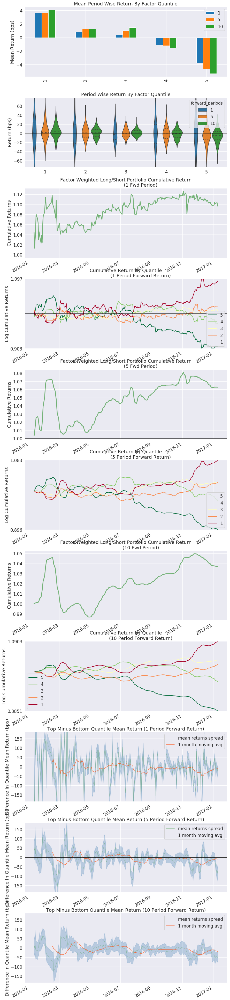

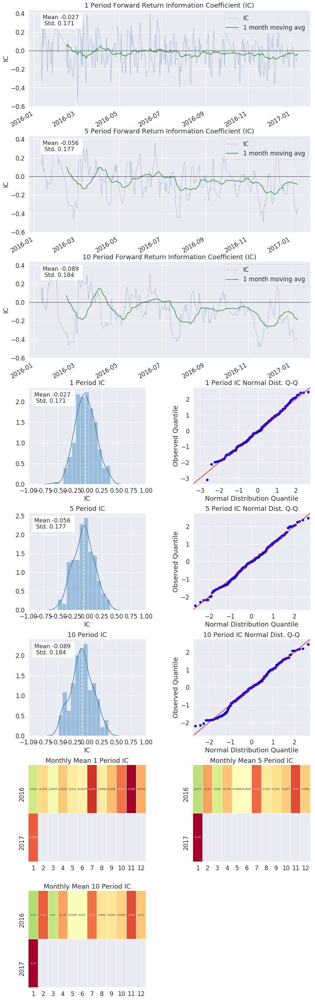

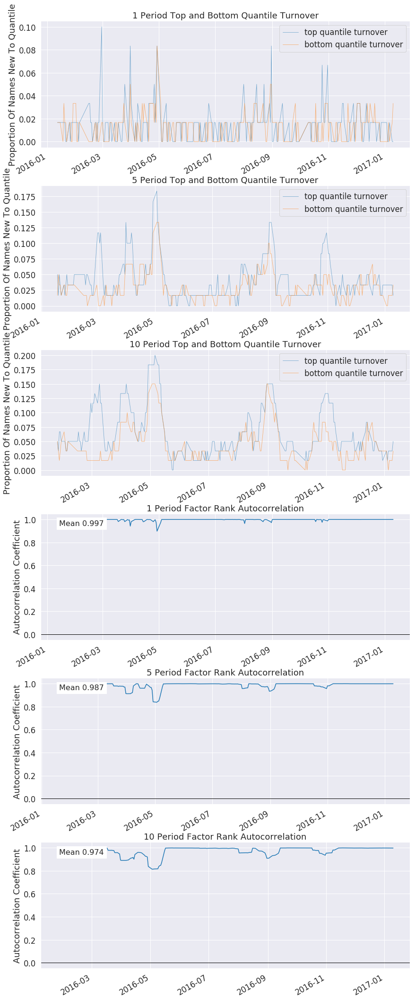

In [5]:
from alphalens.tears import create_full_tear_sheet

create_full_tear_sheet(merged_data)

In [7]:
from alphalens.performance import mean_information_coefficient
mean_information_coefficient(merged_data).plot(title="IC Decay")

AttributeError: 'Series' object has no attribute 'columns'

Information Analysis


,1,5,10
IC Mean,-0.022,-0.095,-0.199
IC Std.,0.128,0.182,0.174
Risk-Adjusted IC,-0.174,-0.522,-1.143
t-stat(IC),-0.799,-2.394,-5.238
p-value(IC),0.434,0.027,0.000
IC Skew,1.482,0.688,0.816
IC Kurtosis,2.910,0.325,-0.080


<Figure size 432x288 with 0 Axes>

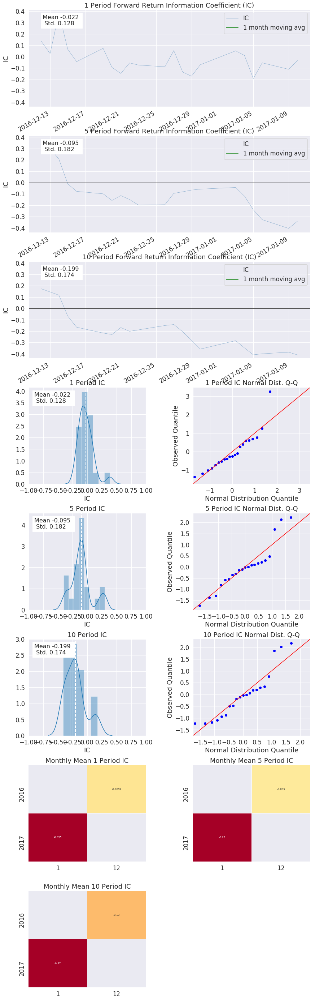

In [36]:
from alphalens.tears import create_information_tear_sheet
from alphalens.utils import get_clean_factor_and_forward_returns

create_information_tear_sheet(merged_data)

In [38]:
from alphalens.performance import mean_information_coefficient

IC_factor_data = get_clean_factor_and_forward_returns(
      factor=factor_data, 
      prices=price_data,
      periods=range(1,32,3)
)

mean_information_coefficient(IC_factor_data)
IC_factor_data

Dropped 0.0% entries from factor data (0.0% after in forward returns computation and 0.0% in binning phase). Set max_loss=0 to see potentially suppressed Exceptions.


AttributeError: 'Series' object has no attribute 'columns'